# **Assignment 1:** Introduction to Neural Networks

#### **Course:** SCC0270-SCC5809 Artificial Neural Networks
#### **Professor:** Moacir Antonelli Ponti
#### **Assistant:** Sherlon Almeida da Silva

#### Obs.: This assignment was adapted from the 3D Graphics Systems course ([here](https://lvelho.impa.br/i3d23/)), proposed by Luiz Velho and Hallison Paz.

---
# **Personal Info:**
*   **Student:**
    *   Matheus Victal Cerqueira
    *   10276661
    

# **Neural Networks for Function Approximation**

In this assignment you will practice working with the Google Colab environment and PyTorch. You’ll also practice building a model to fit a function. The goals of this practice are the following:

-   Gain experience setting and using notebooks on Google Colab.
-   Develop familiarity with basic structures of PyTorch: tensors, autograd, modules.
-   Understand neural networks as functions and models for functions approximation.
-   Develop familiarity with the data-driven approach.
-   Train a neural network to fit 1D functions.
-   Use visualization tools to evaluate your result.

# 1. What is an Artificial Neural Network?

## 1.1 Perceptron: the artificial neuron

* Perceptron, [implementação de Thomas Countz](https://www.thomascountz.com/2018/04/05/19-line-line-by-line-python-perceptron)

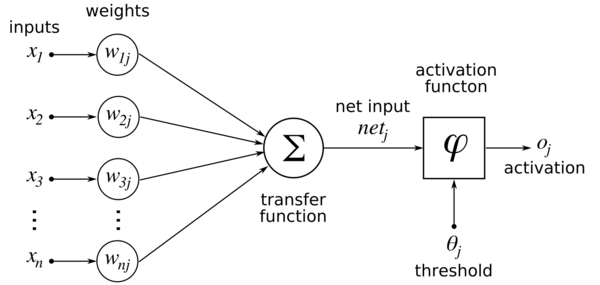

## **Task 1:** (2 pts) Can you implement a Perceptron without using a deep learning specific framework?

i.e. using regular numerical processing libraries such as numpy

## Development section

The following python routine implements a perceptron using only the numpy library. The single neuron perceptron is implemented in a python class with four methods: a constructor, a forward method, an activation function and a training method.

* Constructor: receives the input size (n) and the learning rate (lr) values. The weights ($W$) and bias ($b$) are initialized as random values normaly distributed with mean 0 and standard deviation 0.1:
$$w_i \sim N(0,0.1^2), i \in [0,1,...,n]$$
$$b \sim N(0,0.1^2)$$

* Foward method: receives the input $X$ and feeds it into the single neuron perceptron, which retrieves the output:
$$f(X) = X \cdot W+ b$$

* Activation function: The result from the calculation above is then feeded into the activation function, which assumes the value 0 when $f(X)>0$ and 1 otherwise. This function was chosen because this perceptron will be used further for learning AND and OR logic gates behavior, both of which outputs 1 or 0. It is important to note that this function is not differentiable, impossibilitating the application of the traditional backpropagation method.

* Training method: receives the true function labels, the training set (training_input) and an epochs size. In each epoch, the method adjusts the weights and bias for each input from the training set using a simple loss function. The loss function is based on the idea of the adjusted quadractic loss:
$$loss = \frac{1}{2}(\hat y -y)^2$$
The activation function is not differentiable, but for this simple example, the simple use of the loss function above considering only the gradient of the $f(X)$ function is enough for convergence. Hence, the parameters are updated for each input in each epoch considering the gradient of the function above when $\hat y = f(X)$.

In [1]:
import numpy as np

# your perceptron implementation here

# Implementation of a perceptron in a python class:
class Perceptron():
    # The class' constructor receives the input size (n, number of observations)
    # and the learning rate (lr) with default value = 0.01
    def __init__(self, n, lr=.01):
        self.lr = lr
        # parameters are initialized from a random variable ~ N(0, 0.1^2)
        self.weights = np.random.normal(loc=0, scale=.1, size=n)
        self.bias = np.random.normal(loc=0, scale=.1)

    # Activation function is a simple if else statement
    def activation(self, x):
        return 1 if x > 0 else 0

    # The forward step
    def forward(self, input):
        summation = np.dot(input, self.weights) + self.bias
        return self.activation(summation)

    # Train step with decfault epochs set to 200
    def train(self, training_input, labels, epochs=200):
        for _ in range(epochs):
            for x, y in zip(training_input, labels):
                # Perceptron output
                y_hat = self.forward(x)
                # Learning rule using the gradient of the loss function as
                # discussed previously
                self.weights += self.lr * (y - y_hat) * x
                self.bias    += self.lr * (y - y_hat)

### Validate your Perceptron implementation with Logic Gates **AND** and **OR**.


### AND Logic gate
Validate an AND logic gate to verify its separability using your perceptron implementation.

In [2]:
#Input Data
X = np.array([[0,0], [0,1], [1,0], [1,1]])
y = np.array([0,0,0,1])

#Train
nD_inputs = len(X[0]) #The dimensionality
and_ = Perceptron(nD_inputs)
and_.train(X, y)
print("Weights (W):", and_.weights)
print("Bias (b):", and_.bias)

Weights (W): [0.02587796 0.09868414]
Bias (b): -0.11749717334432198


In [3]:
for entry in X:
    print(entry, and_.forward(entry))

[0 0] 0
[0 1] 0
[1 0] 0
[1 1] 1


The perceptron is successfully operating as an AND logic gate, as only the [1,1] input is resulting in a 1 output. Bellow, the perceptron will be tested with fuzzy inputs.

In [4]:
import torch

#Generating sample points between [0, 1] to Test and Plot
n_samples = 50
dimensionality = 2
test = torch.rand([n_samples, dimensionality])

# Test
for curr_test in test:
  print("Test:", curr_test, "---> Predicted:", and_.forward(curr_test))

Test: tensor([0.1875, 0.2346]) ---> Predicted: 0
Test: tensor([0.8697, 0.2342]) ---> Predicted: 0
Test: tensor([0.6644, 0.9122]) ---> Predicted: 0
Test: tensor([0.4889, 0.6273]) ---> Predicted: 0
Test: tensor([0.7773, 0.6797]) ---> Predicted: 0
Test: tensor([0.1553, 0.4826]) ---> Predicted: 0
Test: tensor([0.8688, 0.5456]) ---> Predicted: 0
Test: tensor([0.9701, 0.2940]) ---> Predicted: 0
Test: tensor([0.3873, 0.4230]) ---> Predicted: 0
Test: tensor([0.0454, 0.3135]) ---> Predicted: 0
Test: tensor([0.0073, 0.5826]) ---> Predicted: 0
Test: tensor([0.3070, 0.8834]) ---> Predicted: 0
Test: tensor([0.6997, 0.8772]) ---> Predicted: 0
Test: tensor([0.4715, 0.6253]) ---> Predicted: 0
Test: tensor([0.9990, 0.2886]) ---> Predicted: 0
Test: tensor([0.6085, 0.1659]) ---> Predicted: 0
Test: tensor([0.2110, 0.0940]) ---> Predicted: 0
Test: tensor([0.8491, 0.2530]) ---> Predicted: 0
Test: tensor([0.7333, 0.9846]) ---> Predicted: 0
Test: tensor([0.4544, 0.0573]) ---> Predicted: 0
Test: tensor([0.8565

#### Visualize the learned function, as well as the points

### **Task 2:** (1 pt) Modify the following code to color the 1s and 0s as predicted by the network.


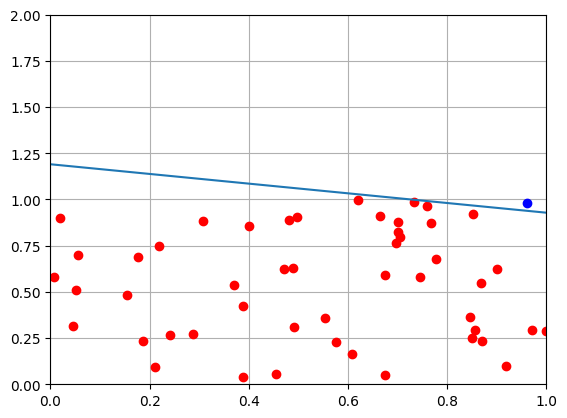

In [5]:
import matplotlib.pyplot as plt
avoid_zero_division = 0.000001
b = and_.bias       + avoid_zero_division
a = and_.weights[0] + avoid_zero_division
x = and_.weights[1] + avoid_zero_division

slope = -(b/x)/(b/a) #Coeficiente angular
intercept = -b/x     #Coeficiente linear

#Plot train data
for curr_data in test:
    x = curr_data[0]
    y = curr_data[1]

    if and_.forward(curr_data) == 1:
        plt.plot(x, y, 'blue', marker="o")
    else:
        plt.plot(x, y, 'red', marker="o")

#Plot test data
# write your code here

#Plot line learned during training
#y = mx + c, m is slope and c is intercept
x1 = 0
y1 = (slope*x1) + intercept

x2 = 1
y2 = (slope*x2) + intercept

plt.plot([x1,x2], [y1,y2])
plt.xlim(0,1)
plt.ylim(0,2)
plt.grid()
plt.show()

### OR Logic gate
Validate an OR logic gate to verify its separability using your perceptron implementation.

In [6]:
#Input Data
X = np.array([[0,0], [0,1], [1,0], [1,1]])
y = np.array([0,1,1,1])

#Train
nD_inputs = len(X[0]) #The dimensionality
or_ = Perceptron(nD_inputs)
or_.train(X, y, epochs=100)
print("Weights (W):", or_.weights)
print("Bias (b):", or_.bias)

Weights (W): [0.01703676 0.0286382 ]
Bias (b): -0.009627576323609008


In [7]:
for entry in X:
    print(entry, or_.forward(entry))

[0 0] 0
[0 1] 1
[1 0] 1
[1 1] 1


Now, the perceptron is successfully operating as an OR logic gate, as only the [0,0] input is resulting in a 0 output. Bellow, the perceptron will be tested again with a new set of fuzzy inputs.

In [8]:
#Generating sample points between [0, 1] to Test and Plot
n_samples = 50
dimensionality = 2
test = torch.rand([n_samples, dimensionality])

#Test
for curr_test in test:
  print("Test:", curr_test, "---> Predicted:", or_.forward(curr_test))

Test: tensor([0.0695, 0.5839]) ---> Predicted: 1
Test: tensor([0.8500, 0.0890]) ---> Predicted: 1
Test: tensor([0.0794, 0.4517]) ---> Predicted: 1
Test: tensor([0.1160, 0.2856]) ---> Predicted: 1
Test: tensor([0.7684, 0.0381]) ---> Predicted: 1
Test: tensor([0.8063, 0.5484]) ---> Predicted: 1
Test: tensor([0.8566, 0.7790]) ---> Predicted: 1
Test: tensor([0.0526, 0.1487]) ---> Predicted: 0
Test: tensor([0.8122, 0.6798]) ---> Predicted: 1
Test: tensor([0.2578, 0.7470]) ---> Predicted: 1
Test: tensor([0.8129, 0.8384]) ---> Predicted: 1
Test: tensor([0.3585, 0.9545]) ---> Predicted: 1
Test: tensor([0.5032, 0.6947]) ---> Predicted: 1
Test: tensor([0.1610, 0.1460]) ---> Predicted: 0
Test: tensor([0.9883, 0.0955]) ---> Predicted: 1
Test: tensor([0.4665, 0.7516]) ---> Predicted: 1
Test: tensor([0.2434, 0.3642]) ---> Predicted: 1
Test: tensor([0.9401, 0.8978]) ---> Predicted: 1
Test: tensor([0.2973, 0.8388]) ---> Predicted: 1
Test: tensor([0.6640, 0.6990]) ---> Predicted: 1
Test: tensor([0.5409

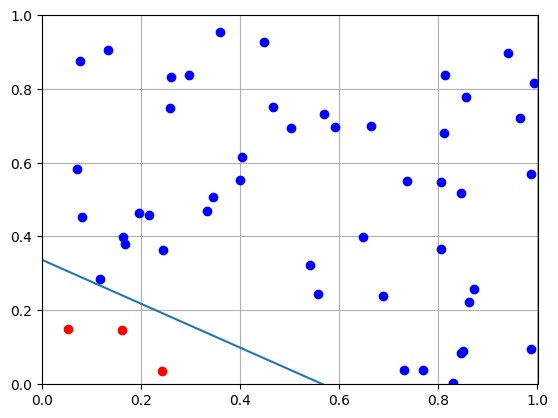

In [9]:
avoid_zero_division = 0.000001
b = or_.bias       + avoid_zero_division
a = or_.weights[0] + avoid_zero_division
x = or_.weights[1] + avoid_zero_division

slope = -(b/x)/(b/a) #Coeficiente angular
intercept = -b/x     #Coeficiente linear

#Plot train data
for curr_data in test:
    x = curr_data[0]
    y = curr_data[1]

    # print(x, y)

    if or_.forward(curr_data) == 1:
        plt.plot(x, y, 'blue', marker="o")
    else:
        plt.plot(x, y, 'red', marker="o")

#Plot test data
# write your code here

#Plot line learned during training
#y = mx + c, m is slope and c is intercept
x1 = 0
y1 = (slope*x1) + intercept

x2 = 1
y2 = (slope*x2) + intercept

plt.plot([x1,x2], [y1,y2])
plt.xlim(-0.001,1.001)
plt.ylim(-0.001,1.001)
plt.grid()
plt.show()

### **Task 3**: (1 pts) **Describe what you observed during the experiments:**

* Firstly, it is worth noting that a single perceptron with one neuron and a simple learning rule can be trained to copy the pattern of both an AND and an OR logic gates for input tuples $[i,j]$ where $i,j\in\{0,1\}$.

* For both cases, the perceptron was trained using only four observations, which are the possible combinations for the tuple $[i,j]$ in a non fuzzy scenario, in other words, $i,j\in\{0,1\}$.

* On the other hand, the trained perceptrons are tested in fuzzy input tuples, where $i$ and $j$ assume real values from 0 to 1 ($[i,j]$ where $i,j\in[0,1]$).

* Both trained perceptrons behave like a linear classifier. The AND perceptron and OR perceptron classify all points above the blue line, which separates the hyperplane in two, as 1 and all points bellow it, as 0. It is worth noting that both lines have negative linear coefficient and positive intercept, but the OR perceptron classifier line ir closer to the origin (0,0), this is the expected behavior, since in non fuzzy scenarios the OR gate only classifies the [0,0] entry as 0 and the AND gate only the [1,1] entry as 1, making the lines tend to gravitate toward these points.

* The test inputs have fuzzy behavior, which was not used to train the network, since the training observations were only the canonical ones ([0,0], [0,1], [1,0], [1,1]), hence, the resulting perceptron may not opperate as intended for fuzzy inputs. To overcome that, we could train the perceptrons with fuzzy inputs and the desired outputs.

* It is also worth noting that the classifier line for the trained perceptron is extremely sensitive to the parameters starting values. This is a result of the small sized training set. This sensitivity can be seen in the test bellow.


In [10]:
def classifier_plot_function(perceptron, test):
    avoid_zero_division = 0.000001
    b = perceptron.bias       + avoid_zero_division
    a = perceptron.weights[0] + avoid_zero_division
    x = perceptron.weights[1] + avoid_zero_division

    slope = -(b/x)/(b/a) #Coeficiente angular
    intercept = -b/x     #Coeficiente linear

    #Plot train data
    for curr_data in test:
        x = curr_data[0]
        y = curr_data[1]

        if or_.forward(curr_data) == 1:
            plt.plot(x, y, 'blue', marker="o")
        else:
            plt.plot(x, y, 'red', marker="o")

    x1 = -1
    y1 = (slope*x1) + intercept

    x2 = 1
    y2 = (slope*x2) + intercept

    plt.plot([x1,x2], [y1,y2])
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.grid()
    plt.show()

The same test will be used in three perceptrons different initializations. Since the parameters are chosen randomly from a normal distribution, everytime a perceptron object is declared, the aprameters start in different values. But as it is seen bellow, the line is extremelly sensitive to this values and classifies differently the same test set depending in the parameter initialization

In [11]:
#Generating sample points between [0, 1] to Test and Plot
n_samples = 100
dimensionality = 2
test = torch.rand([n_samples, dimensionality])

In [12]:
#Input Data
X = np.array([[0,0], [0,1], [1,0], [1,1]])
y = np.array([0,1,1,1])

#Train
nD_inputs = len(X[0]) #The dimensionality
or_ = Perceptron(nD_inputs)
or_.train(X, y, epochs=100)
print("Weights (W):", or_.weights)
print("Bias (b):", or_.bias)

Weights (W): [0.00785847 0.21234679]
Bias (b): -0.006537651909051466


In [13]:
for entry in X:
    print(entry, or_.forward(entry))

[0 0] 0
[0 1] 1
[1 0] 1
[1 1] 1


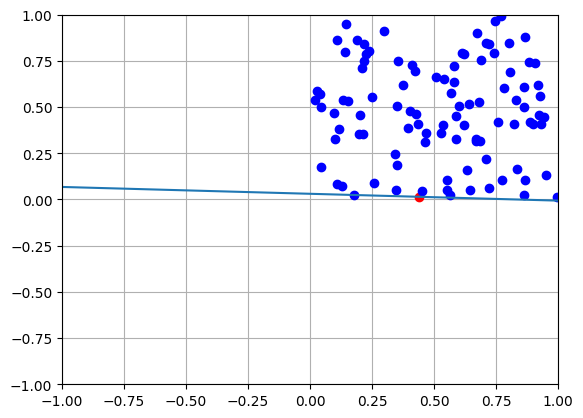

In [14]:
classifier_plot_function(or_, test)

In [15]:
#Input Data
X = np.array([[0,0], [0,1], [1,0], [1,1]])
y = np.array([0,1,1,1])

#Train
nD_inputs = len(X[0]) #The dimensionality
or_ = Perceptron(nD_inputs)
or_.train(X, y, epochs=100)
print("Weights (W):", or_.weights)
print("Bias (b):", or_.bias)

Weights (W): [0.015238   0.01062564]
Bias (b): -0.007935016229385342


In [16]:
for entry in X:
    print(entry, or_.forward(entry))

[0 0] 0
[0 1] 1
[1 0] 1
[1 1] 1


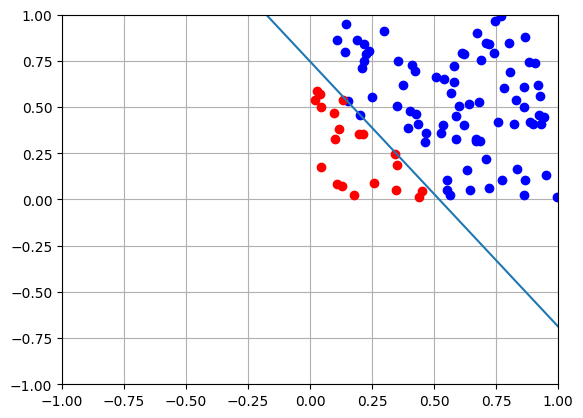

In [17]:
classifier_plot_function(or_, test)

In [18]:
#Input Data
X = np.array([[0,0], [0,1], [1,0], [1,1]])
y = np.array([0,1,1,1])

#Train
nD_inputs = len(X[0]) #The dimensionality
or_ = Perceptron(nD_inputs)
or_.train(X, y, epochs=100)
print("Weights (W):", or_.weights)
print("Bias (b):", or_.bias)

Weights (W): [0.1015585  0.14085797]
Bias (b): -0.01291848823577608


In [19]:
for entry in X:
    print(entry, or_.forward(entry))

[0 0] 0
[0 1] 1
[1 0] 1
[1 1] 1


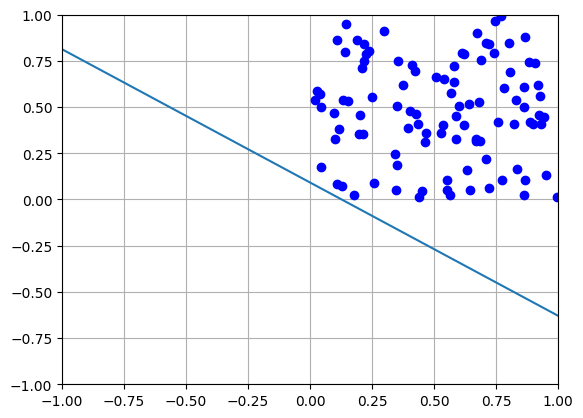

In [20]:
classifier_plot_function(or_, test)

The three perceptrons behave like an OR logic gate when the input is [0,0], [0,1], [1,0] or [1,1] and therefore the perceptron sucessfuly learned how to operate like this logic gate for non fuzzy inputs. But the linear classifier has a different separation rule in each case and the only thing that differs from one perceptron to the other are the parameters initial value.

## 1.2 Multilayer Perceptron

Multilayer Perceptron is a fully connected class of neural networks which presents multiple perceptrons connected in a computational graph that "flows" from inputs to outputs.

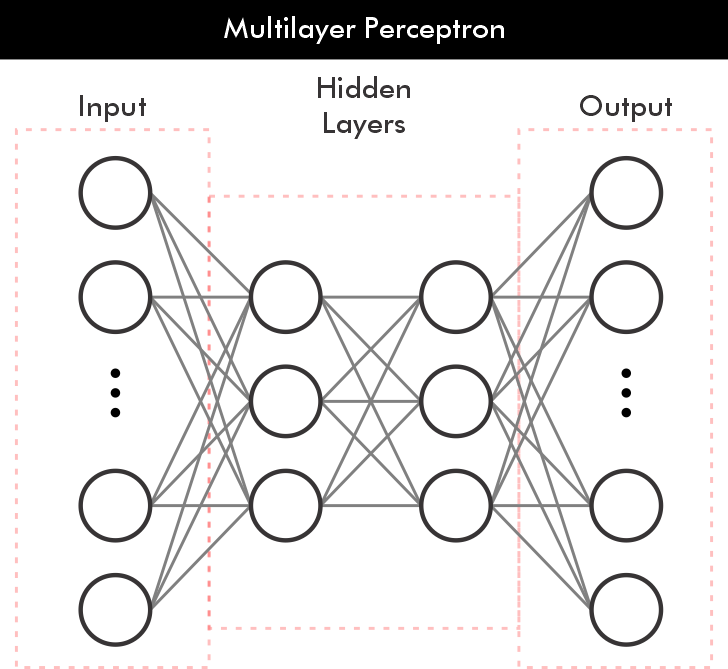

# 2. How can we build a MLP network in PyTorch?

Answer: in pytorch there are several ways to bluid a MLP network. But one of the simplest ways is to stack layers using the nn module. The network bellow (LineNetwork) is a simple perceptron network with one neuron and the MLPNetwork class presented afeter is the logical extension implementation that leads to a MLP.

In [21]:
import torch
import numpy as np
from torch import nn

In [22]:
# Use the perceptron implementation for the task

class LineNetwork(nn.Module):
  # Initialization
  def __init__(self):
    super().__init__()
    # a single perceptron
    self.layers = nn.Sequential(
        nn.Linear(1, 1)
    )

  # how the network operates
  def forward(self, x):
    return self.layers(x)

In [23]:
class MLPNetwork(nn.Module):
  # Initialization
  def __init__(self):
    super(LineNetwork, self).__init__()
    # 3 percepton layers, bluiding a multilayer perceptron
    # The first layer has one neuron, the second 10 neurons,
    # and the thid, 4 neurons.
    self.layers = nn.Sequential(
        nn.Linear(1, 10),
        nn.Linear(10, 4),
        nn.Linear(4, 1)
    )

  def forward(self, x):
    return self.layers(x)

# 3. How can we train a neural network?

Let's train our network to regress a simple affine function. A single Perceptron should be able to approximate a line, right?

## 3.1 Preparing the data infrastructure

In [24]:
import numpy as np
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch.distributions.uniform as urand

In [25]:
# This is a Dataset class to work with PyTorch
class AlgebraicDataset(Dataset):
  '''Abstraction for a dataset of a 1D function'''

  def __init__(self, f, interval, nsamples):
    X = urand.Uniform(interval[0], interval[1]).sample([nsamples])
    self.data = [(x, f(x)) for x in X]

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    return self.data[idx]

In [26]:
# we need a function
line = lambda x: 2*x + 3
# a domain for our function
interval = (-10, 10)
# the number of points we are going to sample for training
train_nsamples = 1000
# the number of points we are going to evaluate our model on
test_nsamples = 100

The dataloader created bellow has a single bacth with the total sample size. It will be used to train the LineNetwork.

In [27]:
train_dataset = AlgebraicDataset(line, interval, train_nsamples)
test_dataset  = AlgebraicDataset(line, interval, test_nsamples)

train_dataloader = DataLoader(train_dataset, batch_size=train_nsamples, shuffle=True)
test_dataloader  = DataLoader(test_dataset, batch_size=test_nsamples, shuffle=True)

# 3.2 Hyperparameters for Optimization

In [28]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"running on {device}")

running on cuda


In [29]:
model = LineNetwork().to(device) #Aloca memória na GPU e copia os dados para lá.

In [30]:
# Loss Function: Mean Squared Error
lossfunc = nn.MSELoss()

# SGD = Stochastic Gradient Descent
optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

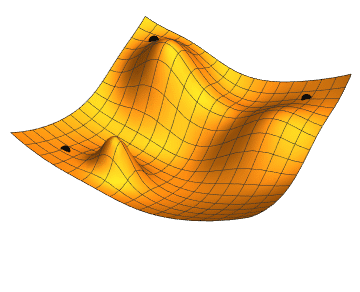

## **Task 4**: (5 pts) implement the functions that allow training and testing the model

## Development section

The next two functions where developed to perform a single training epoch. hence, the train and test functions have only one ```for``` loop related to the number of batches on the dataloader.

The train function receives a model, a train dataloader, a loss function and an optimizing rule. For each batch, the function obtains the prediction and the loss function value from the model, performs the backpropagation and makes the optimizer step. The loss obtained in each batch training is then averaged by the quantity of batches (n_samples/batch_size), returning a mean loss function for the training epoch.

The test funtion receives as parameters a model, a test dataloader and a loss function. For each batch, the function obtains the loss considering the loss function. Then it returns the average loss from the test considering all batches.

In [31]:
# Train step function
def train(model, dataloader, lossfunc, optimizer):
    '''A function for training our model'''

    # List to store the loss in each iteration (each batch)
    total_loss_list = []

    # runs an epoch
    for X_batch, y_batch in dataloader:
        # Set the model to training mode
        model.train()
        # Reshapes the inputs and labels
        X_batch = X_batch.reshape(-1,1).to(device)
        y_batch = y_batch.reshape(-1,1).to(device)

        # obtains the model prediction to X_batch
        y_pred = model(X_batch).to(device)
        # Obtain the loss function comparing the y prediction
        # to the real labels
        loss = lossfunc(y_pred, y_batch)
        # append the loss to the loss list
        total_loss_list.append(loss)

        # Backpropagation and optmization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Mean loss
    mean_loss = sum(total_loss_list)/len(total_loss_list)

    return mean_loss


def test(model, dataloader, lossfunc):
    '''A function for evaluating our model on test data'''

    # List to store the loss in each iteration (each batch)
    total_loss_list = []

    for X_batch, y_batch in dataloader:
        # Set the model to evaluation mode
        model.eval()
        # Disables gradient calculation
        torch.no_grad()
        # Reshape data
        X_batch = X_batch.reshape(-1,1).to(device)
        y_batch = y_batch.reshape(-1,1).to(device)

        # Foward step and loss calculus
        y_pred = model.forward(X_batch).to(device)
        loss = lossfunc(y_pred, y_batch)
        total_loss_list.append(loss)


    # Mean loss
    mean_loss = sum(total_loss_list)/len(total_loss_list)

    return mean_loss

# 3.3 Training the network



In [32]:
# for visualization
import imageio
import matplotlib.pyplot as plt
from skimage import img_as_ubyte

In [33]:
# Function to visualize results (to be used later in the notebook)
def plot_comparison(f, model, interval=(-10, 10), nsamples=10, return_array=True, epoc="None", loss="None"):
  fig, ax = plt.subplots(figsize=(10, 10))

  ax.grid(True, which='both')
  ax.spines['left'].set_position('zero')
  ax.spines['right'].set_color('none')
  ax.spines['bottom'].set_position('zero')
  ax.spines['top'].set_color('none')

  samples = np.linspace(interval[0], interval[1], nsamples)
  model.eval()
  with torch.no_grad():
    pred = model(torch.tensor(samples).unsqueeze(1).float().to(device))

  ax.plot(samples, list(map(f, samples)), "o", label="ground truth")
  ax.plot(samples, pred.cpu(), label="model")
  #print(samples, pred.cpu())
  plt.title(f"Epocs: {epoc}, Loss: {loss:.4f}")
  plt.legend()
  plt.show()
  # to return image as numpy array
  if return_array:
    fig.canvas.draw()
    img_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
    return img_from_plot.reshape(fig.canvas.get_width_height()[::-1] + (3,))

Epoch: 0; Train Loss: 96.44342803955078


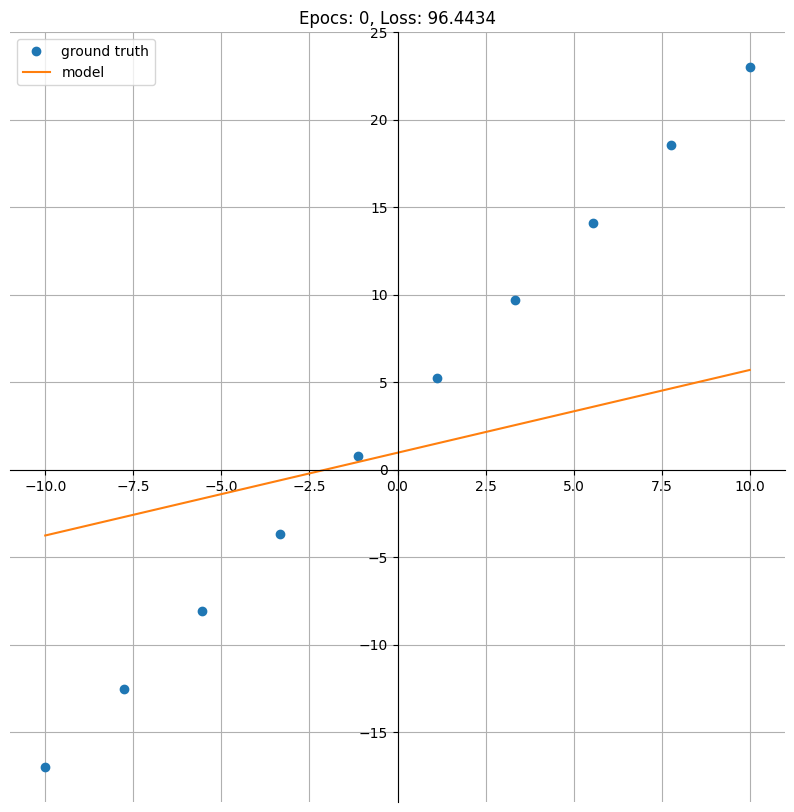

Epoch: 25; Train Loss: 6.501400470733643


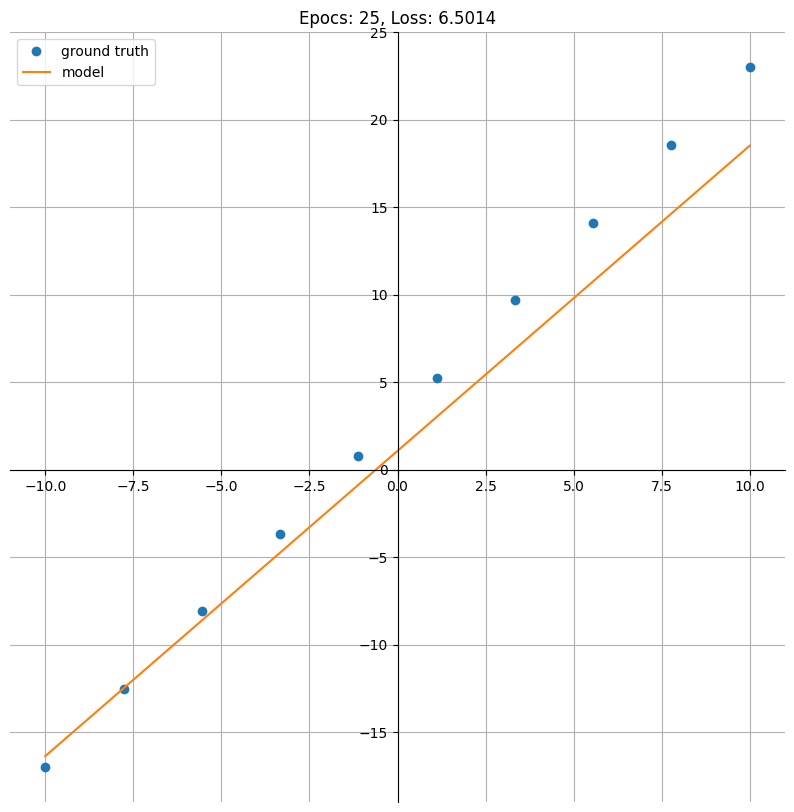

Epoch: 50; Train Loss: 3.479604721069336


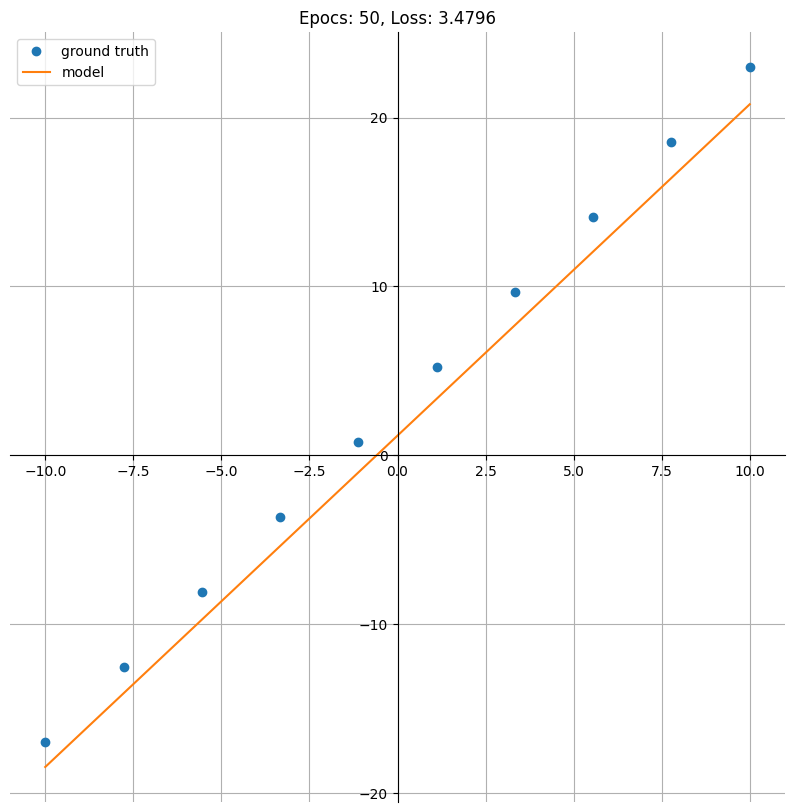

Epoch: 75; Train Loss: 3.076915740966797


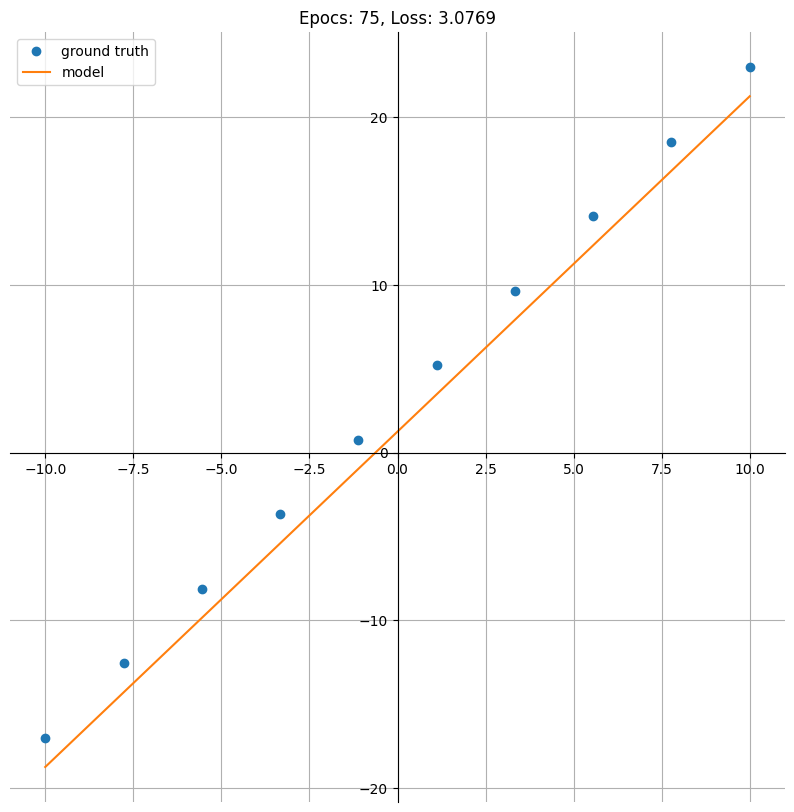

Epoch: 100; Train Loss: 2.781926393508911


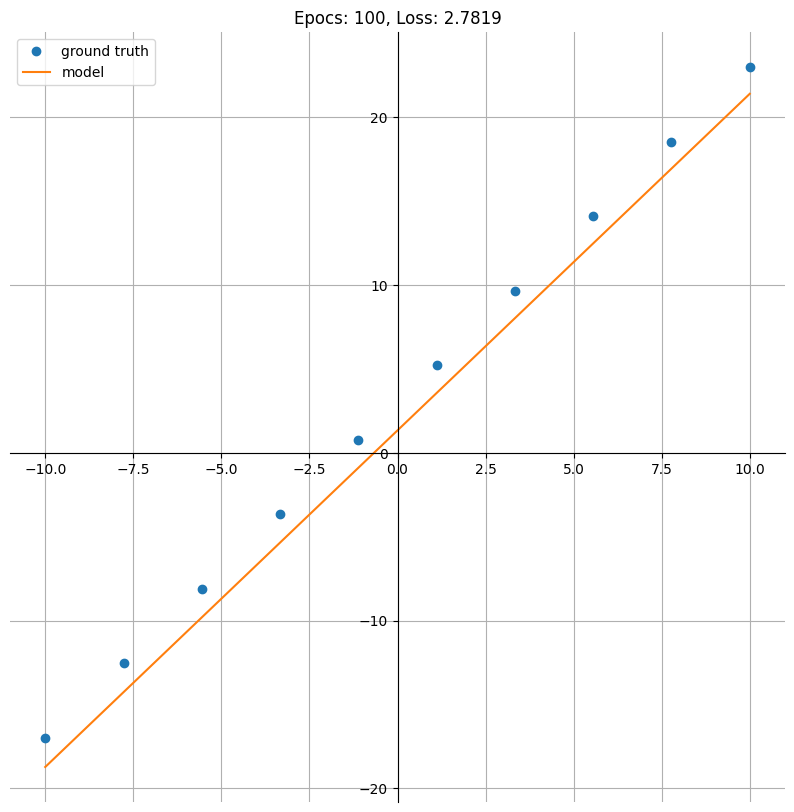

Epoch: 125; Train Loss: 2.5170769691467285


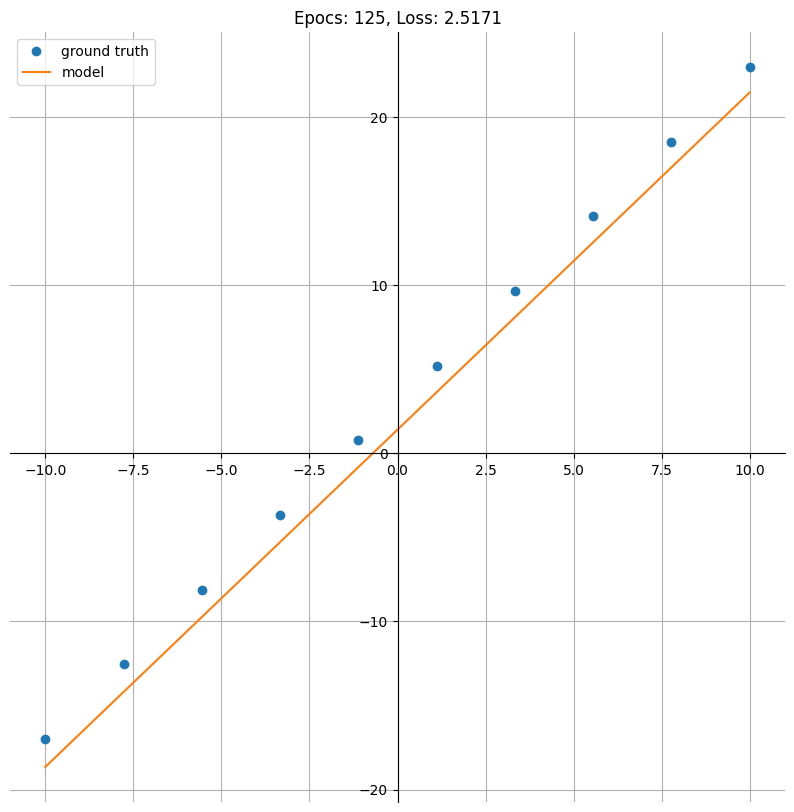

Epoch: 150; Train Loss: 2.277498245239258


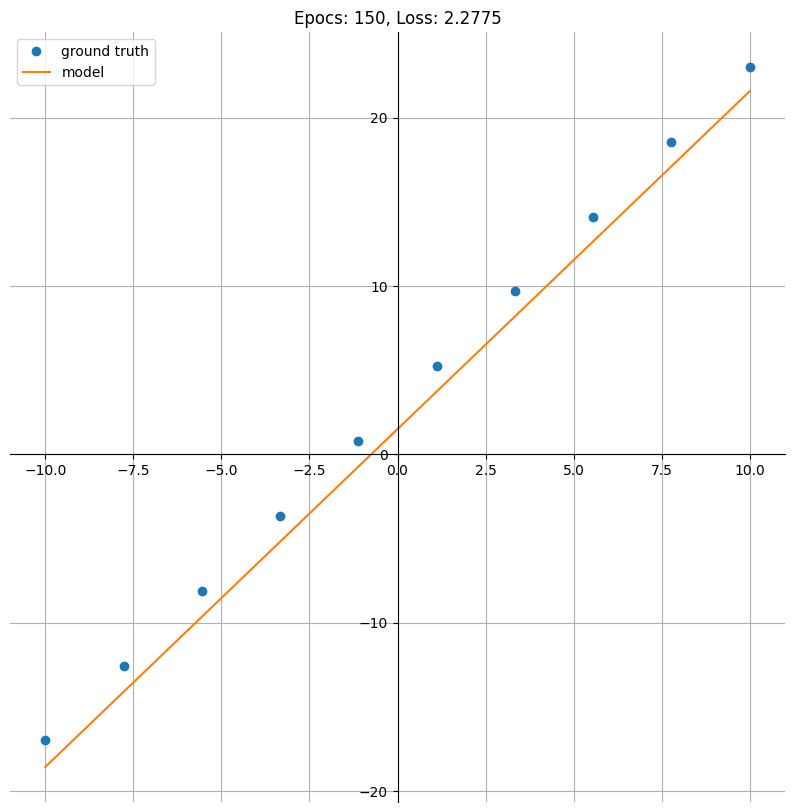

Epoch: 175; Train Loss: 2.060723304748535


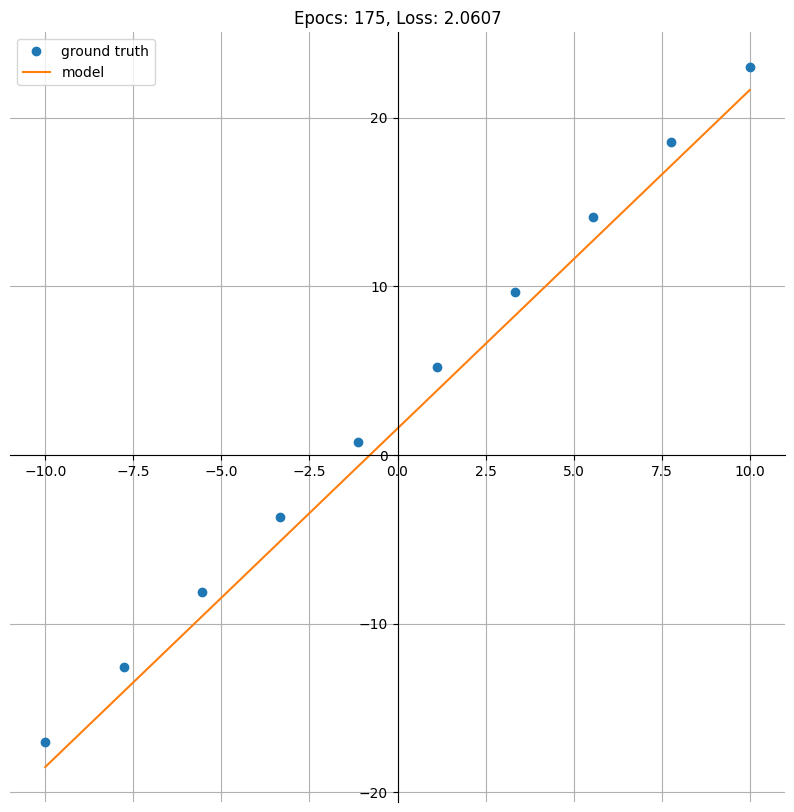

Epoch: 200; Train Loss: 1.8645820617675781


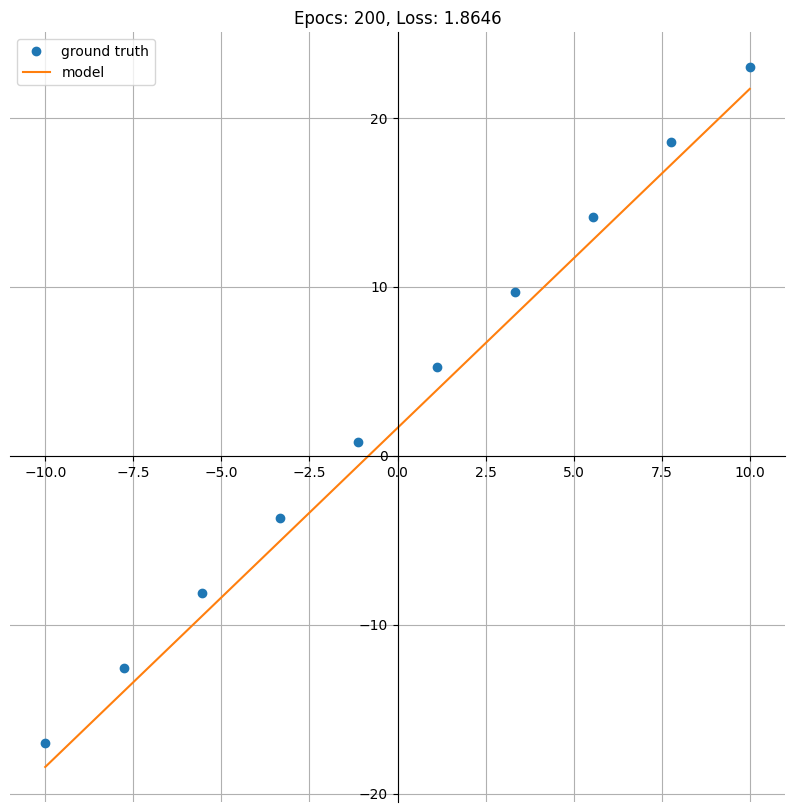

Epoch: 225; Train Loss: 1.687110185623169


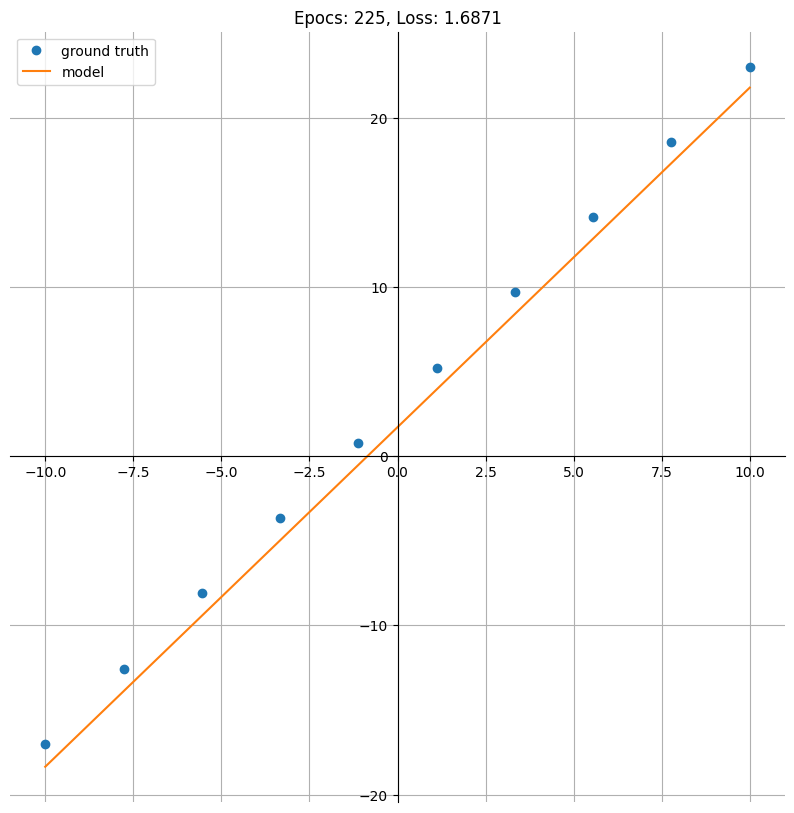

Epoch: 250; Train Loss: 1.5265299081802368


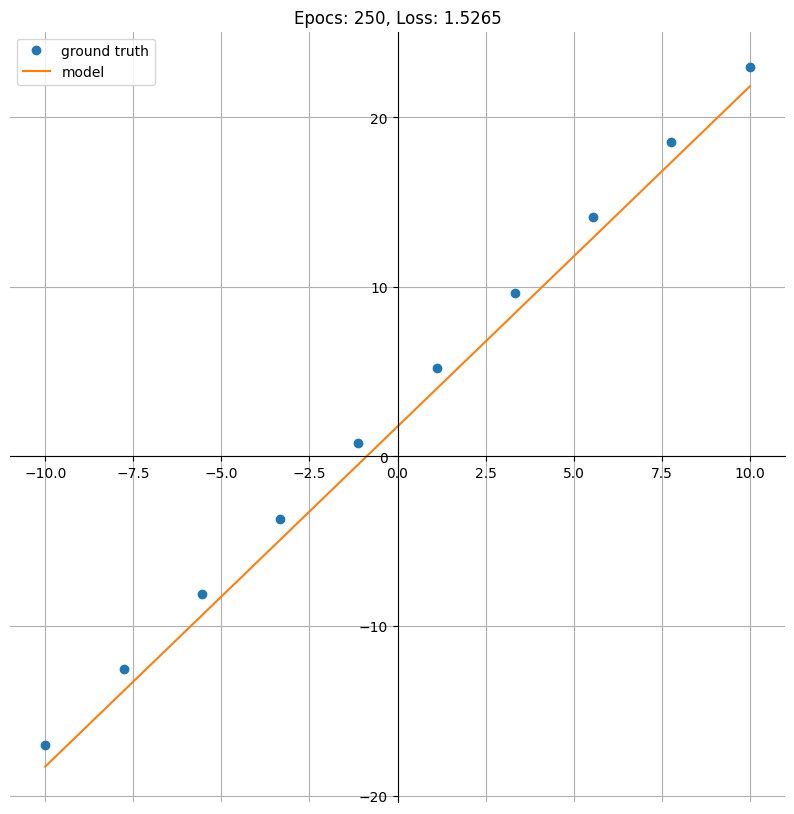

Epoch: 275; Train Loss: 1.3812341690063477


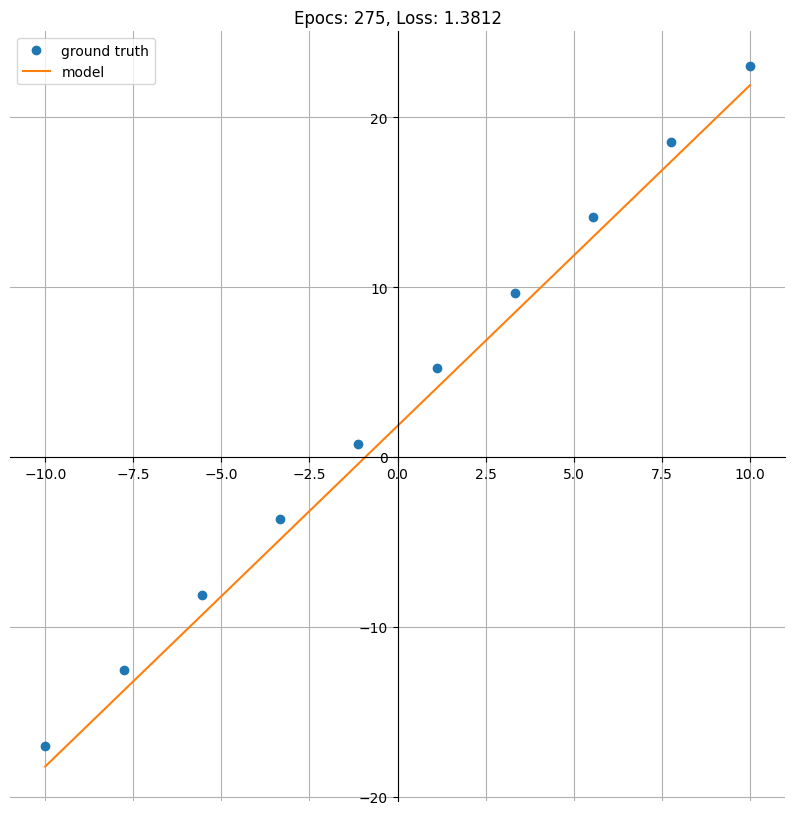

Epoch: 300; Train Loss: 1.2497674226760864


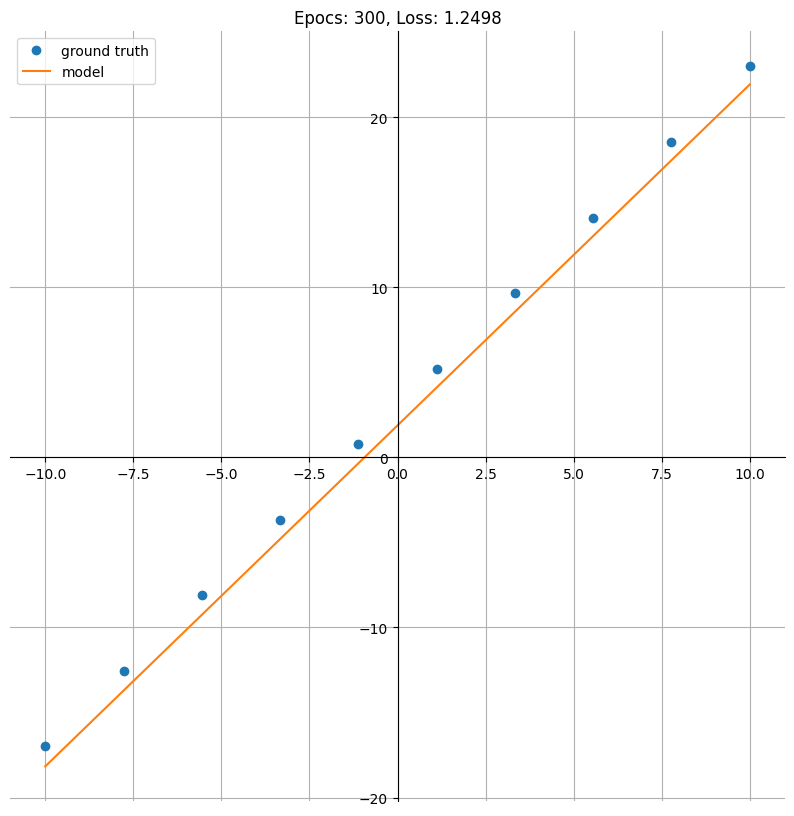

Epoch: 325; Train Loss: 1.1308135986328125


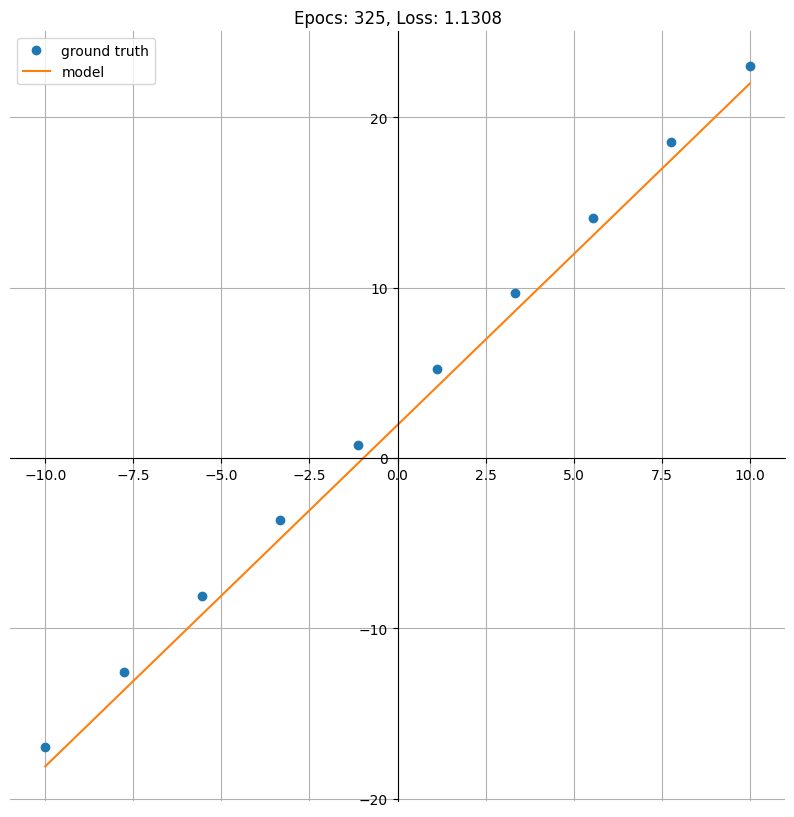

Epoch: 350; Train Loss: 1.0231817960739136


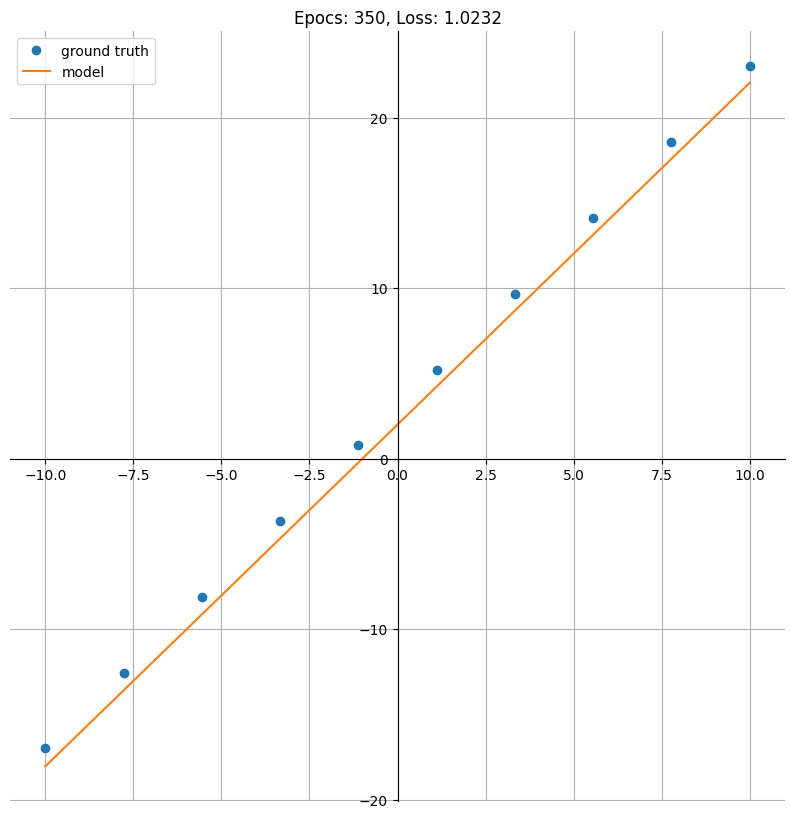

Epoch: 375; Train Loss: 0.9257944226264954


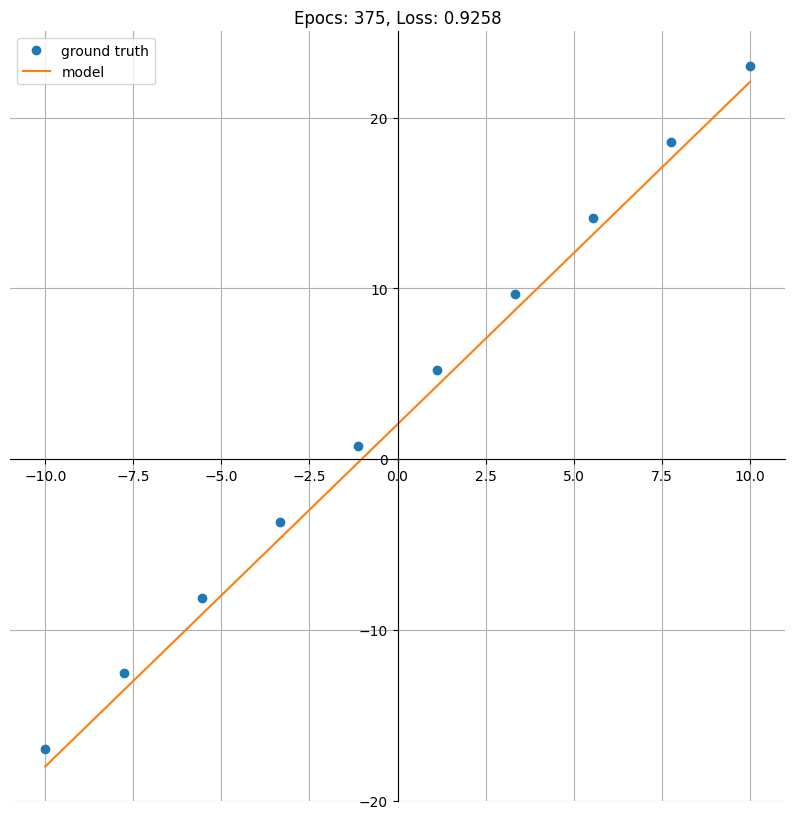

Epoch: 400; Train Loss: 0.8376758694648743


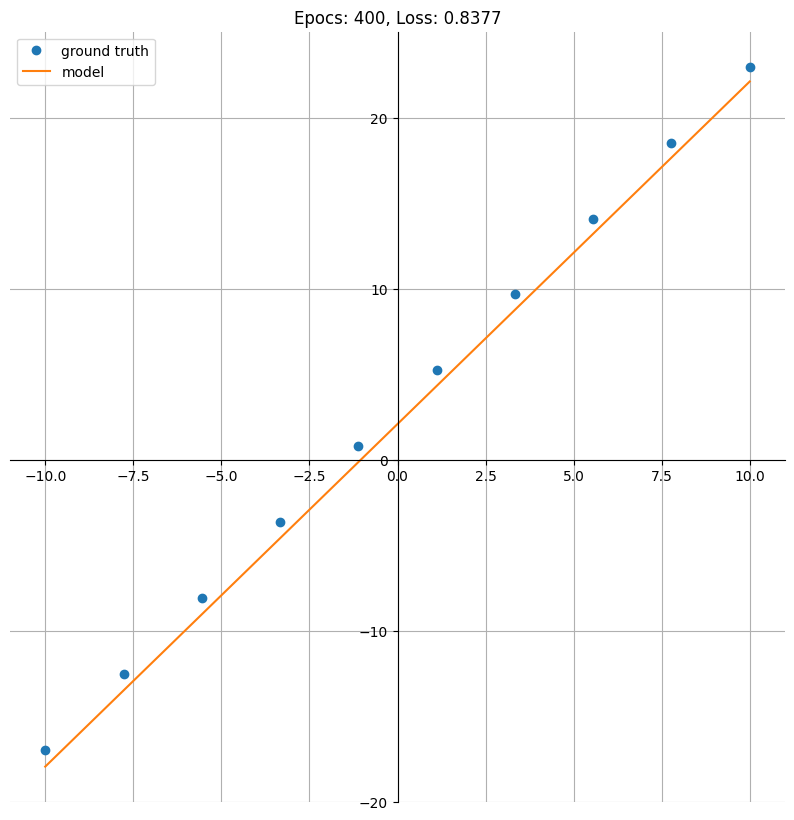

Epoch: 425; Train Loss: 0.7579451203346252


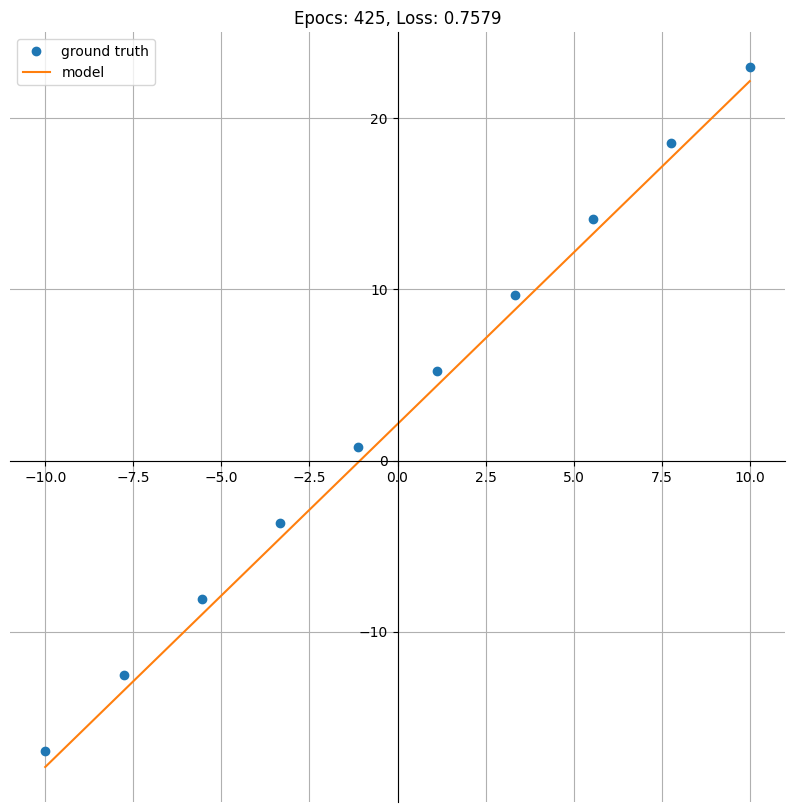

Epoch: 450; Train Loss: 0.6858028769493103


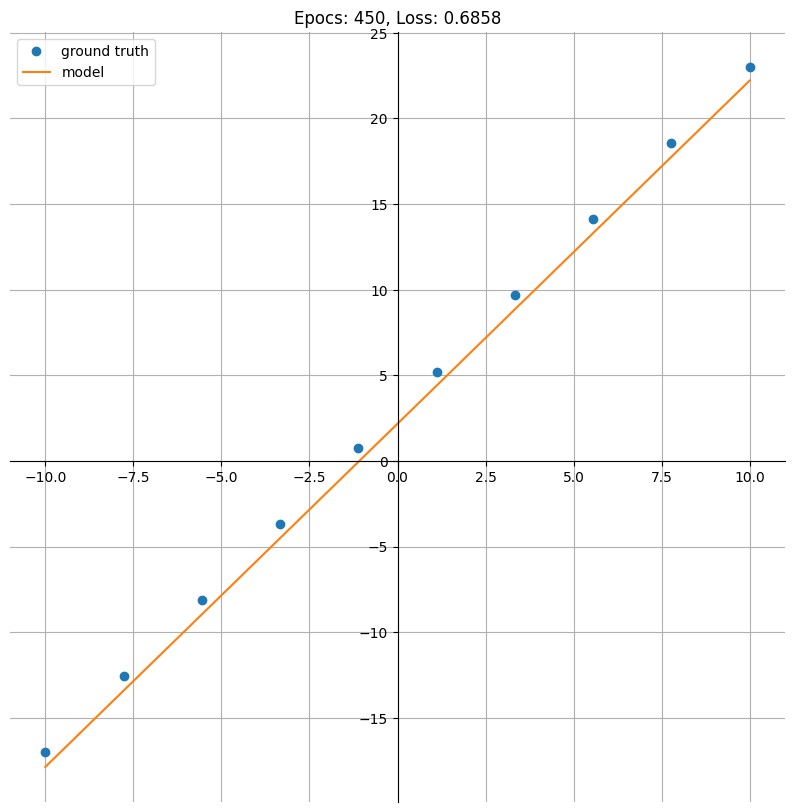

Epoch: 475; Train Loss: 0.6205282211303711


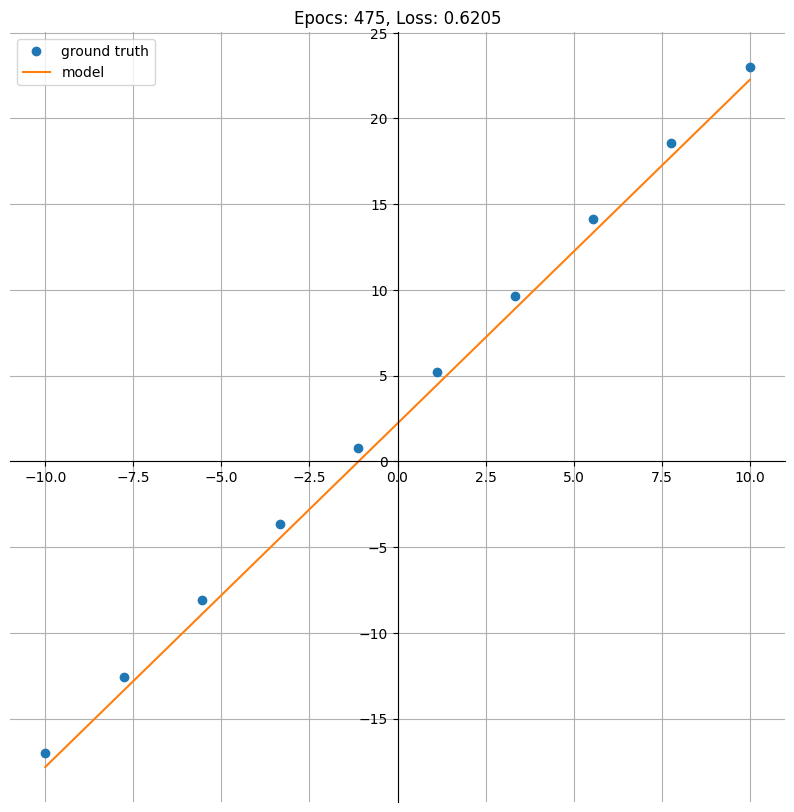

Epoch: 500; Train Loss: 0.5614659786224365


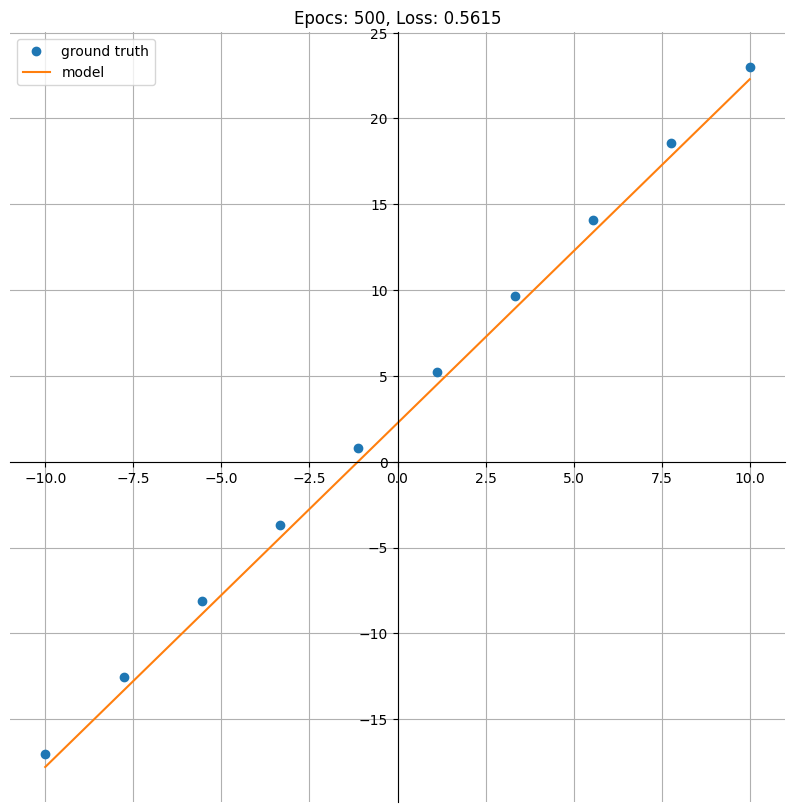

Epoch: 525; Train Loss: 0.508024275302887


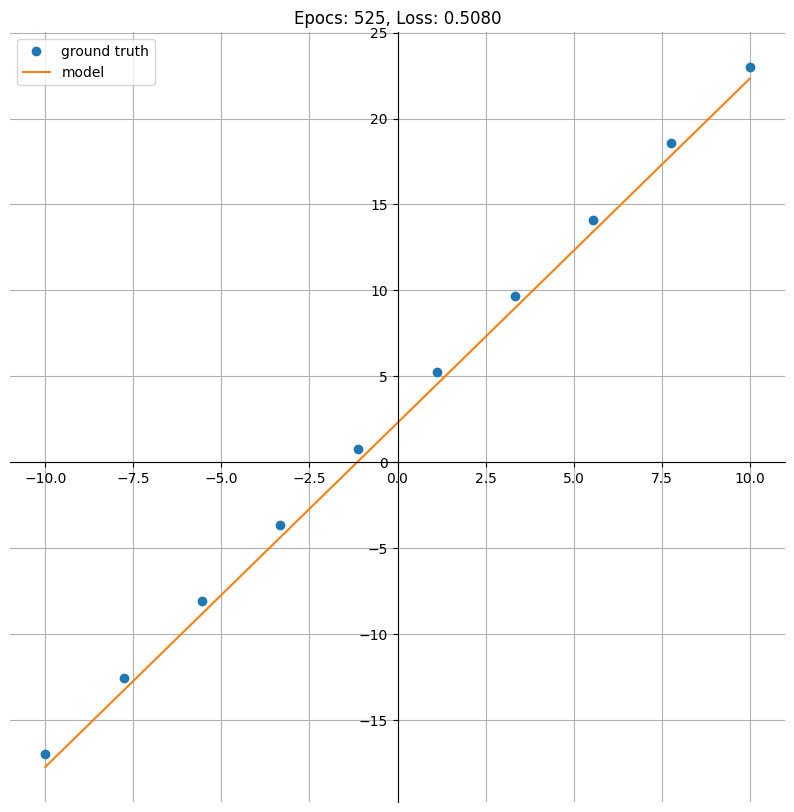

Epoch: 550; Train Loss: 0.4596697688102722


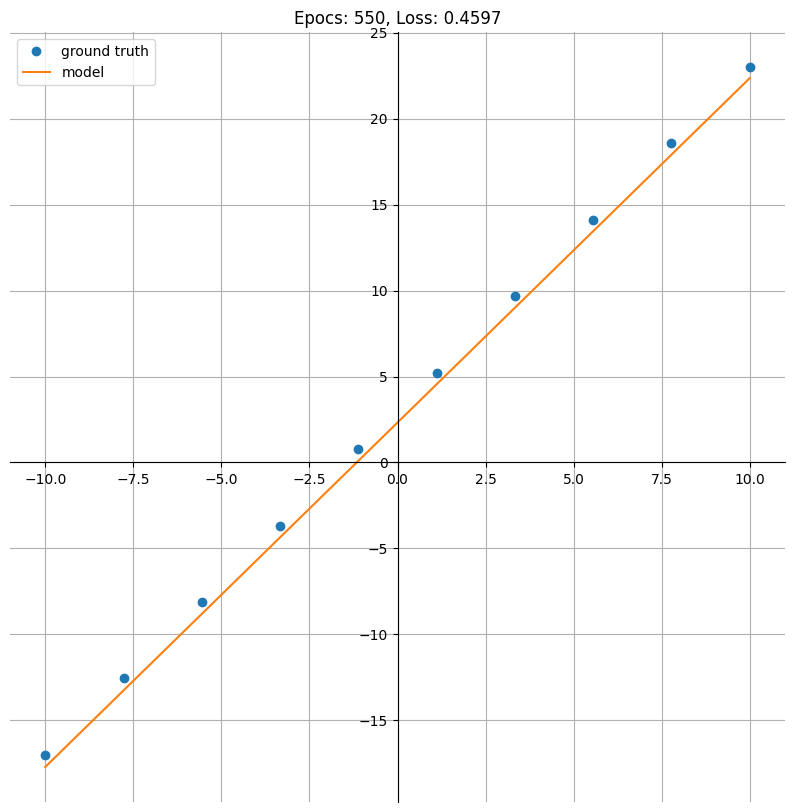

Epoch: 575; Train Loss: 0.4159184992313385


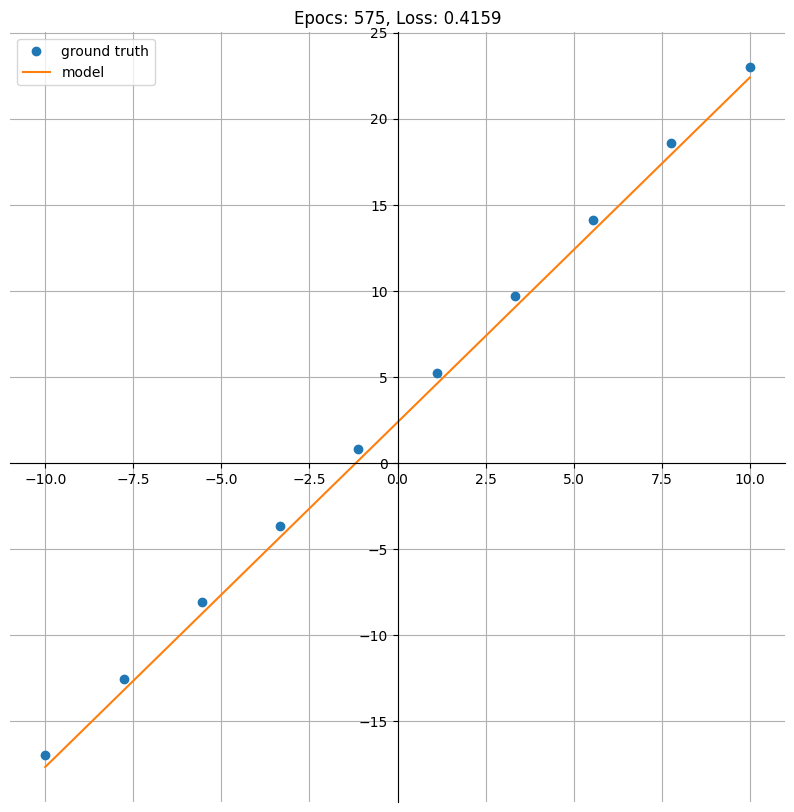

Epoch: 600; Train Loss: 0.3763311803340912


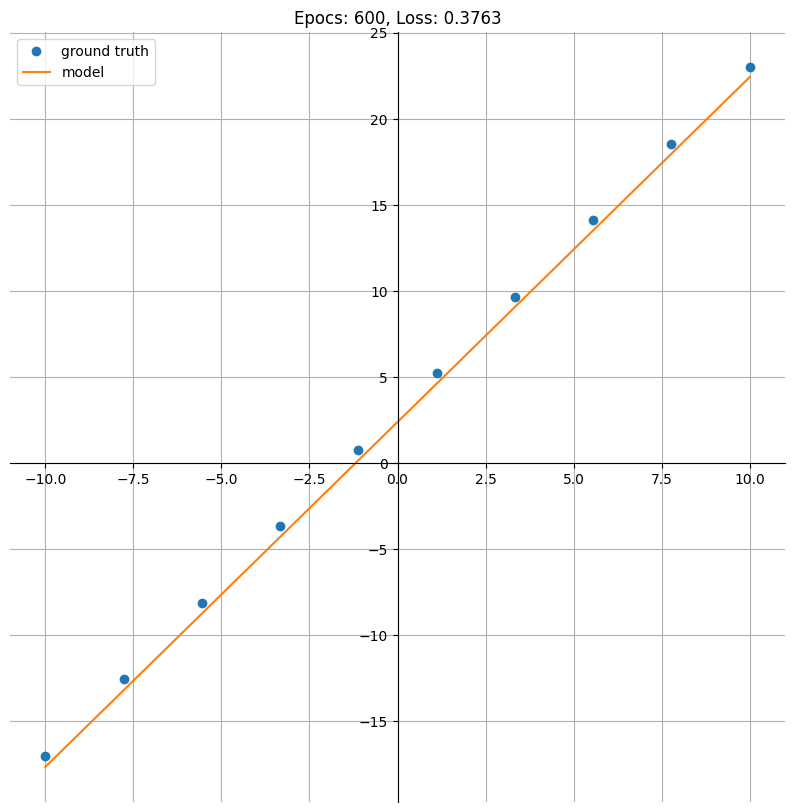

Epoch: 625; Train Loss: 0.34051182866096497


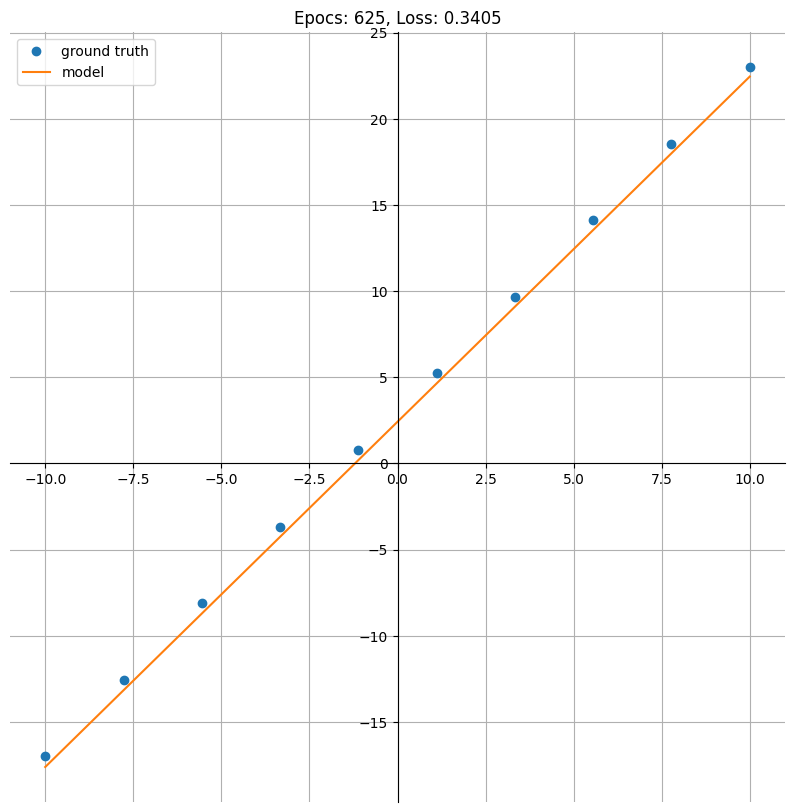

Epoch: 650; Train Loss: 0.3081018030643463


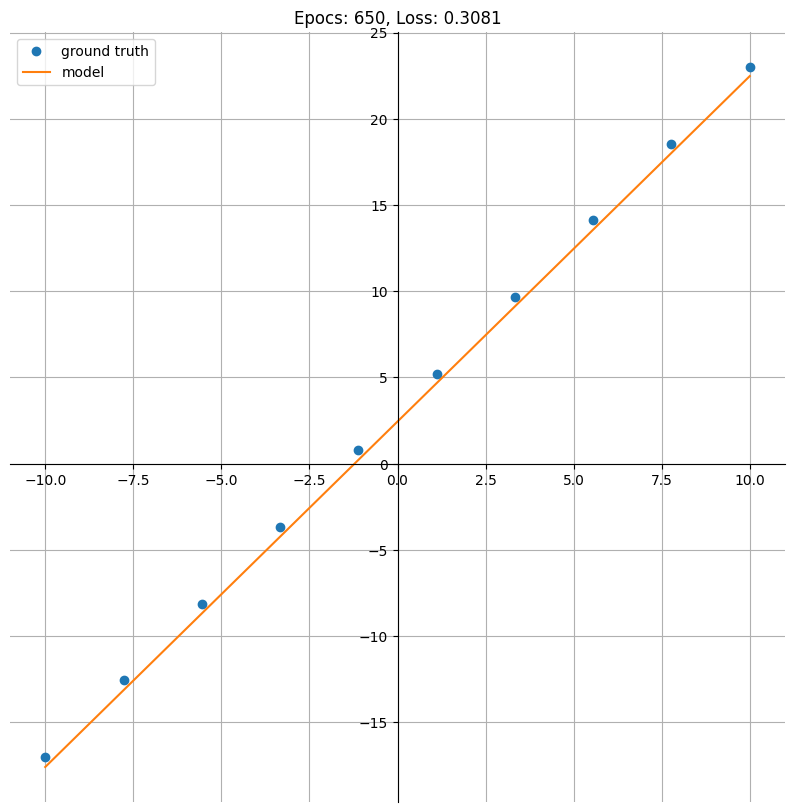

Epoch: 675; Train Loss: 0.2787763178348541


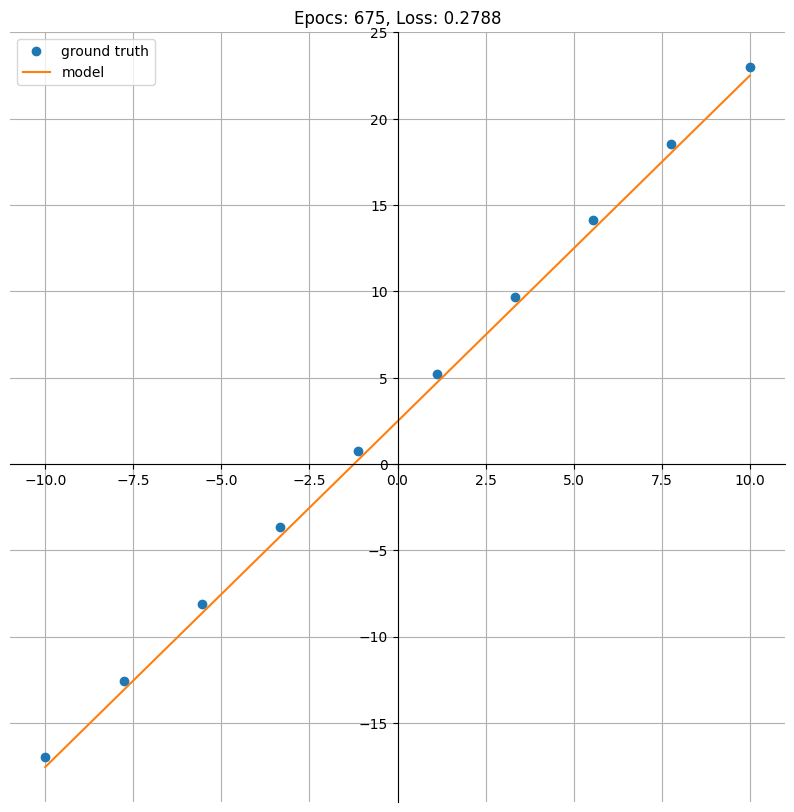

Epoch: 700; Train Loss: 0.2522422671318054


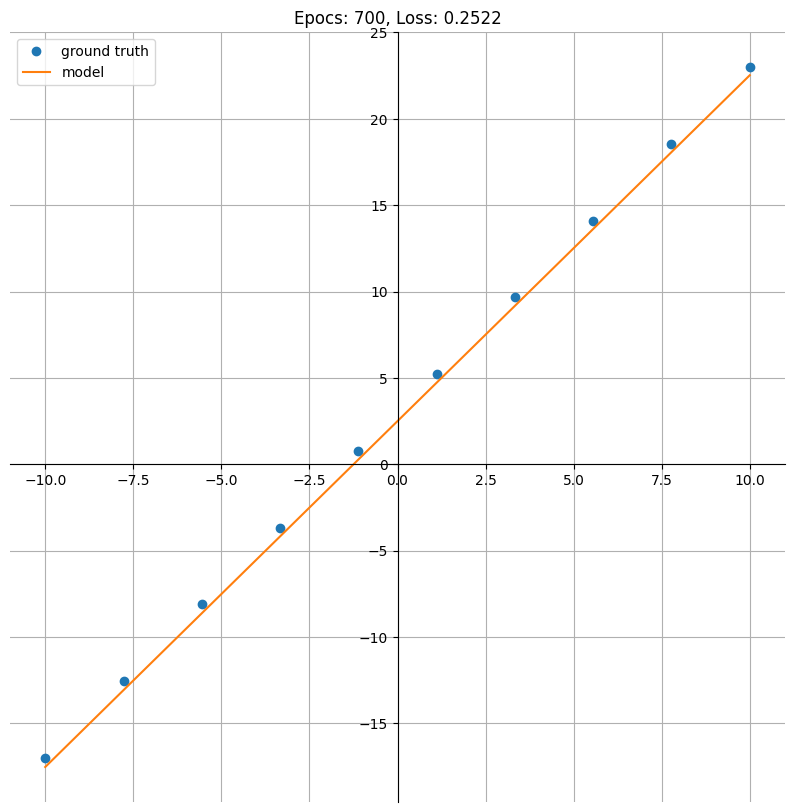

Epoch: 725; Train Loss: 0.22823382914066315


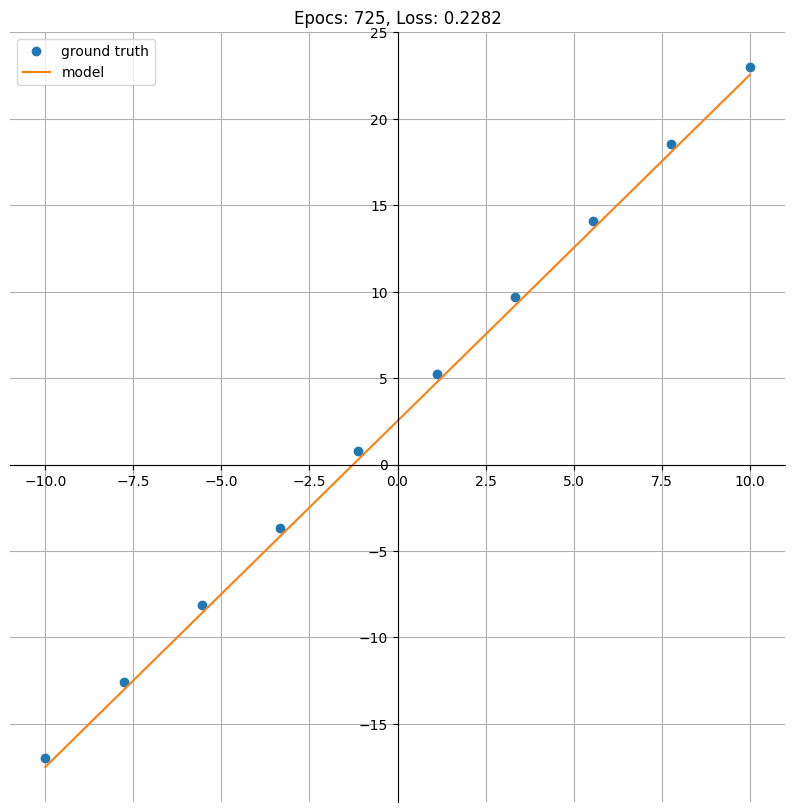

Epoch: 750; Train Loss: 0.2065105140209198


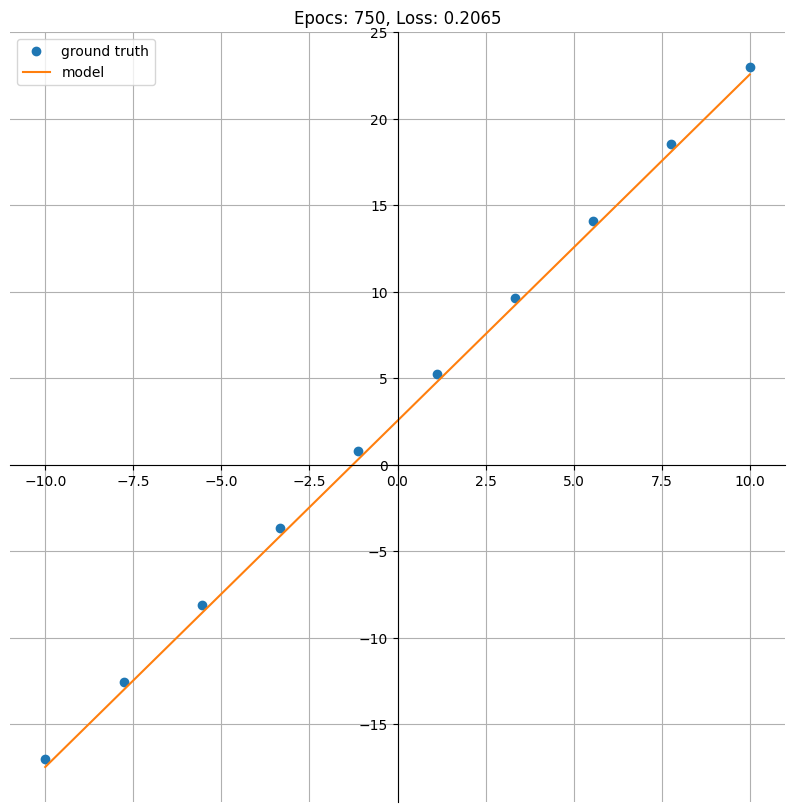

Epoch: 775; Train Loss: 0.18685440719127655


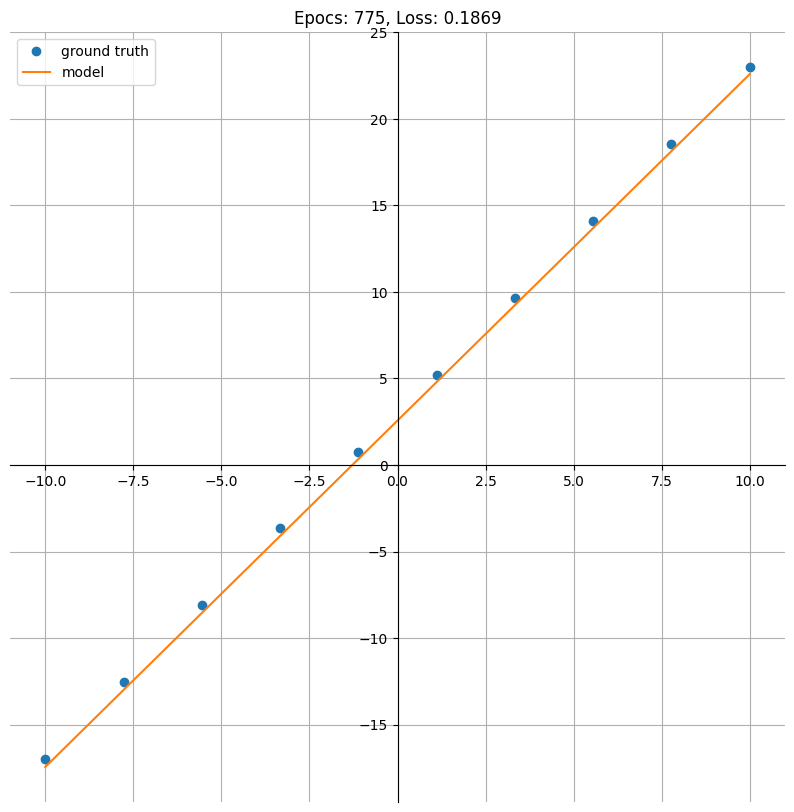

Epoch: 800; Train Loss: 0.1690693497657776


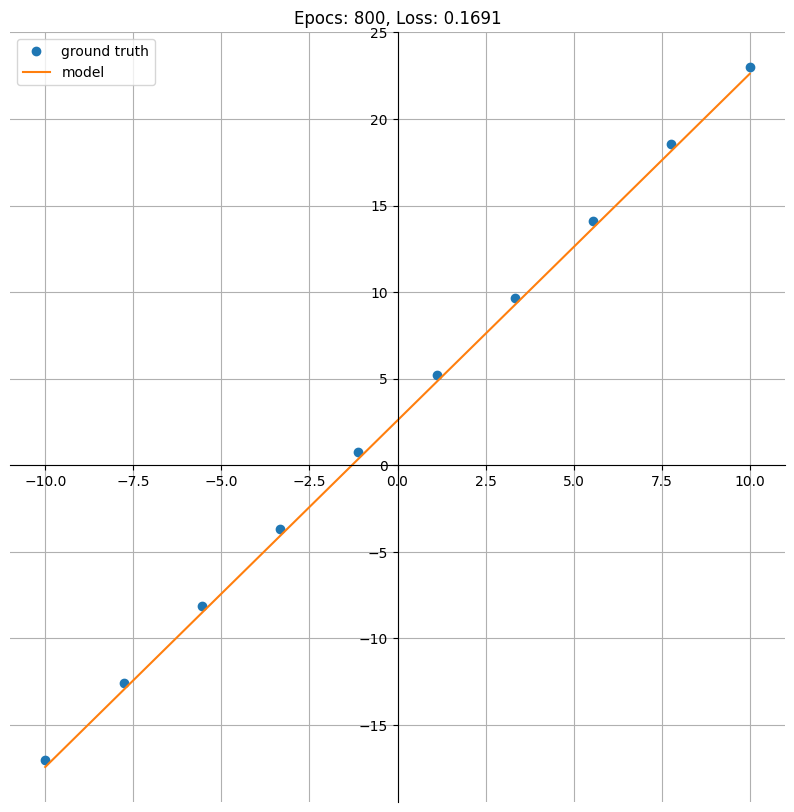

Epoch: 825; Train Loss: 0.1529771238565445


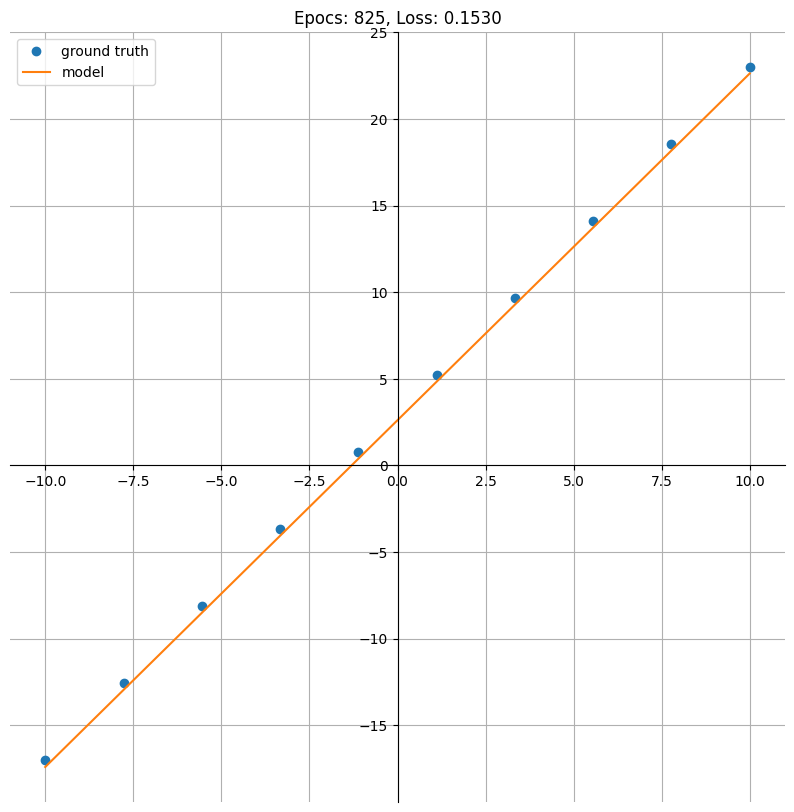

Epoch: 850; Train Loss: 0.13841667771339417


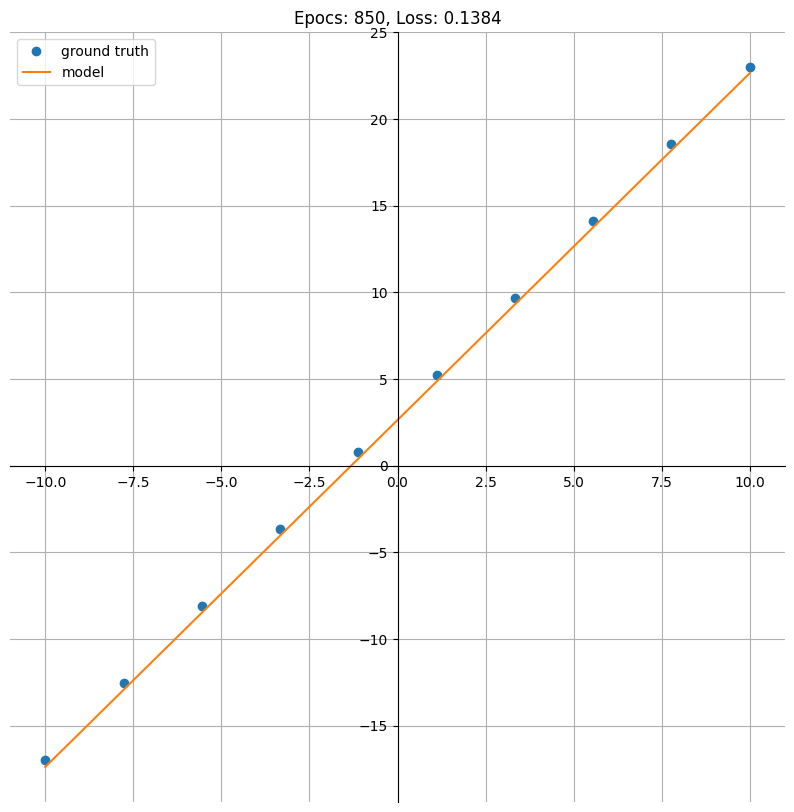

Epoch: 875; Train Loss: 0.12524260580539703


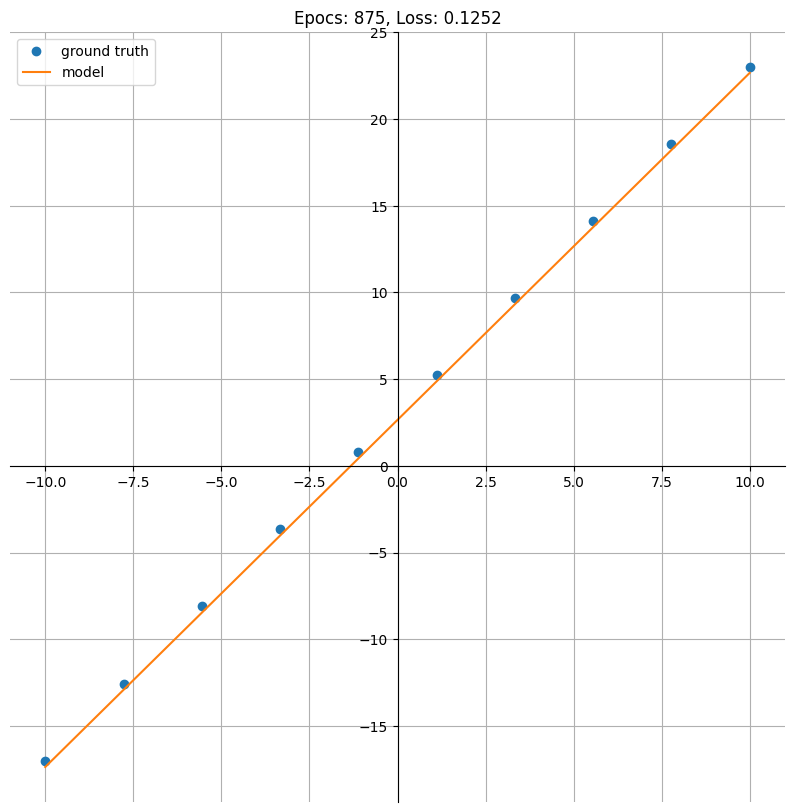

Epoch: 900; Train Loss: 0.11332172900438309


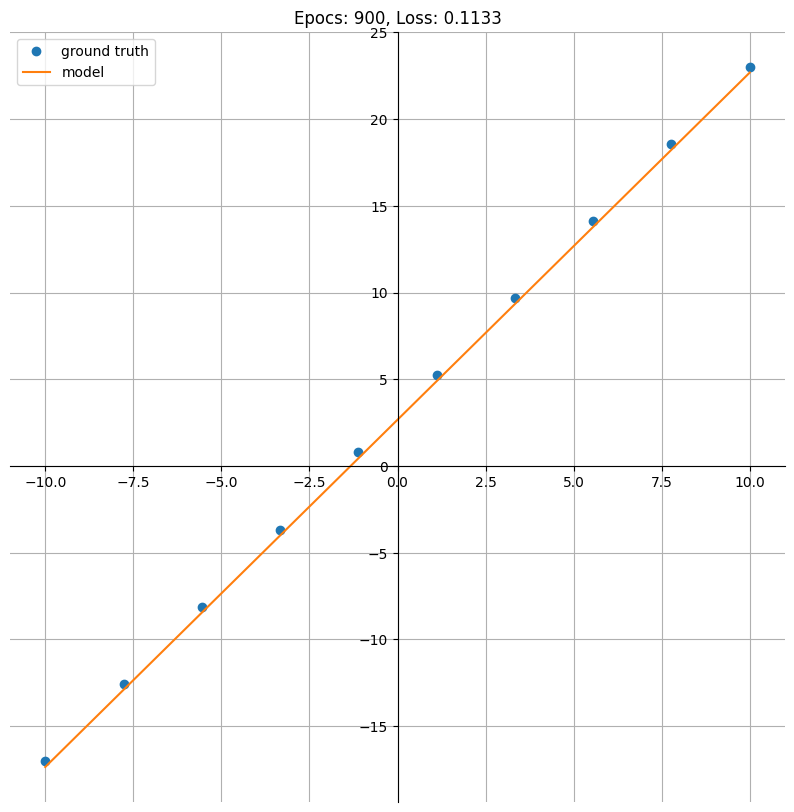

Epoch: 925; Train Loss: 0.10253589600324631


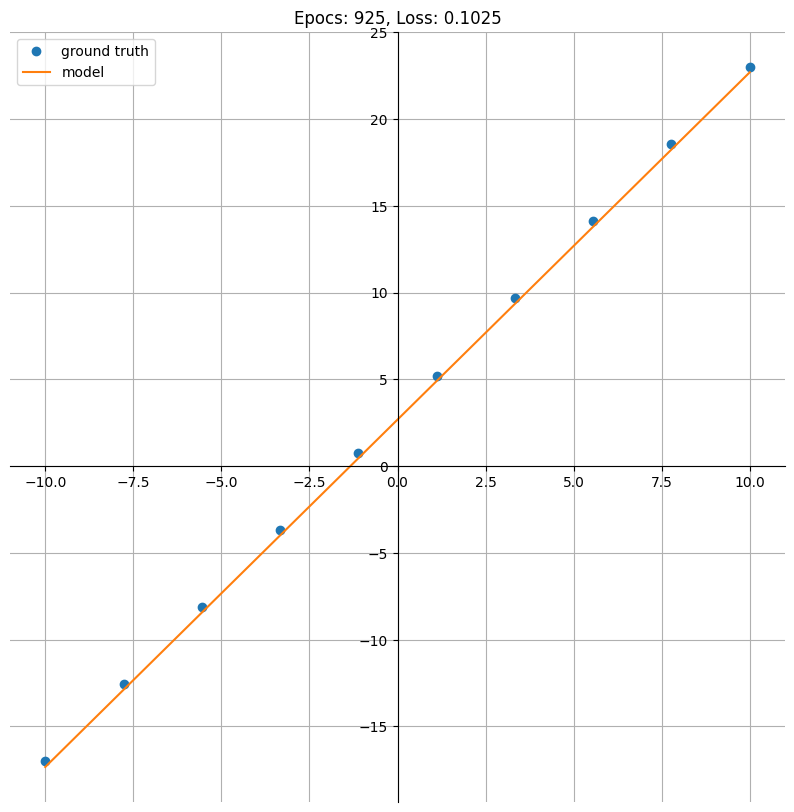

Epoch: 950; Train Loss: 0.09277650713920593


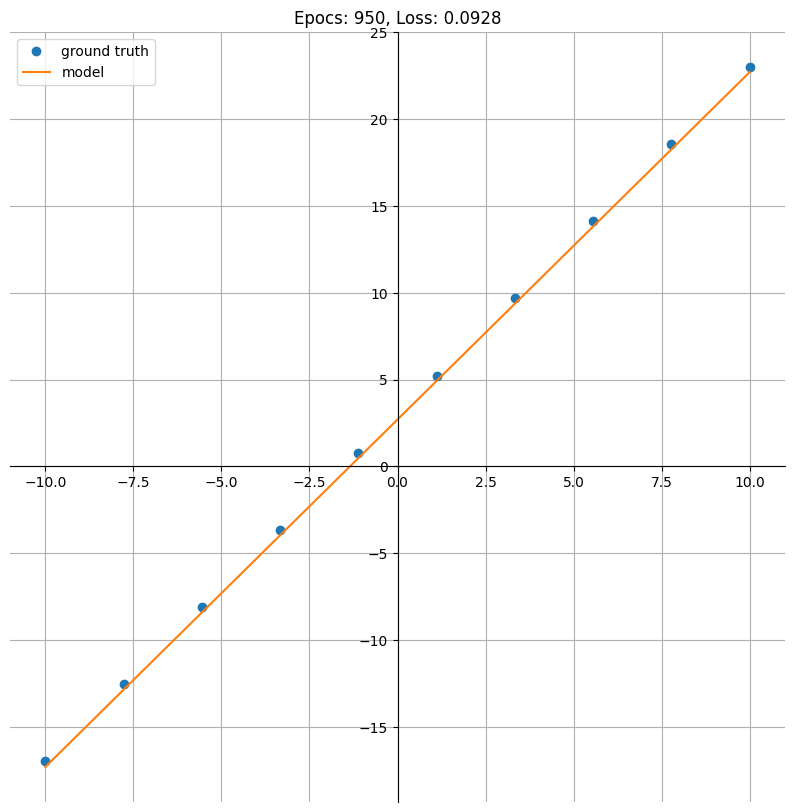

Epoch: 975; Train Loss: 0.08394574373960495


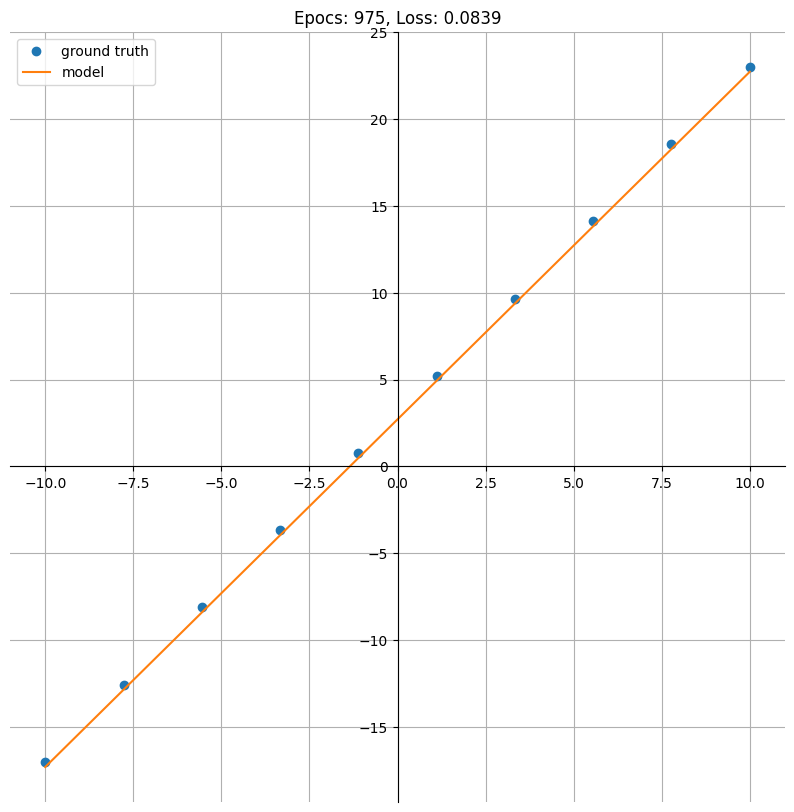

Epoch: 1000; Train Loss: 0.07595561444759369


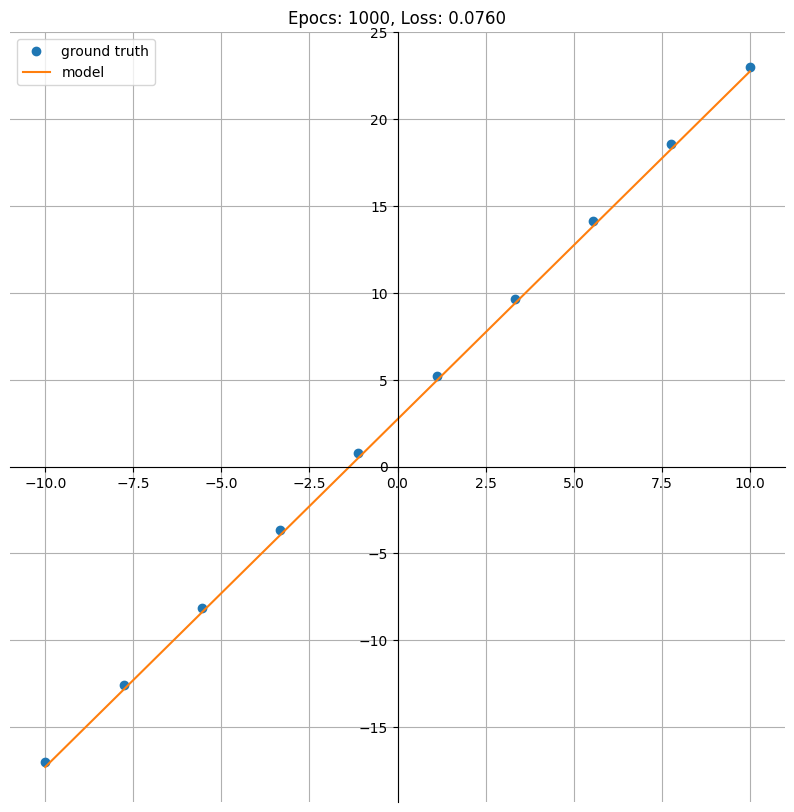

Test Loss: 0.07590730488300323


In [34]:
epochs = 1001

# Let''s make a Gif of the training
filename_output = "./line_approximation.gif"
writer = imageio.get_writer(filename_output, mode='I', duration=0.3)

for t in range(epochs):
  train_loss = train(model, train_dataloader, lossfunc, optimizer)
  if t % 25 == 0:
    print(f"Epoch: {t}; Train Loss: {train_loss}")
    image = plot_comparison(line, model, epoc=t, loss=train_loss)
    # appending to gif
    writer.append_data(image)

test_loss = test(model, test_dataloader, lossfunc)
print(f"Test Loss: {test_loss}")
writer.close()

## **Task 5** (1 pt) **Describe what you observed during the experiments:**

* The neural network used, which is a single neuron perceptron, was cappable of learning the linear behavior of the target function. This was expected, since the neuron perforns a simple linear transformation on the input, retrieving a linear combination. When tunning the perceptron by training it whith the $x,y$ values of the target function, it is capable of learning the function pattern.

* This perceptron would not be enough to learn other polinimial functions patterns though, as the single neuron can only perform a single linear transformation on the input, which can not result in arbitrary polinomial functions.

* It is also worth noting that for each trainning epoch, the resulting learned line is approaching the true function, as expected. After 1000 epochs, the perceptron is behaving in a pattern extremelly close to the target function, woth a test mean loss of ~0.216.

* However, the perceptron was trained using a single batch with the size of the training sample. Hence, the backpropagation and optimization are only applyed 1001 times (q in each epoch). If we change the bacth size to 32, for example, the backpropagation and optimization steps will be performed more times in a single epoch and the feeded data will be better randomized. This is a better practice concearning the neural network trainning process. Bellow, it is presented the same exercise, useing the same generated data, learning rate and other parameters and only changing the bacth size. Not only the convergeance occurs in less epochs, but the mean loss function is greatly reduced. This does not necessarily translates to smaller running times, as the backpropagation process will be performed more times. But for more complex target functions, this procedure can be useful to train a more fitted nnetwork as it uses randomized batches with the shuffle feature to train the network.

In [35]:
train_dataset = AlgebraicDataset(line, interval, train_nsamples)
test_dataset  = AlgebraicDataset(line, interval, test_nsamples)

train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_dataloader  = DataLoader(test_dataset, batch_size=test_nsamples, shuffle=True)

In [36]:
model = LineNetwork().to(device)

In [37]:
# Loss Function: Mean Squared Error
lossfunc = nn.MSELoss()

# SGD = Stochastic Gradient Descent
optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

Epoch: 0; Train Loss: 64.90145874023438


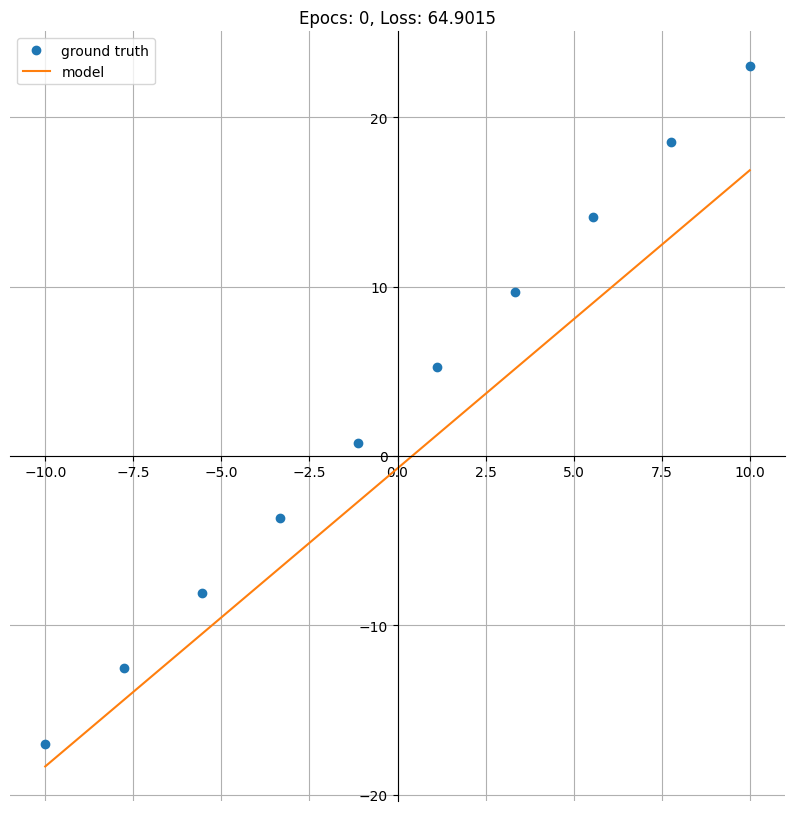

Epoch: 25; Train Loss: 0.6062952876091003


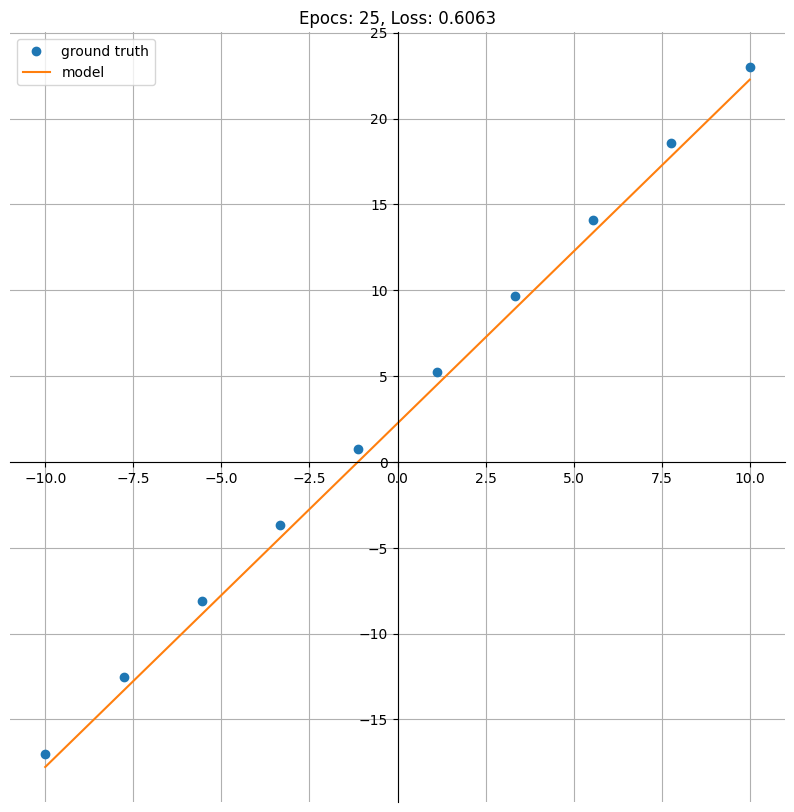

Epoch: 50; Train Loss: 0.024586685001850128


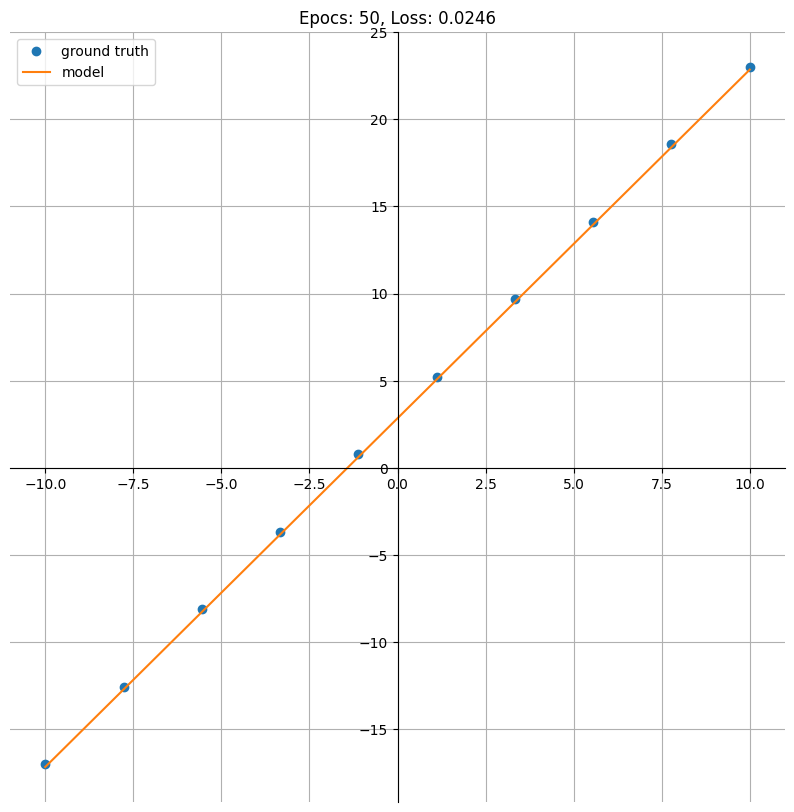

Epoch: 75; Train Loss: 0.000997380237095058


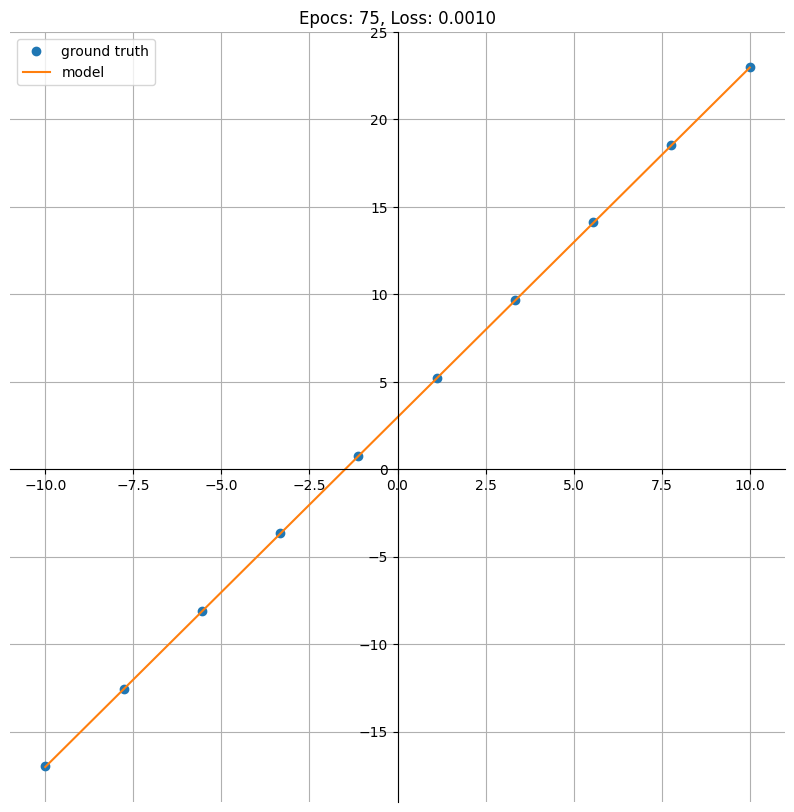

Epoch: 100; Train Loss: 4.051228461321443e-05


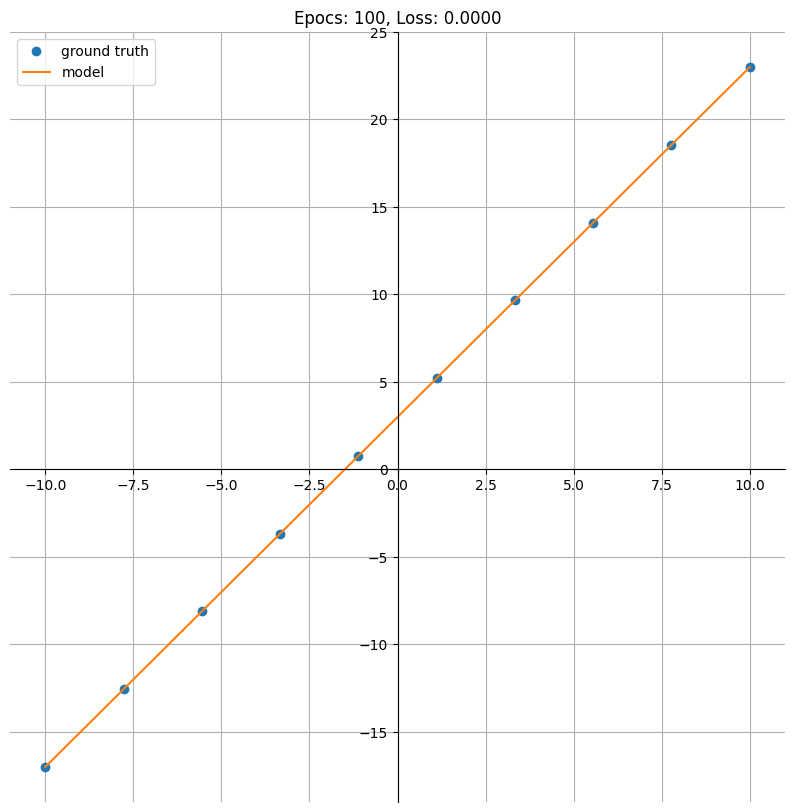

Epoch: 125; Train Loss: 1.6446855397589388e-06


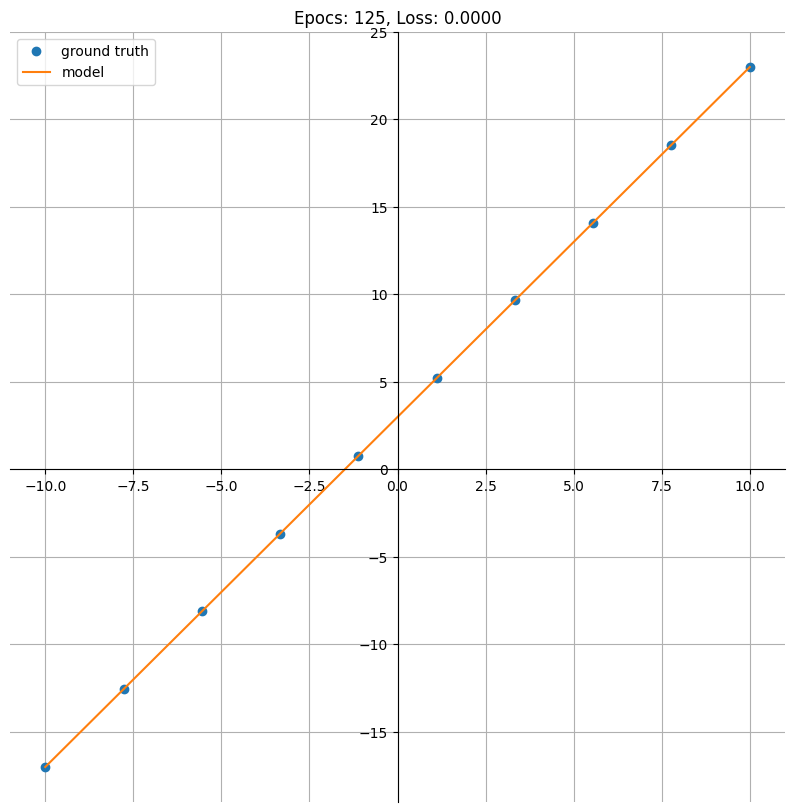

Epoch: 150; Train Loss: 6.86462513499464e-08


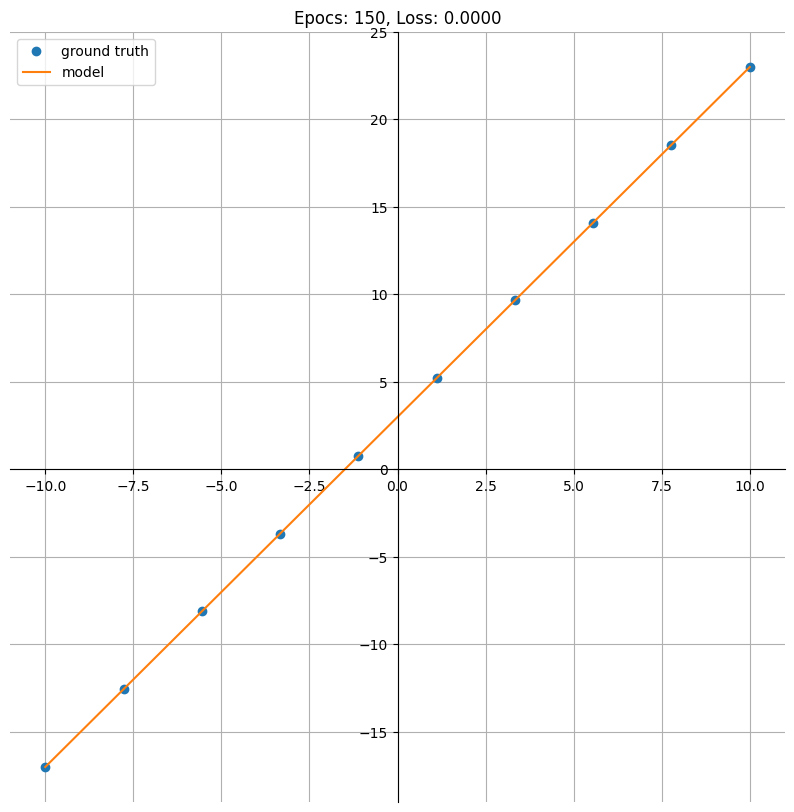

Epoch: 175; Train Loss: 3.456465558215882e-09


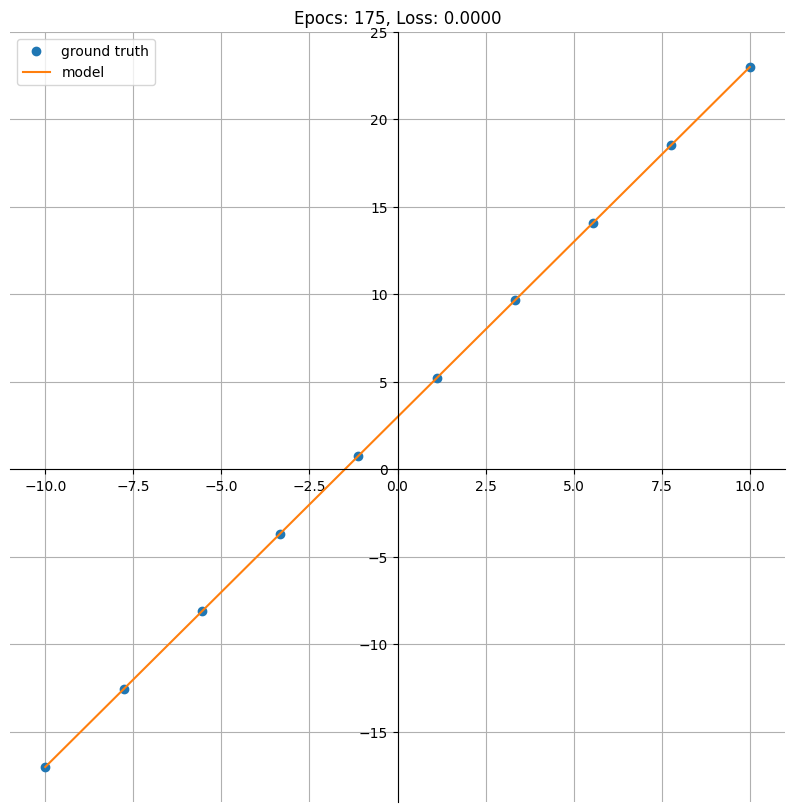

Epoch: 200; Train Loss: 3.3599412141427365e-09


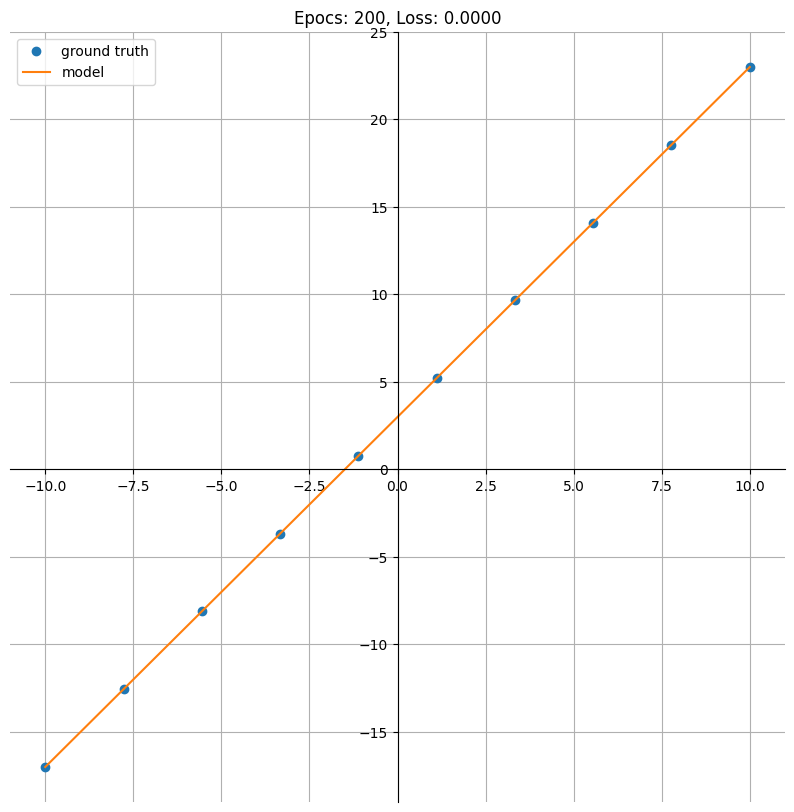

Test Loss: 3.36632854924801e-09


In [38]:
epochs = 201

# Let''s make a Gif of the training
filename_output = "./line_approximation_2.gif"
writer = imageio.get_writer(filename_output, mode='I', duration=0.3)

for t in range(epochs):
  train_loss = train(model, train_dataloader, lossfunc, optimizer)
  if t % 25 == 0:
    print(f"Epoch: {t}; Train Loss: {train_loss}")
    image = plot_comparison(line, model, epoc=t, loss=train_loss)
    # appending to gif
    writer.append_data(image)

test_loss = test(model, test_dataloader, lossfunc)
print(f"Test Loss: {test_loss}")
writer.close()

# 4. Now, it's your turn!

You will find below the definition of a new model, a fully connected network with 5 layers and the Rectified Linear Unit function as activation function. You should use the infrastructure defined in the example to train this model to approximate a more sophisticated function (for example, a parabola).

### **Tasks 6-9** [Optional]: (0.5 pts each)

- 6) Experiment with the network architecture: increase or decrease the number of layers; change the number of neurons in specific layers etc.
- 7) Choose the function you'll use to build your dataset. The simplest way to make it work is to build a new instance of AlgebraicDataset passing a new lambda function and a new (or same) domain. However, feel free to experiment more complex ways of defining a function.
- 8) Experiment different hyperparameters such as number of training epochs, learning rate, or loss function.
- 9) Describe what you learned during the experiments.

<br>
<br>

## Development

For this exercise two network architectures where tested. One with layers and one with six layers. Then some tests regarding the learning rate and the loss function where made. Firstly, let's present the architecture 1 for the tested neural networks. It is composed by four layers:
* The first layer is composed by 1 neuron and its result is feeded in a leaky ReLU activation function.
* The second one has 10 neurons and also feeds a Leaky ReLU.
* The Third has 100 neurons and has no activation function.
* The last one has 1 neuron and no activation function either.

All layers perform linear operations. Bellow, the network is implemented in a python class.


In [39]:
import numpy as np
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch.distributions.uniform as urand

# for visualization
import imageio
import matplotlib.pyplot as plt
from skimage import img_as_ubyte

activation_function = nn.LeakyReLU()

#Define the Model Architecture
class MultiLayerNetwork(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
        # First Layer
        nn.Linear(1, 10),
        activation_function,
        # Second Layer
        nn.Linear(10, 100),
        activation_function,
        # Third Layer
        nn.Linear(100, 10),
        # Fourth (last) Layer
        nn.Linear(10, 1)
    )


  def forward(self, x):
    return self.layers(x)

In [40]:
# Functions used in this exercise:

# Train step function
def train(model, dataloader, lossfunc, optimizer):
    '''A function for training our model'''

    # List to store the loss in each iteration (each batch)
    total_loss_list = []

    # runs an epoch
    for X_batch, y_batch in dataloader:
        # Set the model to training mode
        model.train()
        # Reshapes the inputs and labels
        X_batch = X_batch.reshape(-1,1).to(device)
        y_batch = y_batch.reshape(-1,1).to(device)

        # obtains the model prediction to X_batch
        y_pred = model(X_batch).to(device)
        # Obtain the loss function comparing the y prediction
        # to the real labels
        loss = lossfunc(y_pred, y_batch)
        # append the loss to the loss list
        total_loss_list.append(loss)

        # Backpropagation and optmization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Mean loss
    mean_loss = sum(total_loss_list)/len(total_loss_list)

    return mean_loss


def test(model, dataloader, lossfunc):
    '''A function for evaluating our model on test data'''

    # List to store the loss in each iteration (each batch)
    total_loss_list = []

    for X_batch, y_batch in dataloader:
        # Set the model to evaluation mode
        model.eval()
        # Disables gradient calculation
        torch.no_grad()
        # Reshape data
        X_batch = X_batch.reshape(-1,1).to(device)
        y_batch = y_batch.reshape(-1,1).to(device)

        # Foward step and loss calculus
        y_pred = model.forward(X_batch).to(device)
        loss = lossfunc(y_pred, y_batch)
        total_loss_list.append(loss)


    # Mean loss
    mean_loss = sum(total_loss_list)/len(total_loss_list)

    return mean_loss



# Function to visualize results (to be used later in the notebook)
def plot_comparison(f, model, interval=(-10, 10), nsamples=10, return_array=True, epoc="None", loss="None"):
  fig, ax = plt.subplots(figsize=(10, 10))

  ax.grid(True, which='both')
  ax.spines['left'].set_position('zero')
  ax.spines['right'].set_color('none')
  ax.spines['bottom'].set_position('zero')
  ax.spines['top'].set_color('none')

  samples = np.linspace(interval[0], interval[1], nsamples)
  model.eval()
  with torch.no_grad():
    pred = model(torch.tensor(samples).unsqueeze(1).float().to(device))

  ax.plot(samples, list(map(f, samples)), "o", label="ground truth")
  ax.plot(samples, pred.cpu(), label="model")
  #print(samples, pred.cpu())
  plt.title(f"Epocs: {epoc}, Loss: {loss:.4f}")
  plt.legend()
  plt.show()
  # to return image as numpy array
  if return_array:
    fig.canvas.draw()
    img_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
    return img_from_plot.reshape(fig.canvas.get_width_height()[::-1] + (3,))

## *Write your solution below this cell*

The chosen function to be learned was a quadratic function given by:
$$f(x) = 2x^2 - 8x + 10$$
and it was created the same way as the function from the previous task: crating an Algebaric Dataset from the dataset class.

### Experiment 1

For this first experiment, the 4 layer MLP presented will be used to learn the function $f(x)$ using the SGD optimization rule with a learning rate of 0.01. We will also use the MSELoss function from pytorch. 101 training epochs were made.

In [41]:
# This is a Dataset class to work with PyTorch
class AlgebraicDataset(Dataset):
  '''Abstraction for a dataset of a 1D function'''

  def __init__(self, f, interval, nsamples):
    X = urand.Uniform(interval[0], interval[1]).sample([nsamples])
    self.data = [(x, f(x)) for x in X]

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    return self.data[idx]

In [42]:
# we need a function
line = lambda x: 2*x**2 - 8*x + 10
# a domain for our function
interval = (-10, 10)
# the number of points we are going to sample for training
train_nsamples = 1000
# the number of points we are going to evaluate our model on
test_nsamples = 100

In [43]:
train_dataset = AlgebraicDataset(line, interval, train_nsamples)
test_dataset  = AlgebraicDataset(line, interval, test_nsamples)

train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_dataloader  = DataLoader(test_dataset, batch_size=test_nsamples, shuffle=True)

In [44]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"running on {device}")

running on cuda


In [45]:
model = MultiLayerNetwork().to(device)

In [46]:
# Loss Function: Mean Squared Error
lossfunc = nn.MSELoss()

# SGD = Stochastic Gradient Descent
optimizer = torch.optim.SGD(model.parameters(), lr=1e-2)

Epoch: 0; Train Loss: nan


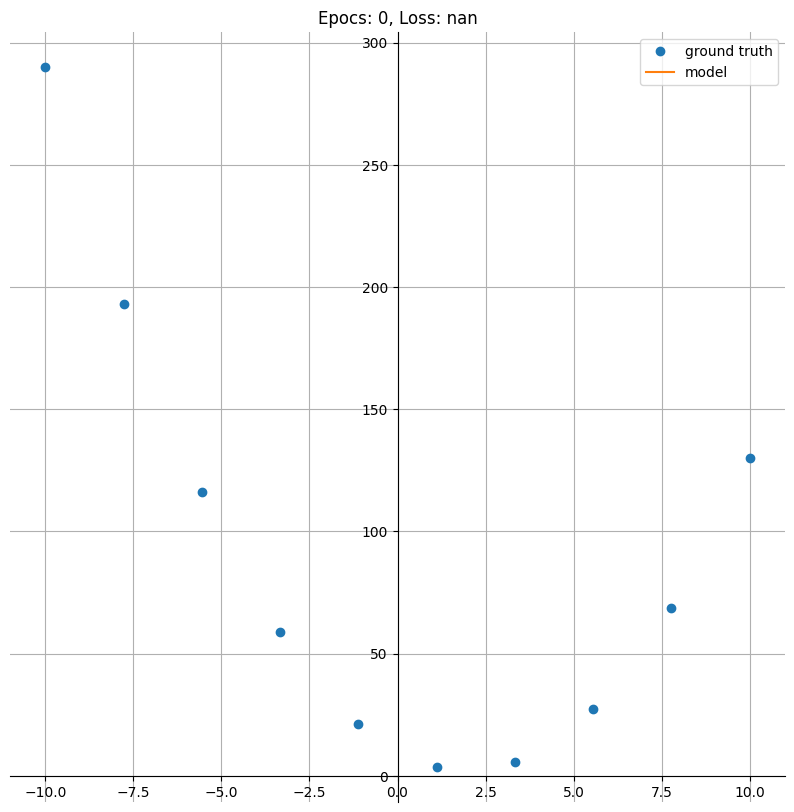

Epoch: 25; Train Loss: nan


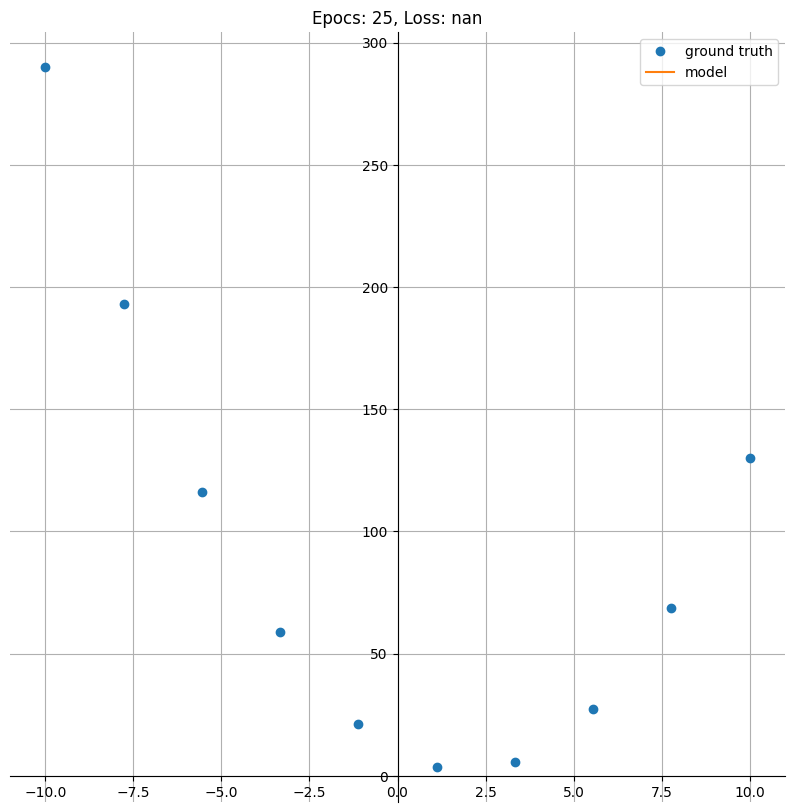

Epoch: 50; Train Loss: nan


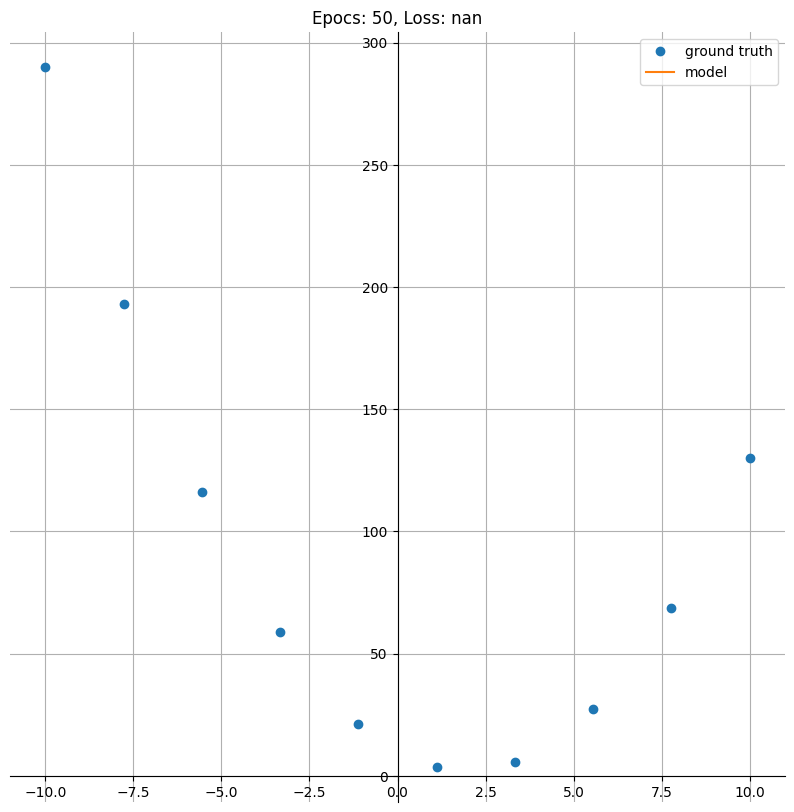

Epoch: 75; Train Loss: nan


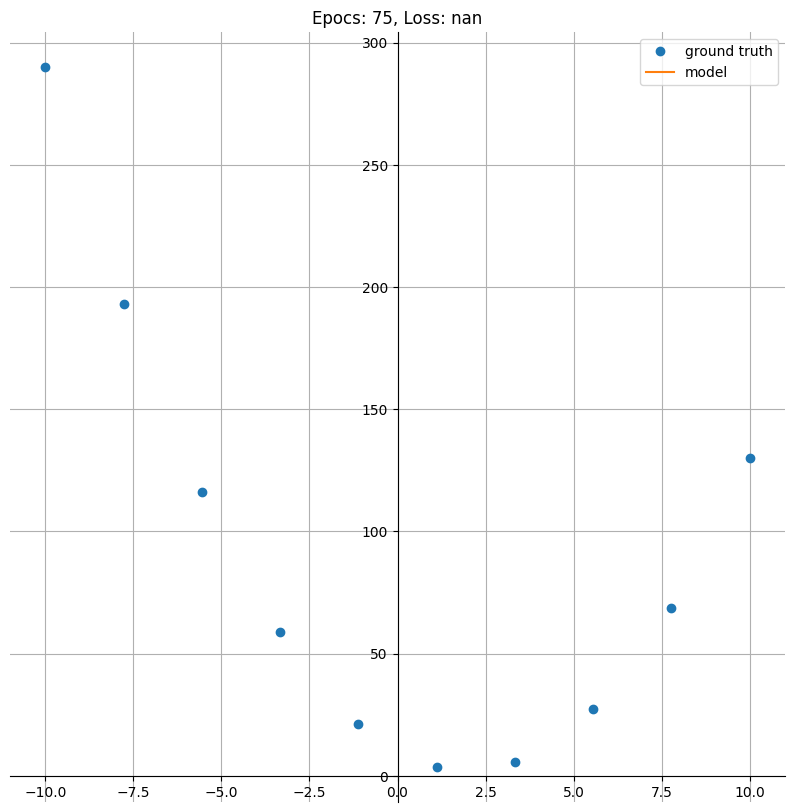

Epoch: 100; Train Loss: nan


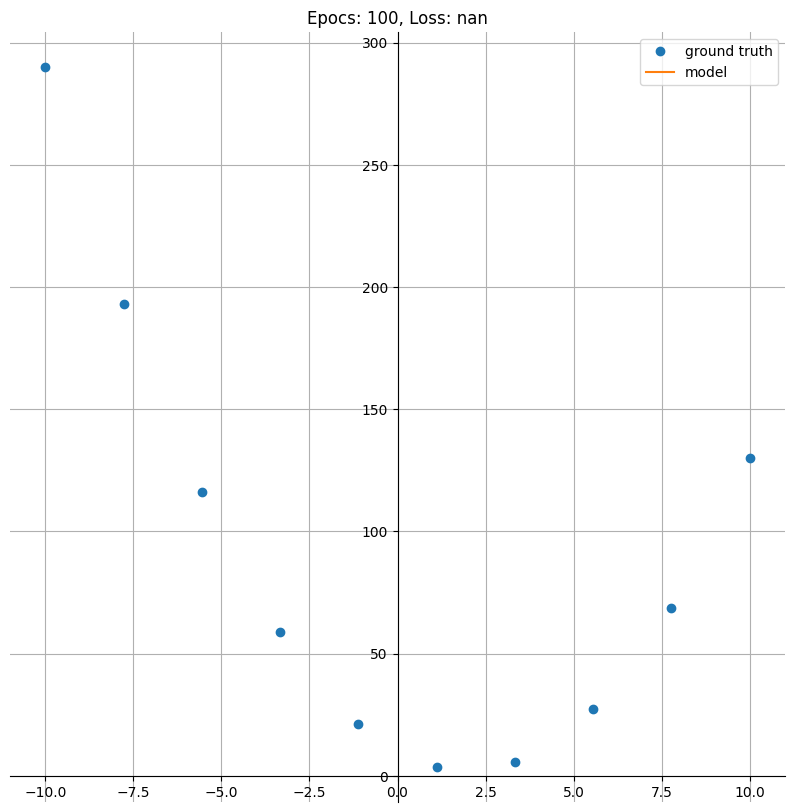

Test Loss: nan


In [47]:
epochs = 101

# Let''s make a Gif of the training
filename_output = "./line_approximation_mlp_1.gif"
writer = imageio.get_writer(filename_output, mode='I', duration=0.3)

for t in range(epochs):
  train_loss = train(model, train_dataloader, lossfunc, optimizer)
  if t % 25 == 0:
    print(f"Epoch: {t}; Train Loss: {train_loss}")
    image = plot_comparison(line, model, epoc=t, loss=train_loss)
    # appending to gif
    writer.append_data(image)

test_loss = test(model, test_dataloader, lossfunc)
print(f"Test Loss: {test_loss}")
writer.close()

As seen above, the results returned by the network are all nan. This can have a variety of causes, but here, the gradient of the loss function is probably returning values to high and the network is not performing as expected. The network is most likely tryijg to computate entries with thr ```inf``` value.

### Experiment 2

Since the MSELoss function is not adequate for this task, in this experiment the L1Loss was used. The learning rate was mantained and the training epochs were set to 1001.

In [48]:
model = MultiLayerNetwork().to(device)

In [49]:
# Loss Function: Mean Squared Error
lossfunc = nn.L1Loss()

# SGD = Stochastic Gradient Descent
optimizer = torch.optim.SGD(model.parameters(), lr=1e-2)

Epoch: 0; Train Loss: 50.00119400024414


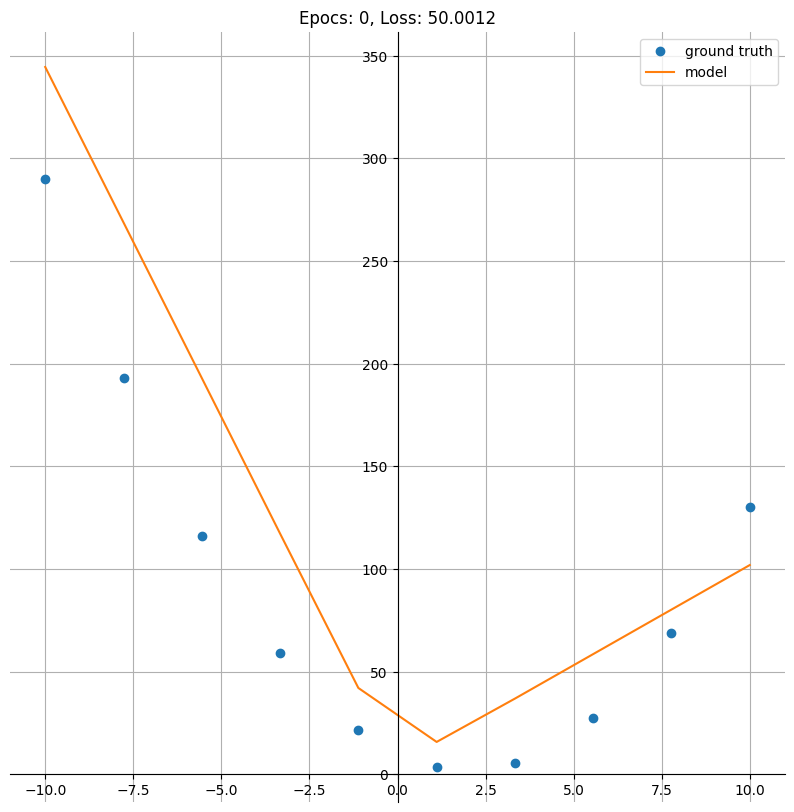

Epoch: 25; Train Loss: 14.407771110534668


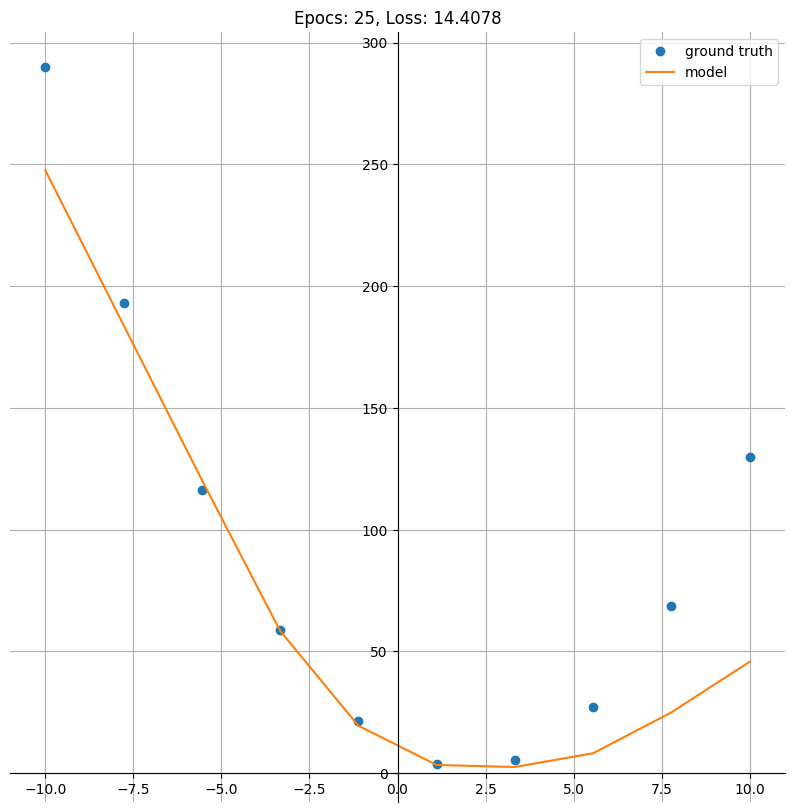

Epoch: 50; Train Loss: 12.901419639587402


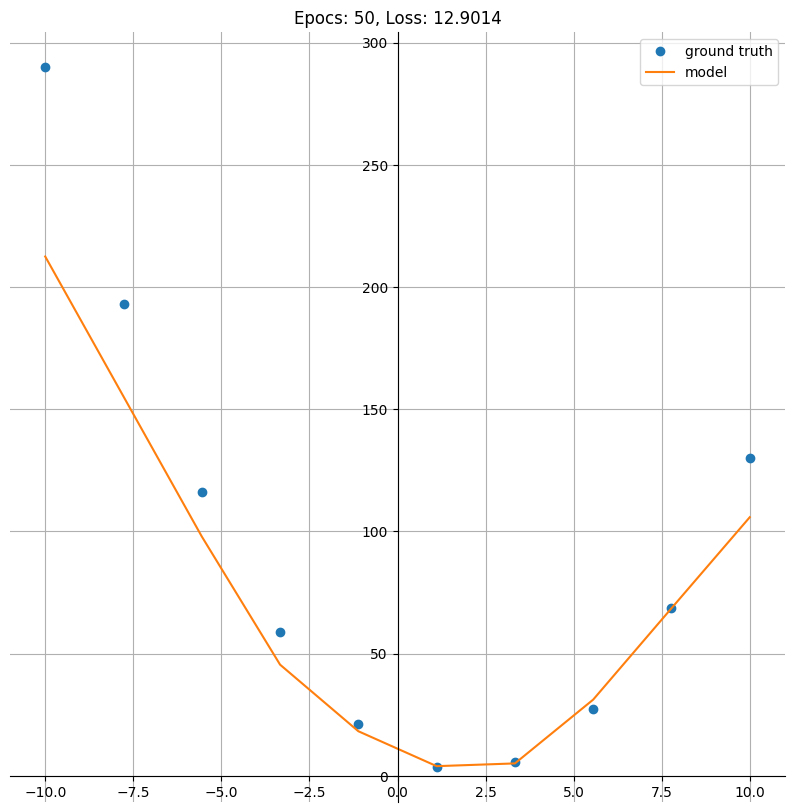

Epoch: 75; Train Loss: 13.674163818359375


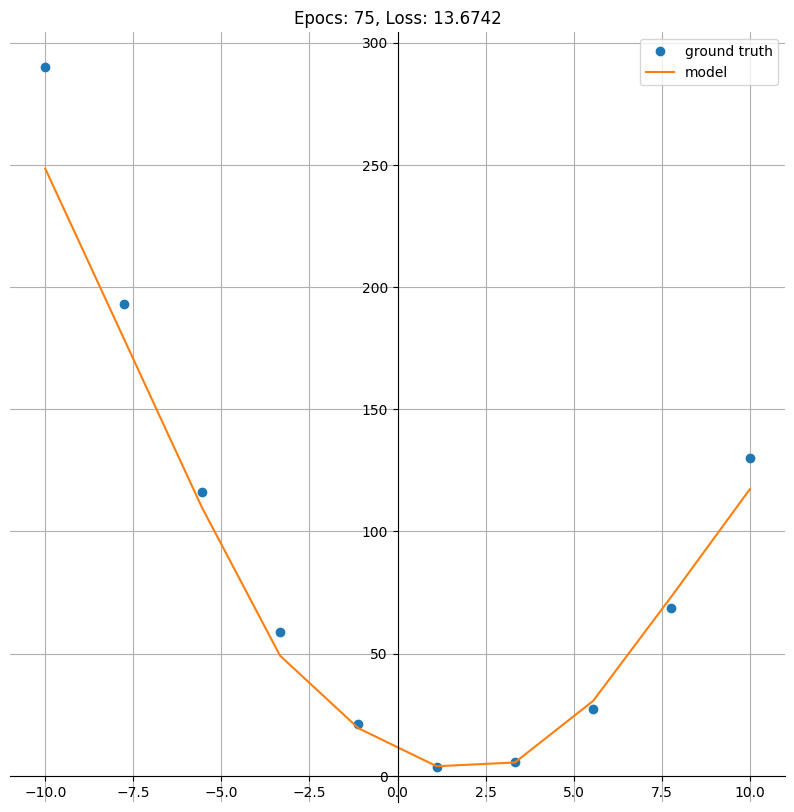

Epoch: 100; Train Loss: 12.621987342834473


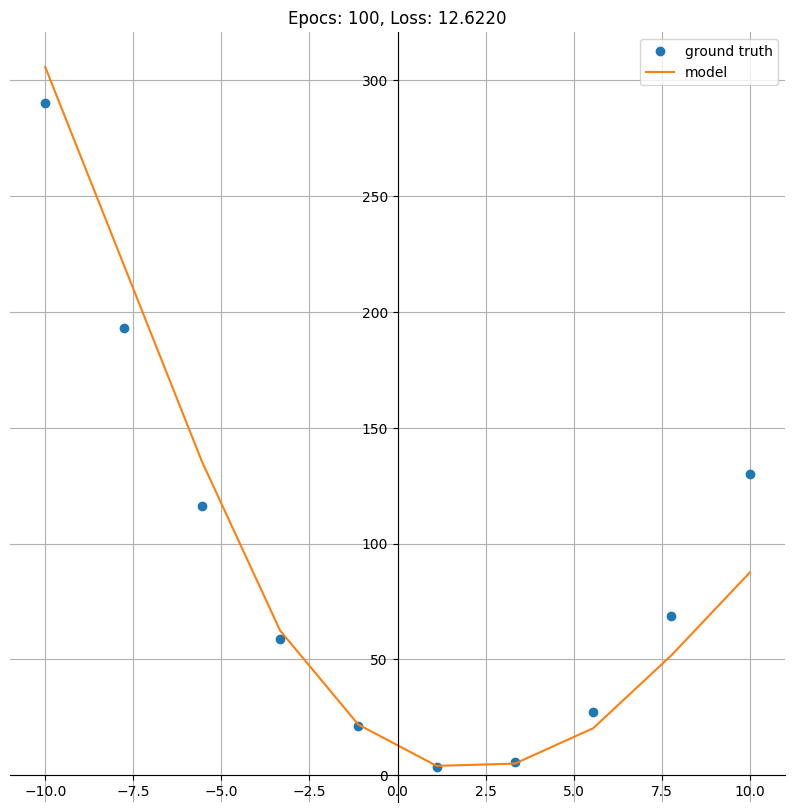

Epoch: 125; Train Loss: 12.347156524658203


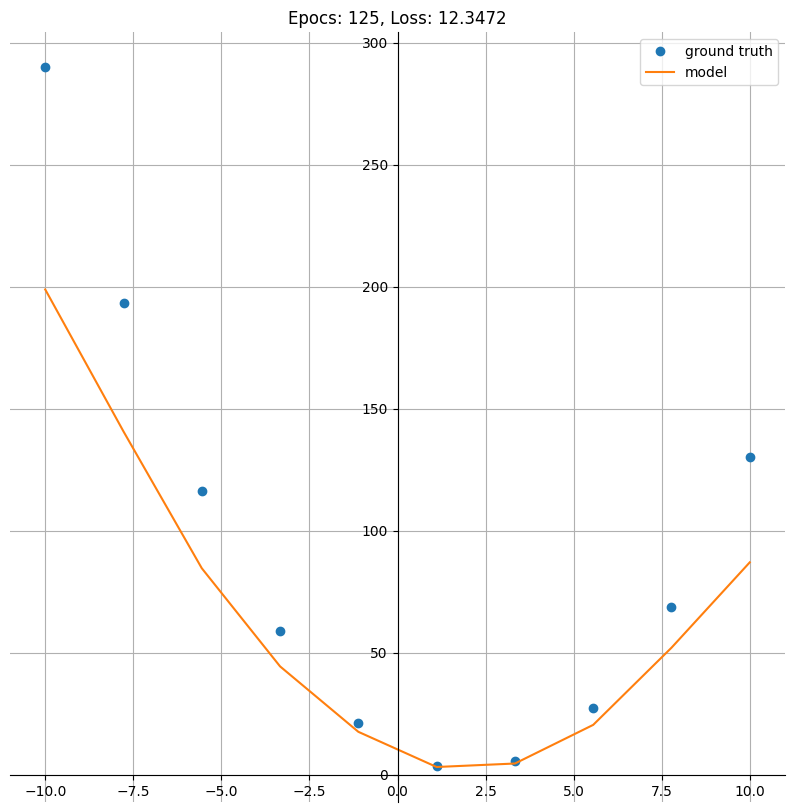

Epoch: 150; Train Loss: 12.541252136230469


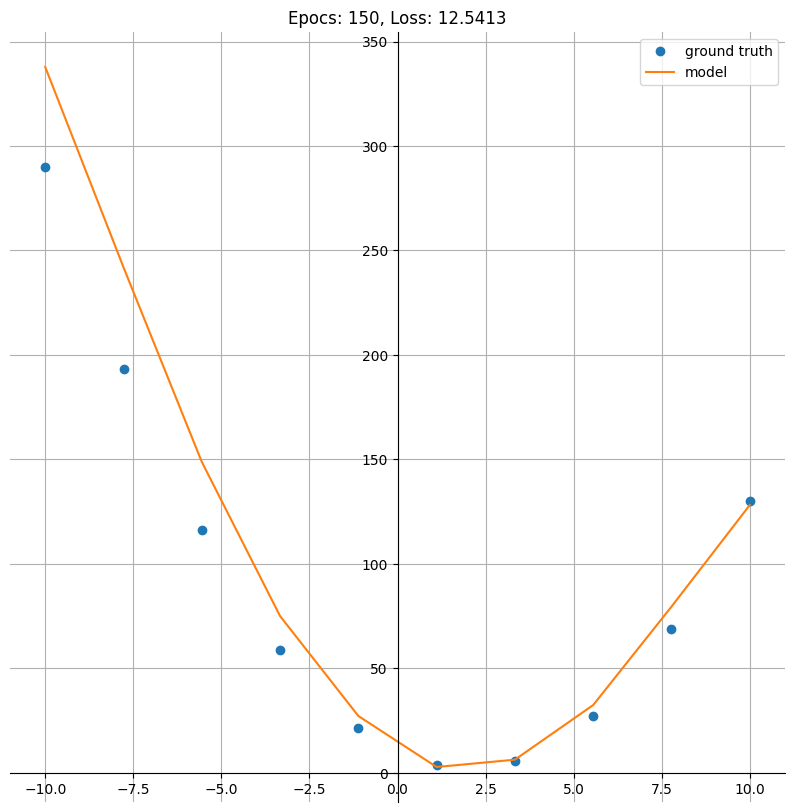

Epoch: 175; Train Loss: 12.765599250793457


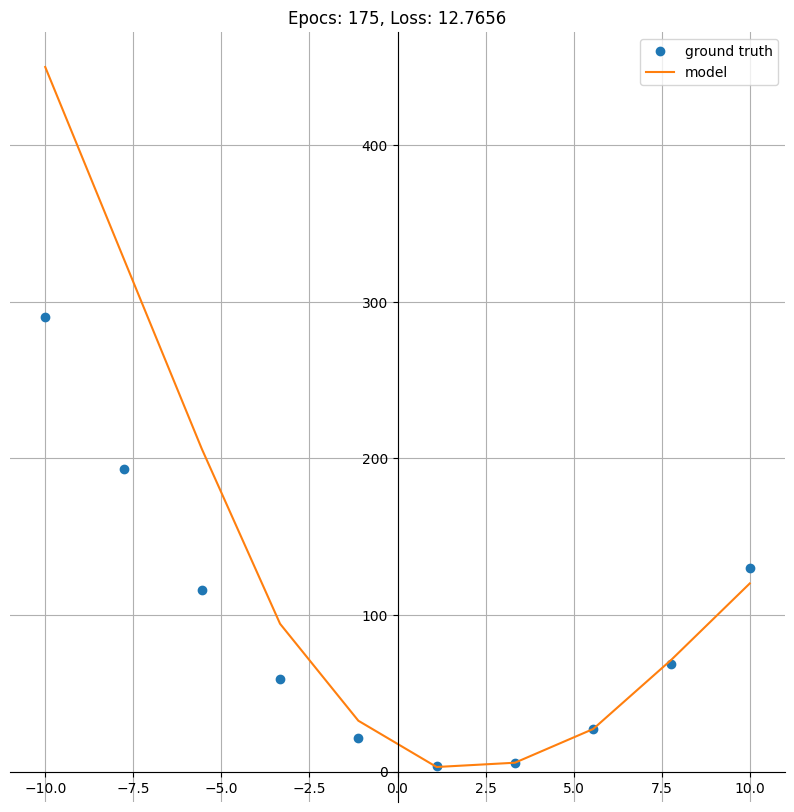

Epoch: 200; Train Loss: 13.000406265258789


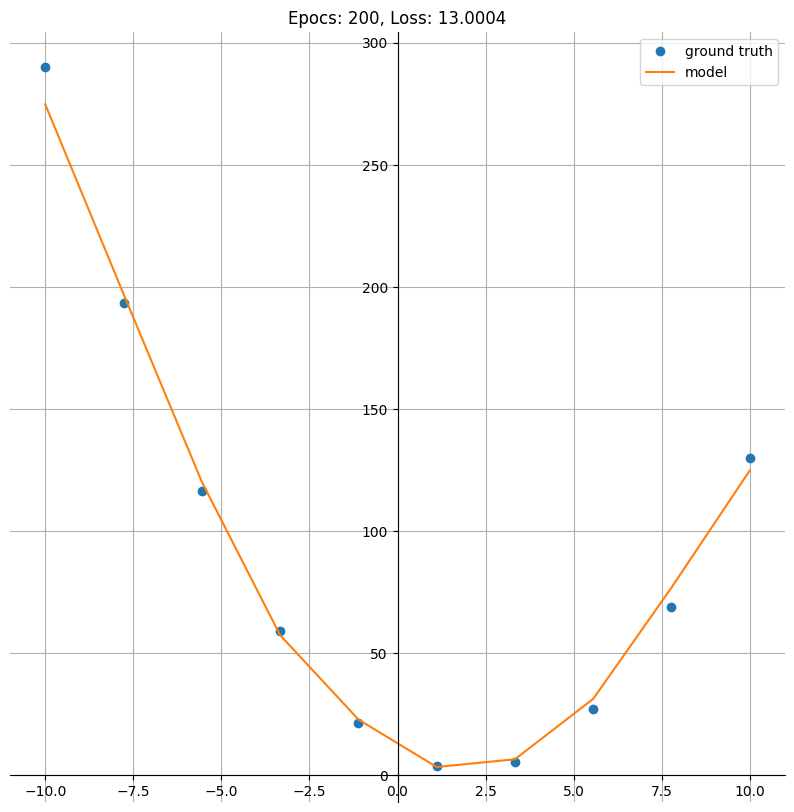

Epoch: 225; Train Loss: 11.724418640136719


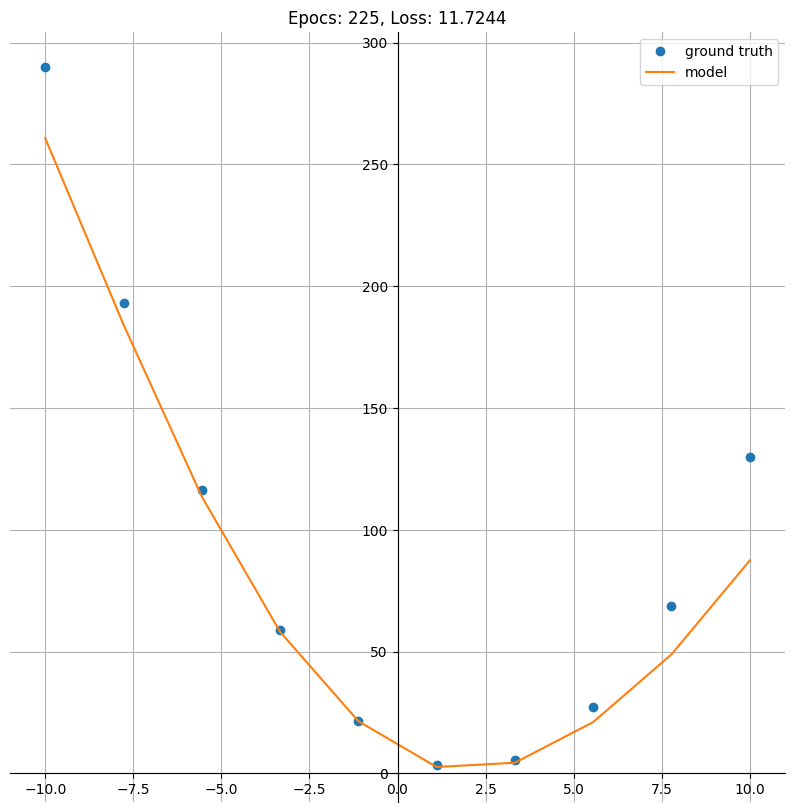

Epoch: 250; Train Loss: 11.687810897827148


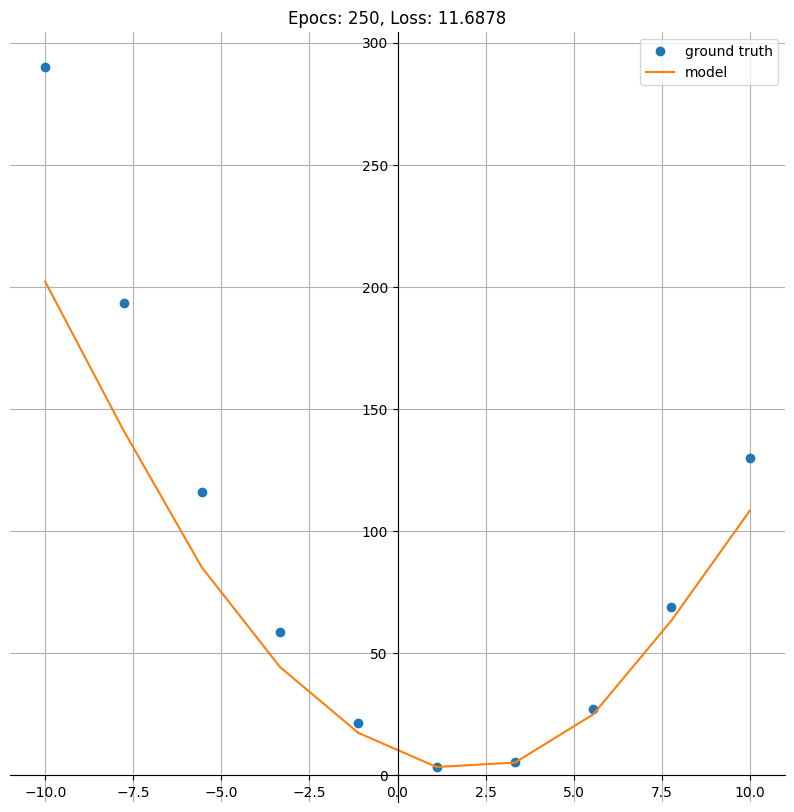

Epoch: 275; Train Loss: 10.759544372558594


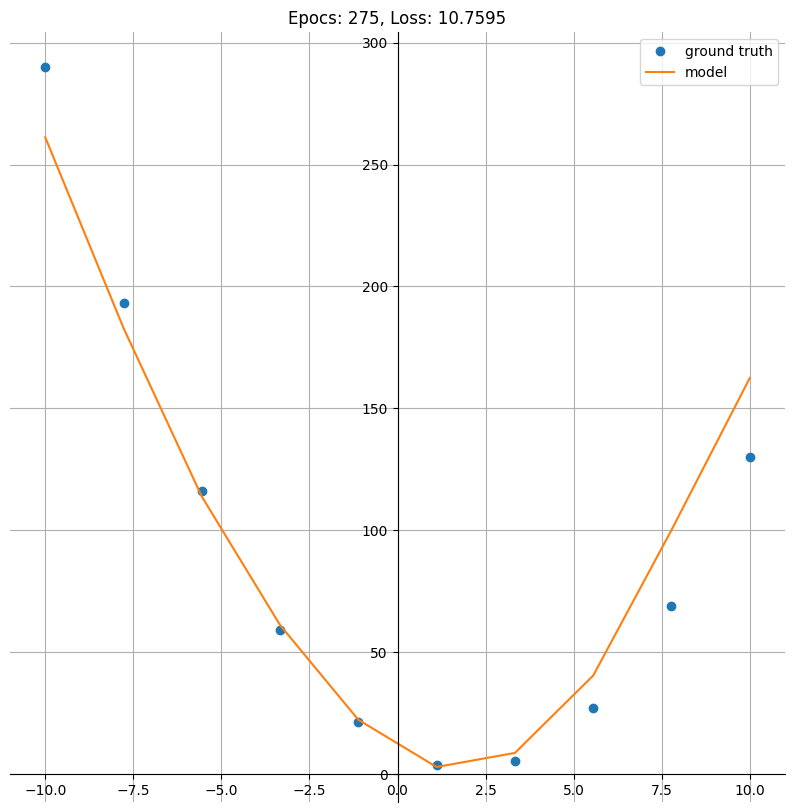

Epoch: 300; Train Loss: 11.001228332519531


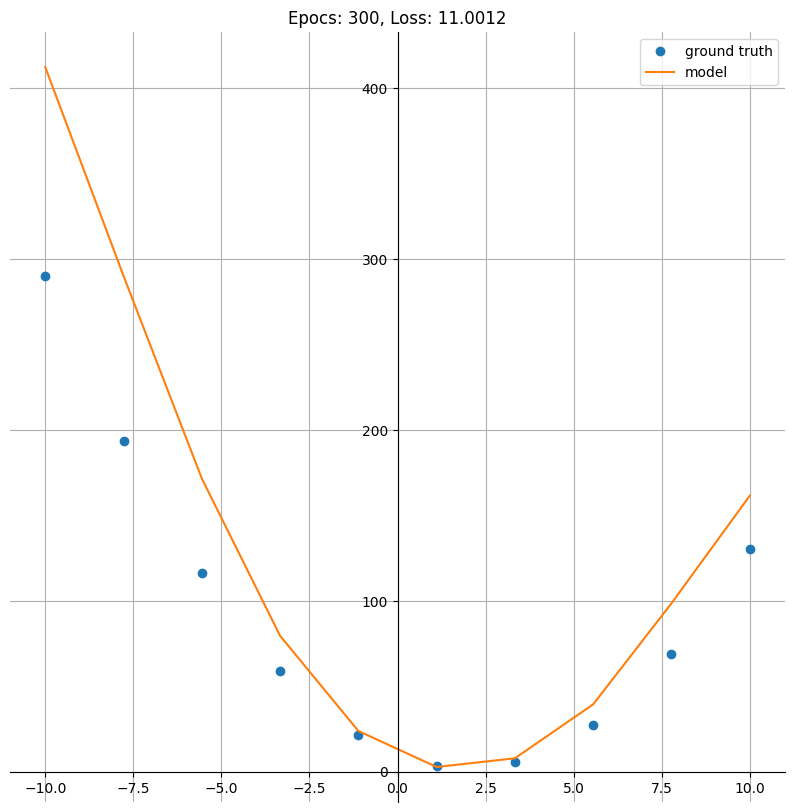

Epoch: 325; Train Loss: 10.345626831054688


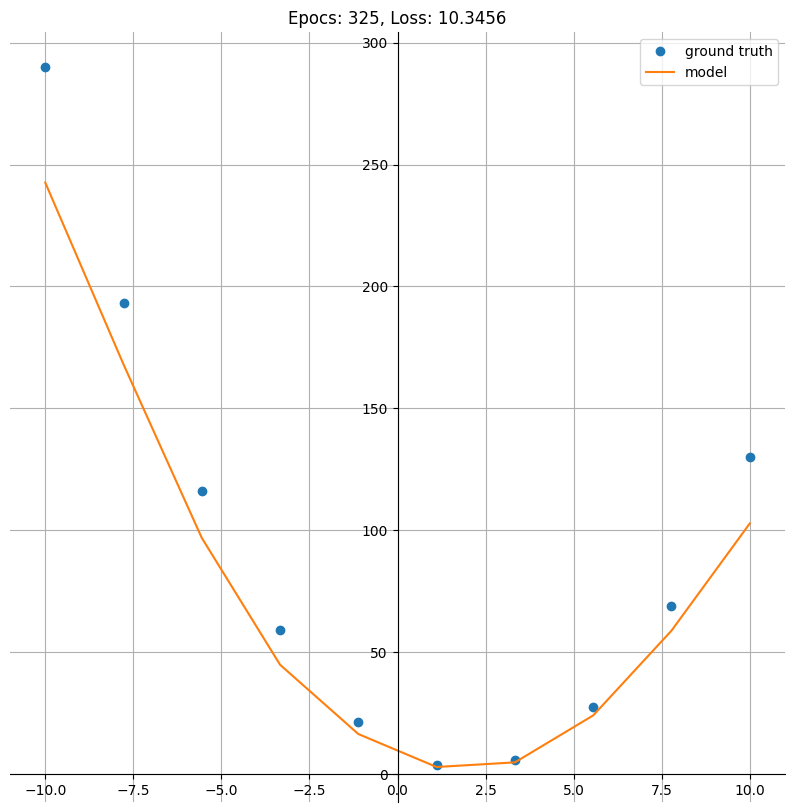

Epoch: 350; Train Loss: 10.055978775024414


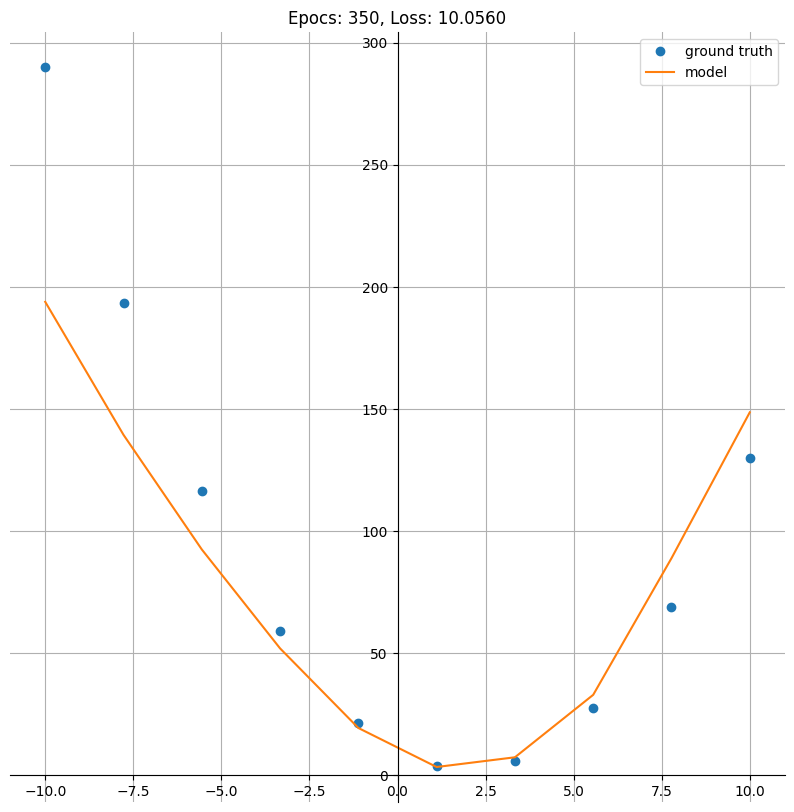

Epoch: 375; Train Loss: 10.274190902709961


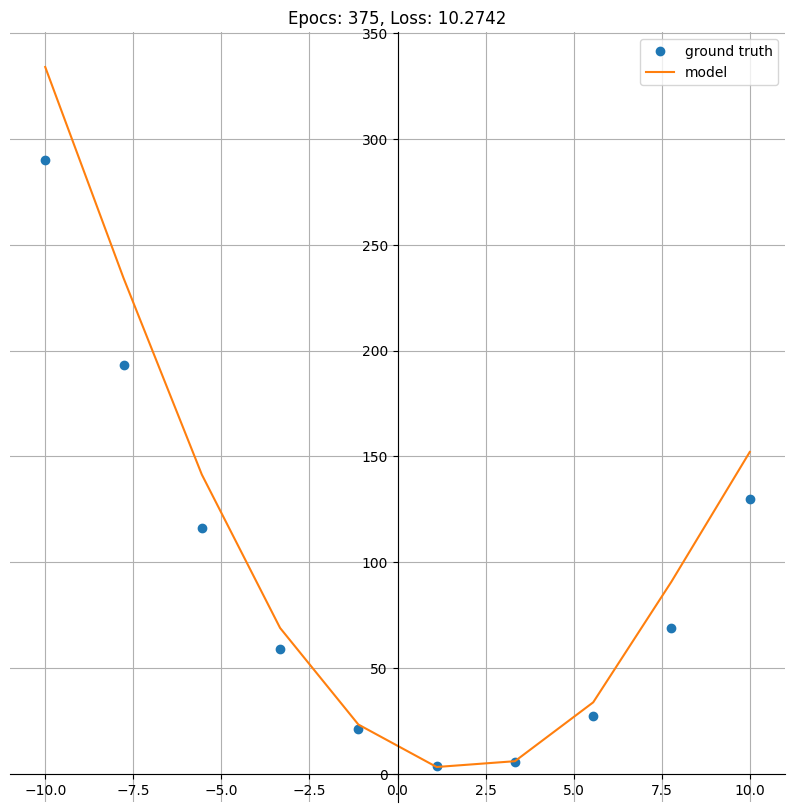

Epoch: 400; Train Loss: 10.597895622253418


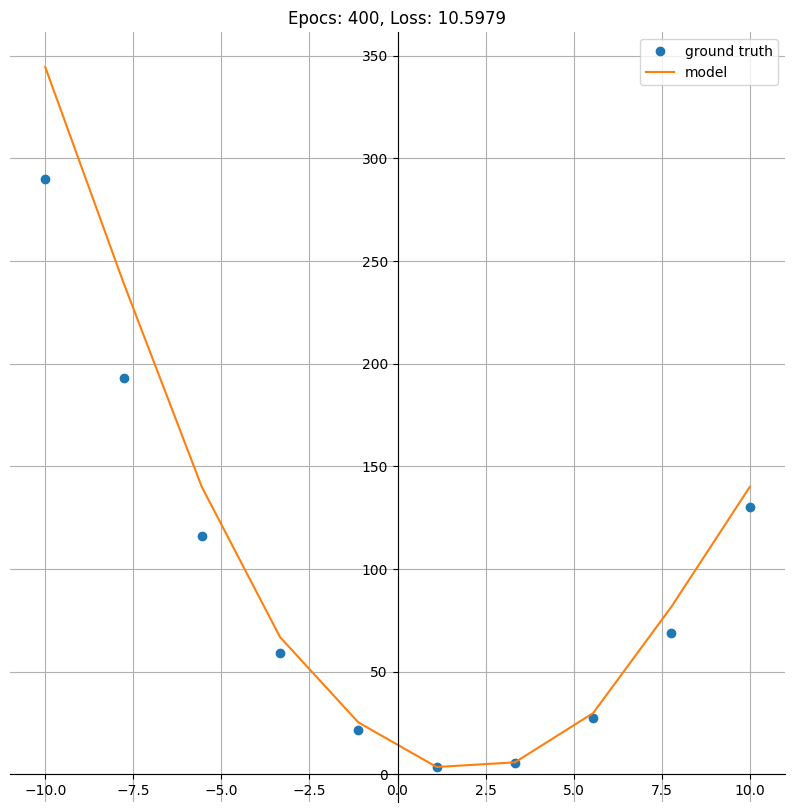

Epoch: 425; Train Loss: 10.32037353515625


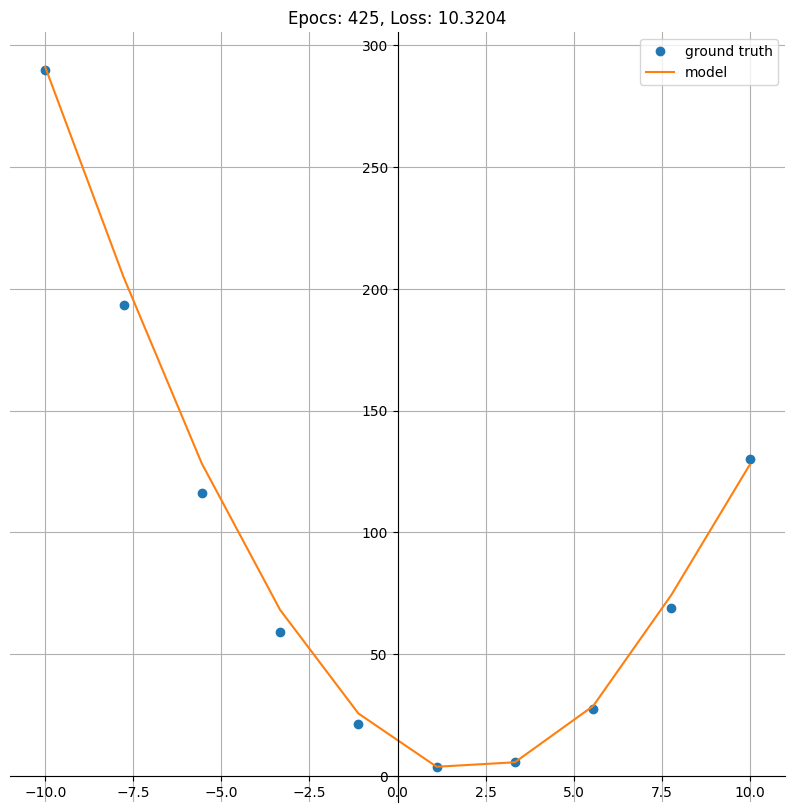

Epoch: 450; Train Loss: 9.392210960388184


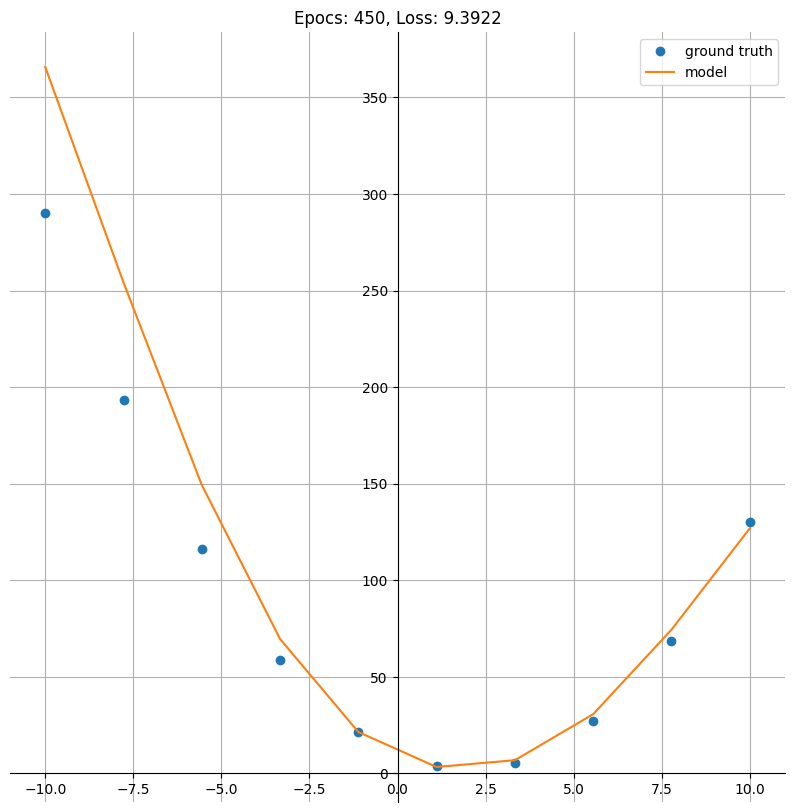

Epoch: 475; Train Loss: 9.970928192138672


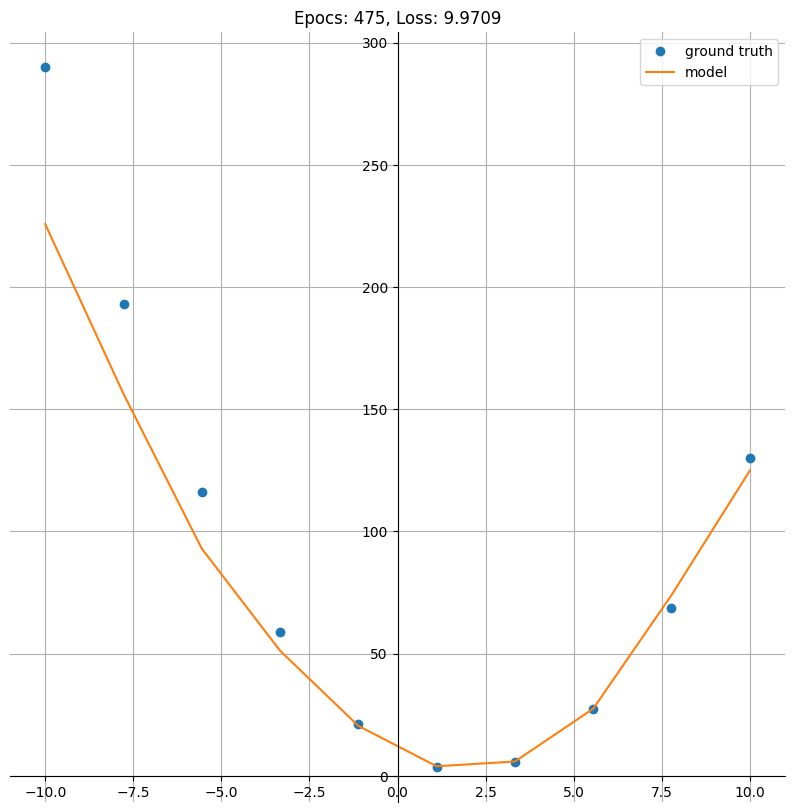

Epoch: 500; Train Loss: 9.164017677307129


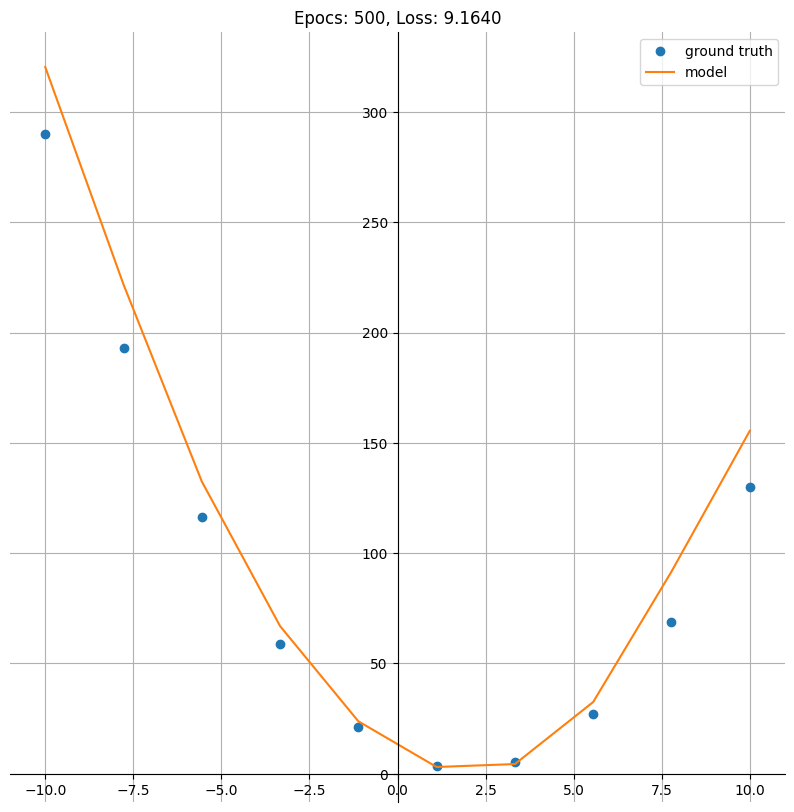

Epoch: 525; Train Loss: 8.778797149658203


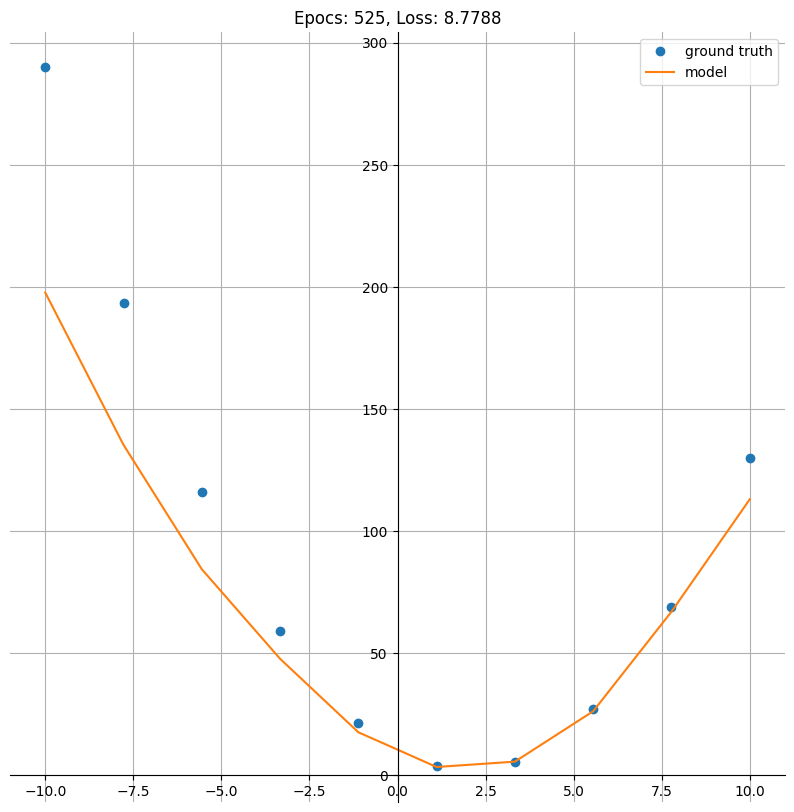

Epoch: 550; Train Loss: 9.138598442077637


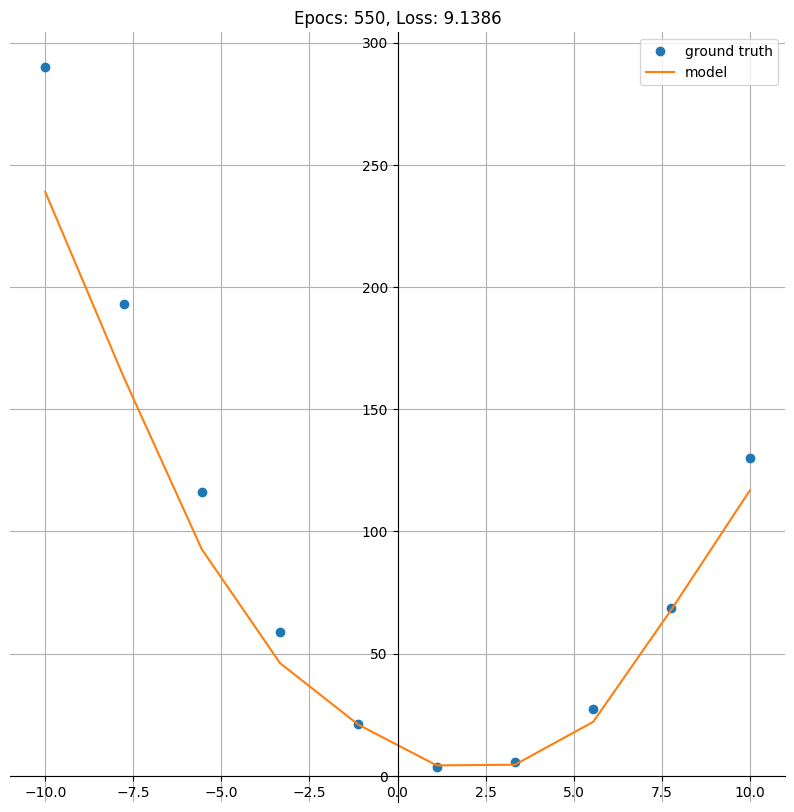

Epoch: 575; Train Loss: 7.98391056060791


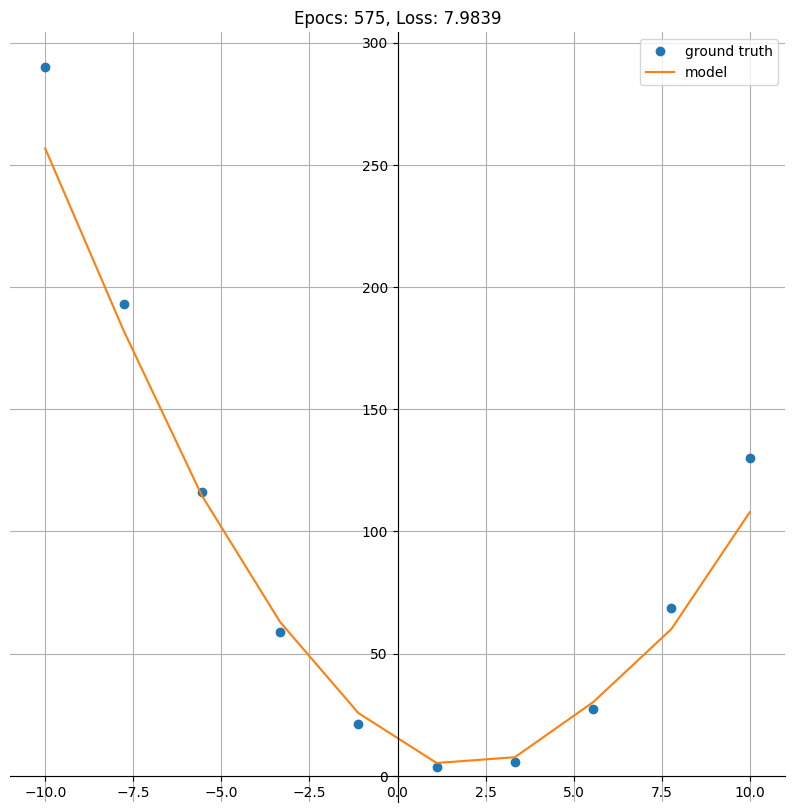

Epoch: 600; Train Loss: 8.465272903442383


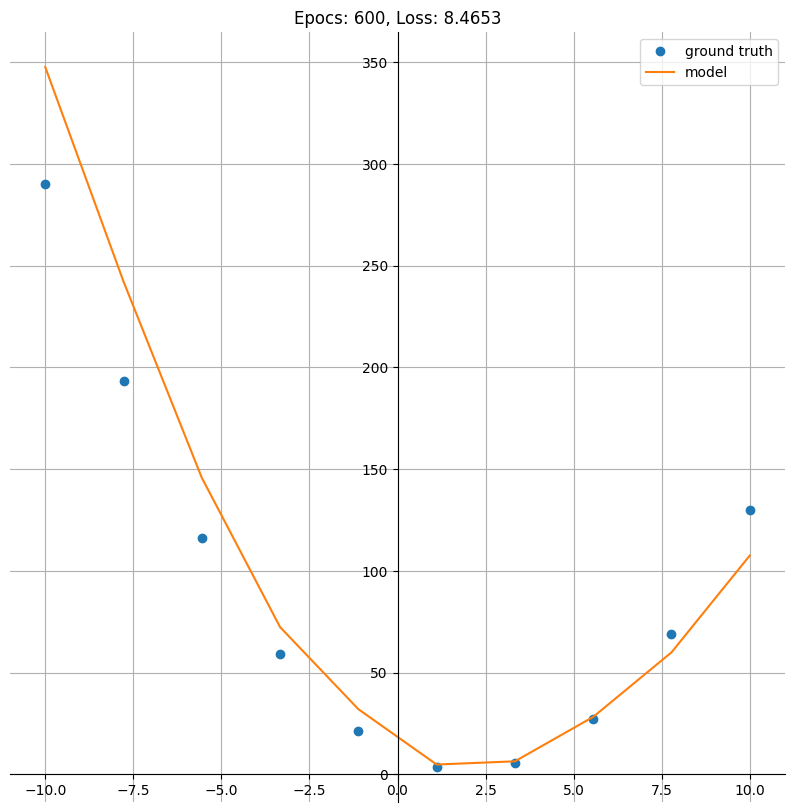

Epoch: 625; Train Loss: 8.02918815612793


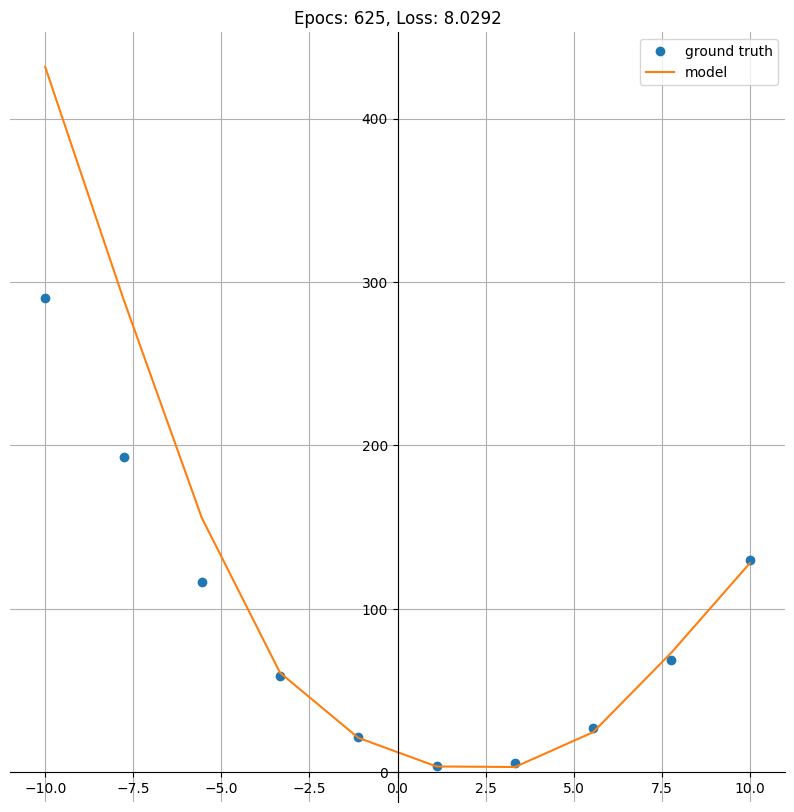

Epoch: 650; Train Loss: 8.493148803710938


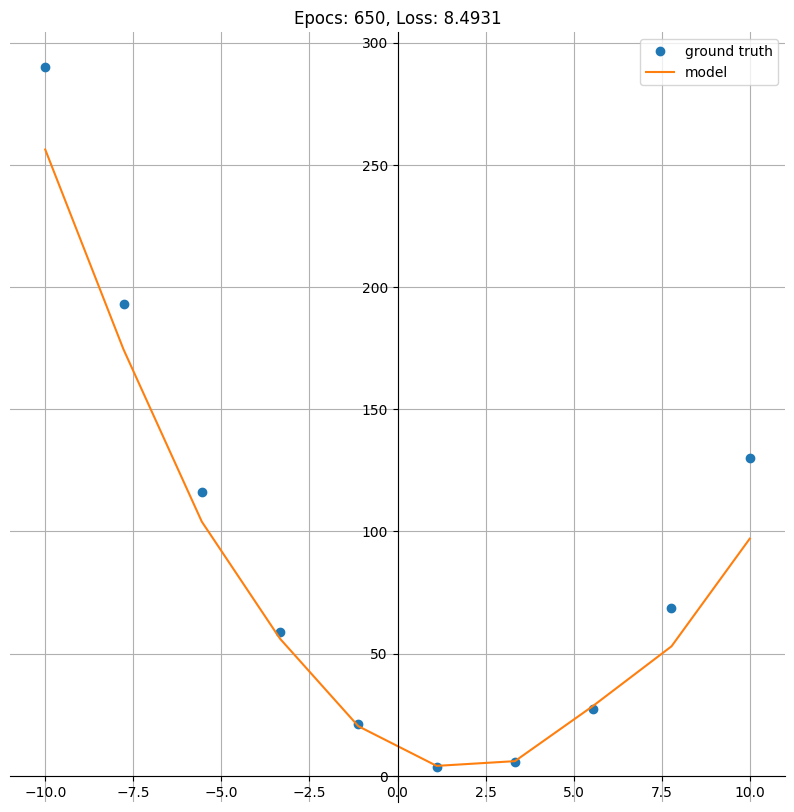

Epoch: 675; Train Loss: 8.256269454956055


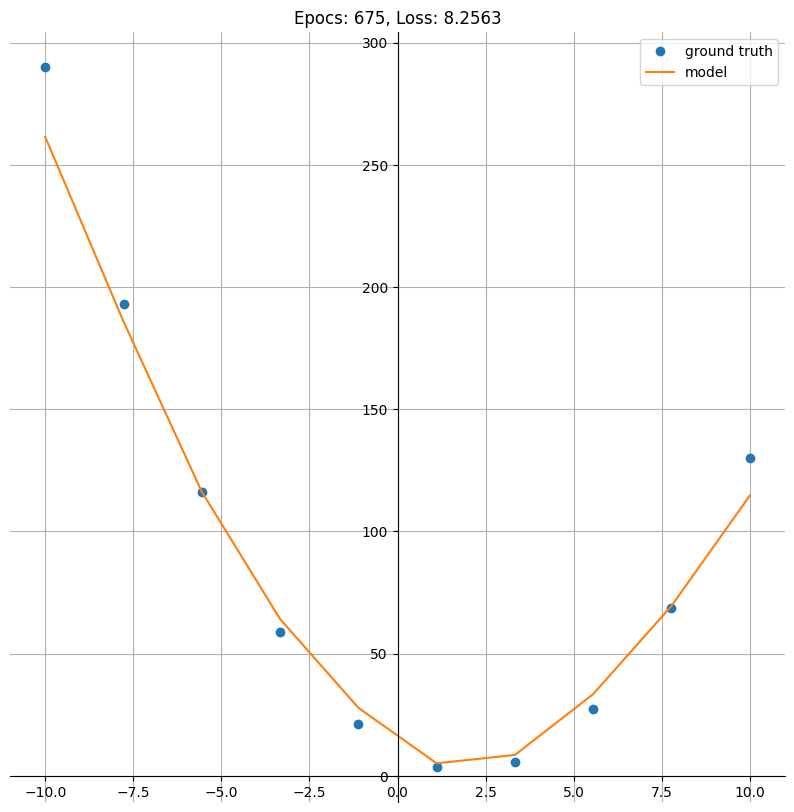

Epoch: 700; Train Loss: 7.767213344573975


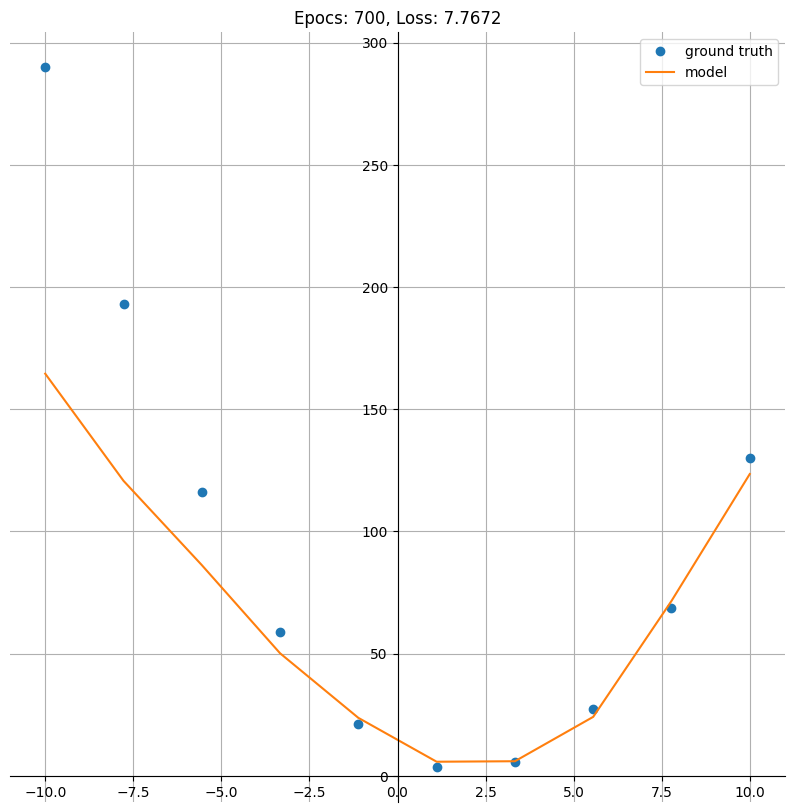

Epoch: 725; Train Loss: 7.6228508949279785


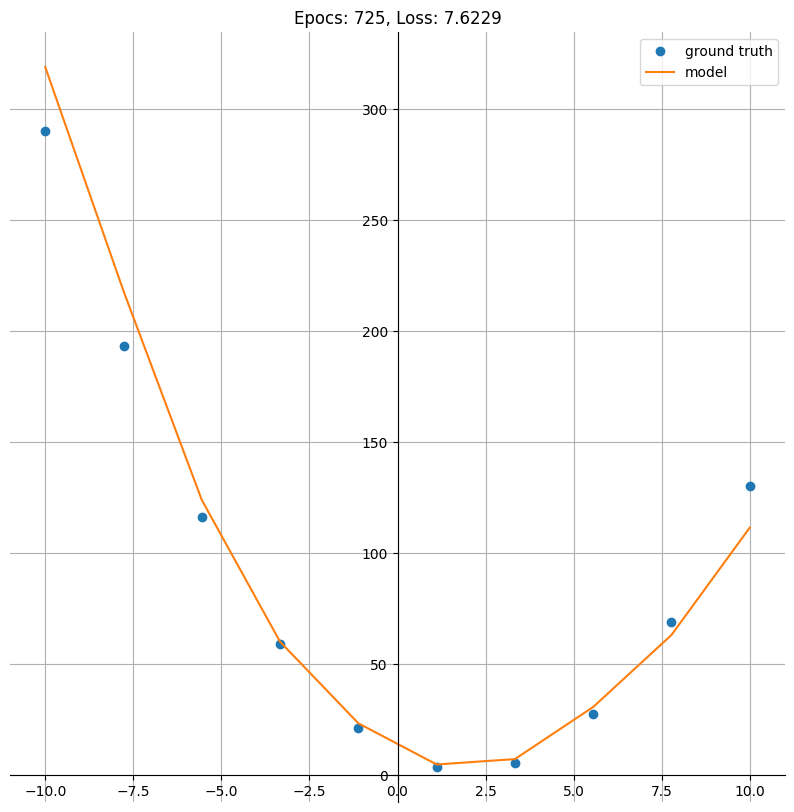

Epoch: 750; Train Loss: 7.730506896972656


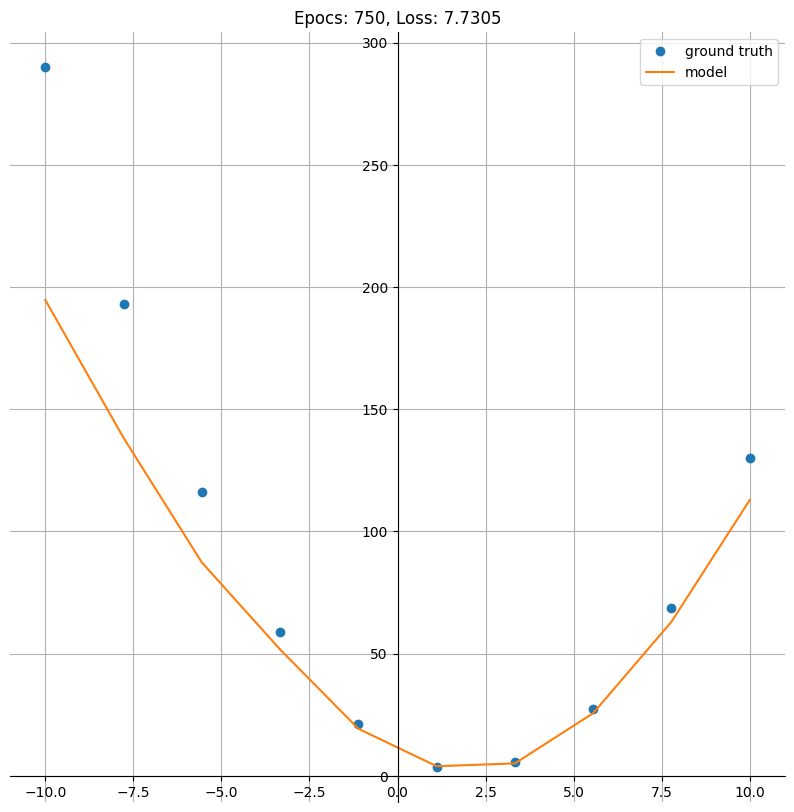

Epoch: 775; Train Loss: 7.6037092208862305


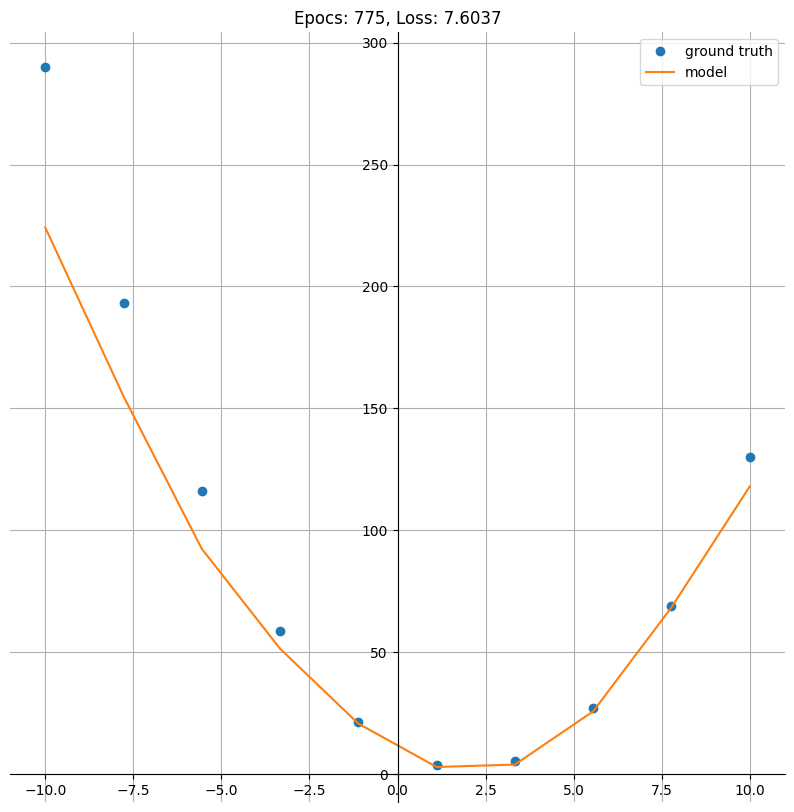

Epoch: 800; Train Loss: 7.793957710266113


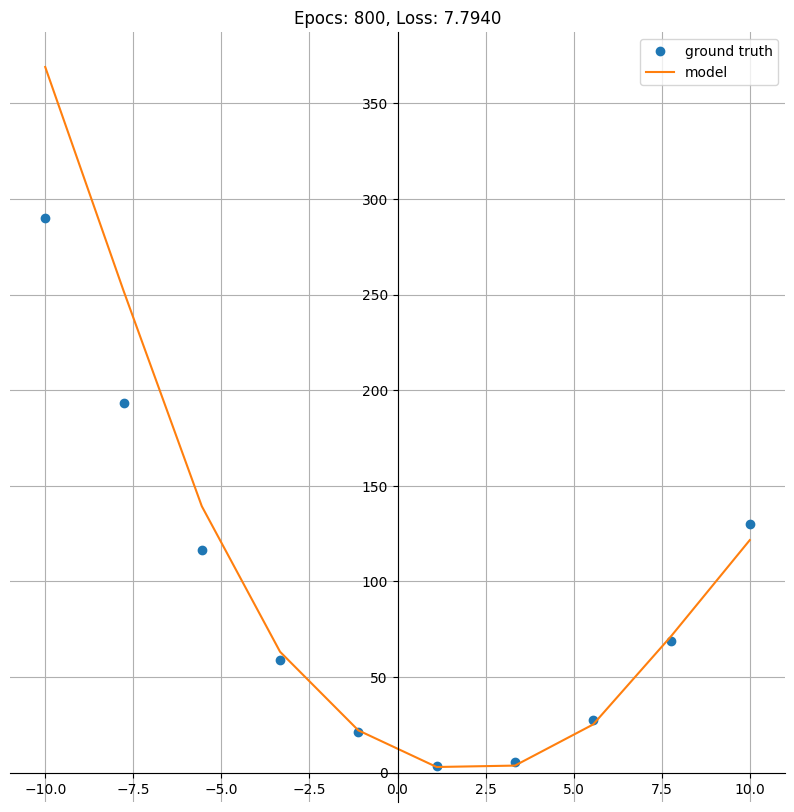

Epoch: 825; Train Loss: 8.160693168640137


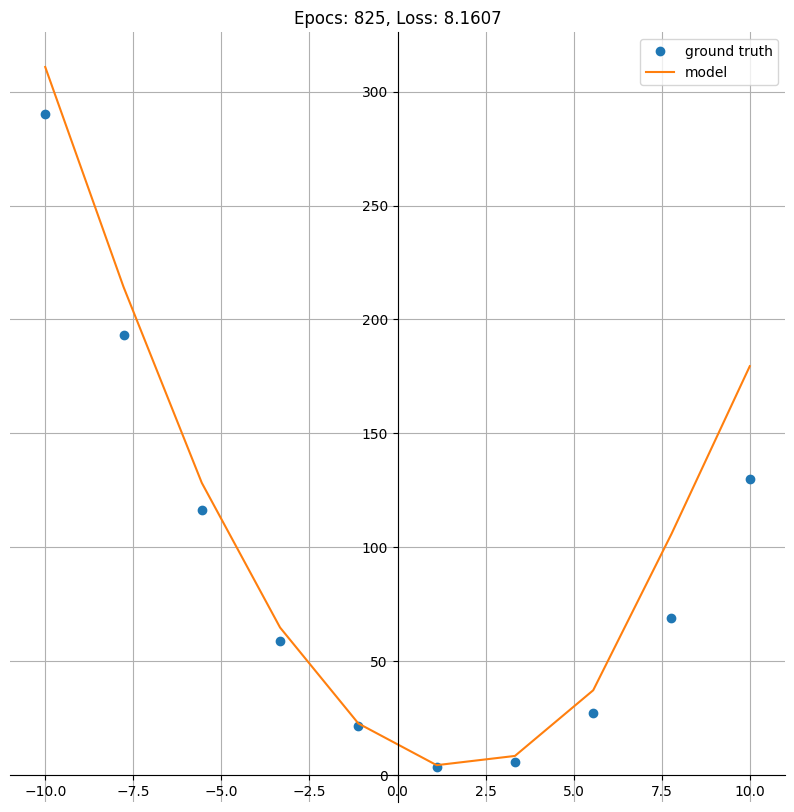

Epoch: 850; Train Loss: 7.705871105194092


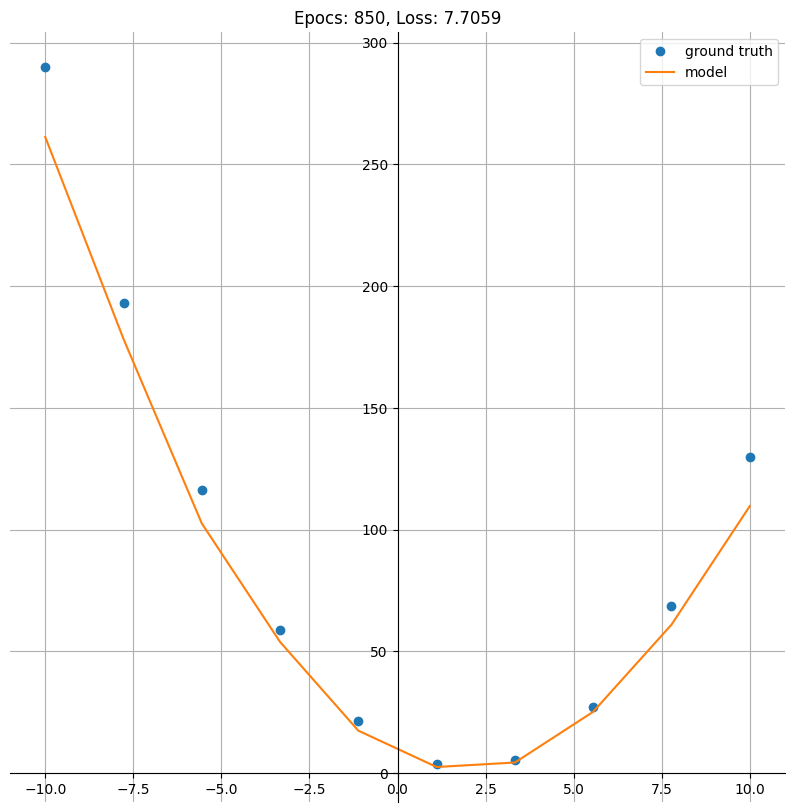

Epoch: 875; Train Loss: 7.6501617431640625


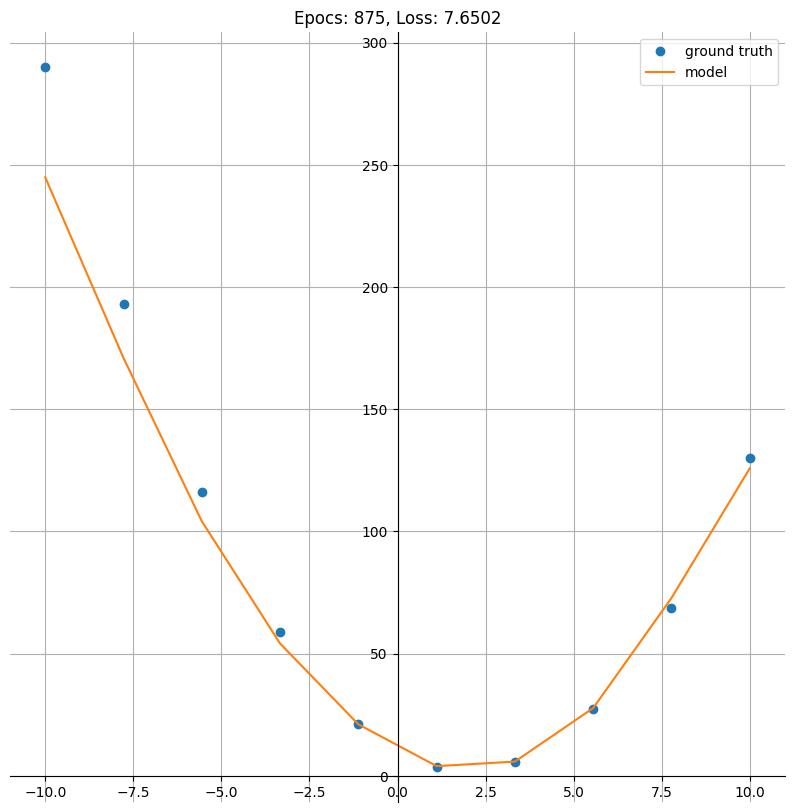

Epoch: 900; Train Loss: 6.923532485961914


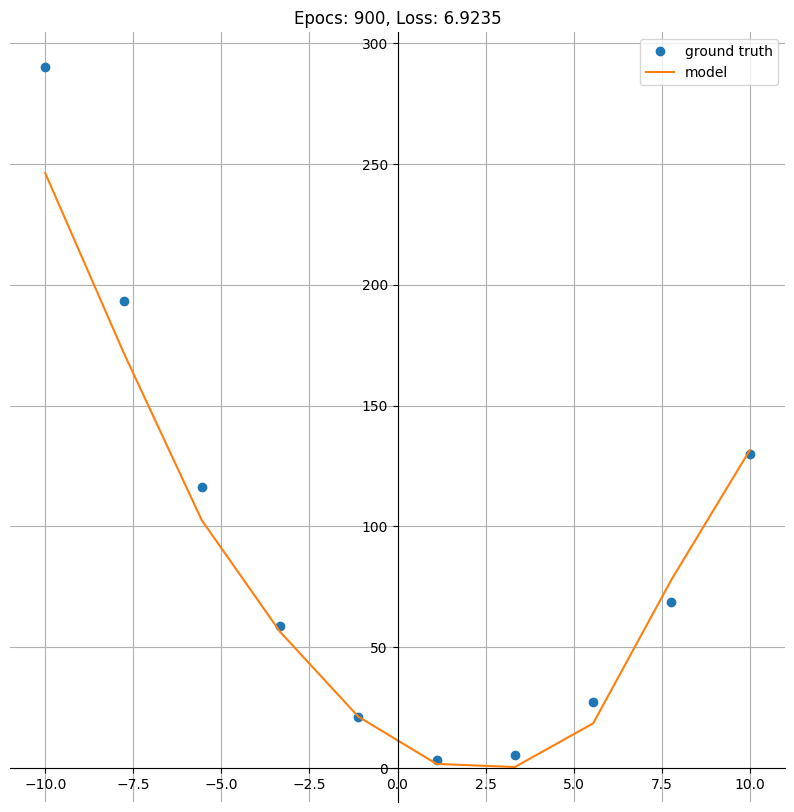

Epoch: 925; Train Loss: 6.843435764312744


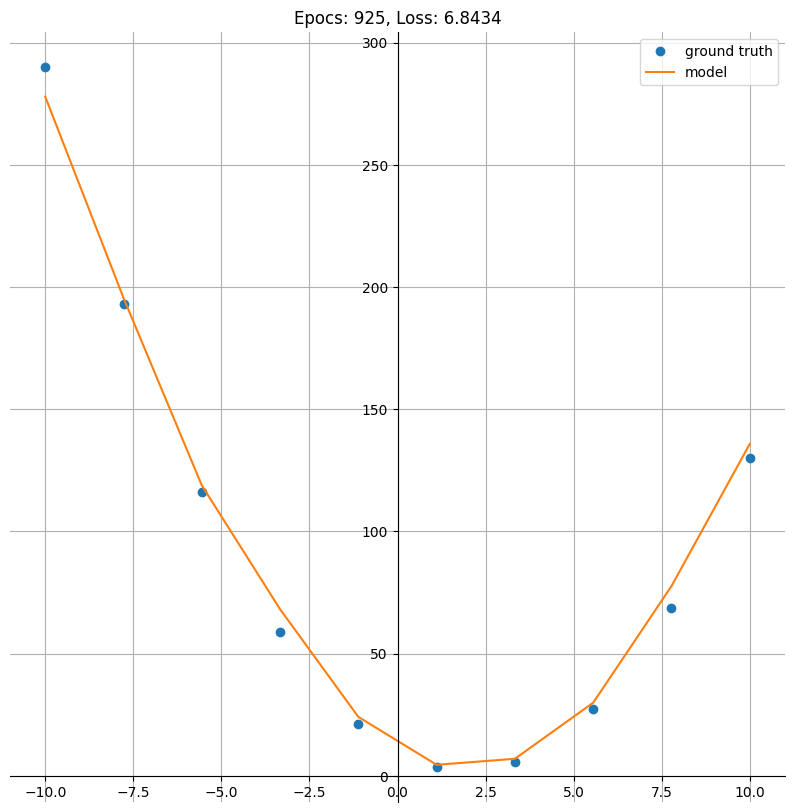

Epoch: 950; Train Loss: 7.400346279144287


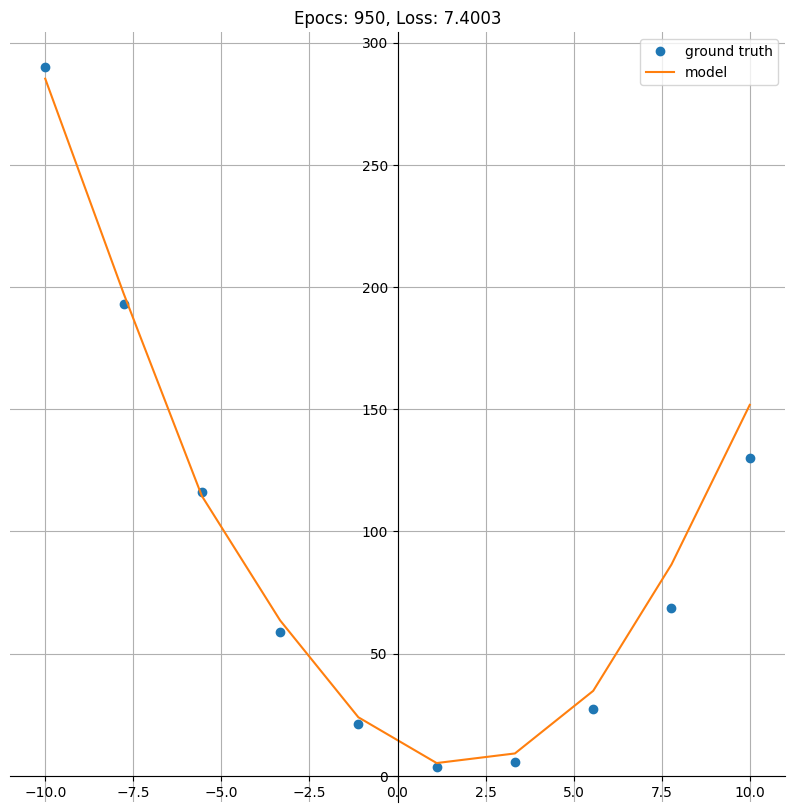

Epoch: 975; Train Loss: 8.346665382385254


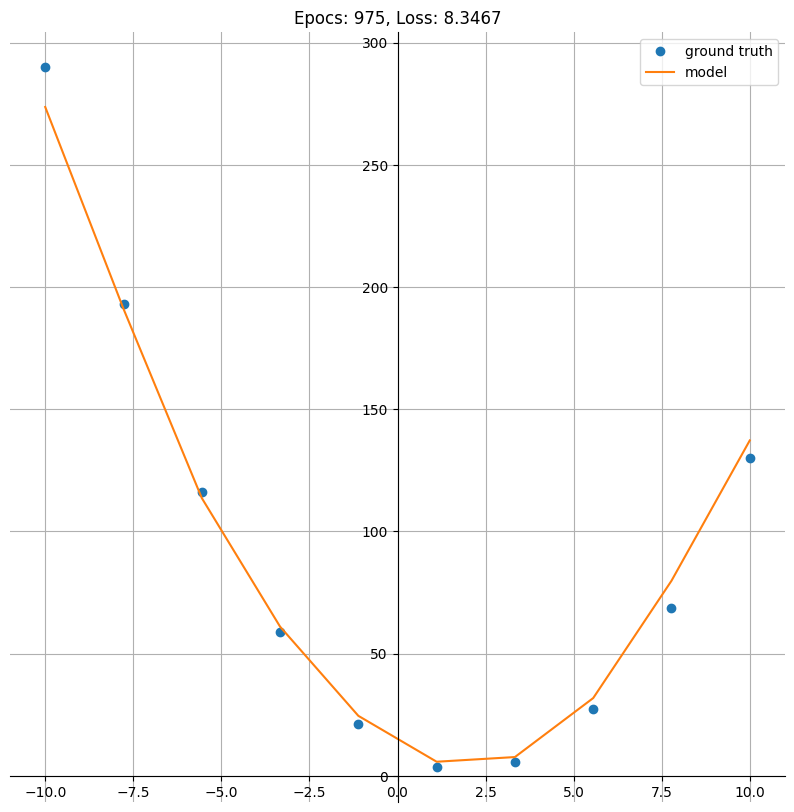

Epoch: 1000; Train Loss: 7.149957180023193


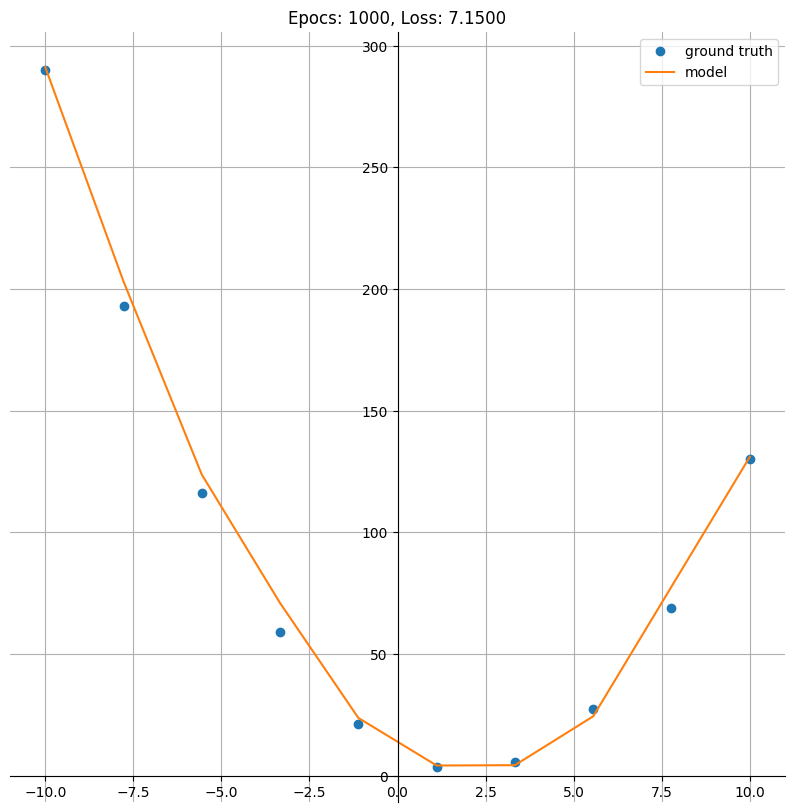

Test Loss: 5.389365196228027


In [50]:
epochs = 1001

# Let''s make a Gif of the training
filename_output = "./line_approximation_mlp_2.gif"
writer = imageio.get_writer(filename_output, mode='I', duration=0.3)

for t in range(epochs):
  train_loss = train(model, train_dataloader, lossfunc, optimizer)
  if t % 25 == 0:
    print(f"Epoch: {t}; Train Loss: {train_loss}")
    image = plot_comparison(line, model, epoc=t, loss=train_loss)
    # appending to gif
    writer.append_data(image)

test_loss = test(model, test_dataloader, lossfunc)
print(f"Test Loss: {test_loss}")
writer.close()

In this experiment, the MLP had considerable success in learing the $f(x)$ function behavior as seen in the graphs above. But after some brute fitting, the model strugled to find a fine tunning, making the mean test loss fluctuate considerably.

### Experiment 3

In this experiment, the L1Loss function was mantained and the learning rate was reduced to 0.0001 to see if the MLP could perform the fine tunning mencioned previously. 2001 training epochs were performed.

In [51]:
model = MultiLayerNetwork().to(device)

In [52]:
# Loss Function: Mean Squared Error
lossfunc = nn.L1Loss()

# SGD = Stochastic Gradient Descent
optimizer = torch.optim.SGD(model.parameters(), lr=1e-4)

Epoch: 0; Train Loss: 70.21043395996094


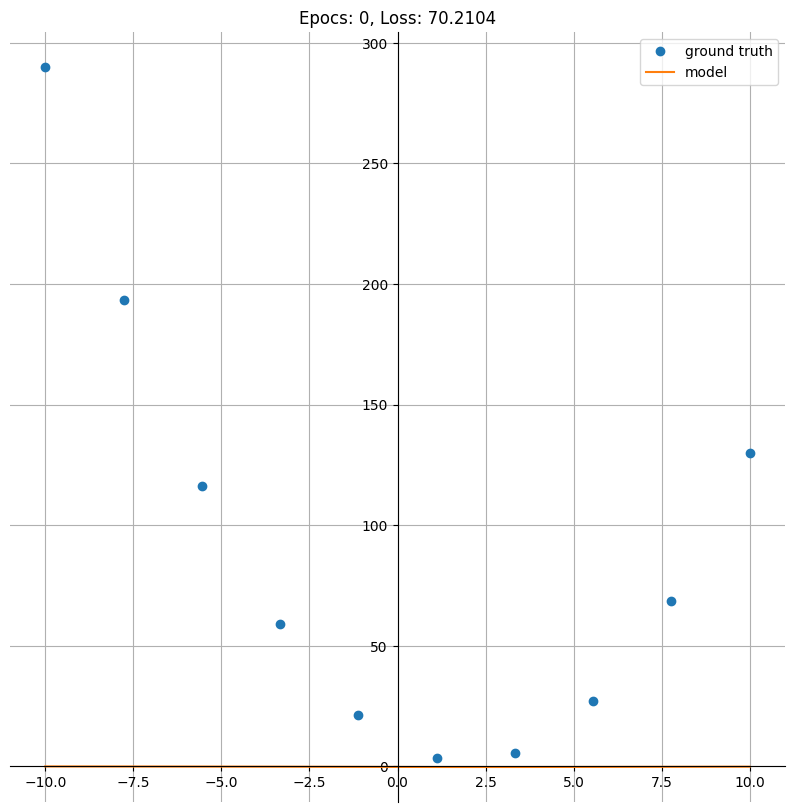

Epoch: 25; Train Loss: 70.08680725097656


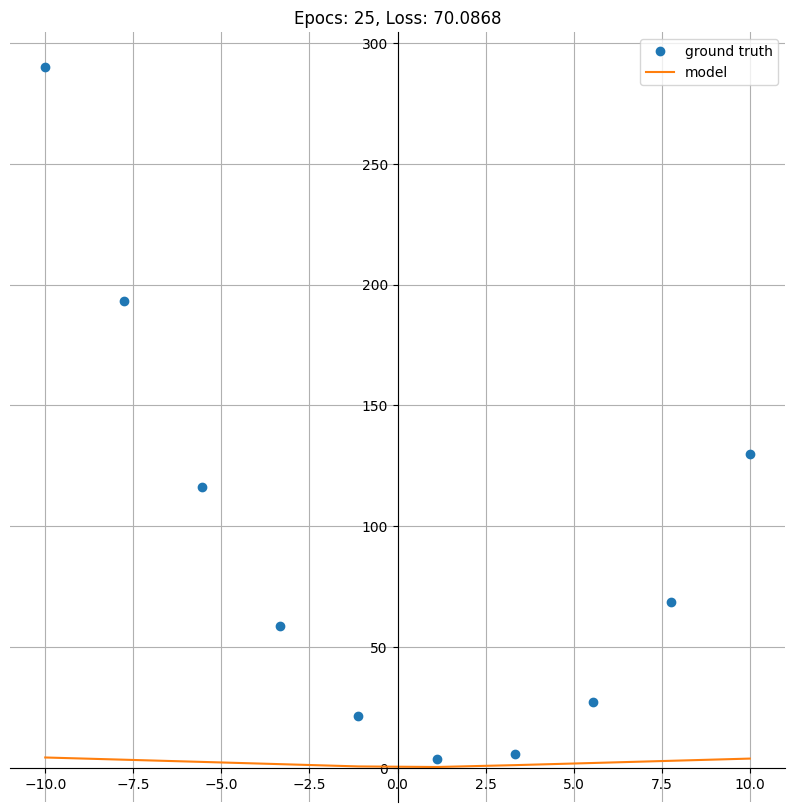

Epoch: 50; Train Loss: 62.667091369628906


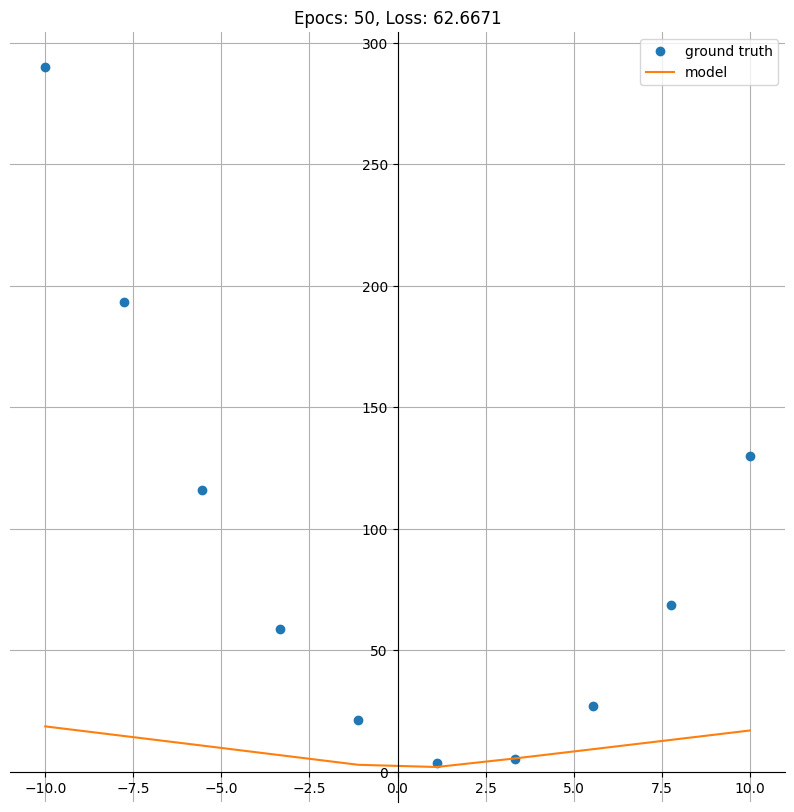

Epoch: 75; Train Loss: 26.622648239135742


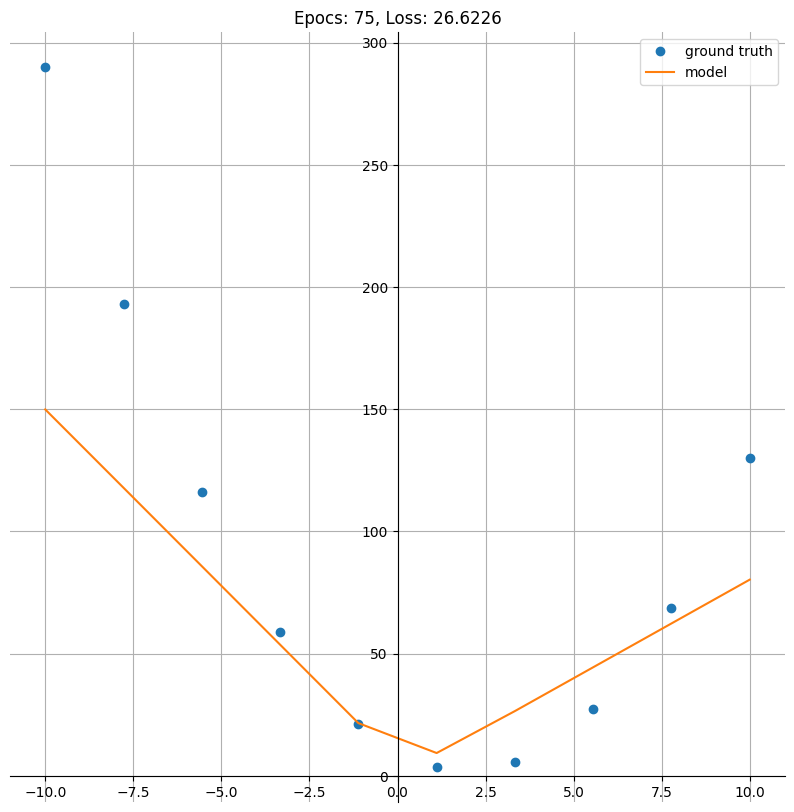

Epoch: 100; Train Loss: 15.963854789733887


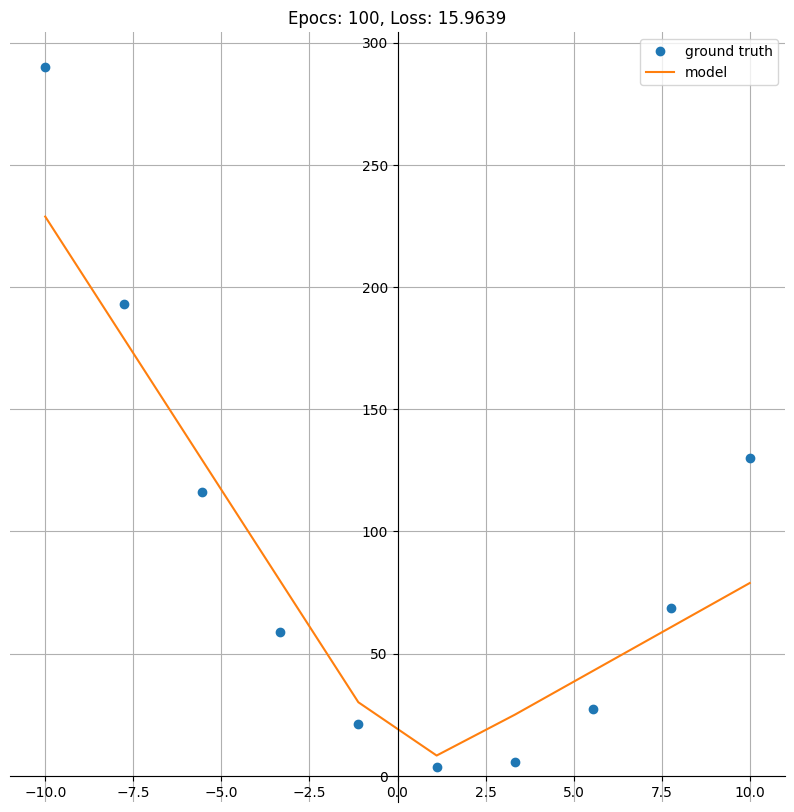

Epoch: 125; Train Loss: 15.438693046569824


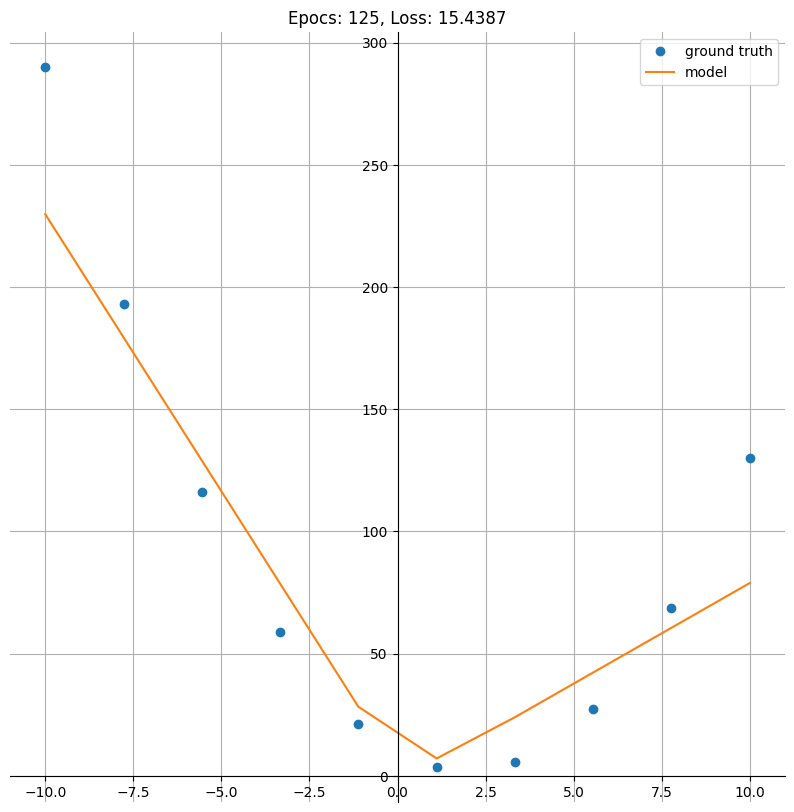

Epoch: 150; Train Loss: 14.89731216430664


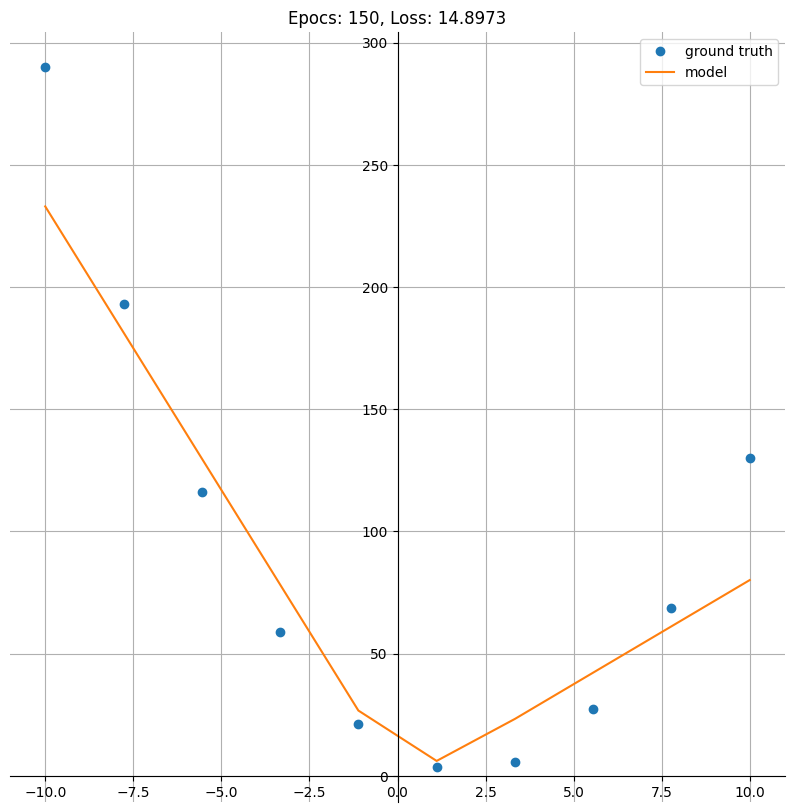

Epoch: 175; Train Loss: 14.413528442382812


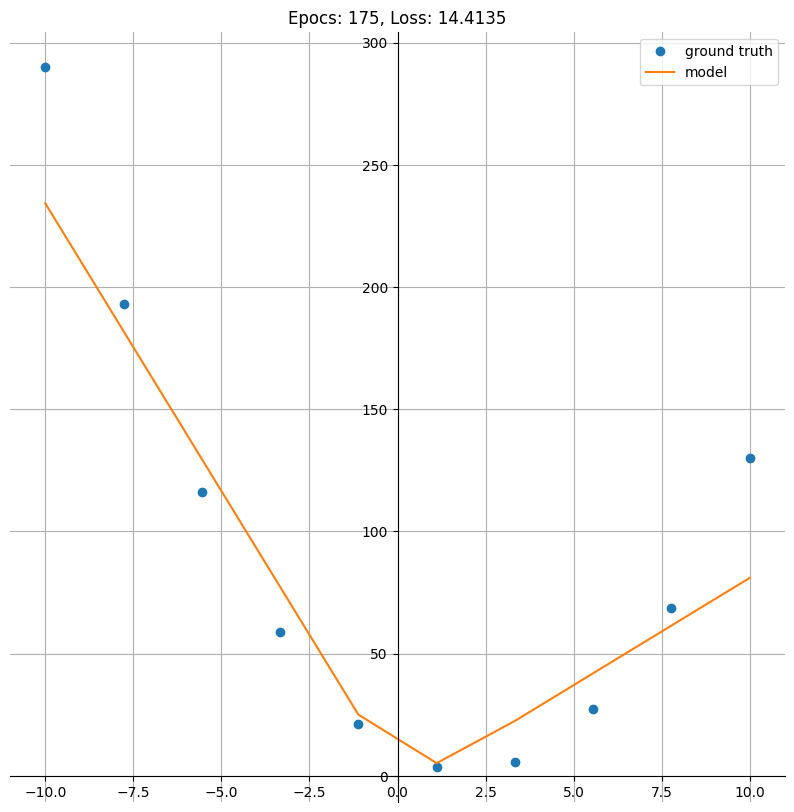

Epoch: 200; Train Loss: 13.81586742401123


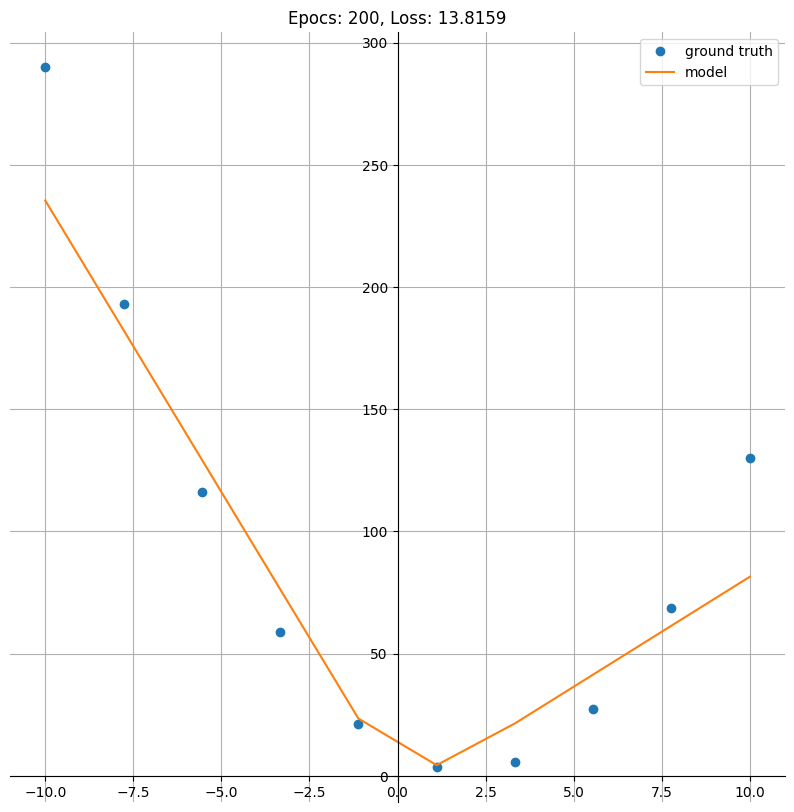

Epoch: 225; Train Loss: 13.353129386901855


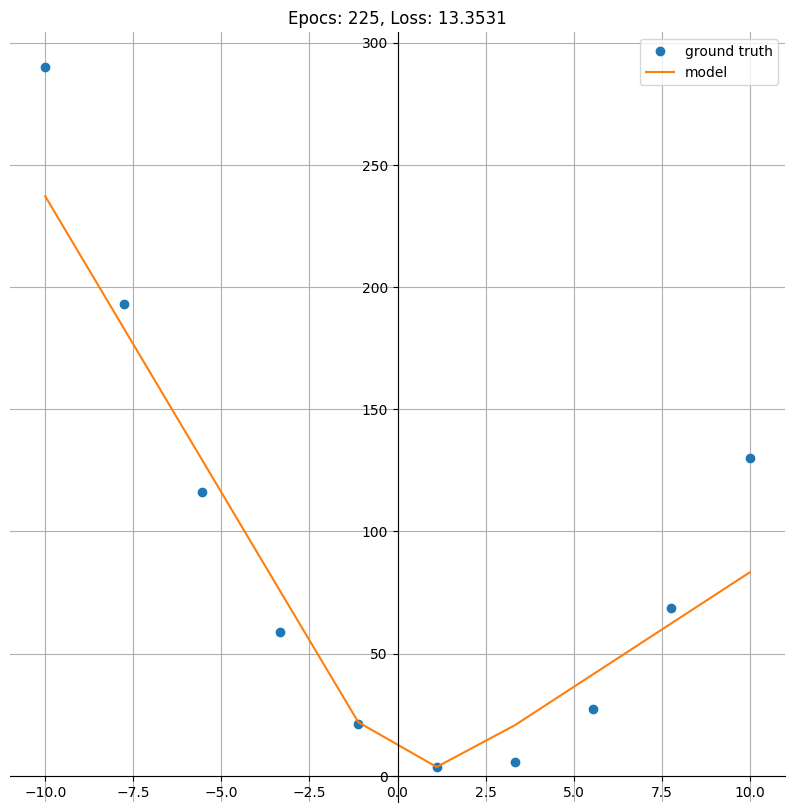

Epoch: 250; Train Loss: 12.99828815460205


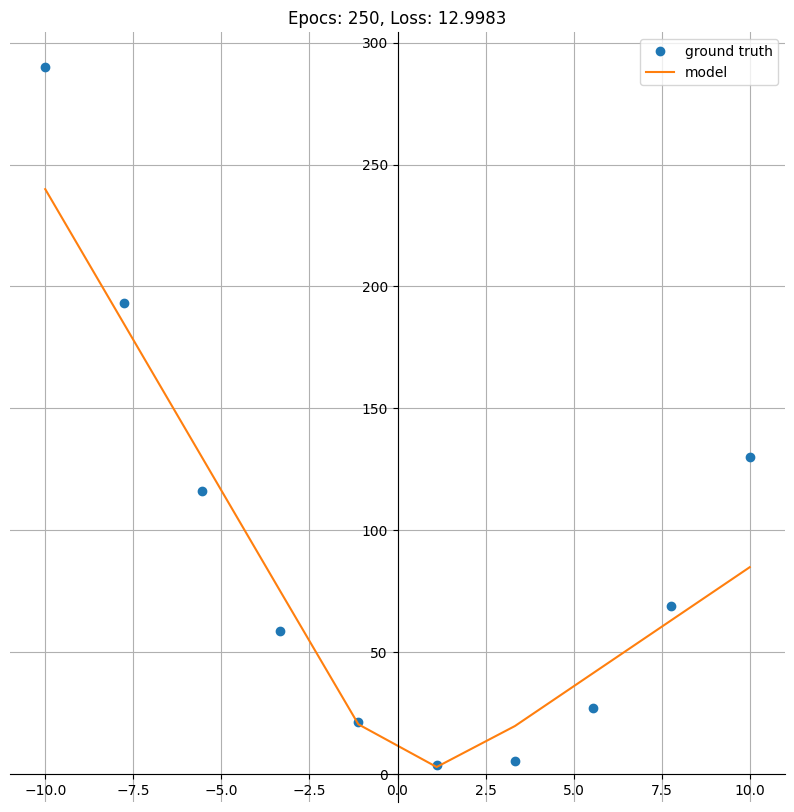

Epoch: 275; Train Loss: 12.467967987060547


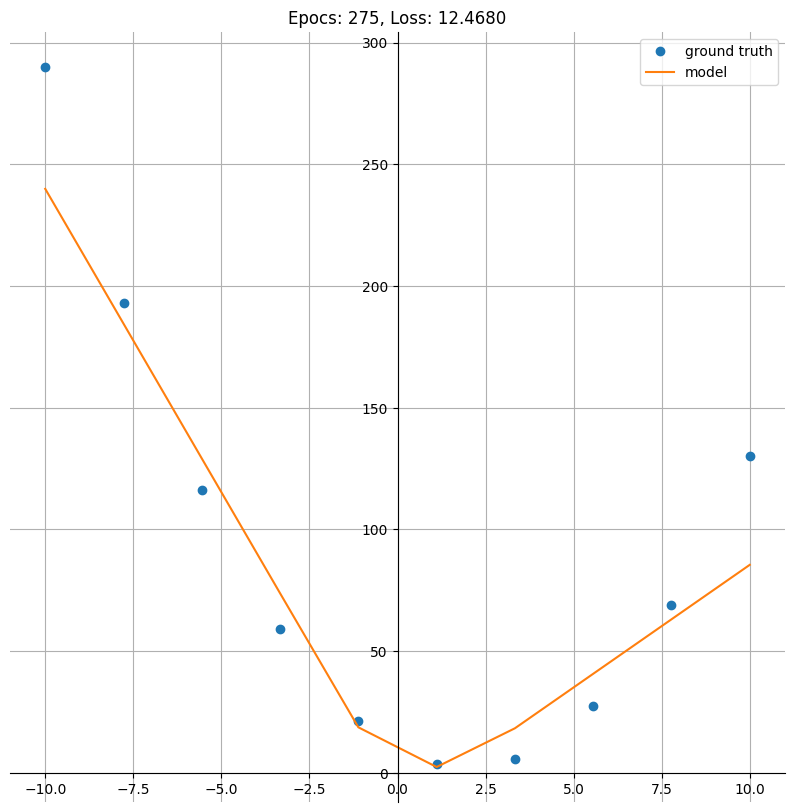

Epoch: 300; Train Loss: 11.835670471191406


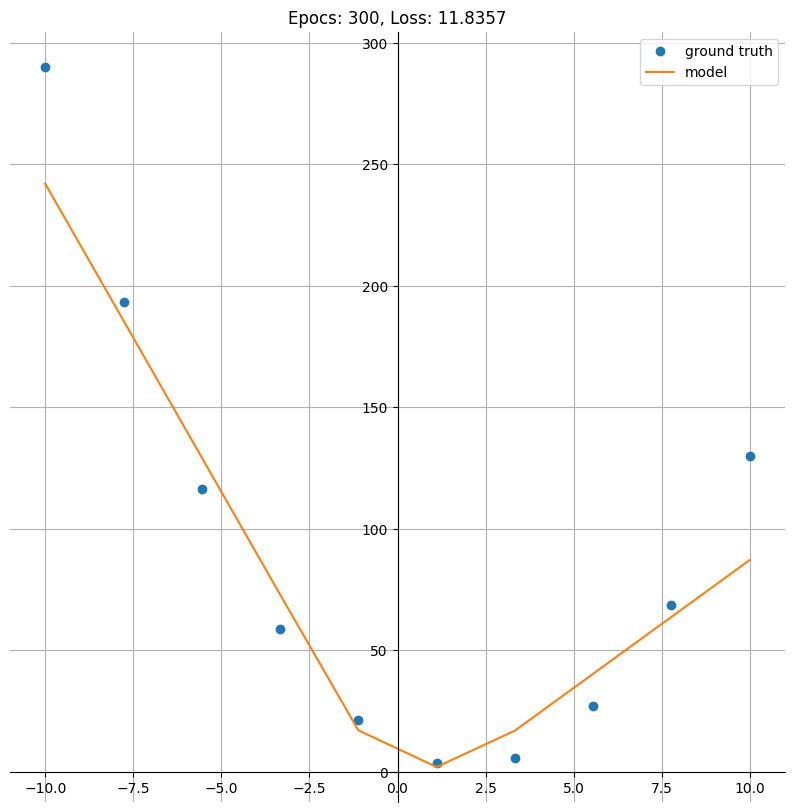

Epoch: 325; Train Loss: 11.247851371765137


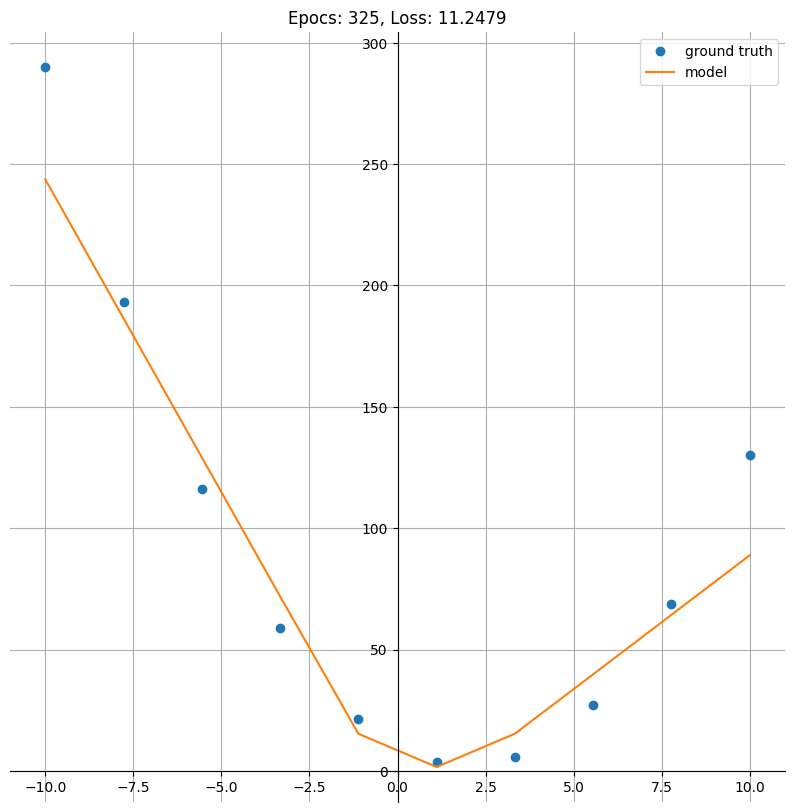

Epoch: 350; Train Loss: 10.599421501159668


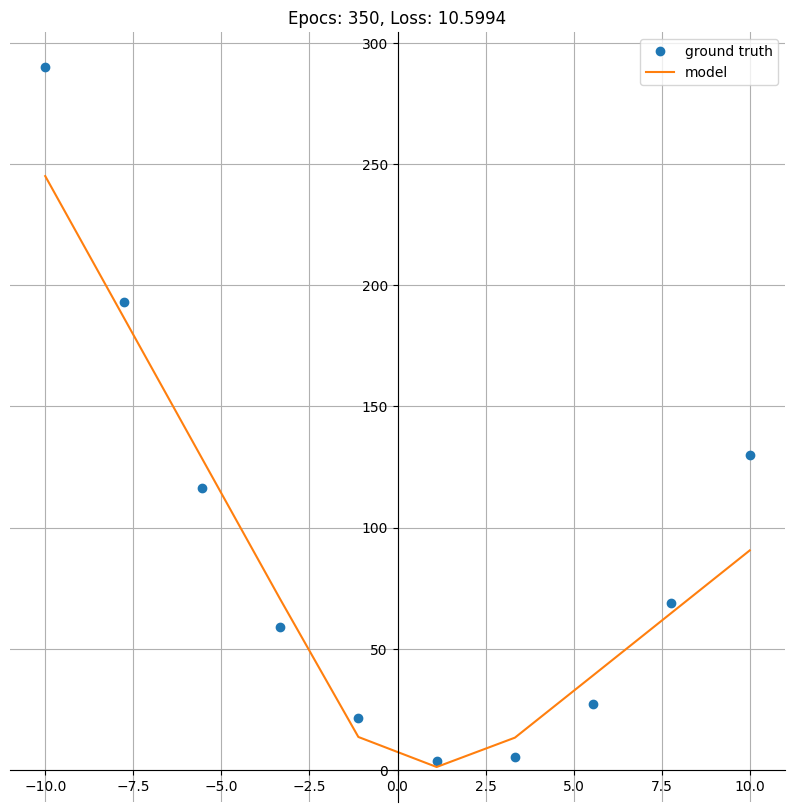

Epoch: 375; Train Loss: 9.886088371276855


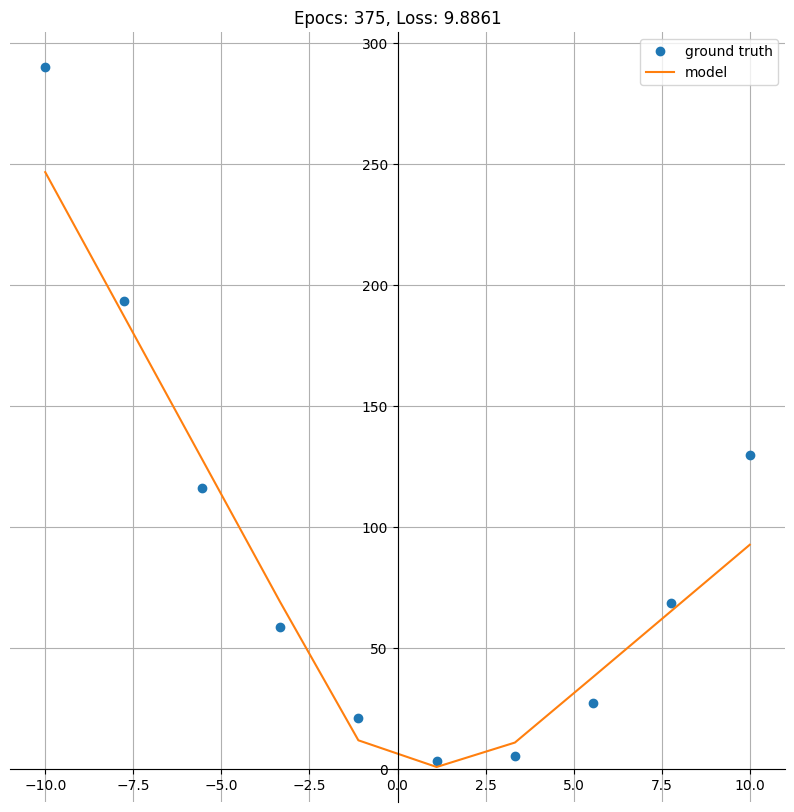

Epoch: 400; Train Loss: 9.278115272521973


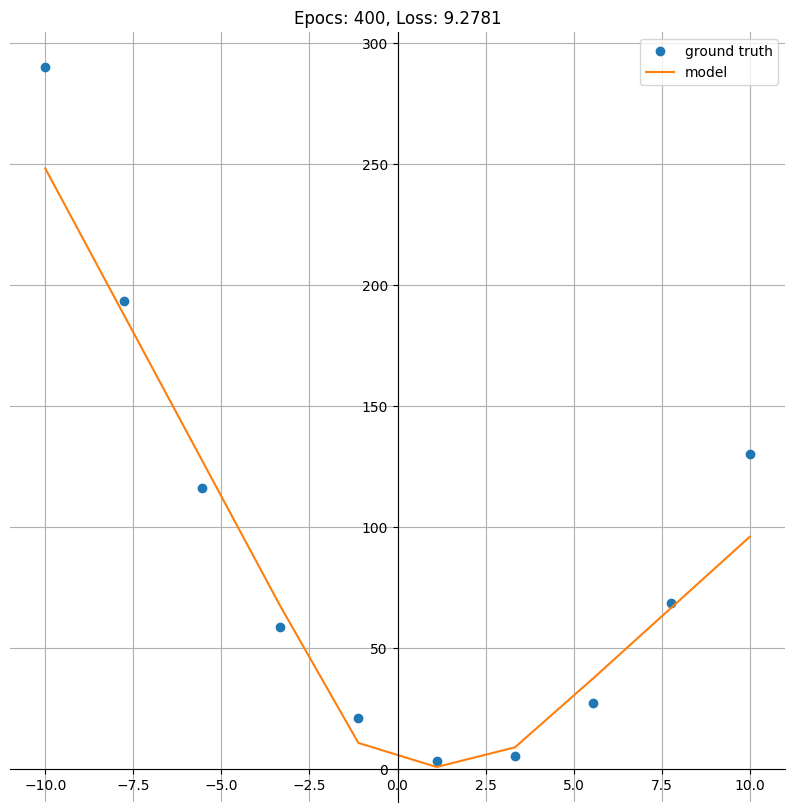

Epoch: 425; Train Loss: 8.535740852355957


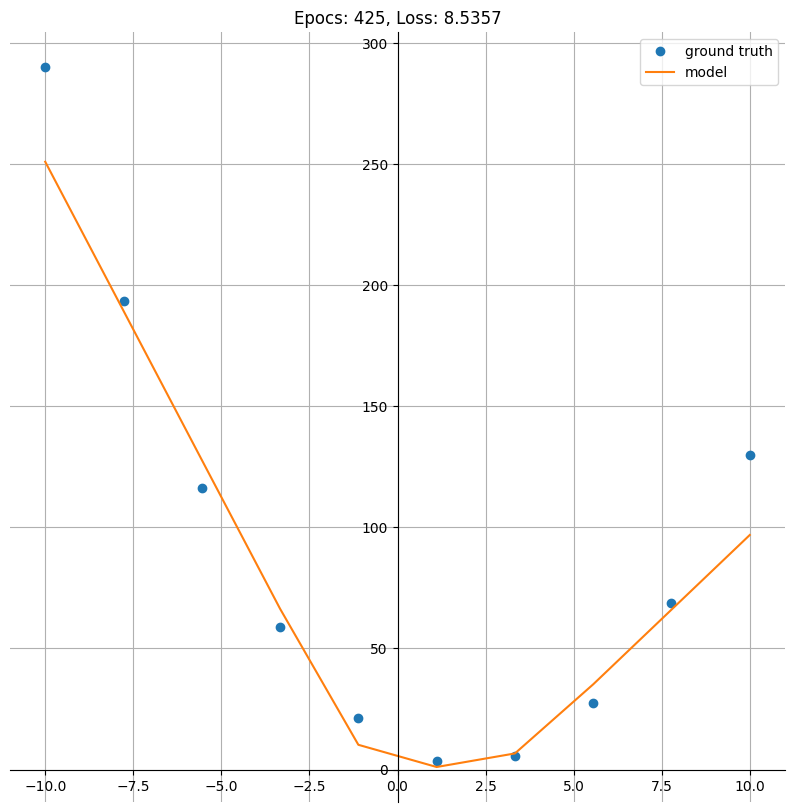

Epoch: 450; Train Loss: 7.544844150543213


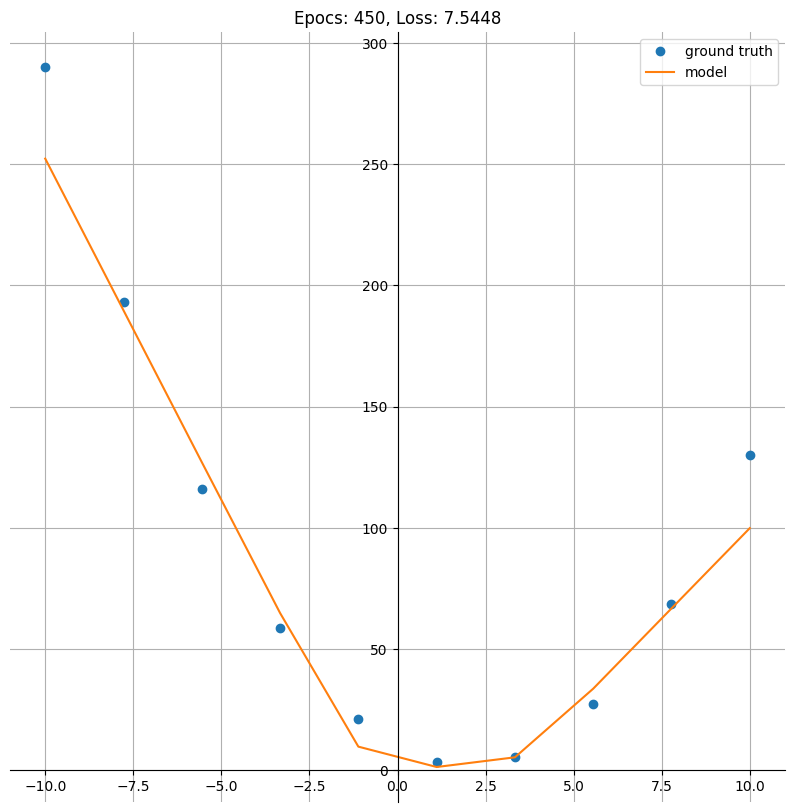

Epoch: 475; Train Loss: 6.900579929351807


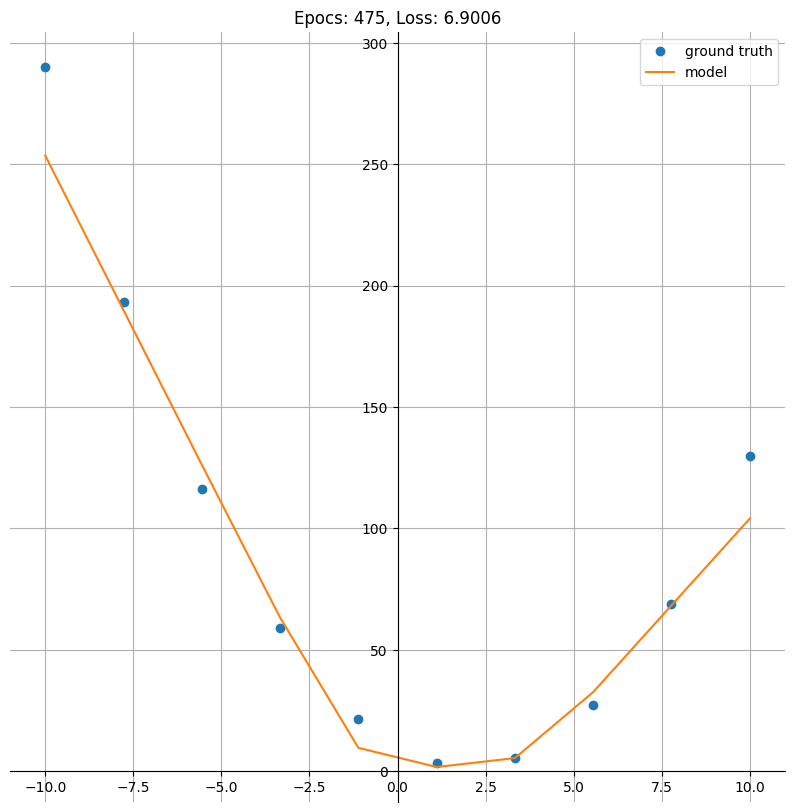

Epoch: 500; Train Loss: 6.289655685424805


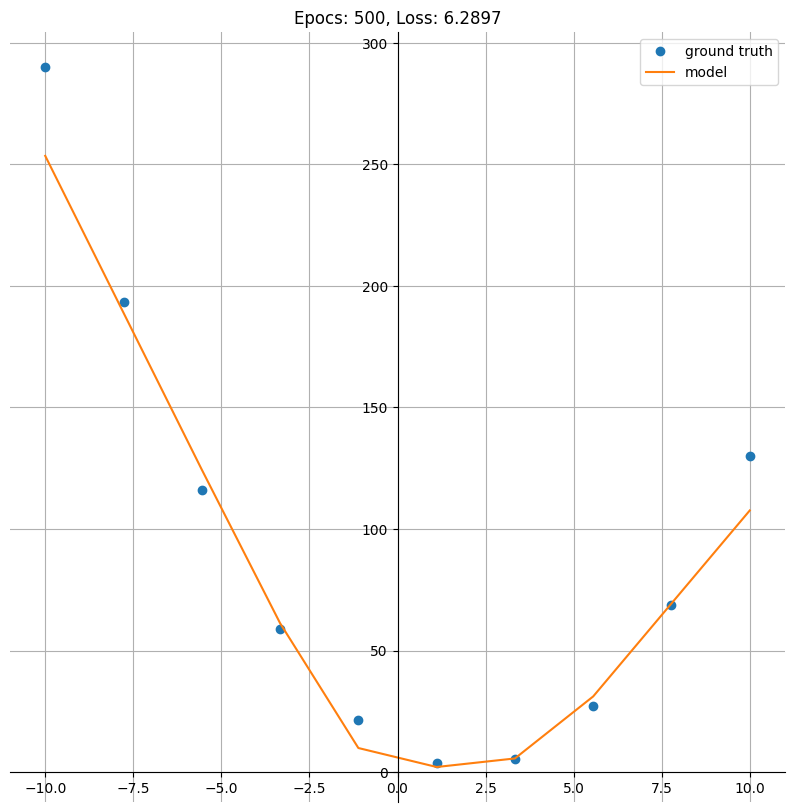

Epoch: 525; Train Loss: 5.501434803009033


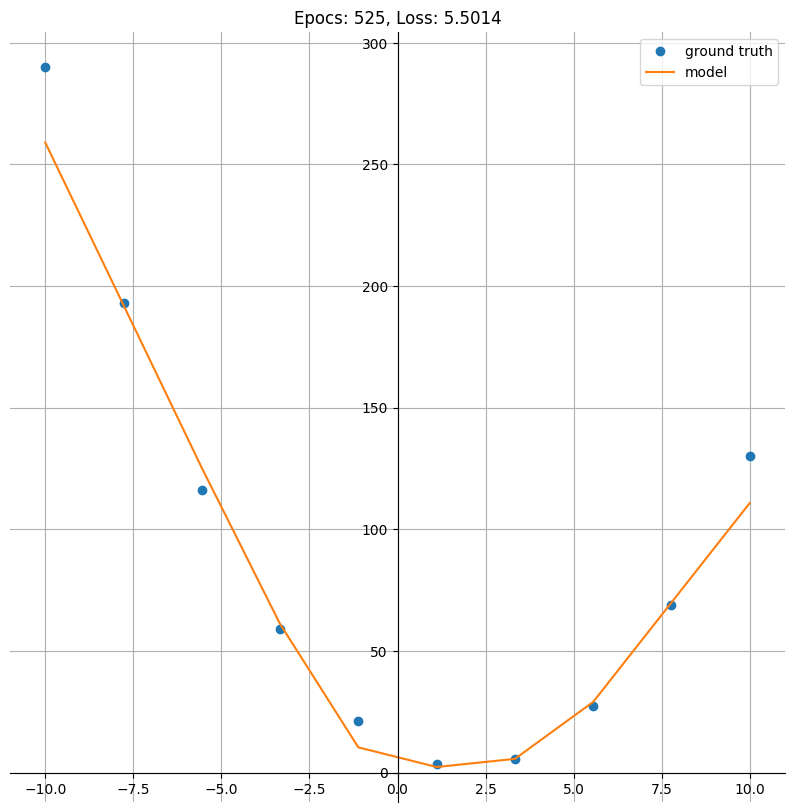

Epoch: 550; Train Loss: 4.740380764007568


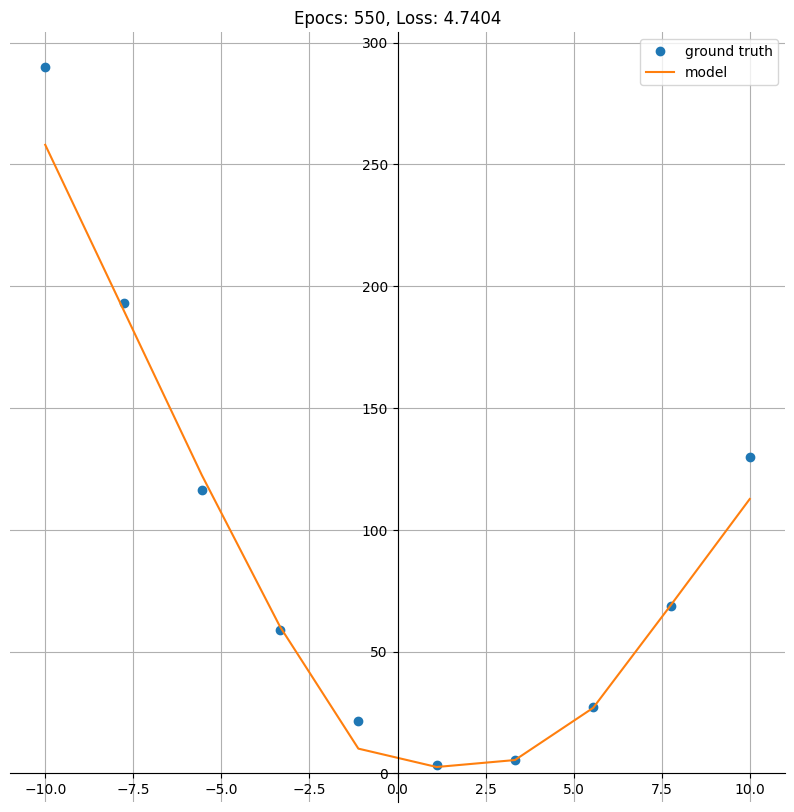

Epoch: 575; Train Loss: 4.222026348114014


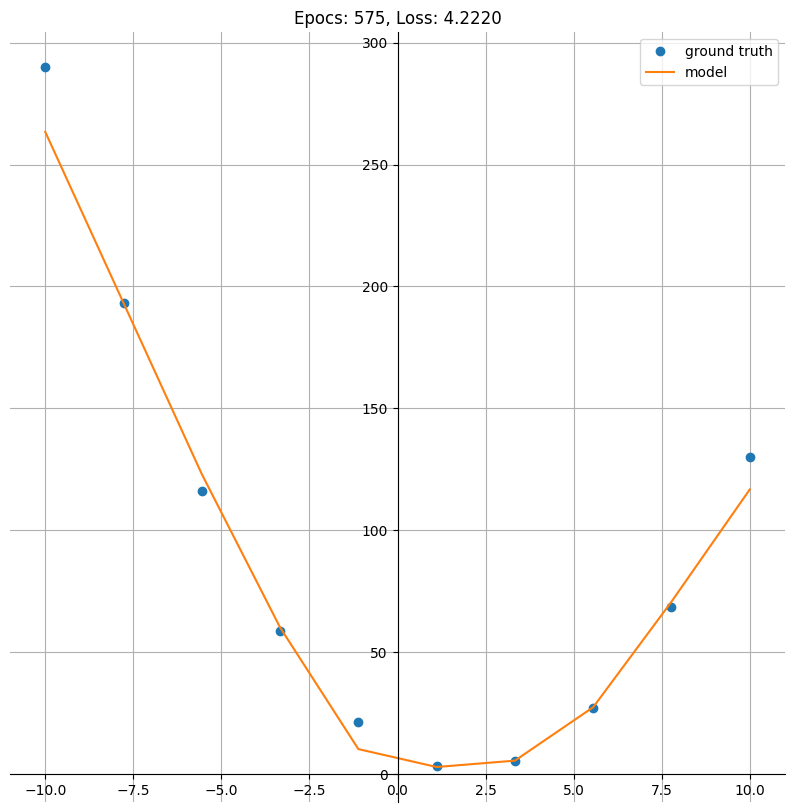

Epoch: 600; Train Loss: 3.7343039512634277


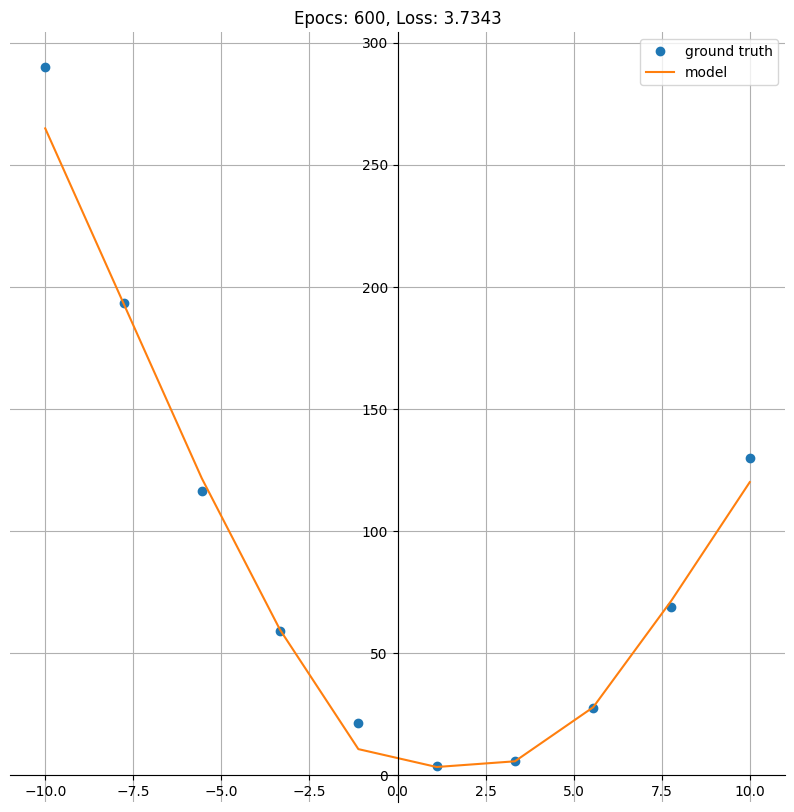

Epoch: 625; Train Loss: 3.280200242996216


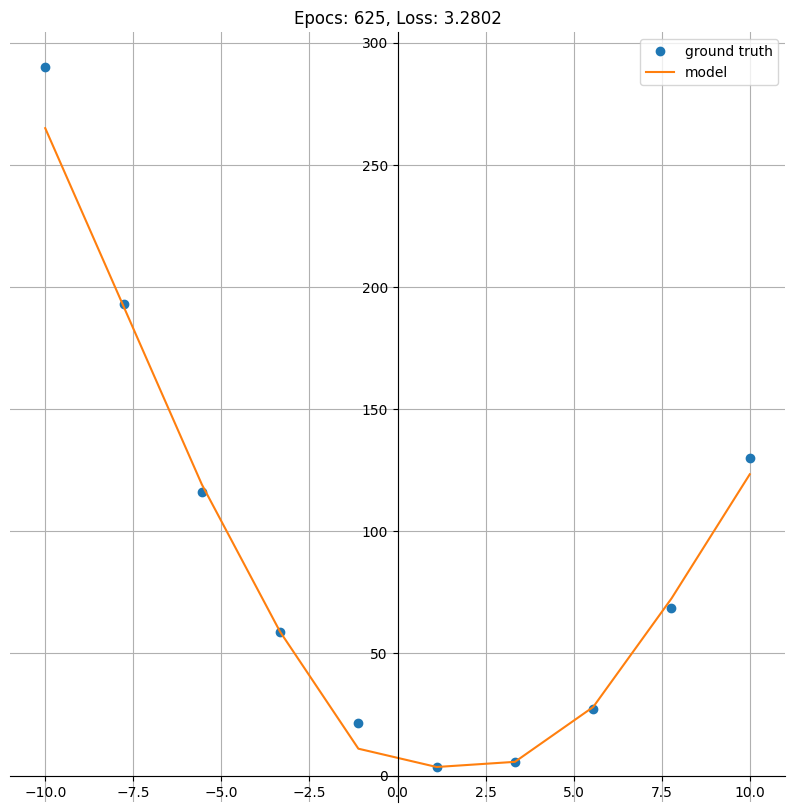

Epoch: 650; Train Loss: 2.864006757736206


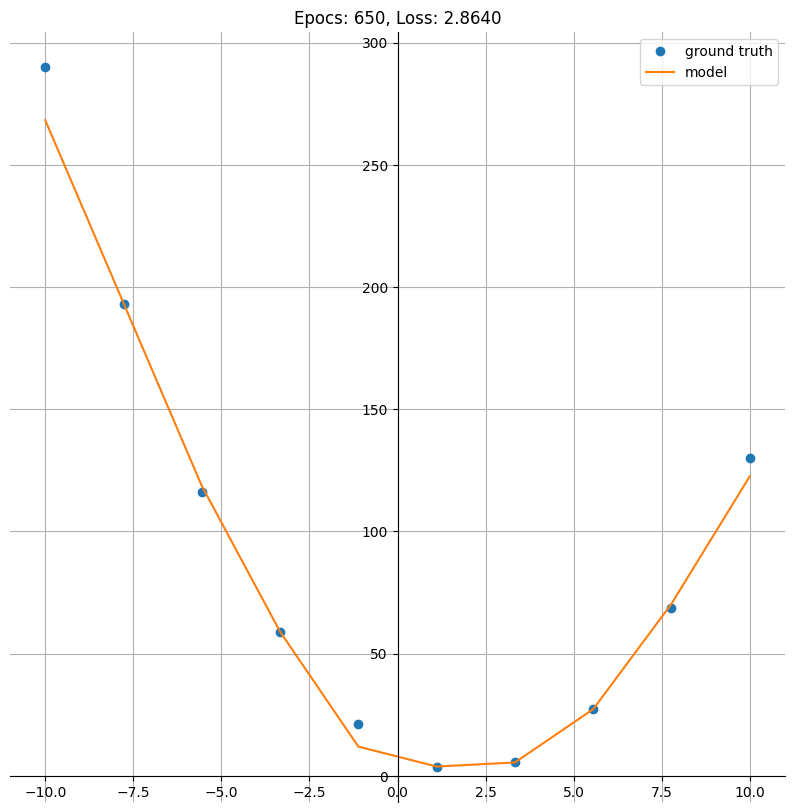

Epoch: 675; Train Loss: 2.492680072784424


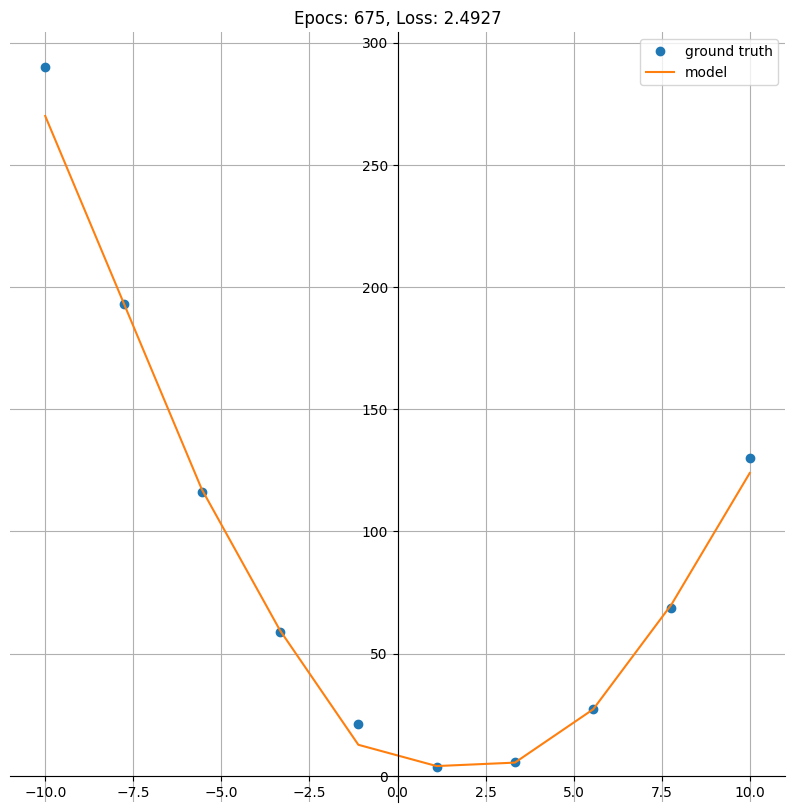

Epoch: 700; Train Loss: 2.2035584449768066


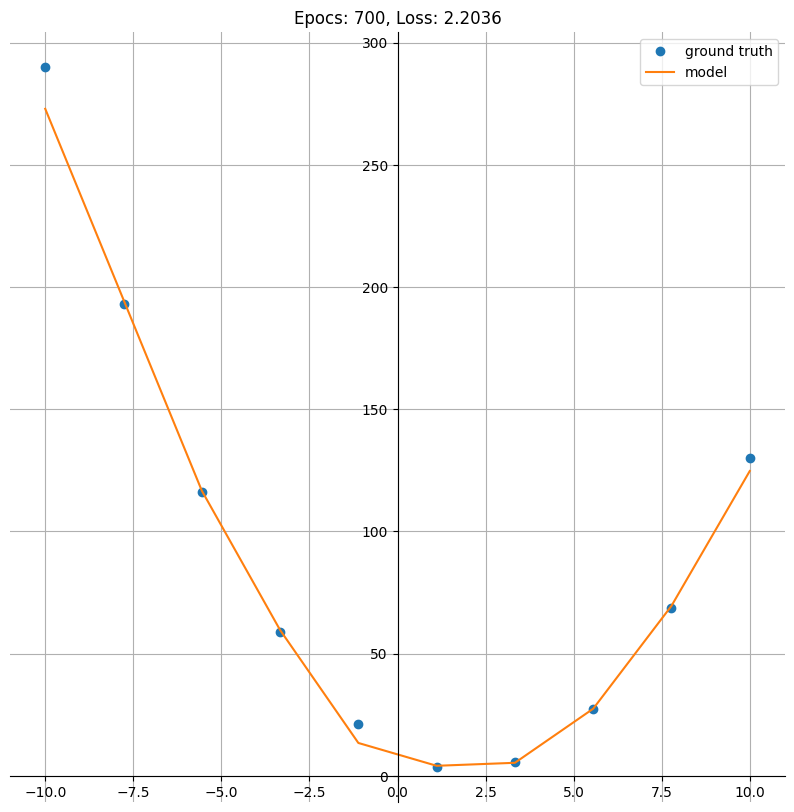

Epoch: 725; Train Loss: 2.024122476577759


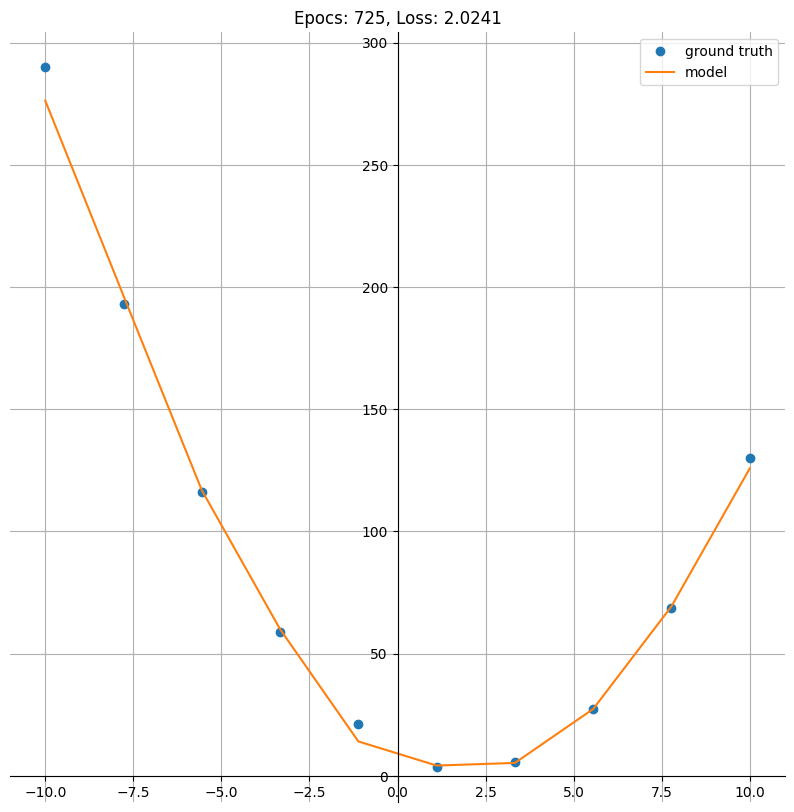

Epoch: 750; Train Loss: 1.8070836067199707


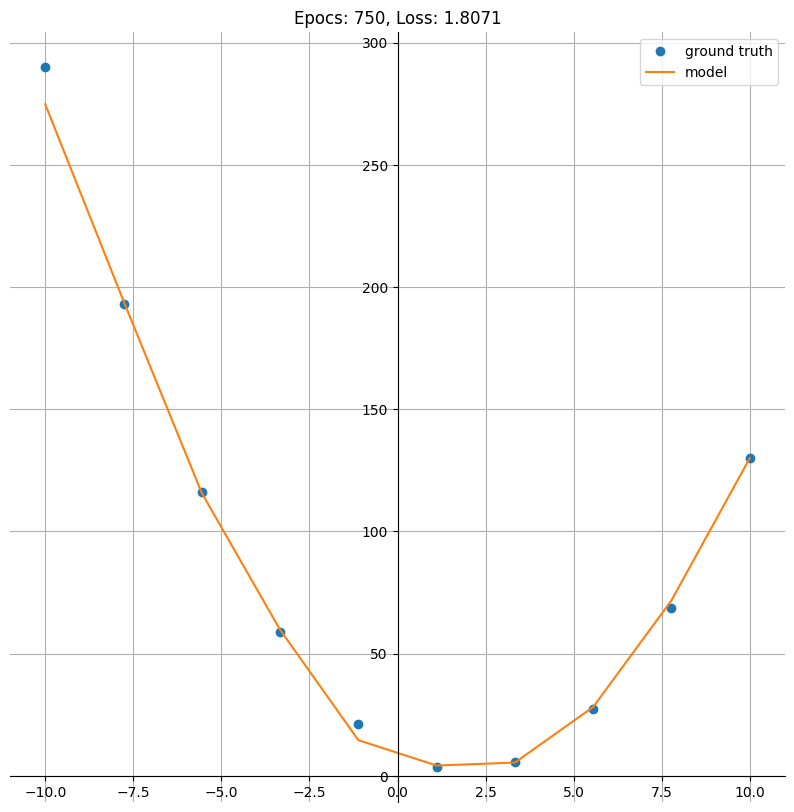

Epoch: 775; Train Loss: 1.7068572044372559


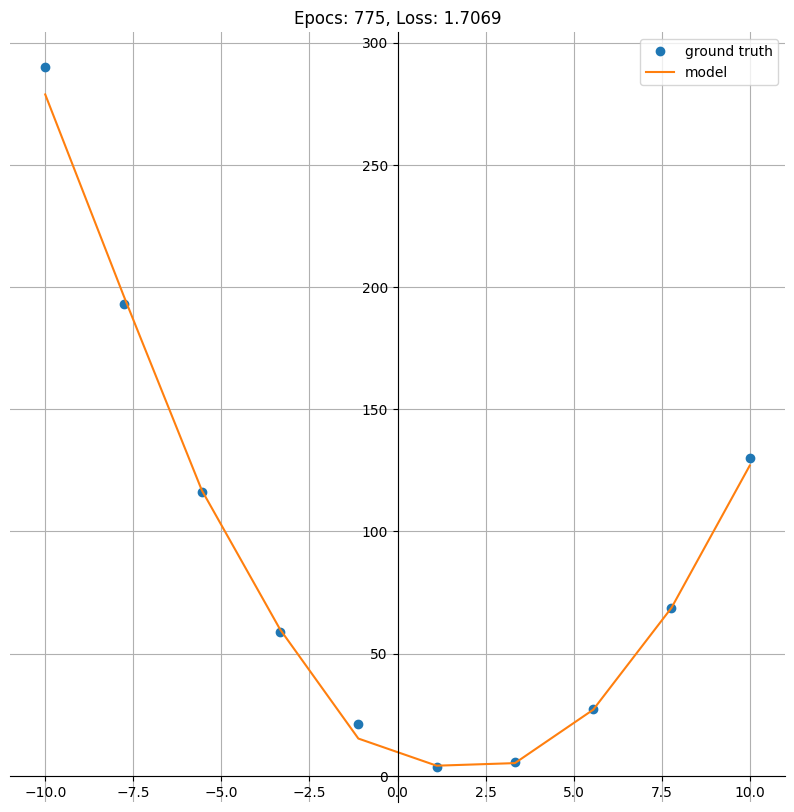

Epoch: 800; Train Loss: 1.5787736177444458


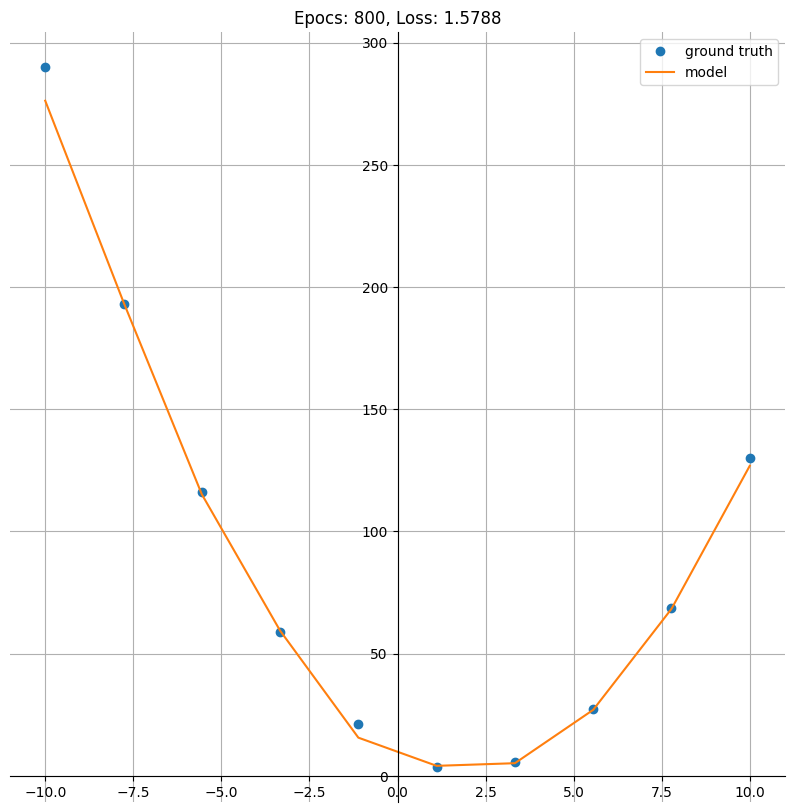

Epoch: 825; Train Loss: 1.4035673141479492


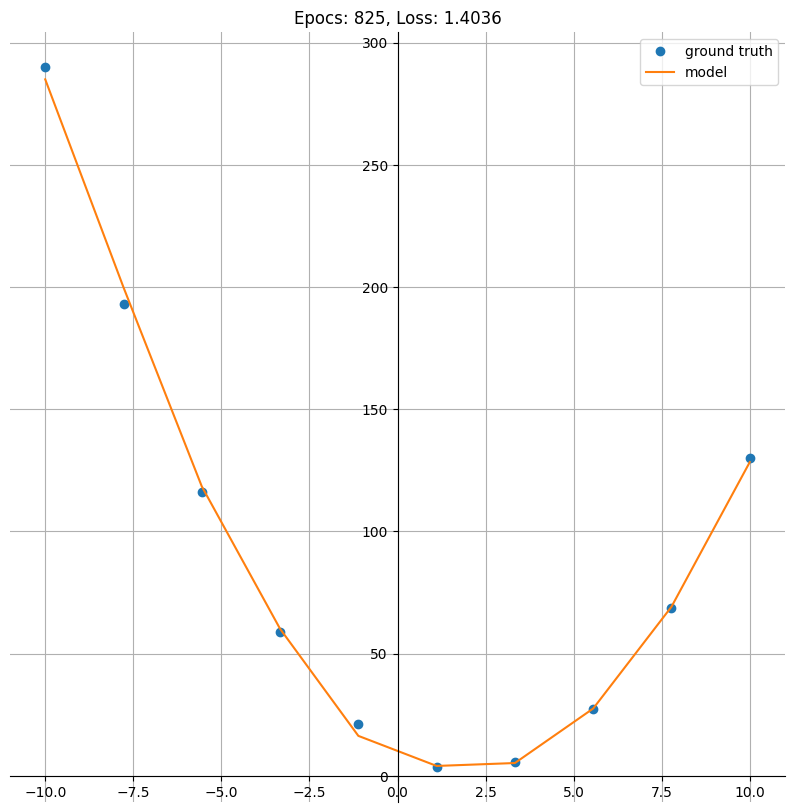

Epoch: 850; Train Loss: 1.260278582572937


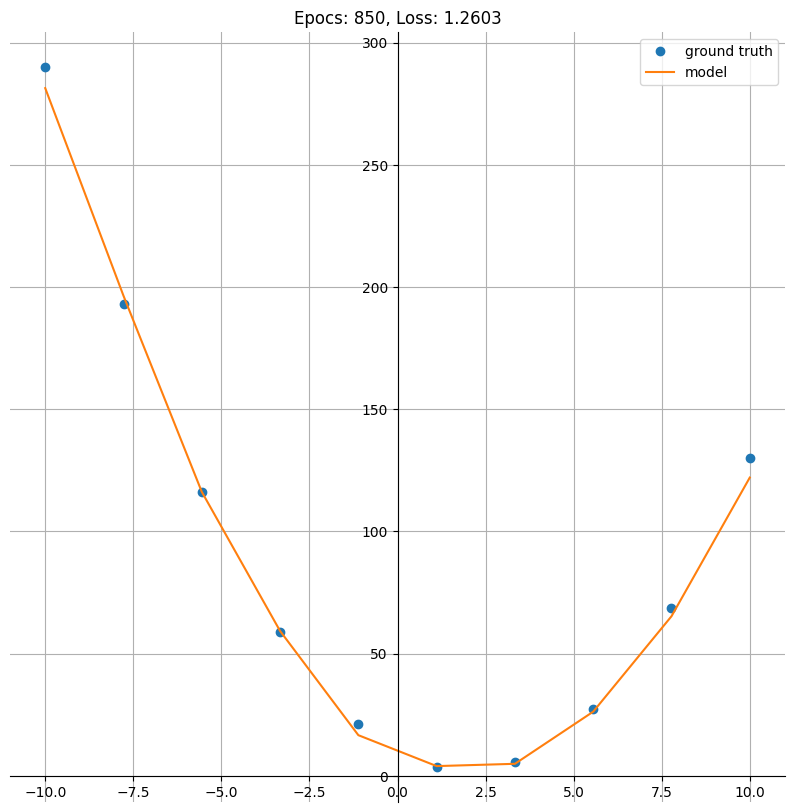

Epoch: 875; Train Loss: 1.2077715396881104


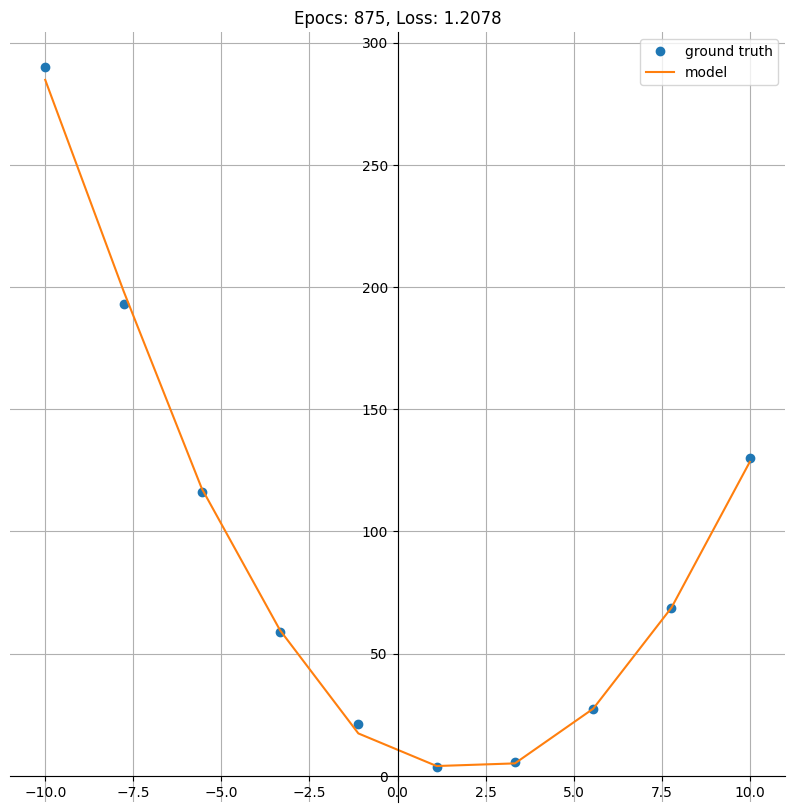

Epoch: 900; Train Loss: 1.0627936124801636


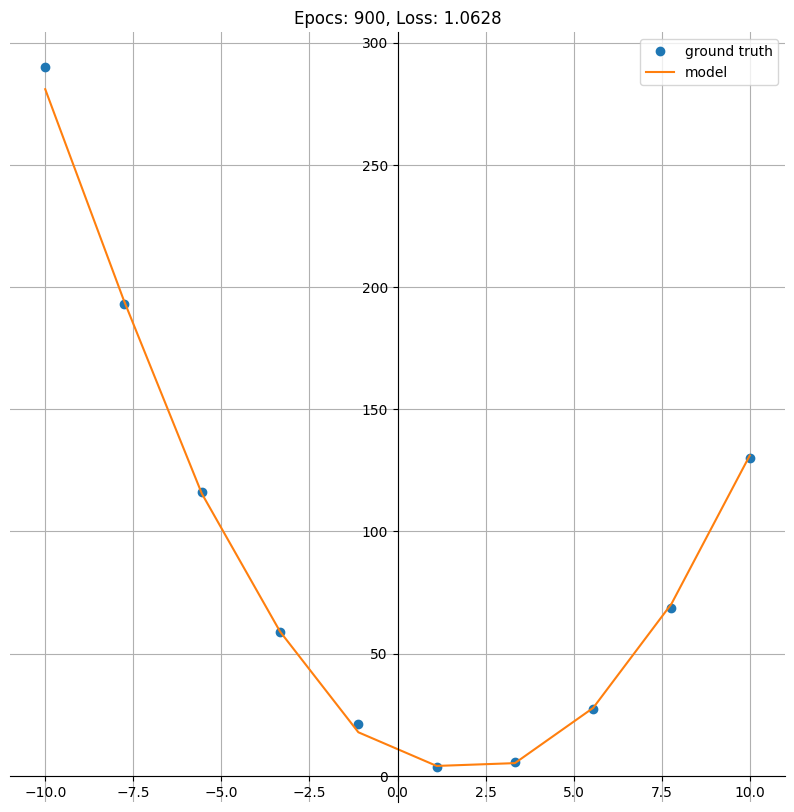

Epoch: 925; Train Loss: 0.985763430595398


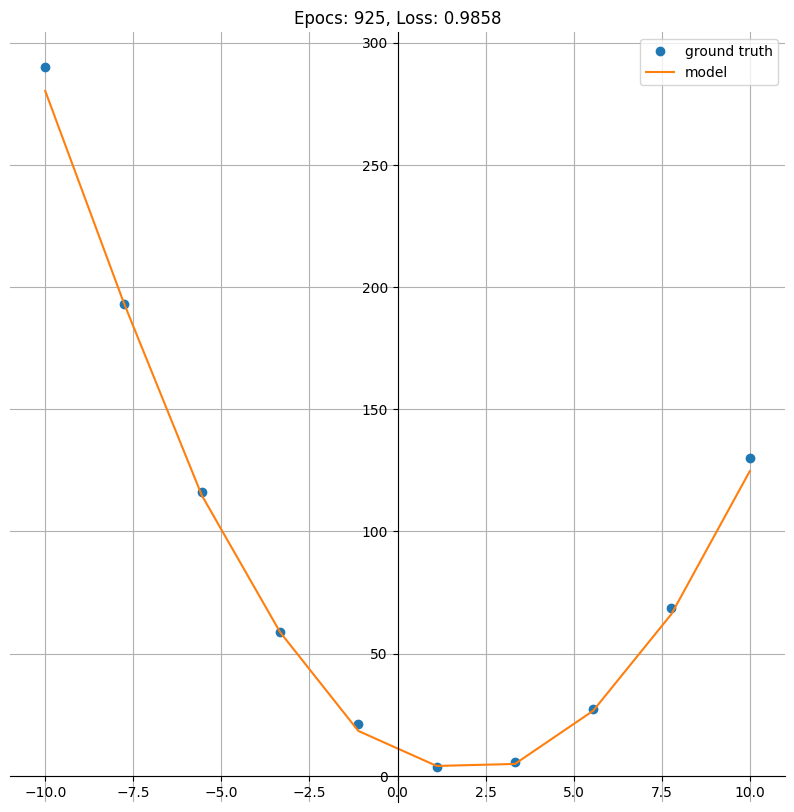

Epoch: 950; Train Loss: 0.9491252899169922


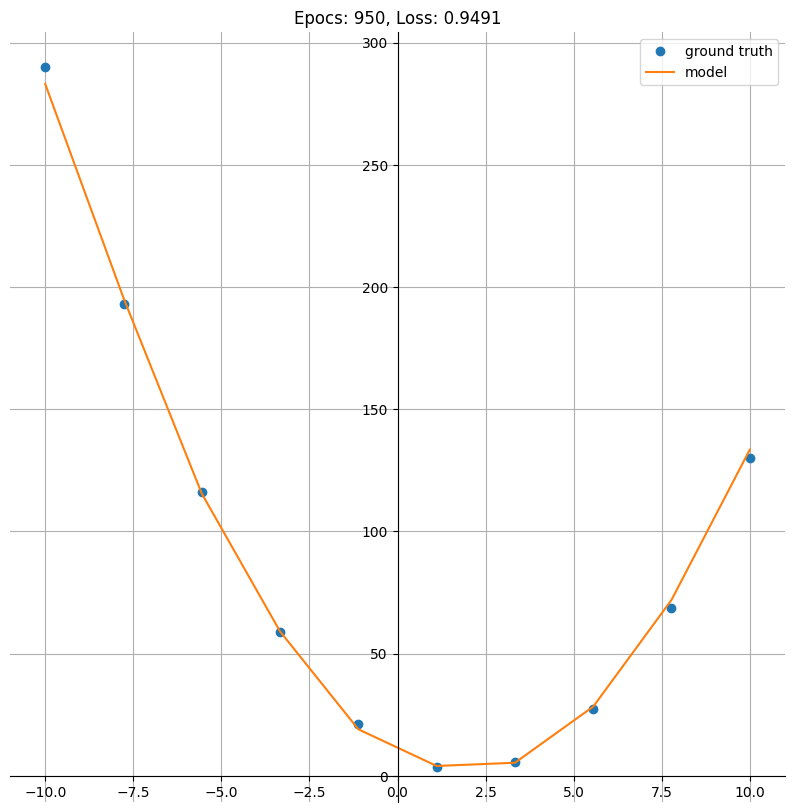

Epoch: 975; Train Loss: 0.9068840146064758


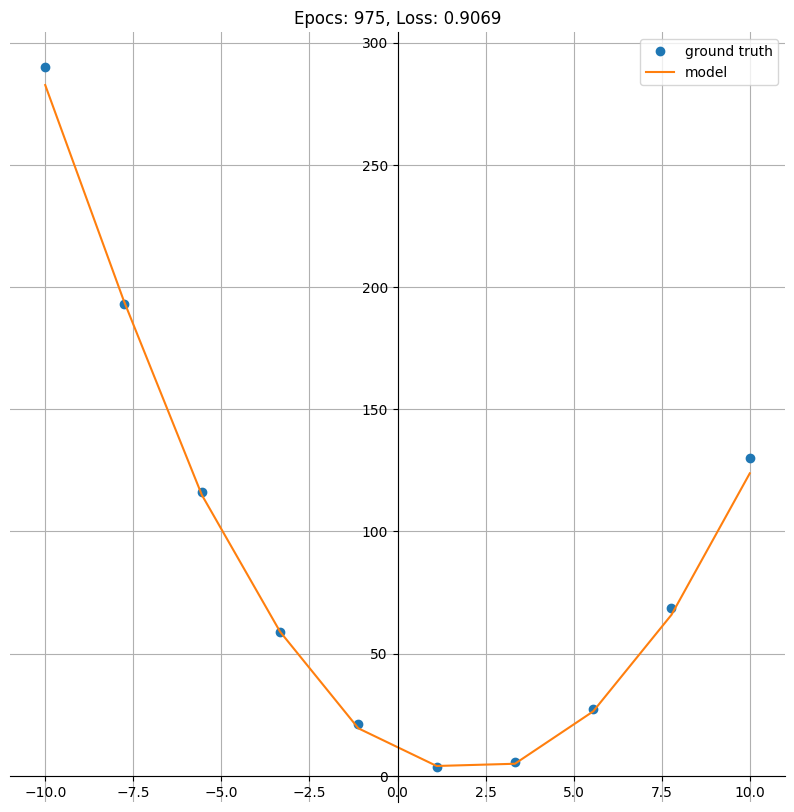

Epoch: 1000; Train Loss: 0.7802677154541016


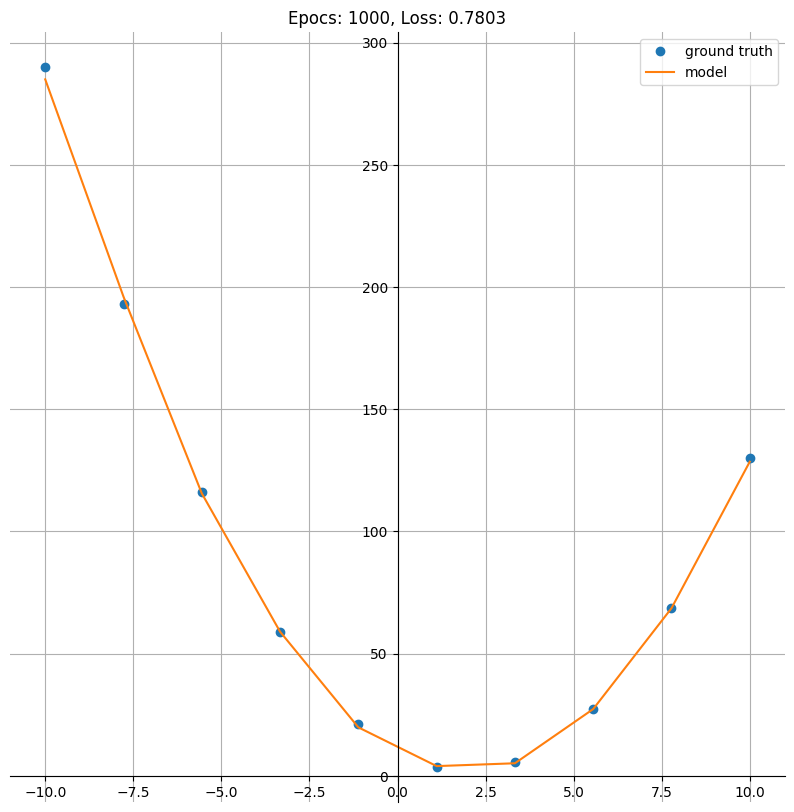

Epoch: 1025; Train Loss: 0.7506462931632996


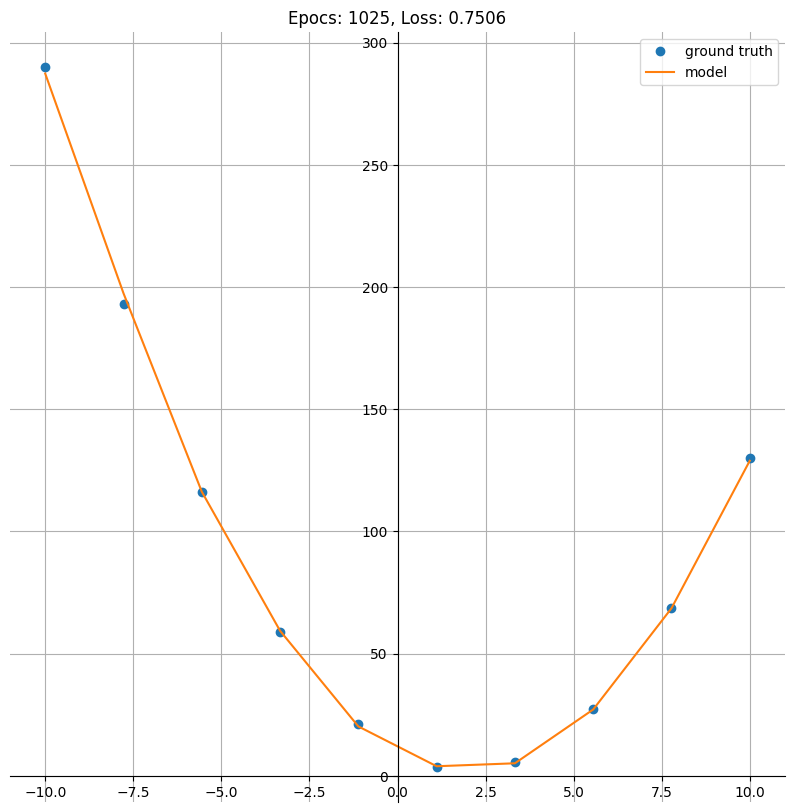

Epoch: 1050; Train Loss: 0.7671303153038025


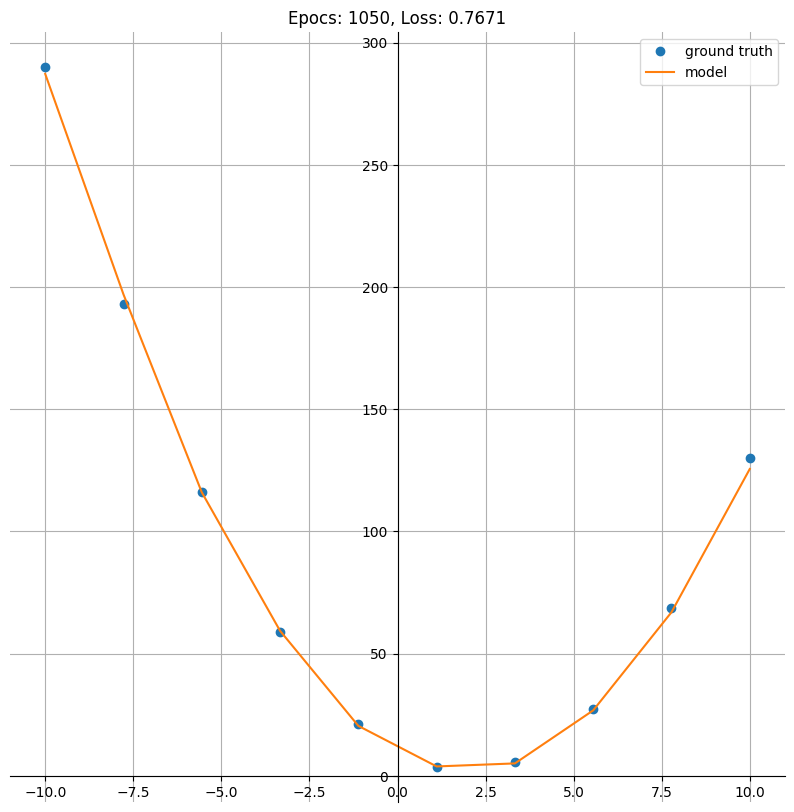

Epoch: 1075; Train Loss: 0.6616390943527222


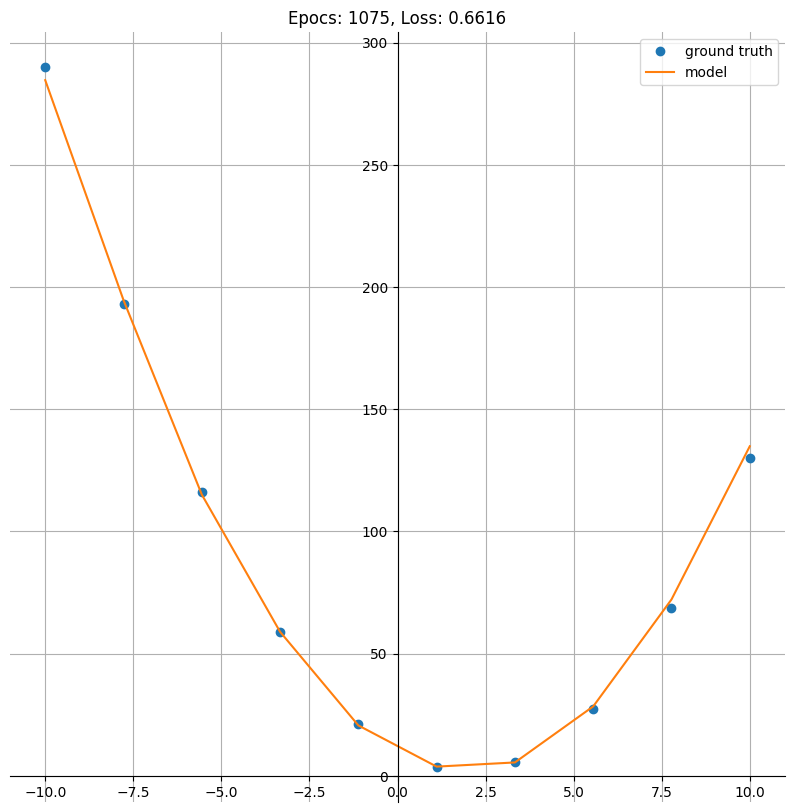

Epoch: 1100; Train Loss: 0.7182475328445435


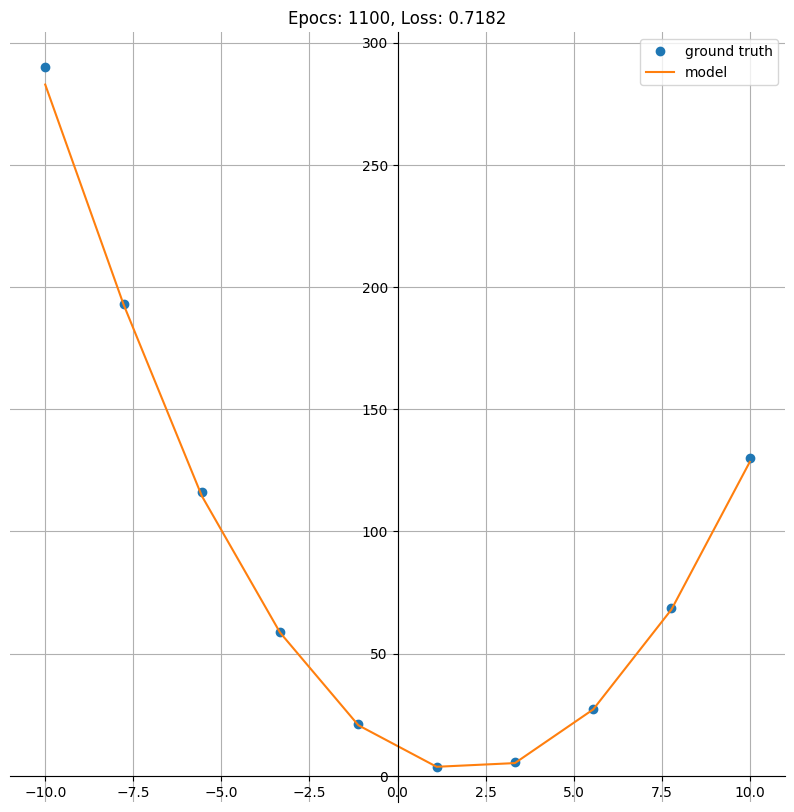

Epoch: 1125; Train Loss: 0.7050492167472839


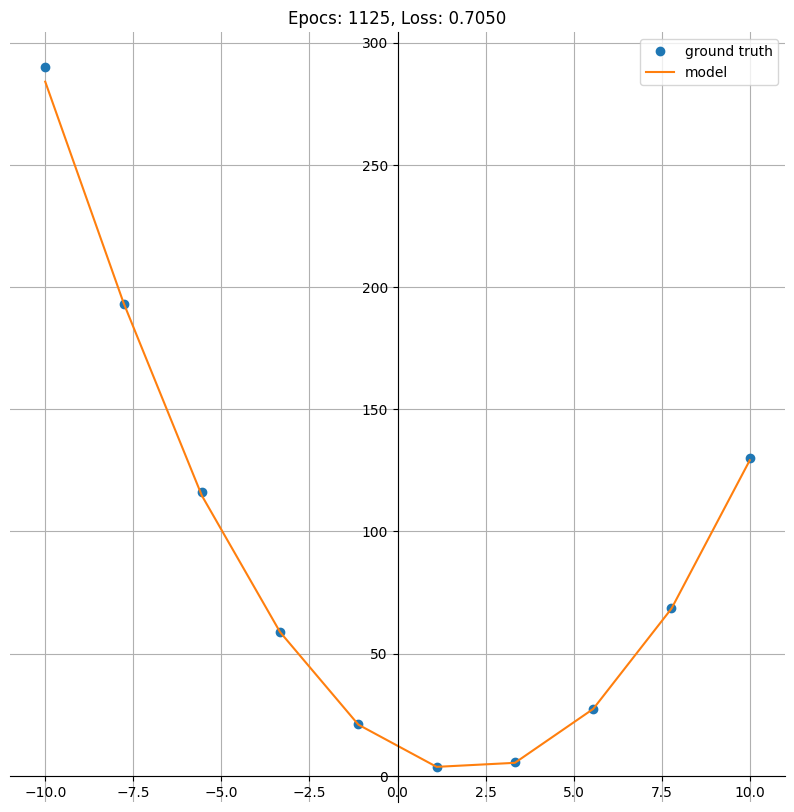

Epoch: 1150; Train Loss: 0.6604354977607727


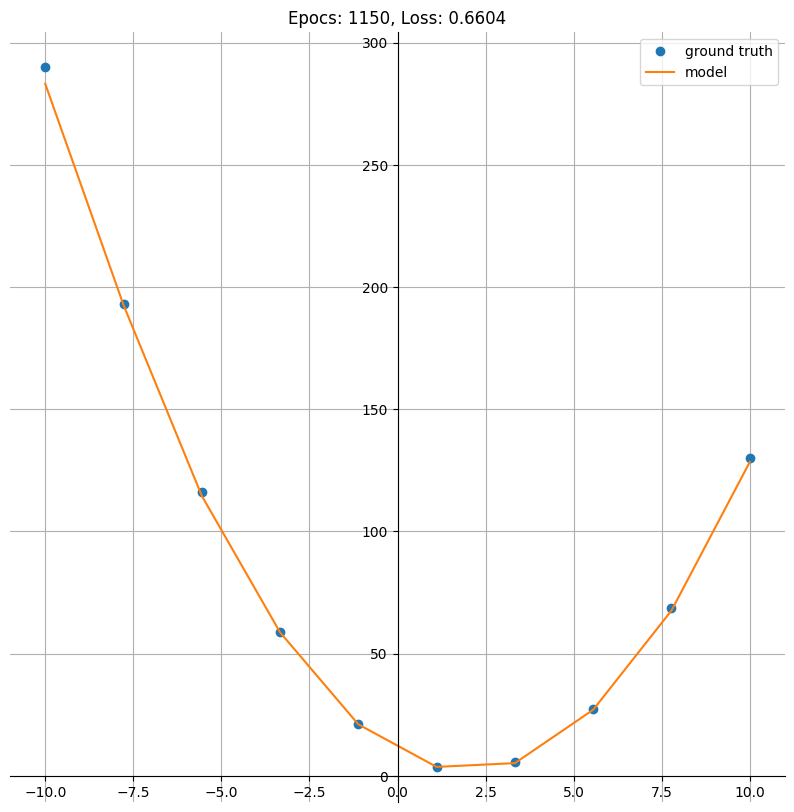

Epoch: 1175; Train Loss: 0.6349709630012512


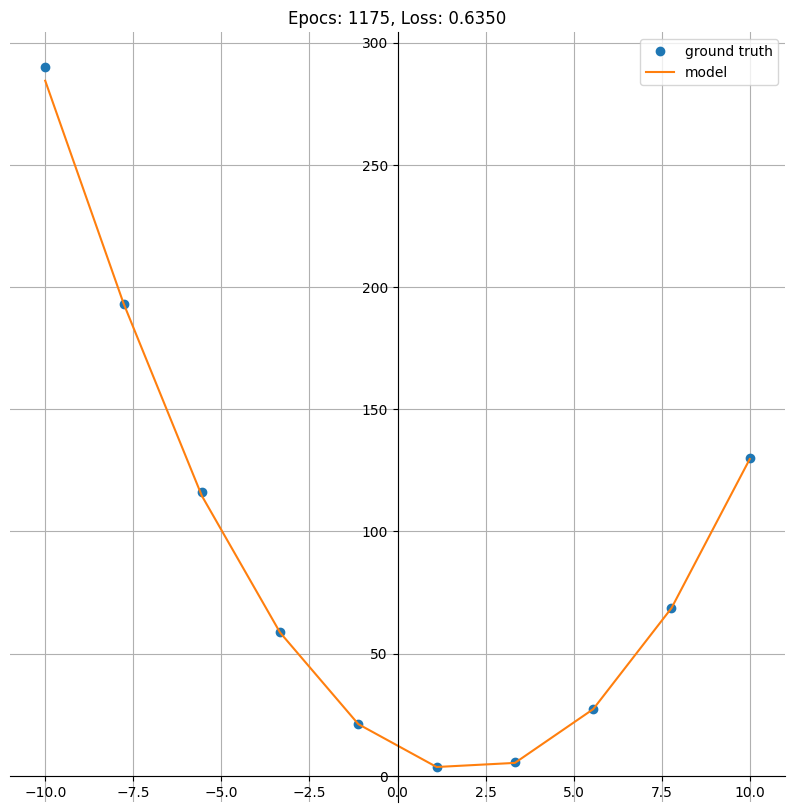

Epoch: 1200; Train Loss: 0.6179817914962769


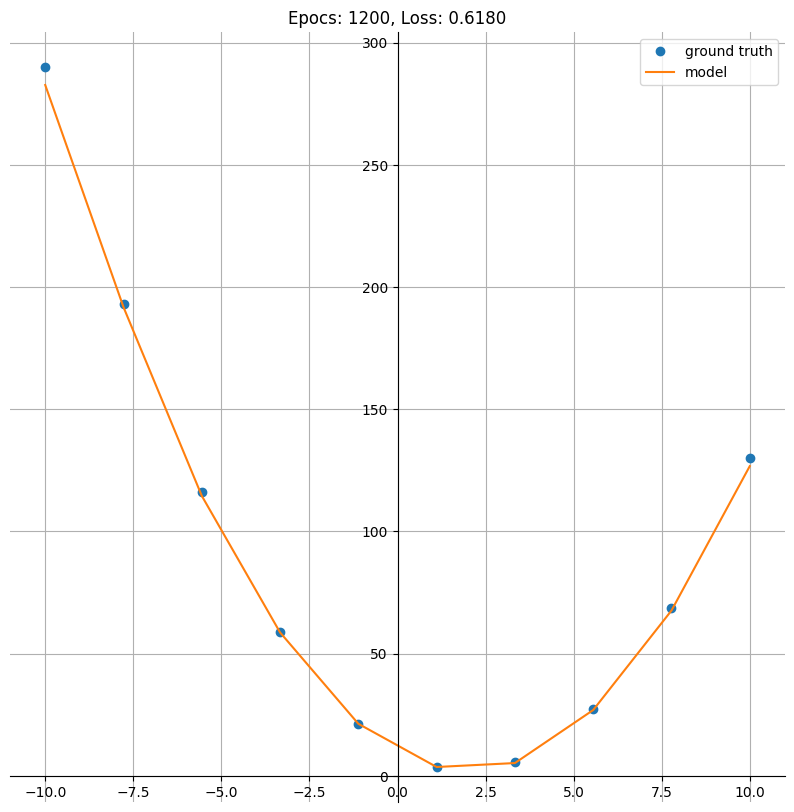

Epoch: 1225; Train Loss: 0.6262300610542297


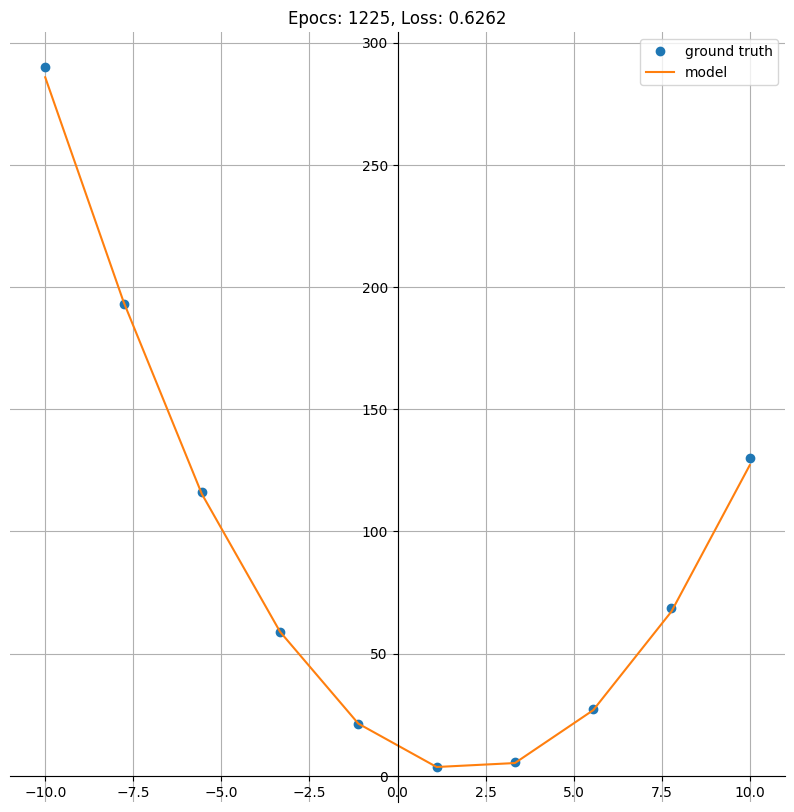

Epoch: 1250; Train Loss: 0.6308723092079163


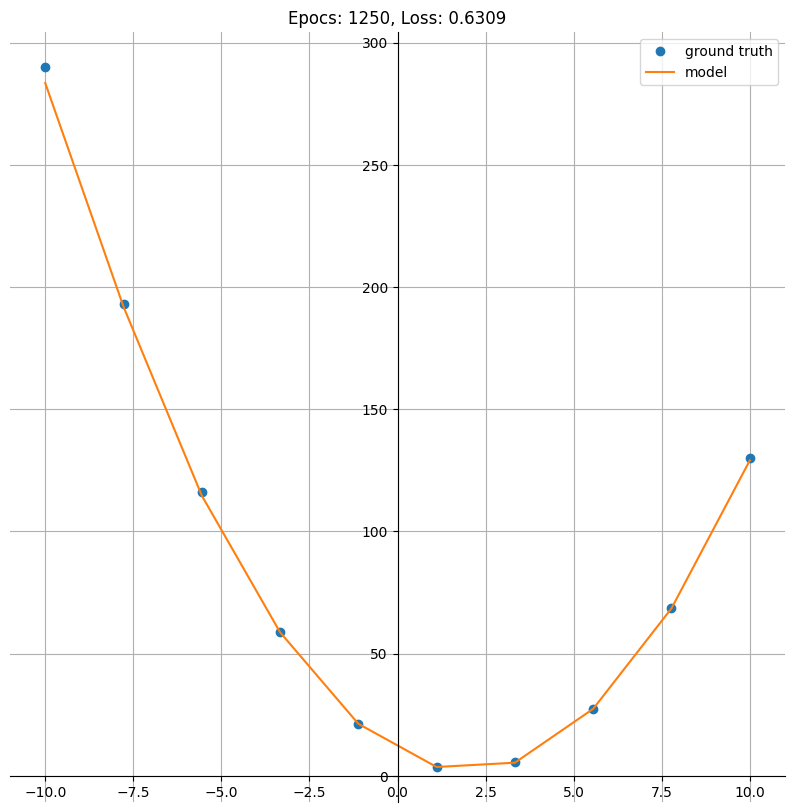

Epoch: 1275; Train Loss: 0.6062449216842651


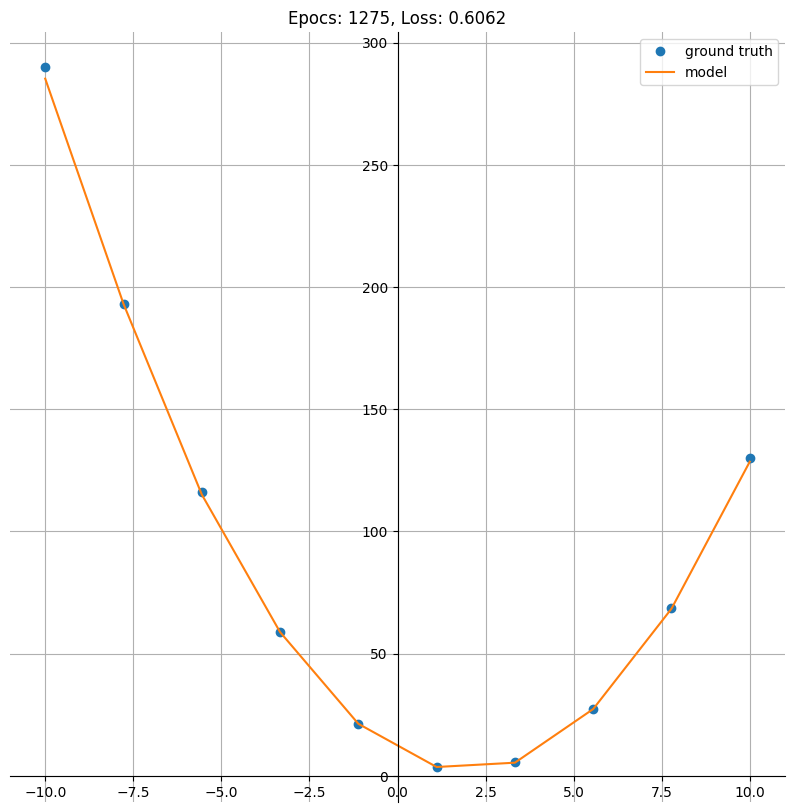

Epoch: 1300; Train Loss: 0.6221312284469604


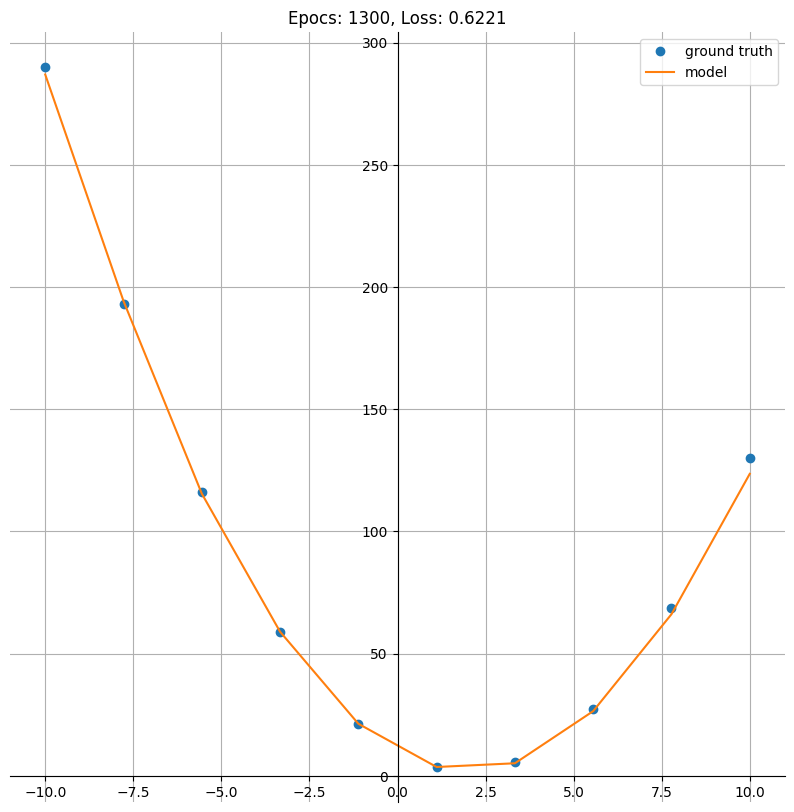

Epoch: 1325; Train Loss: 0.5470210909843445


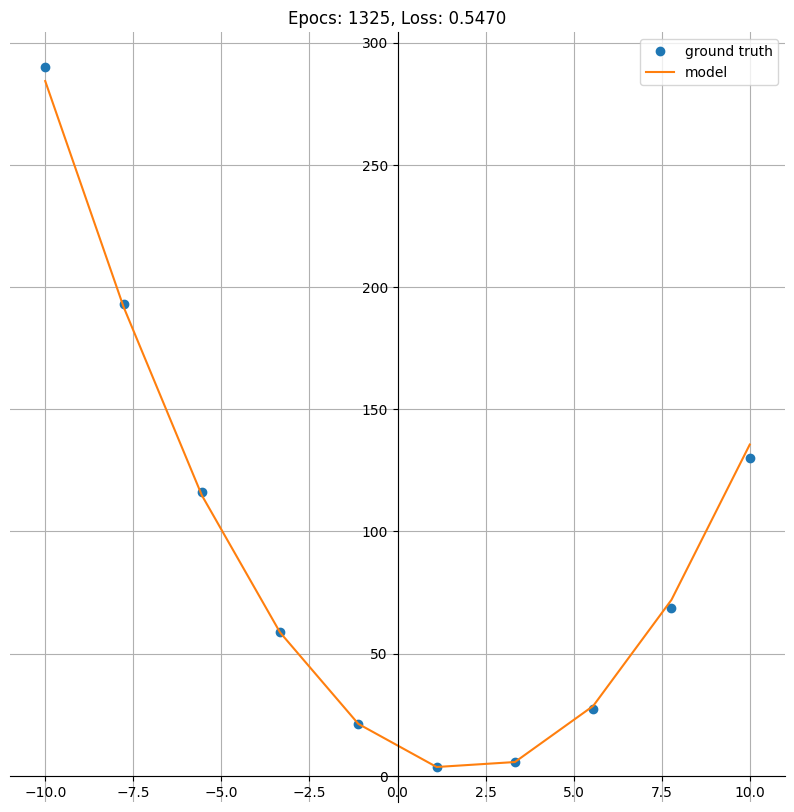

Epoch: 1350; Train Loss: 0.6265093088150024


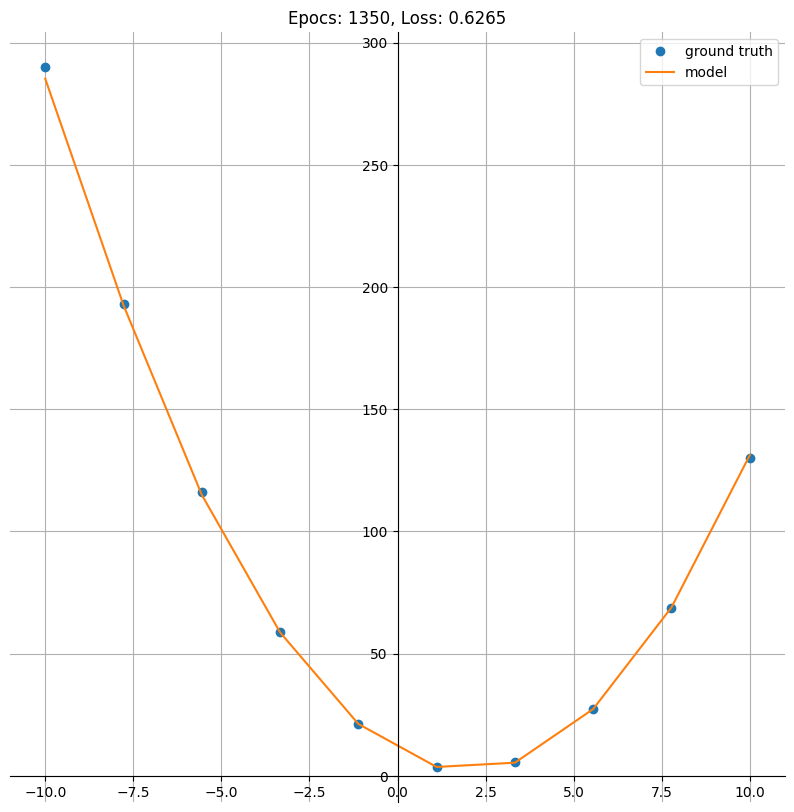

Epoch: 1375; Train Loss: 0.5850261449813843


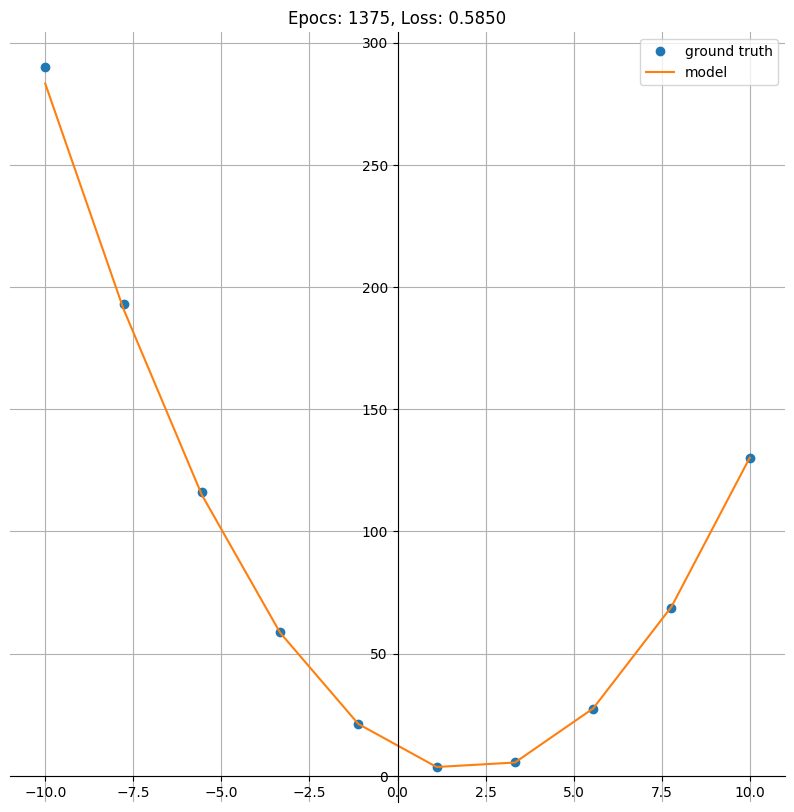

Epoch: 1400; Train Loss: 0.5642883777618408


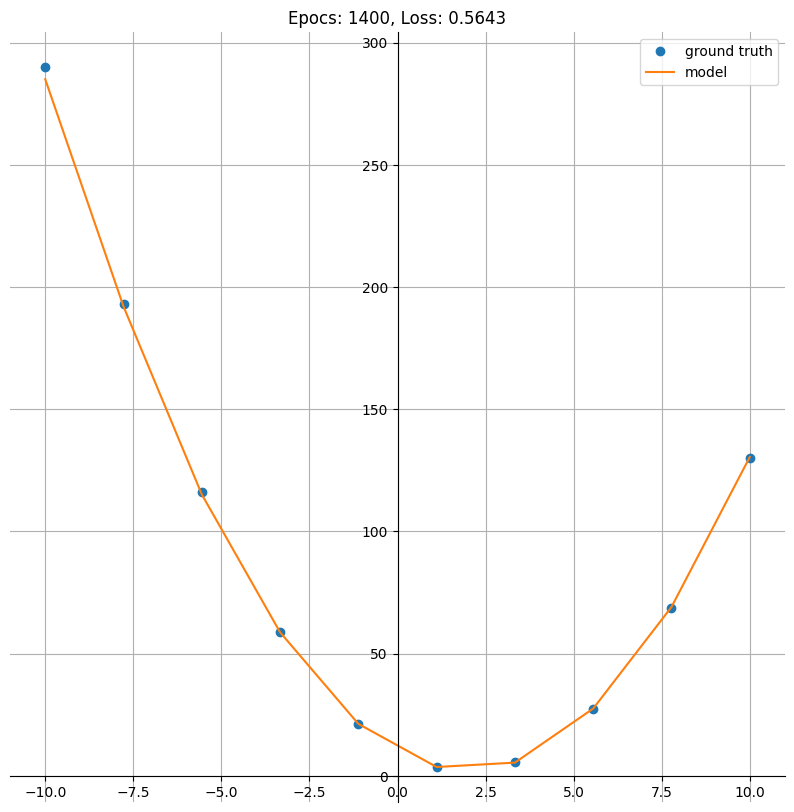

Epoch: 1425; Train Loss: 0.6197770237922668


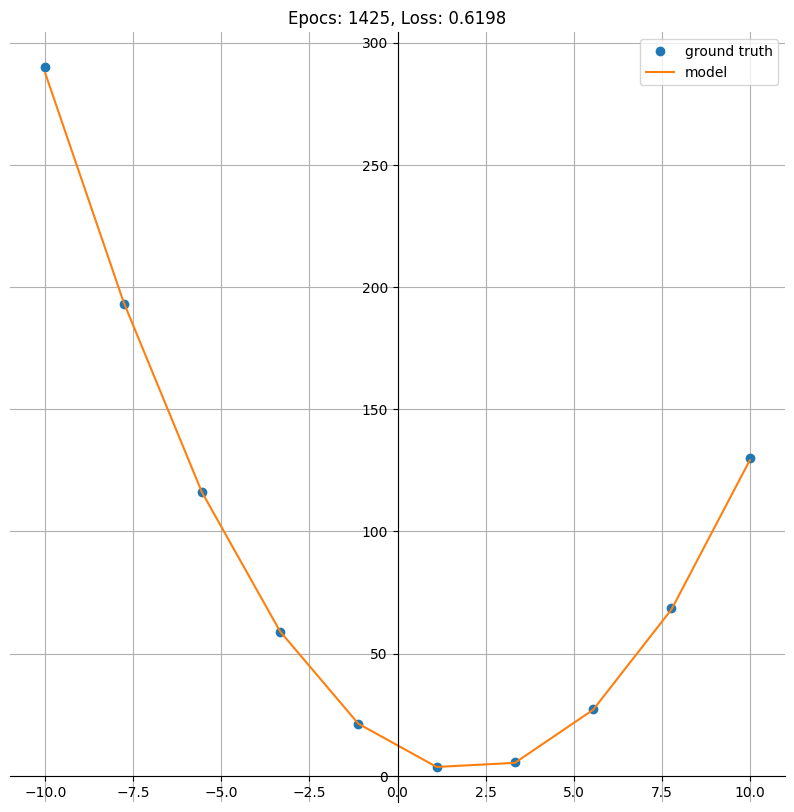

Epoch: 1450; Train Loss: 0.5836580991744995


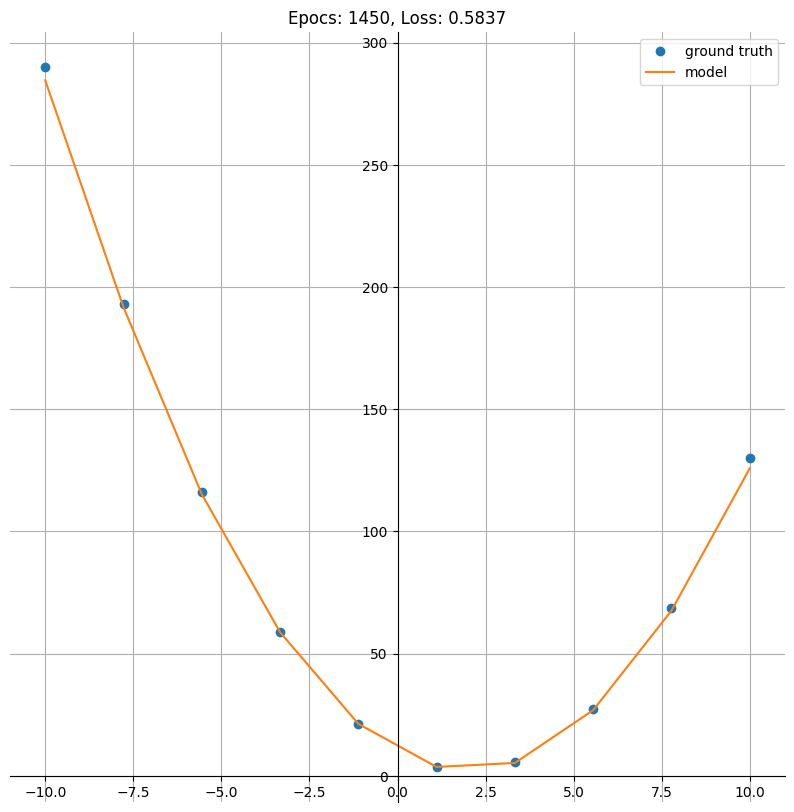

Epoch: 1475; Train Loss: 0.5219056606292725


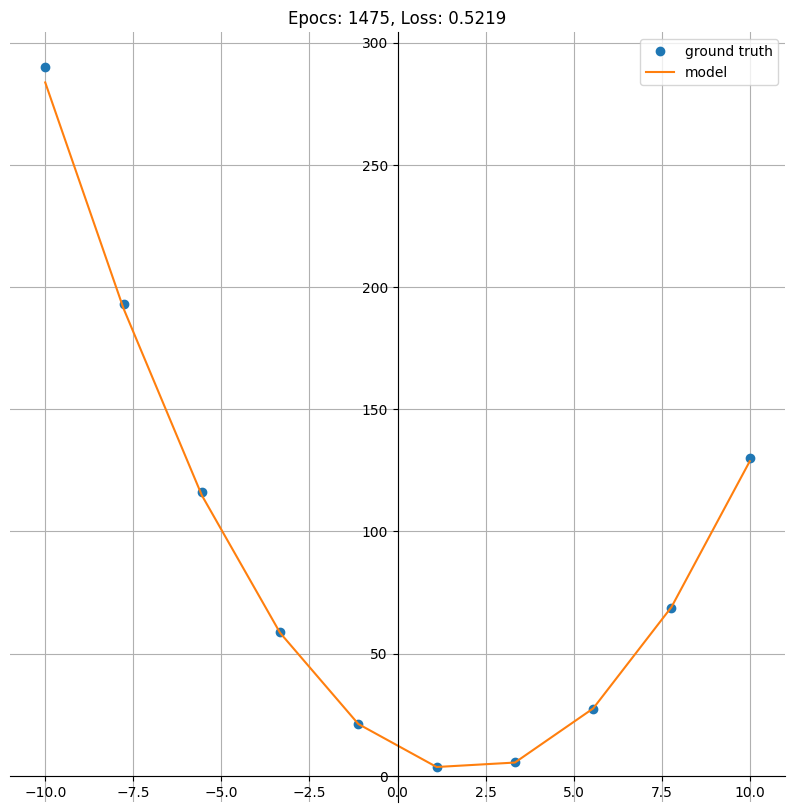

Epoch: 1500; Train Loss: 0.5426129698753357


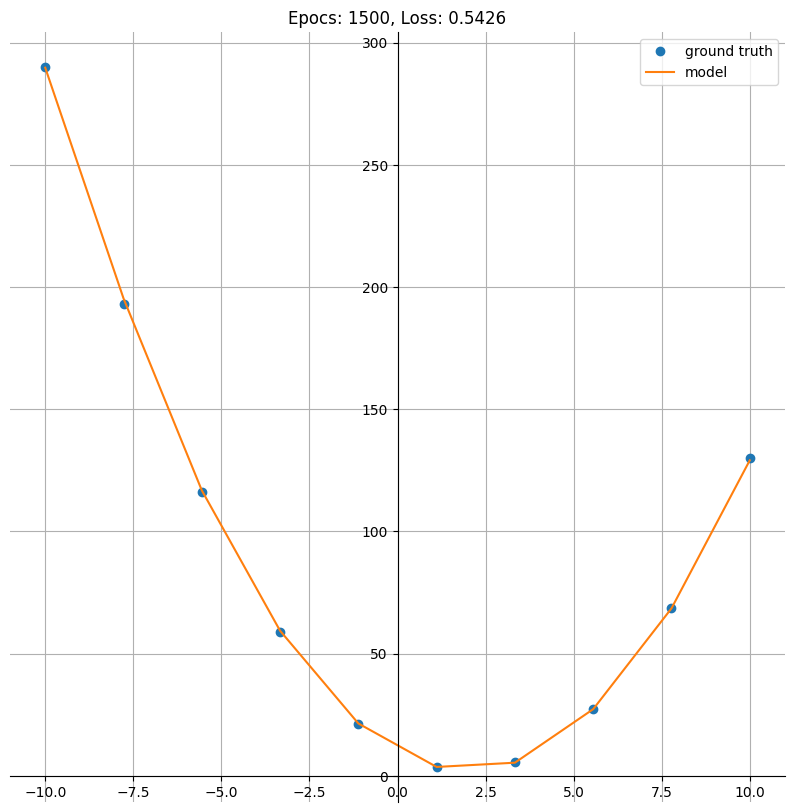

Epoch: 1525; Train Loss: 0.5245450735092163


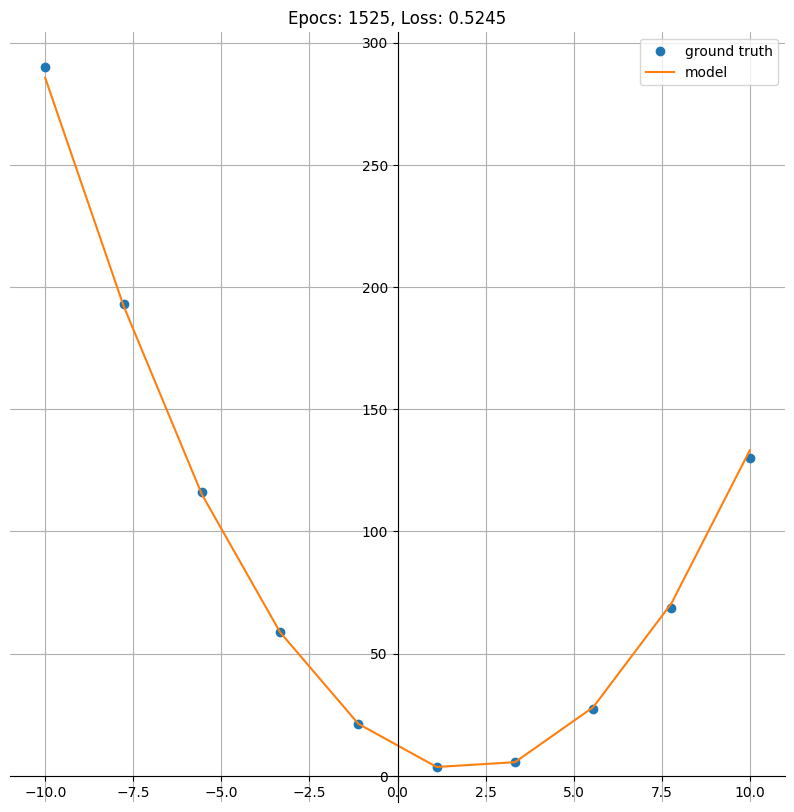

Epoch: 1550; Train Loss: 0.5995524525642395


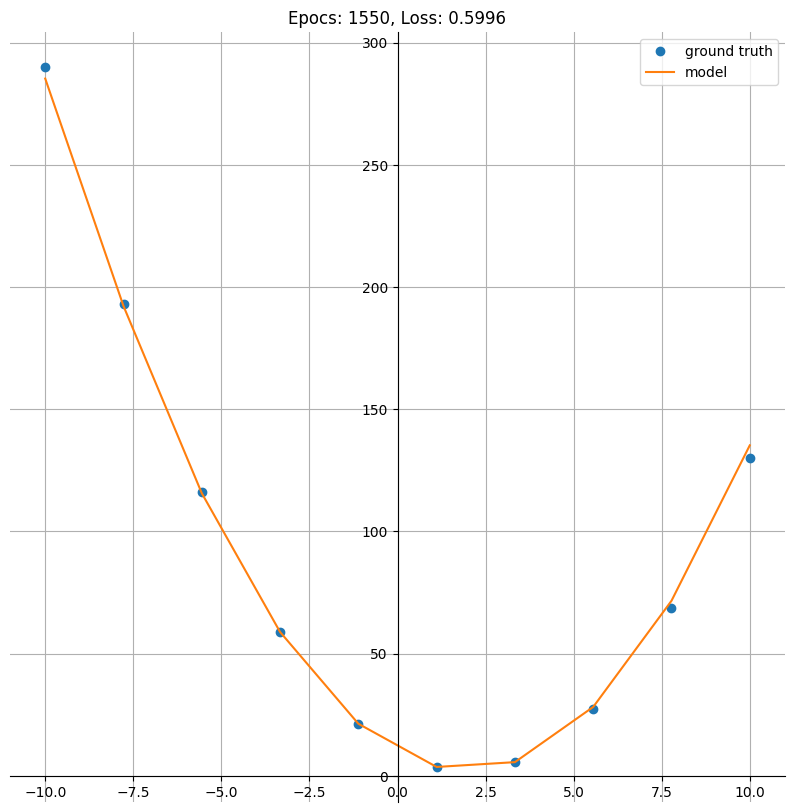

Epoch: 1575; Train Loss: 0.5867224931716919


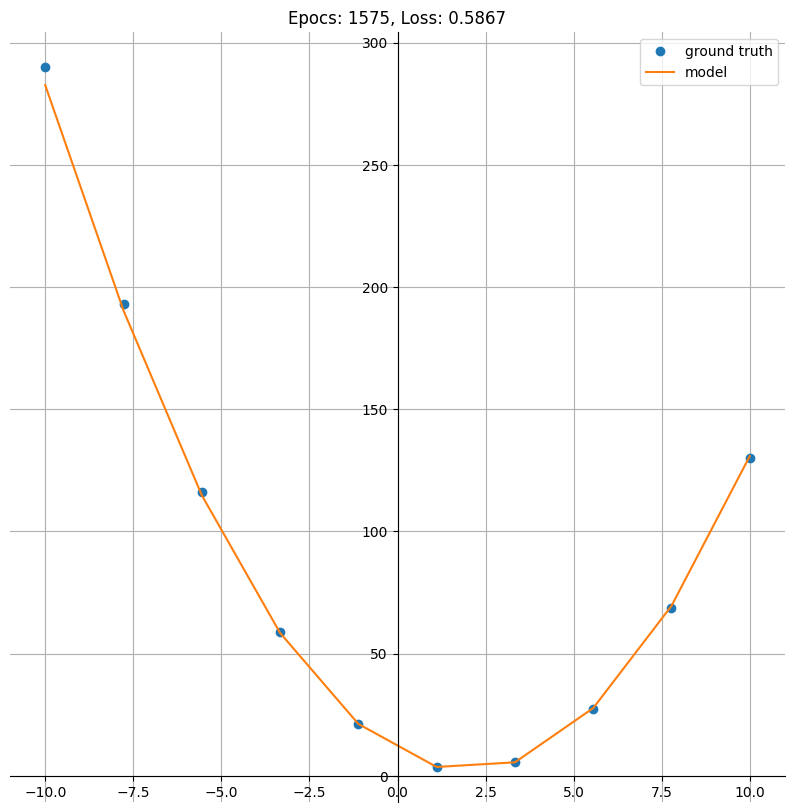

Epoch: 1600; Train Loss: 0.5635772347450256


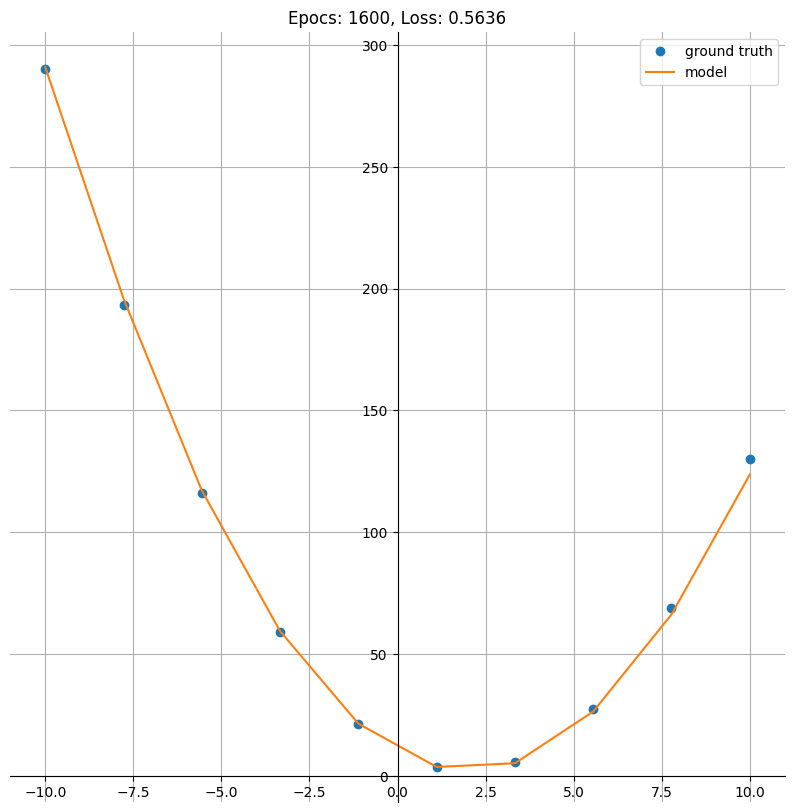

Epoch: 1625; Train Loss: 0.5893146991729736


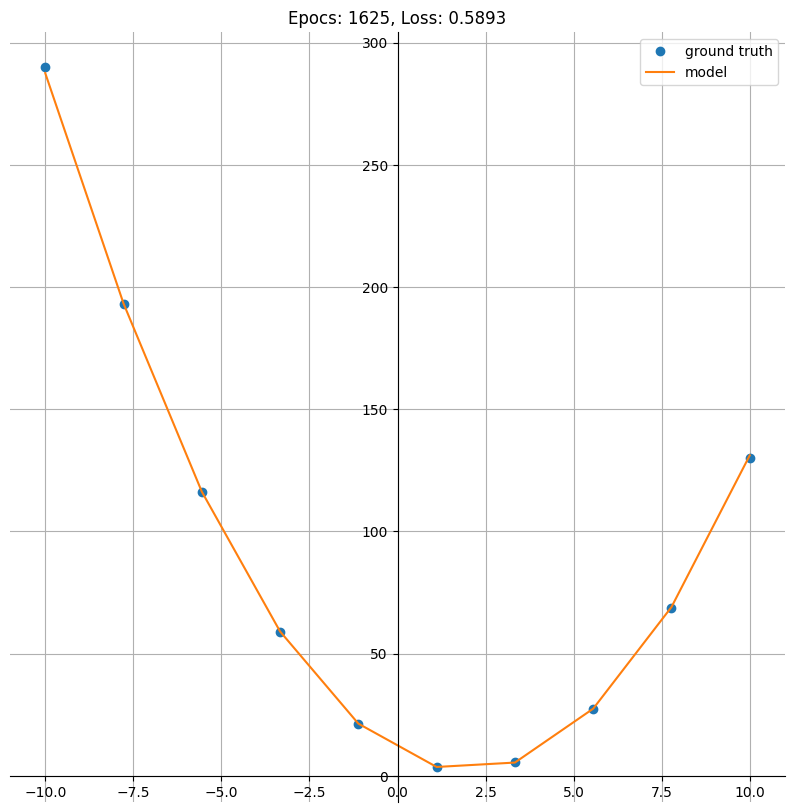

Epoch: 1650; Train Loss: 0.5655344128608704


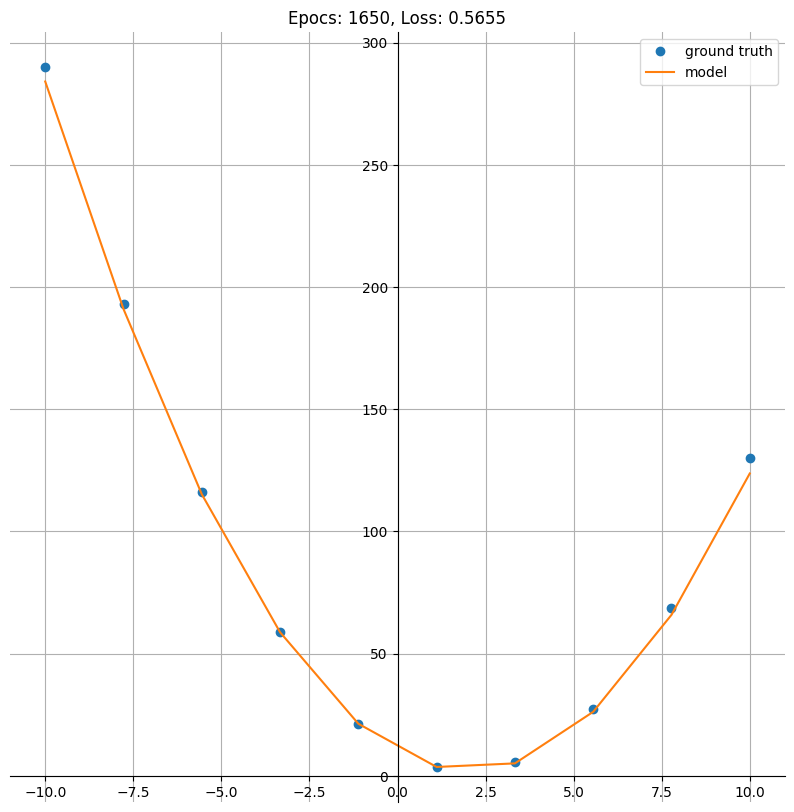

Epoch: 1675; Train Loss: 0.48991647362709045


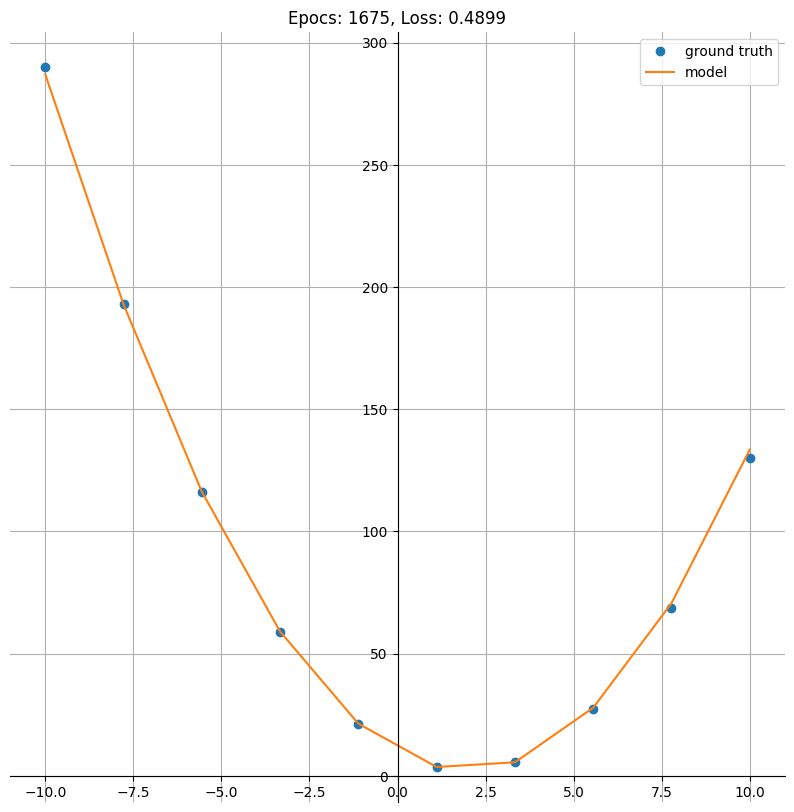

Epoch: 1700; Train Loss: 0.5803866386413574


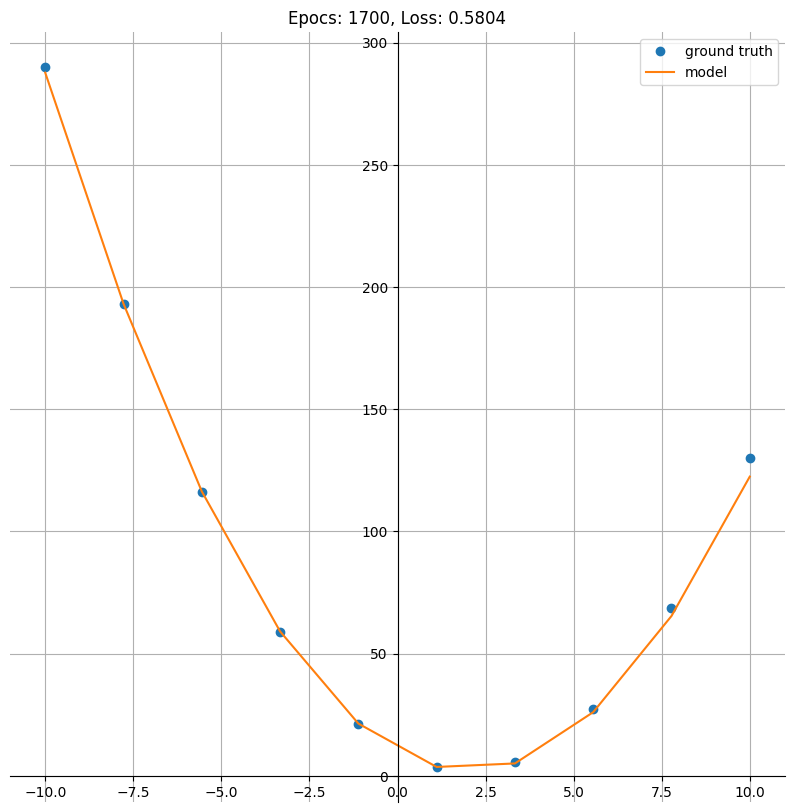

Epoch: 1725; Train Loss: 0.5741856694221497


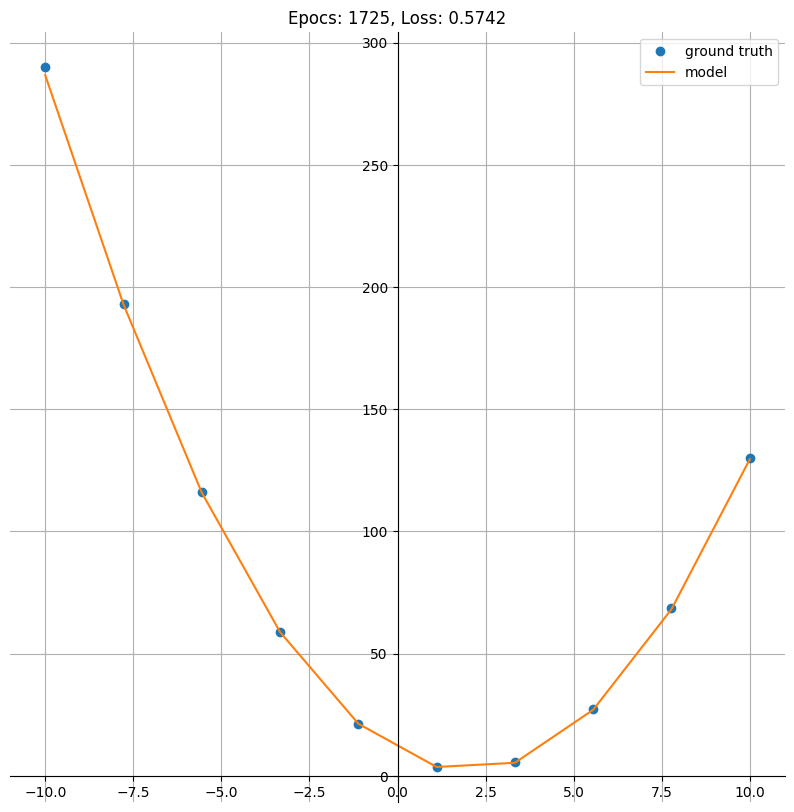

Epoch: 1750; Train Loss: 0.5720008015632629


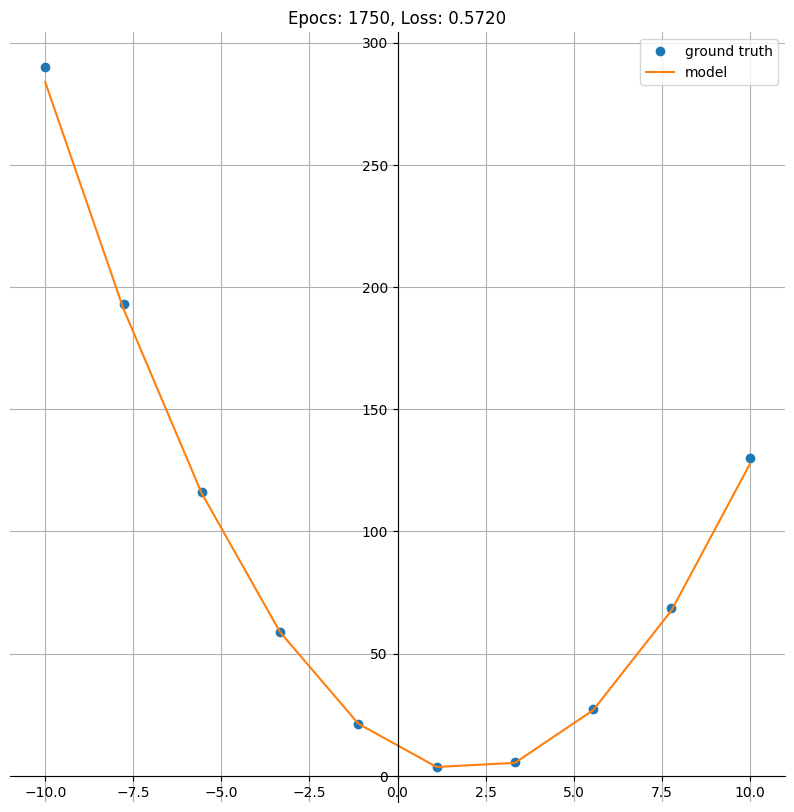

Epoch: 1775; Train Loss: 0.5452515482902527


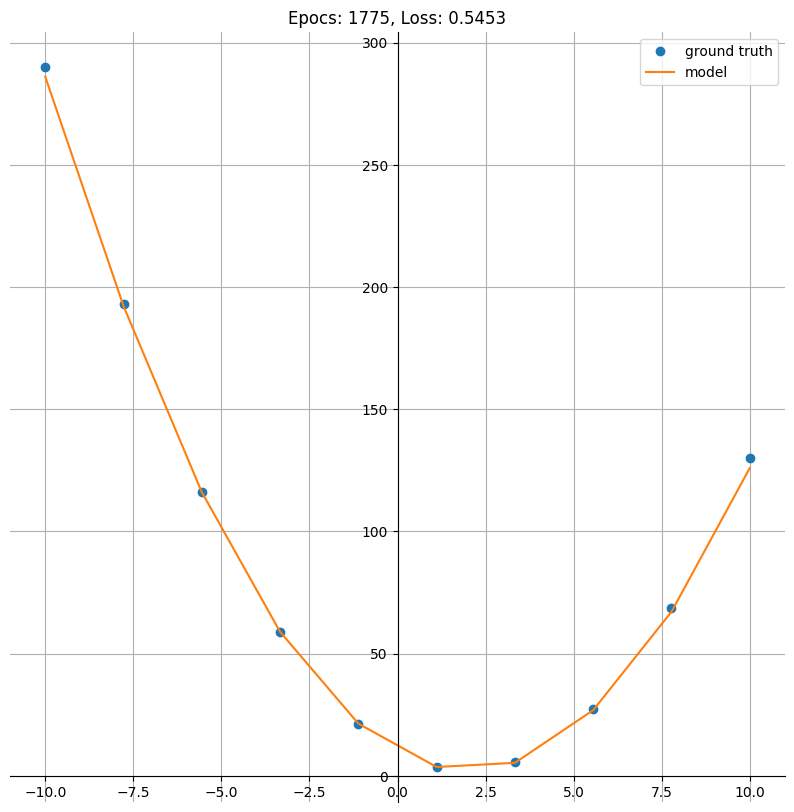

Epoch: 1800; Train Loss: 0.6123102307319641


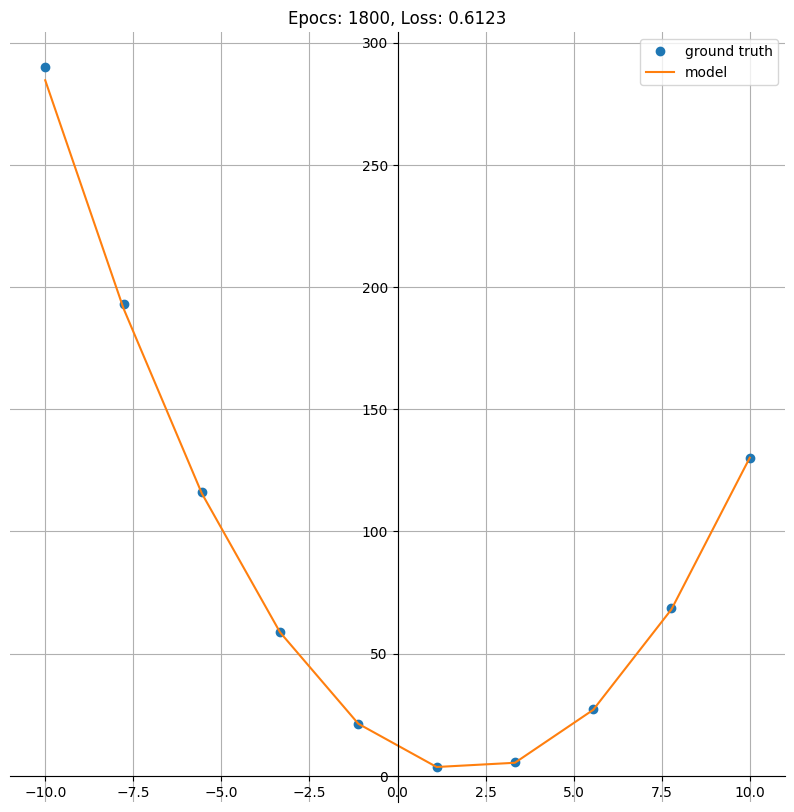

Epoch: 1825; Train Loss: 0.551956057548523


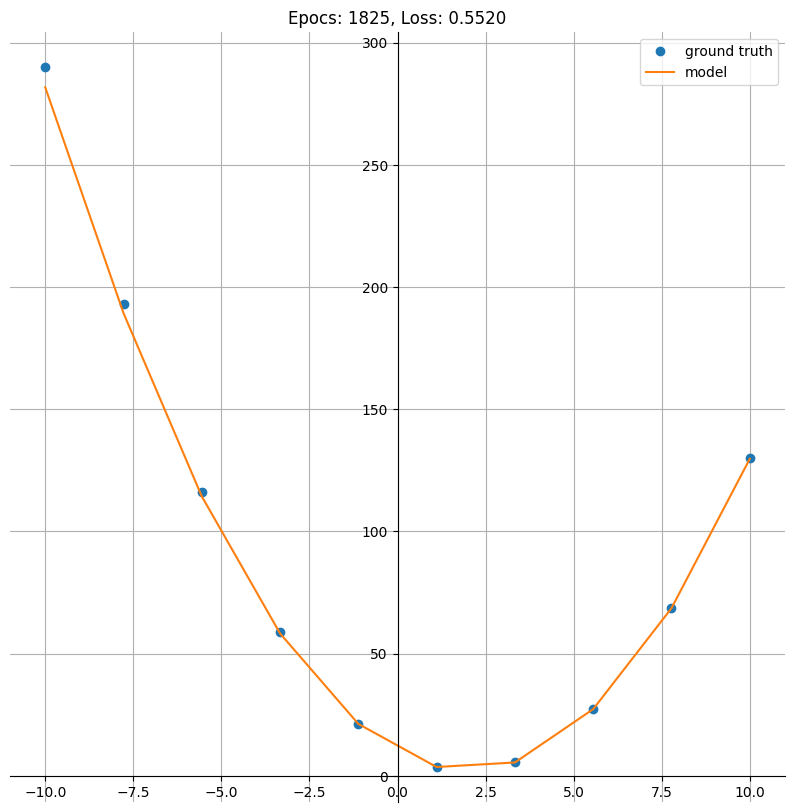

Epoch: 1850; Train Loss: 0.5275830030441284


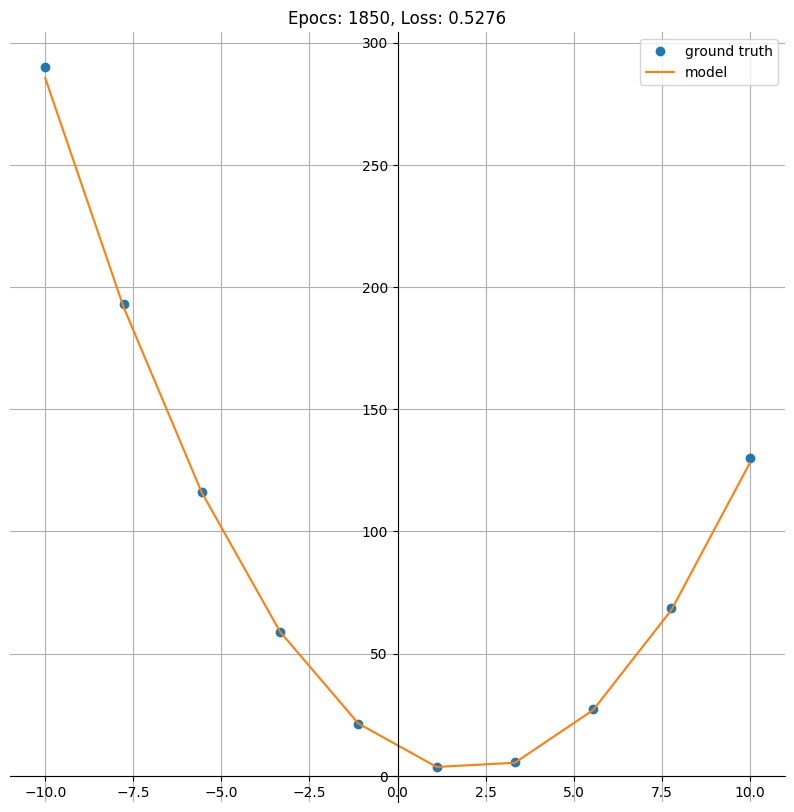

Epoch: 1875; Train Loss: 0.6024621725082397


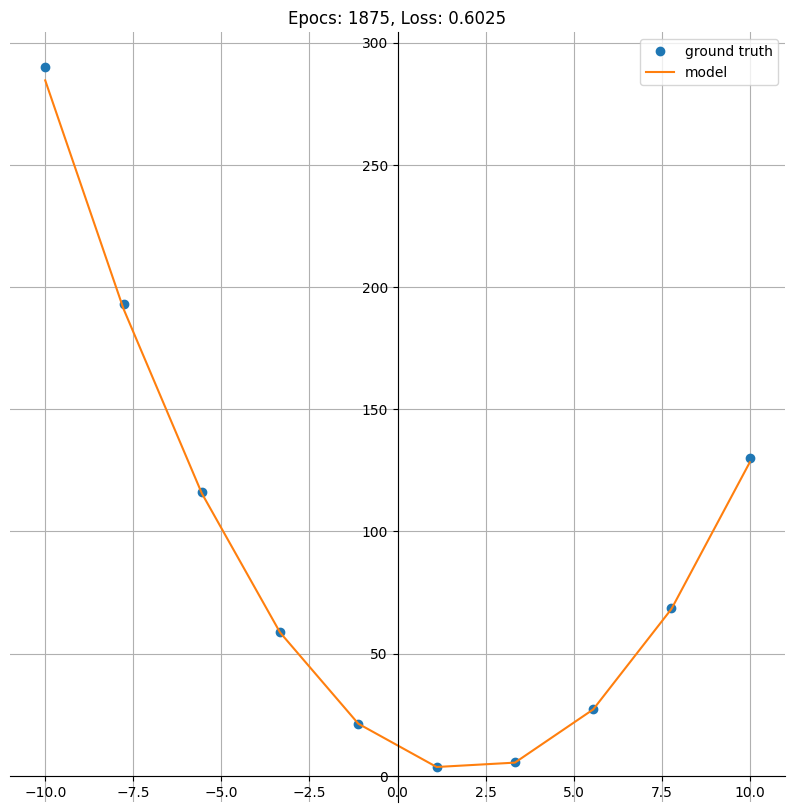

Epoch: 1900; Train Loss: 0.5292262434959412


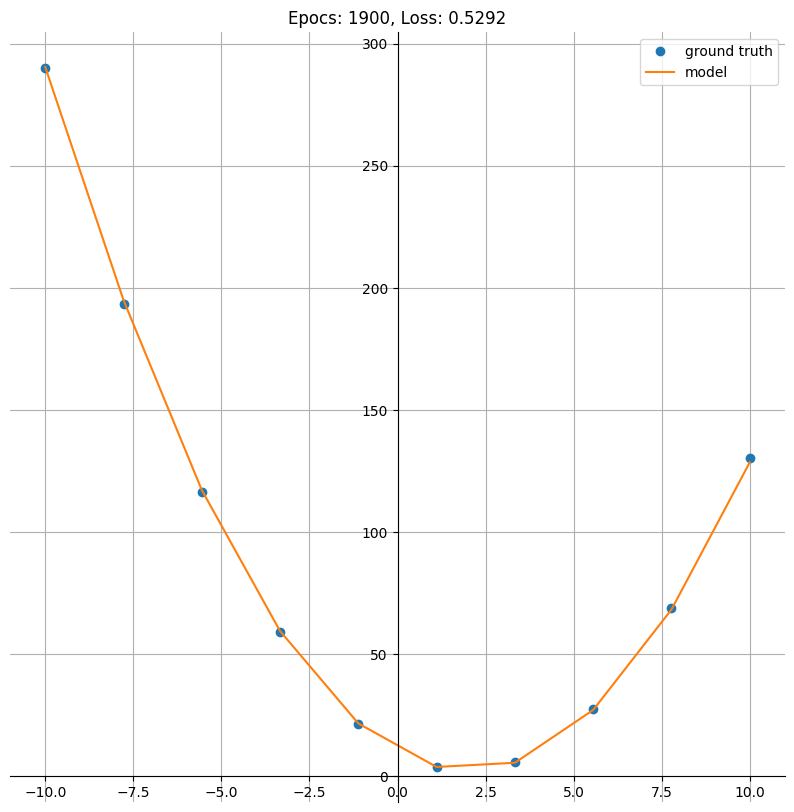

Epoch: 1925; Train Loss: 0.5687116384506226


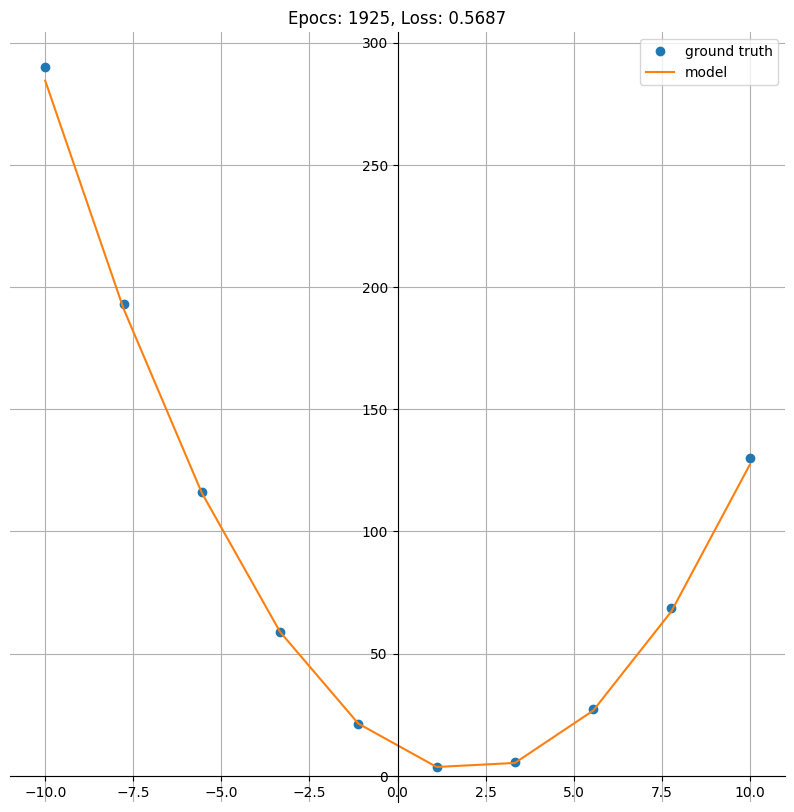

Epoch: 1950; Train Loss: 0.6024353504180908


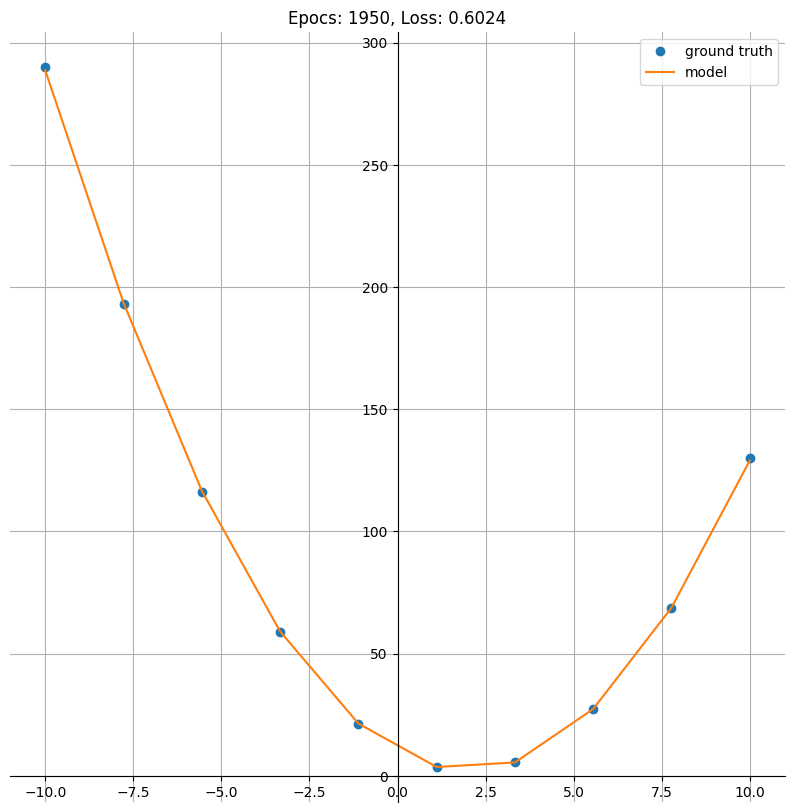

Epoch: 1975; Train Loss: 0.5536914467811584


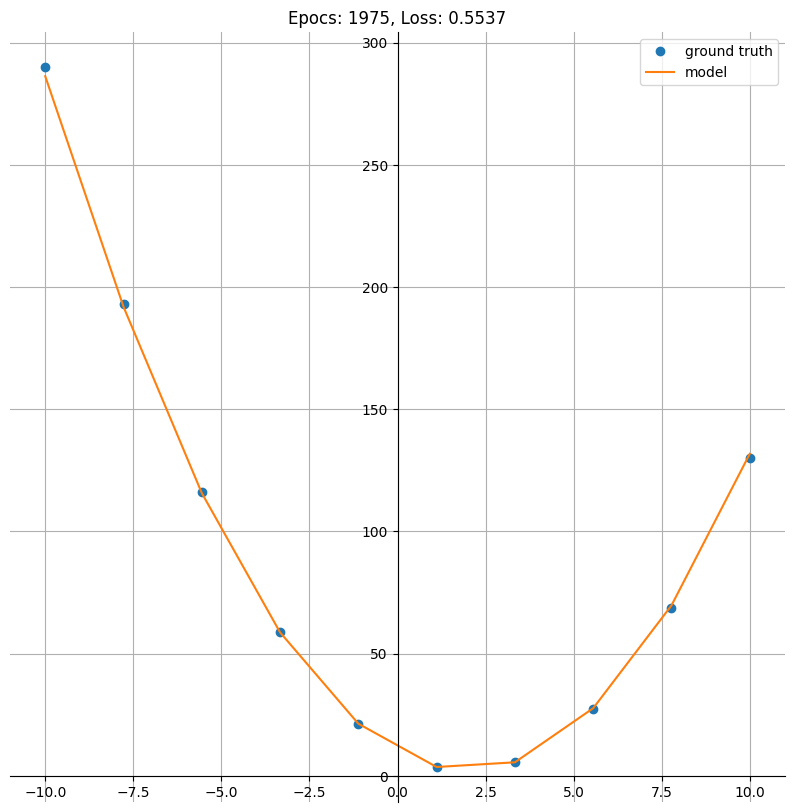

Epoch: 2000; Train Loss: 0.6003296375274658


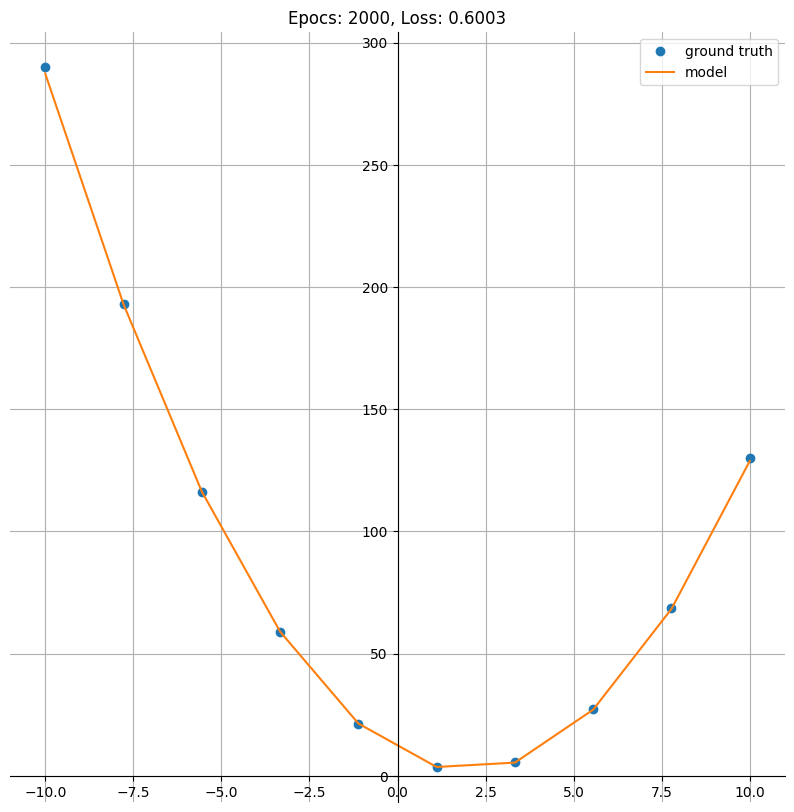

Test Loss: 0.18376398086547852


In [53]:
epochs = 2001

# Let''s make a Gif of the training
filename_output = "./line_approximation_mlp_2.gif"
writer = imageio.get_writer(filename_output, mode='I', duration=0.3)

for t in range(epochs):
  train_loss = train(model, train_dataloader, lossfunc, optimizer)
  if t % 25 == 0:
    print(f"Epoch: {t}; Train Loss: {train_loss}")
    image = plot_comparison(line, model, epoc=t, loss=train_loss)
    # appending to gif
    writer.append_data(image)

test_loss = test(model, test_dataloader, lossfunc)
print(f"Test Loss: {test_loss}")
writer.close()

in the third experiment, the MLP has a slower start in learning the general behavior of the function compared to the seconde experiment, since the learning rate is 100 times smaller than the learning rate in experiment 2. But it was more successfull in obtaining that last fine tunning that was not possible in experiment 2, considering the "big" learning steps that were being taken. By the epoch 1000, the MLP was already presenting a much lower train and test loss than in the last experiment and it can be seen by the graphs that it produced a much better fit to the $f(x)$ function.

### Experiment 4

For this experiment we will change the network architecture adding two more layers:
* The first layer is composed by 1 neuron and its result is feeded in a leaky ReLU activation function.
* The second one has 10 neurons and also feeds a Leaky ReLU.
* The third has 100 neurons and also feeds a Leaky ReLU.
* The fourth, 100 neurons, all feeding their outputs to a Leaky ReLU.
* The fifth, 100 neurons and no activation function.
* The sixth, and last, has 1 neuron and no activation function either.

The learning rate and loss function were mantained in relation to the third experiment so we can compare both more properly.

In [54]:
activation_function = nn.LeakyReLU()

#Define the Model Architecture
class MultiLayerNetwork(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
        nn.Linear(1, 10),
        activation_function,
        nn.Linear(10, 100),
        activation_function,
        nn.Linear(100, 100),
        activation_function,
        nn.Linear(100, 100),
        activation_function,
        nn.Linear(100, 10),
        nn.Linear(10, 1)
    )


  def forward(self, x):
    return self.layers(x)

In [55]:
model = MultiLayerNetwork().to(device)

In [56]:
# Loss Function: Mean Squared Error
lossfunc = nn.L1Loss()

# SGD = Stochastic Gradient Descent
optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

Epoch: 0; Train Loss: 69.91454315185547


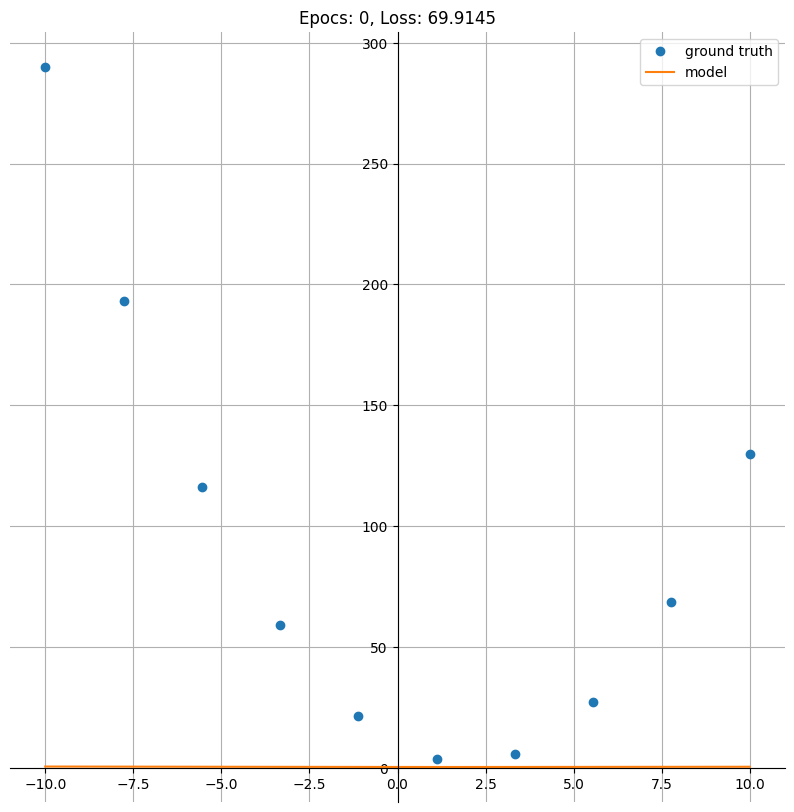

Epoch: 25; Train Loss: 9.865509033203125


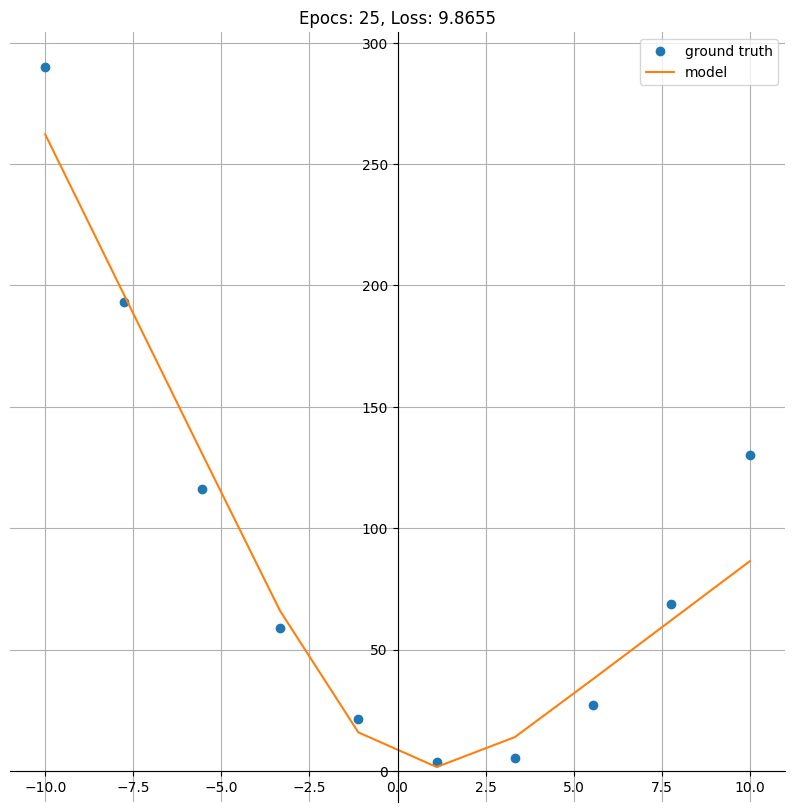

Epoch: 50; Train Loss: 5.939398765563965


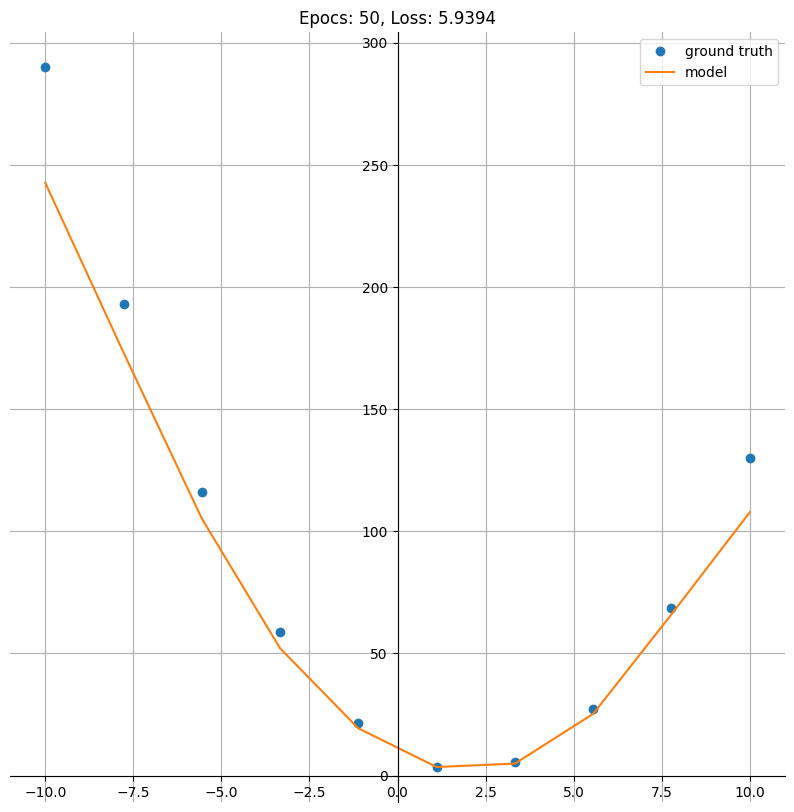

Epoch: 75; Train Loss: 6.062623977661133


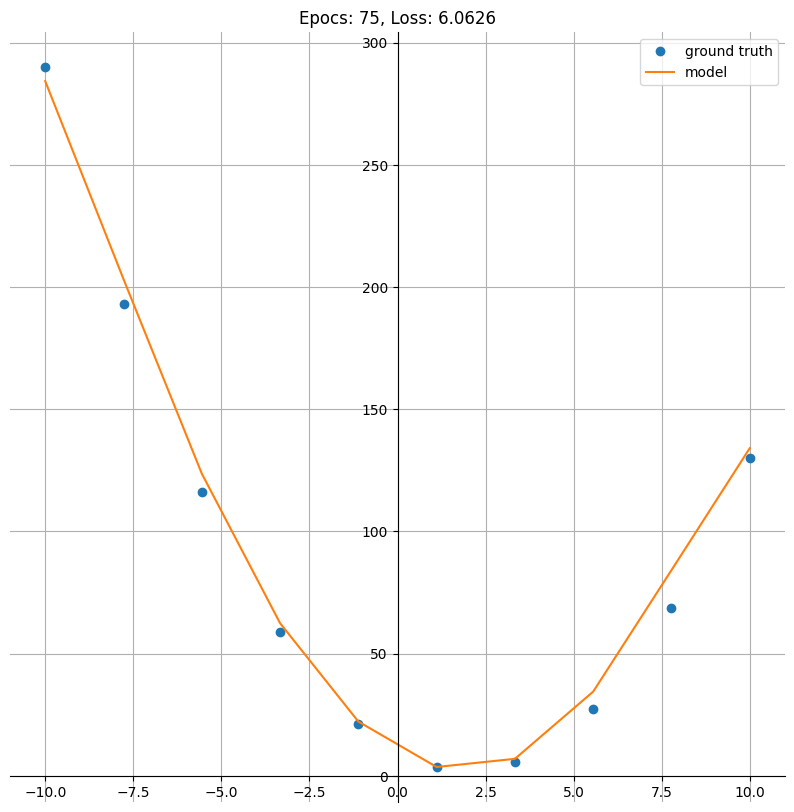

Epoch: 100; Train Loss: 5.045938014984131


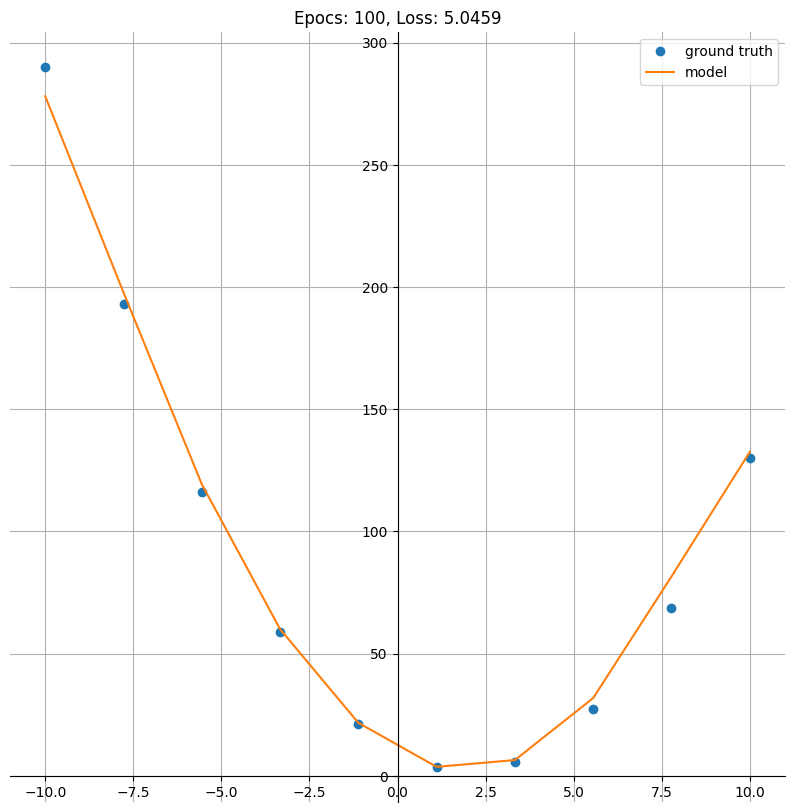

Epoch: 125; Train Loss: 5.358791828155518


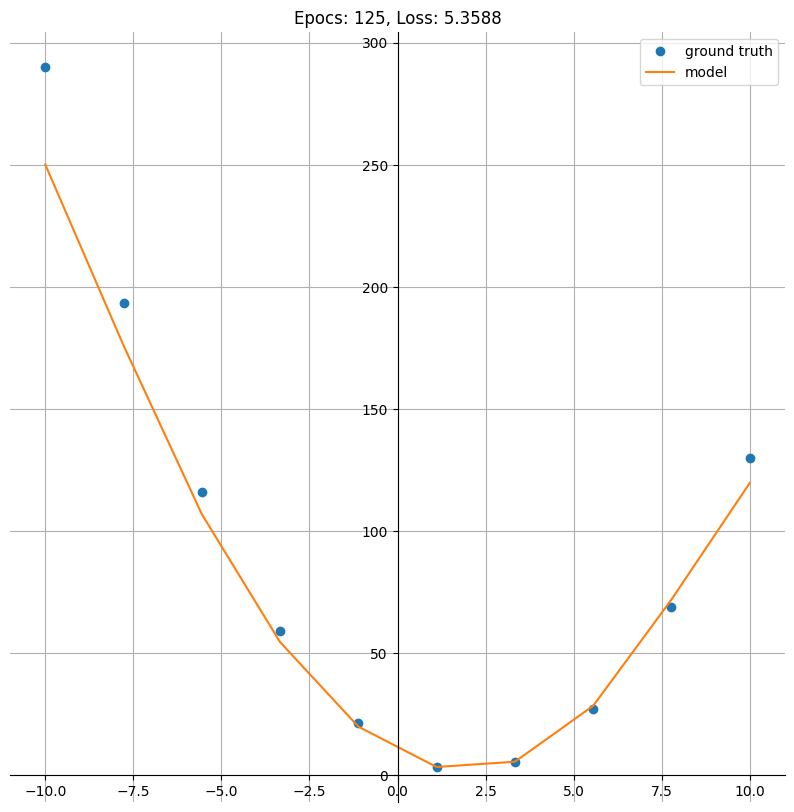

Epoch: 150; Train Loss: 5.07083797454834


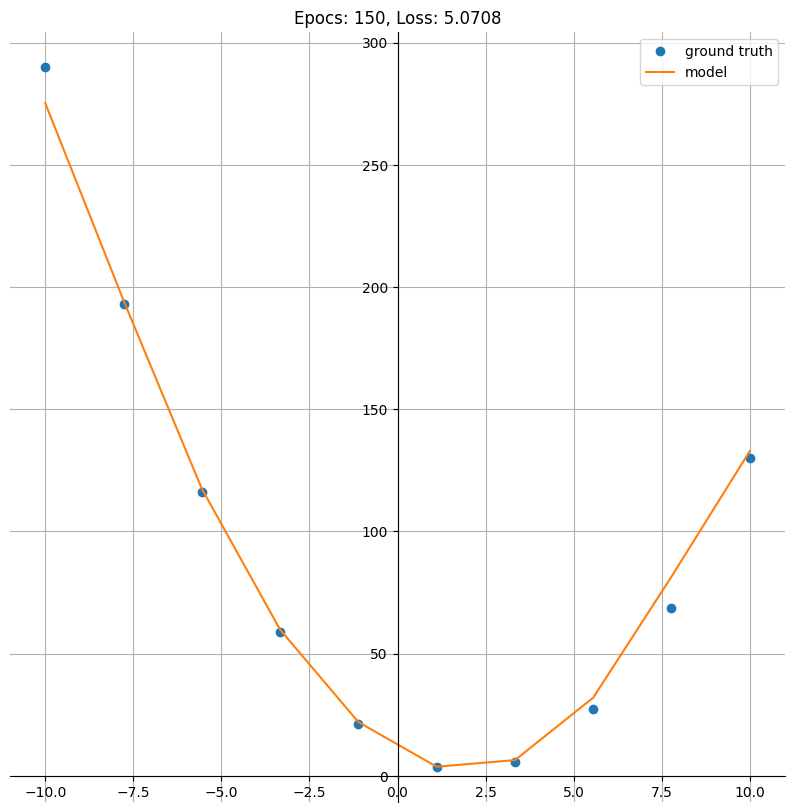

Epoch: 175; Train Loss: 4.9570841789245605


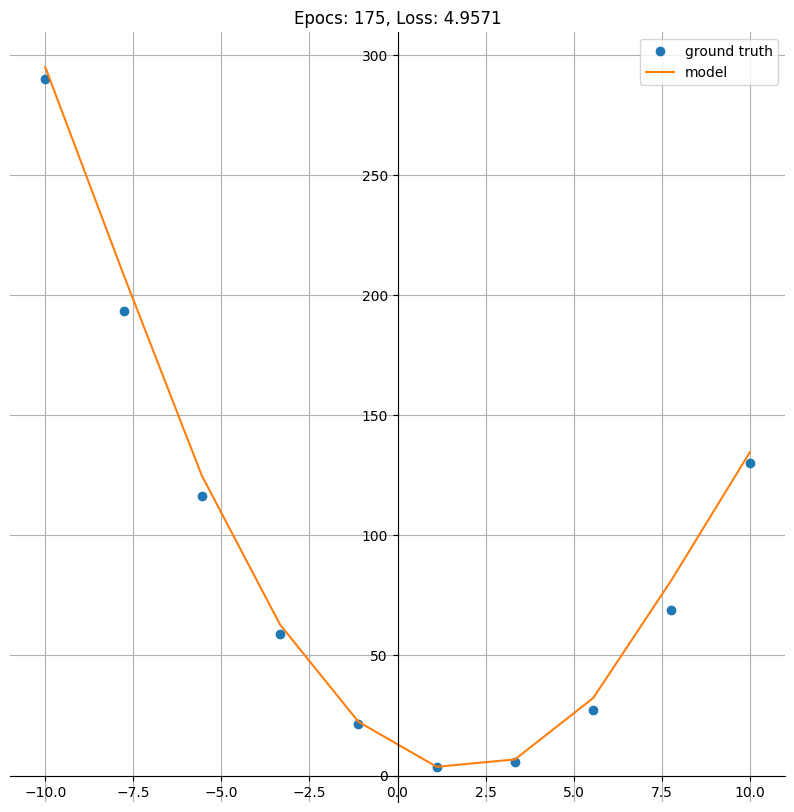

Epoch: 200; Train Loss: 5.297749042510986


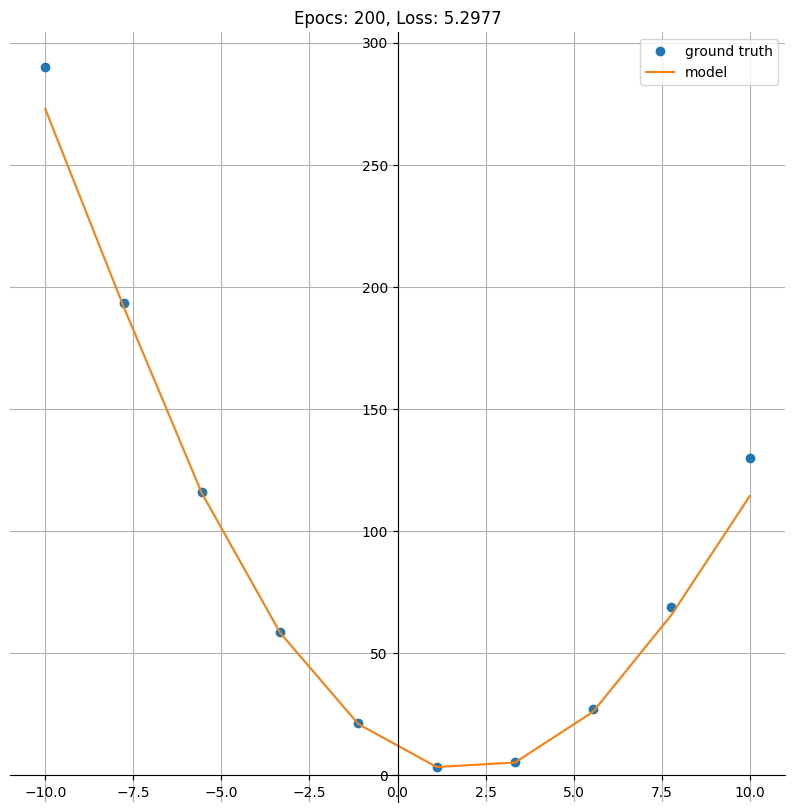

Epoch: 225; Train Loss: 5.056911468505859


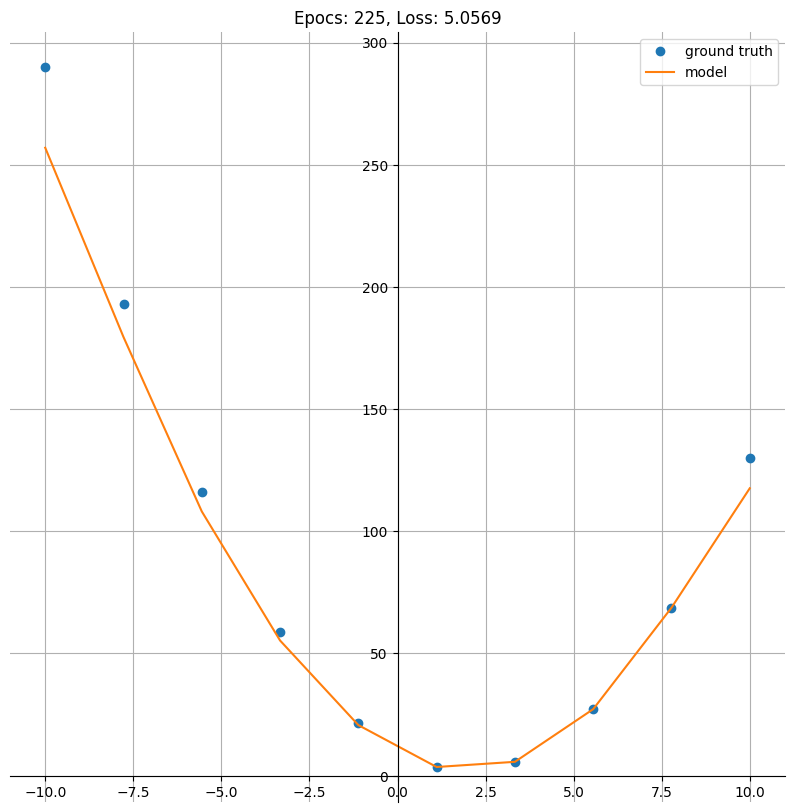

Epoch: 250; Train Loss: 4.300714492797852


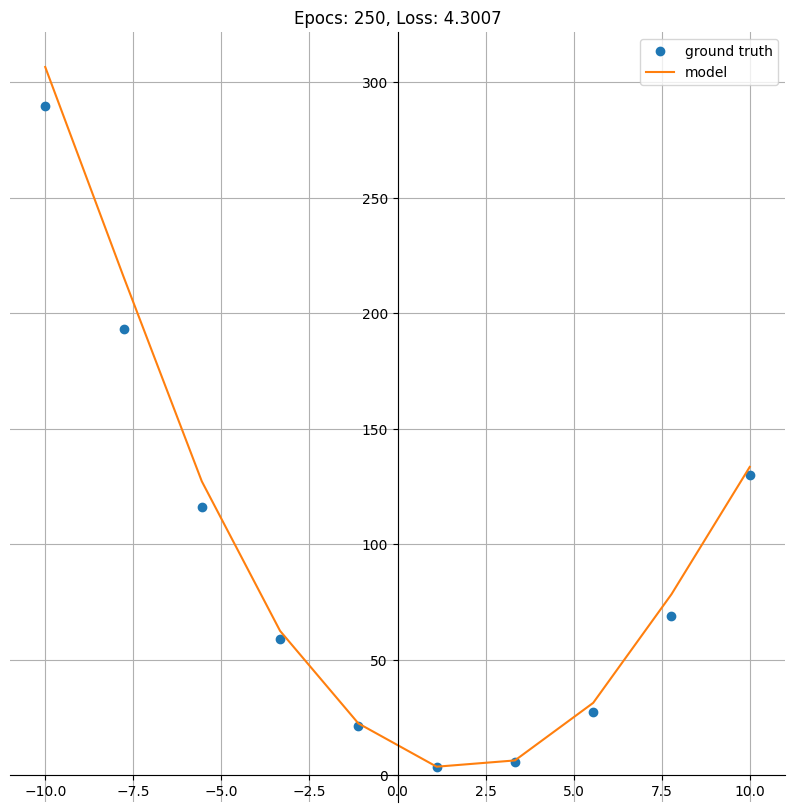

Epoch: 275; Train Loss: 4.921710968017578


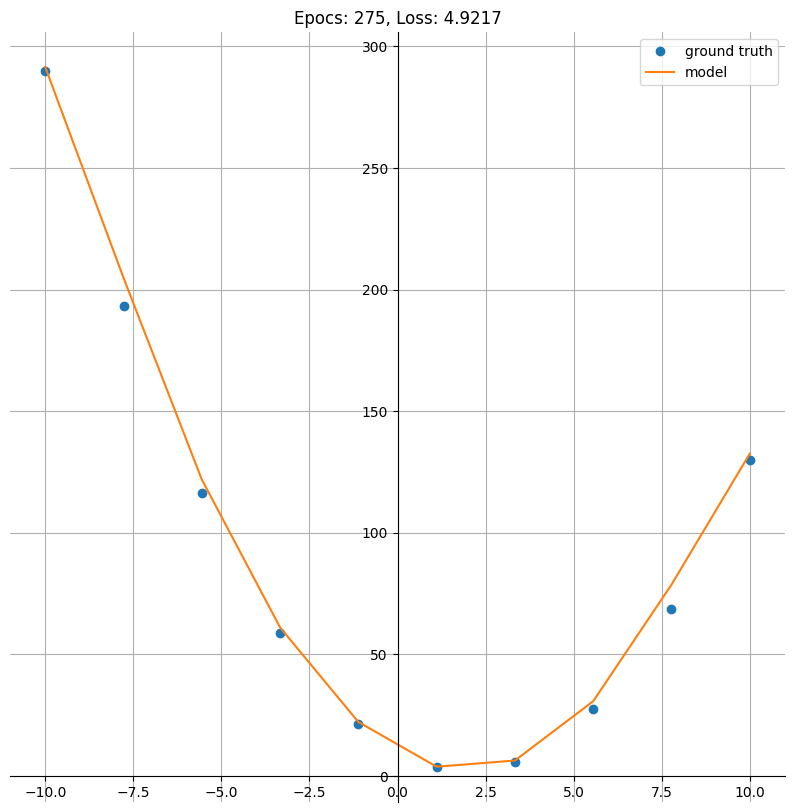

Epoch: 300; Train Loss: 4.444438934326172


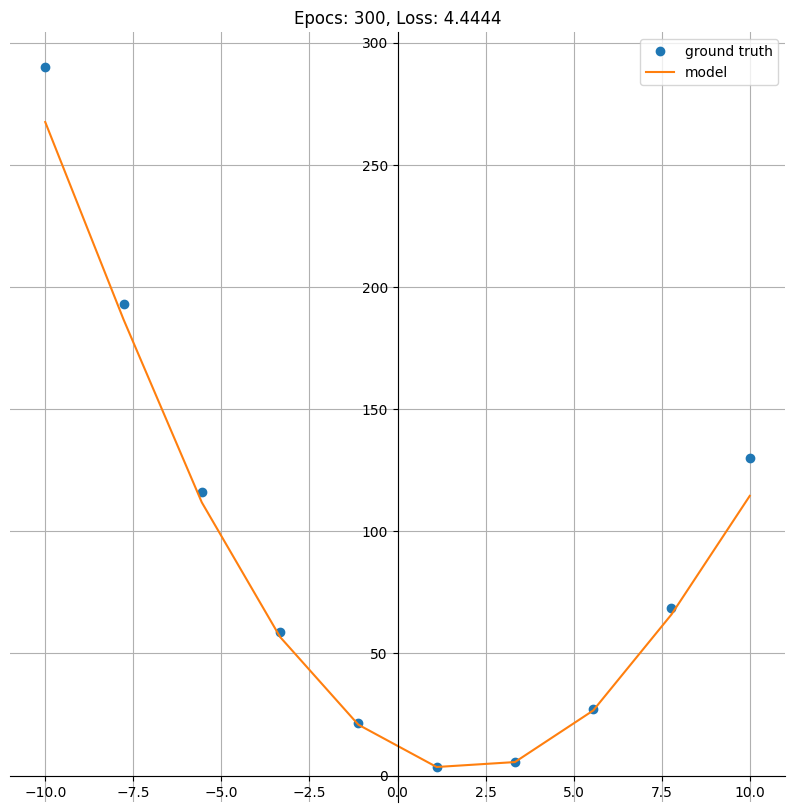

Epoch: 325; Train Loss: 4.393774509429932


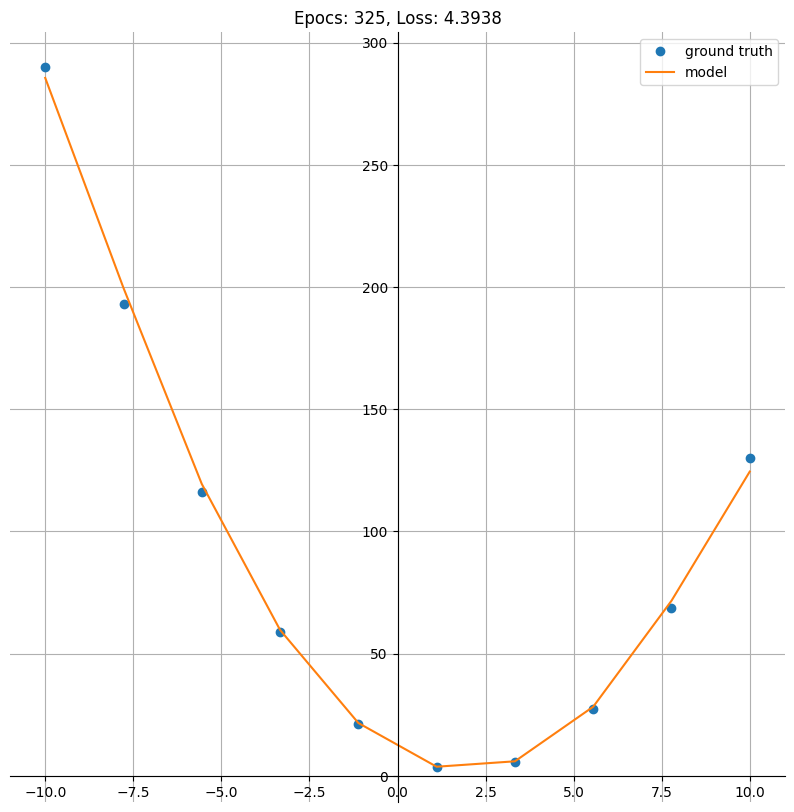

Epoch: 350; Train Loss: 4.78916072845459


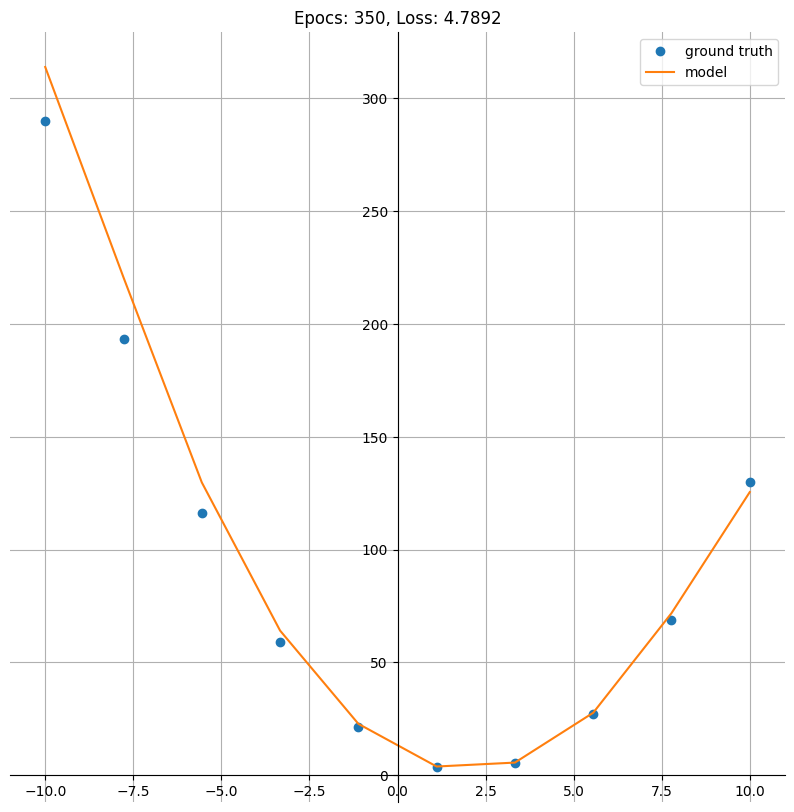

Epoch: 375; Train Loss: 4.99232292175293


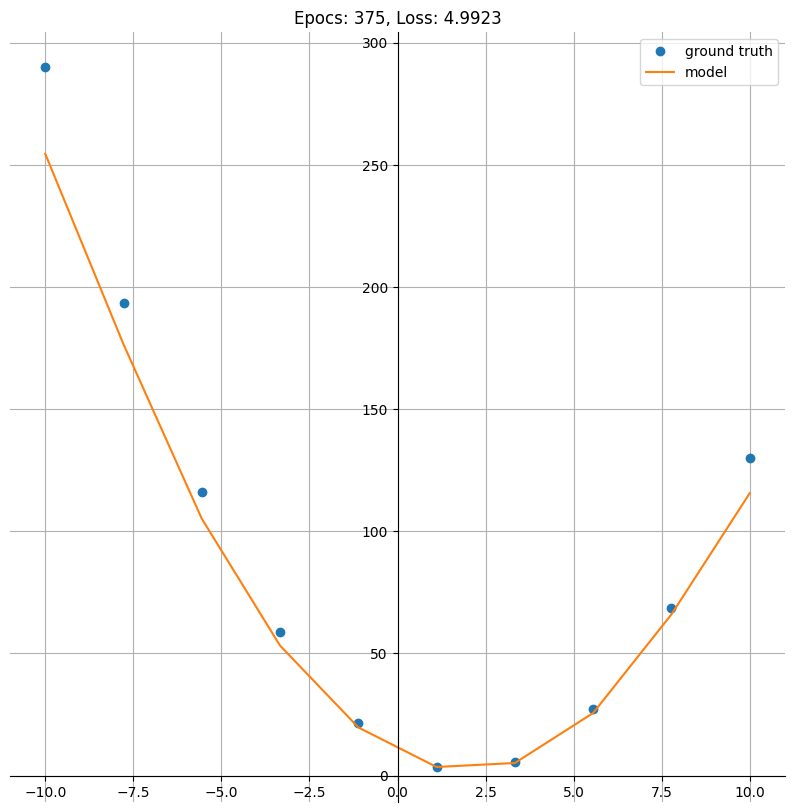

Epoch: 400; Train Loss: 4.297817707061768


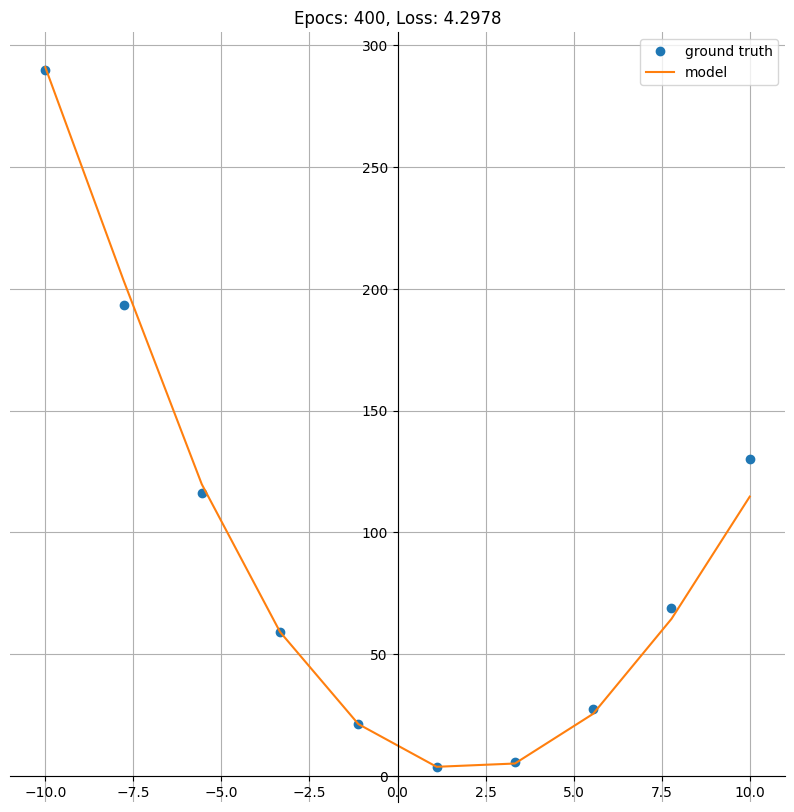

Epoch: 425; Train Loss: 4.246052265167236


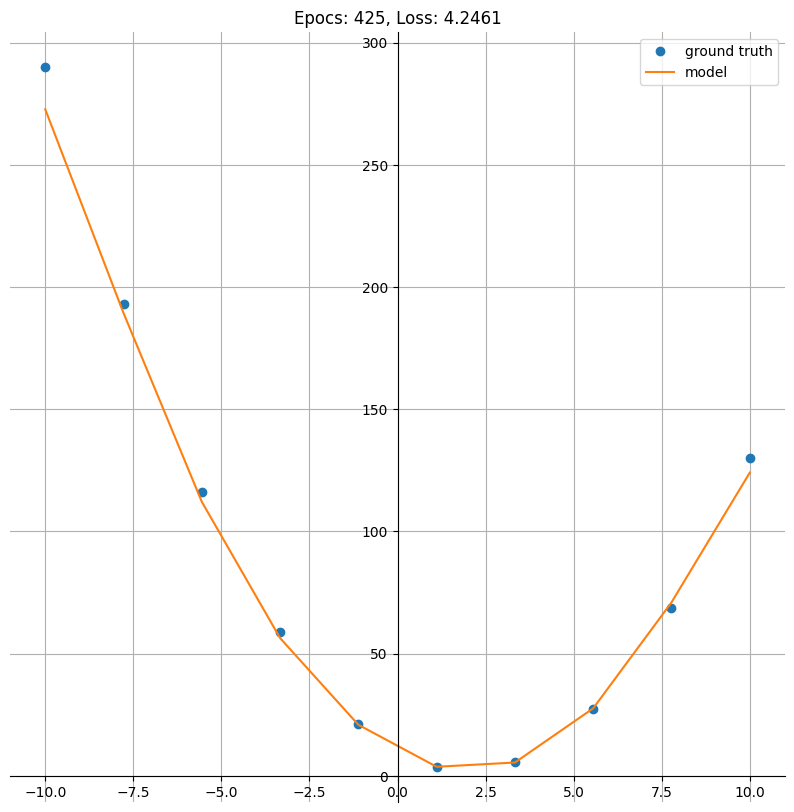

Epoch: 450; Train Loss: 4.56374979019165


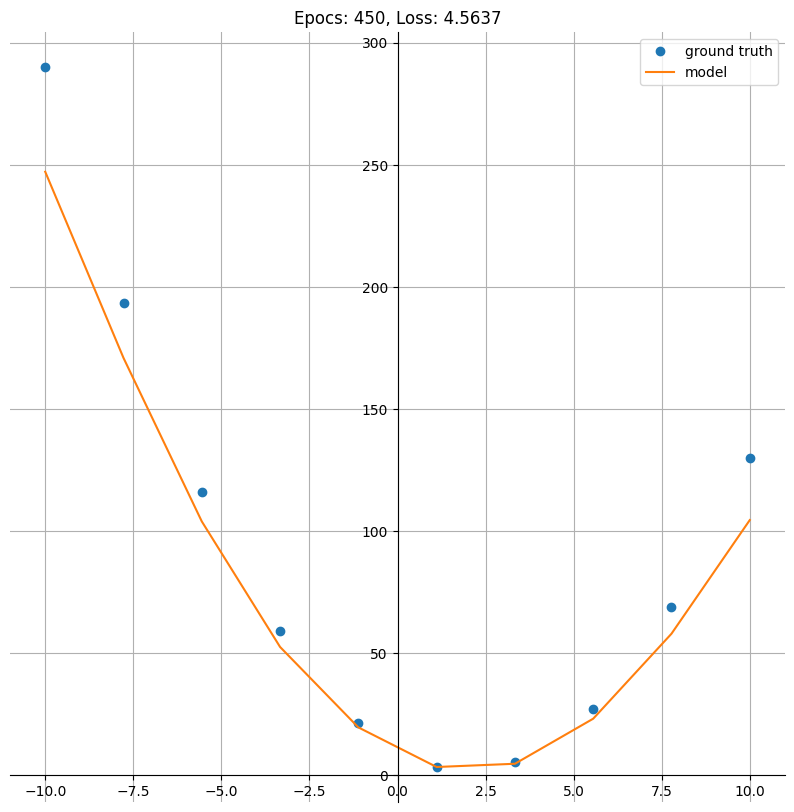

Epoch: 475; Train Loss: 4.840662956237793


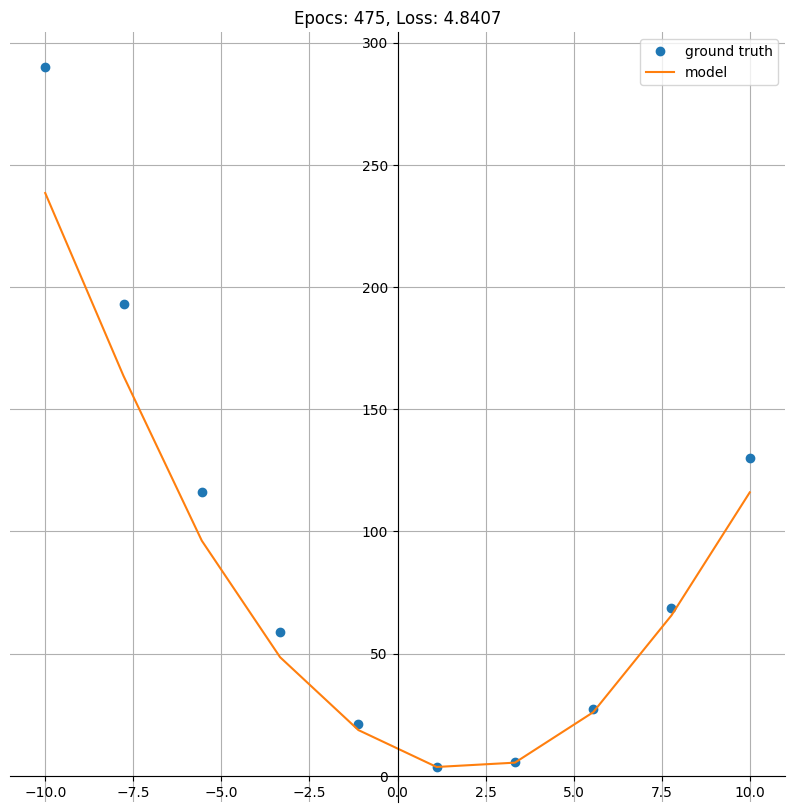

Epoch: 500; Train Loss: 4.614530563354492


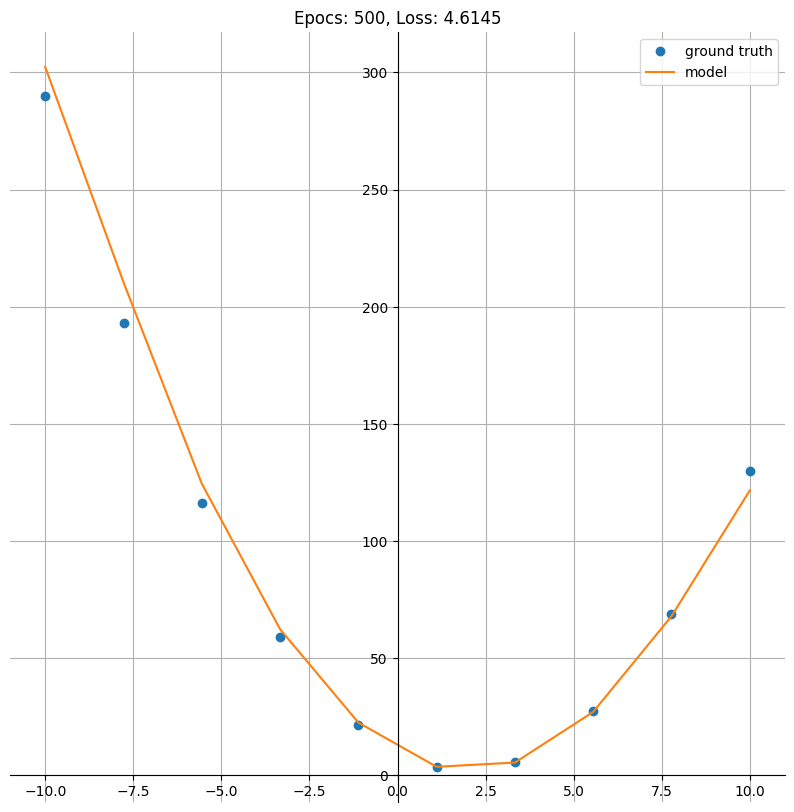

Epoch: 525; Train Loss: 4.573357105255127


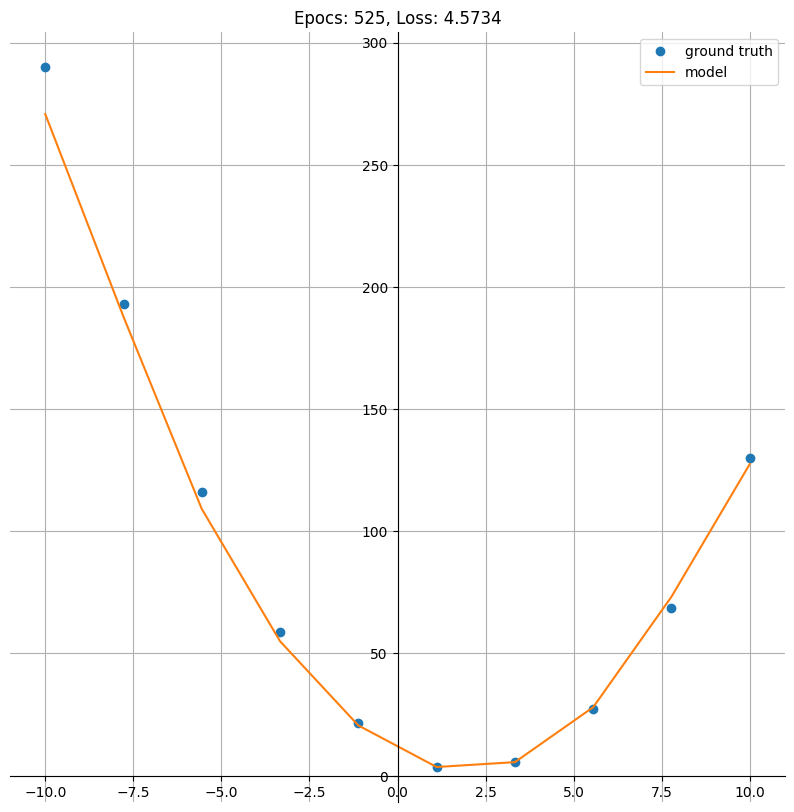

Epoch: 550; Train Loss: 4.0215277671813965


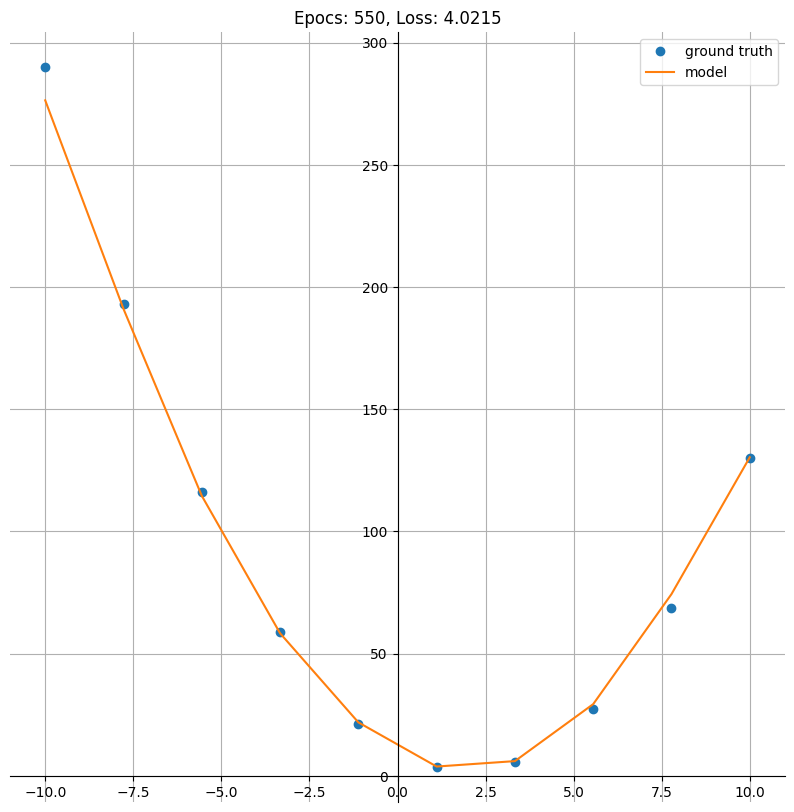

Epoch: 575; Train Loss: 4.313992977142334


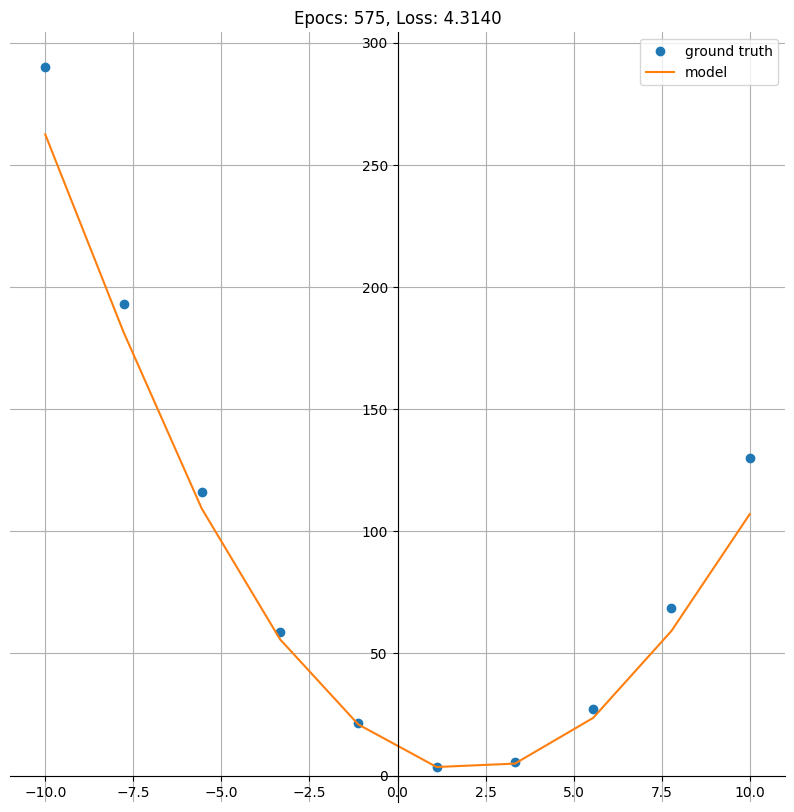

Epoch: 600; Train Loss: 3.648969888687134


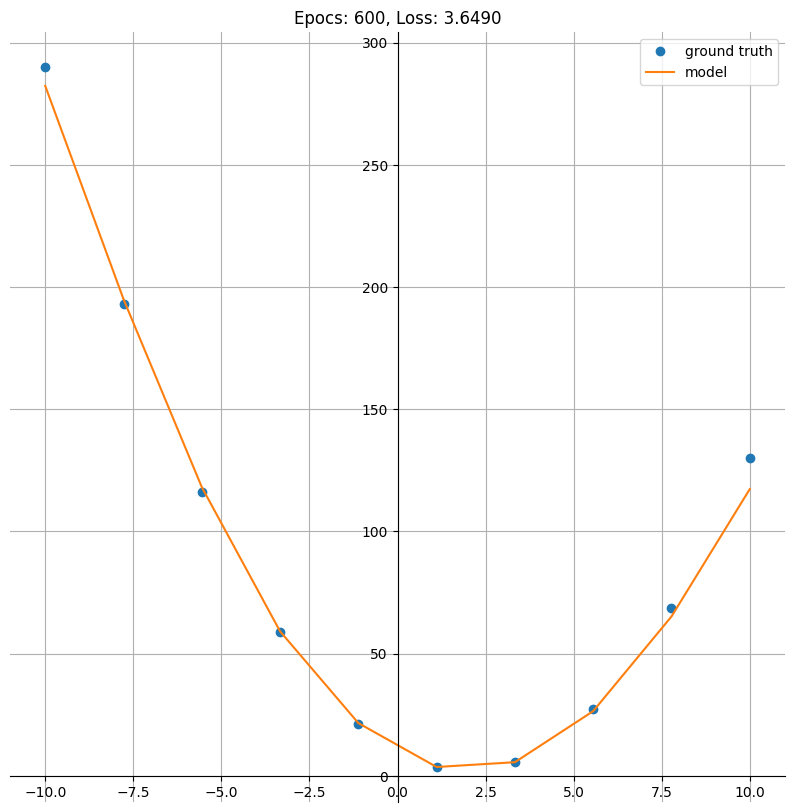

Epoch: 625; Train Loss: 4.360383033752441


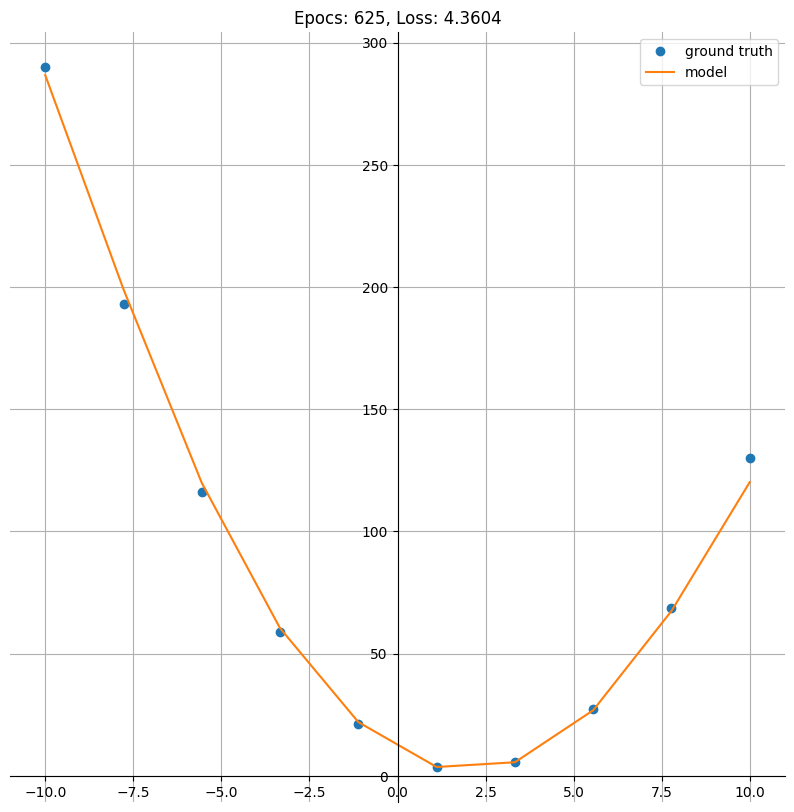

Epoch: 650; Train Loss: 4.751430511474609


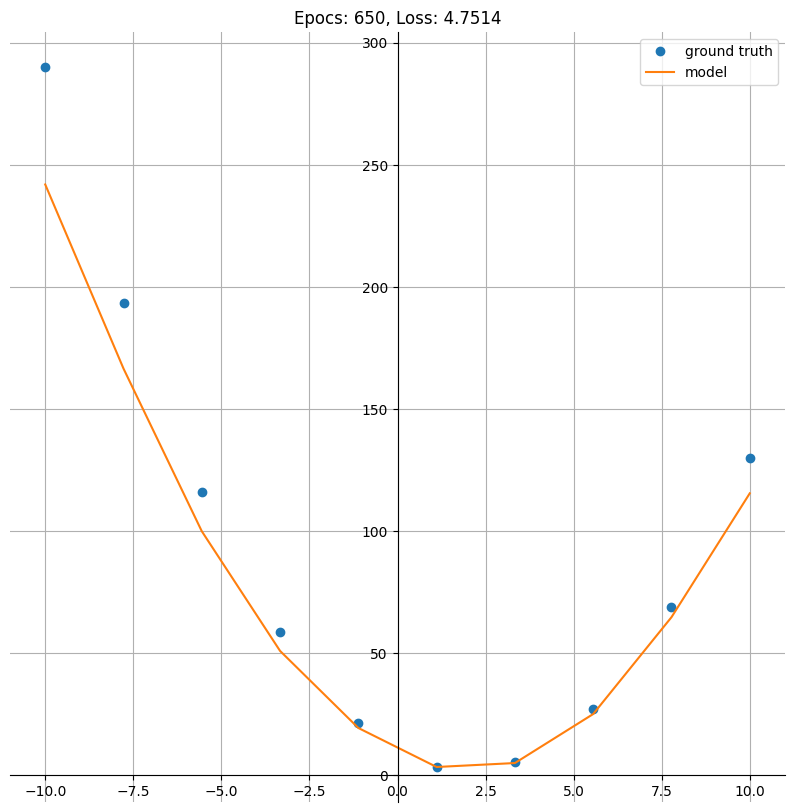

Epoch: 675; Train Loss: 4.427210807800293


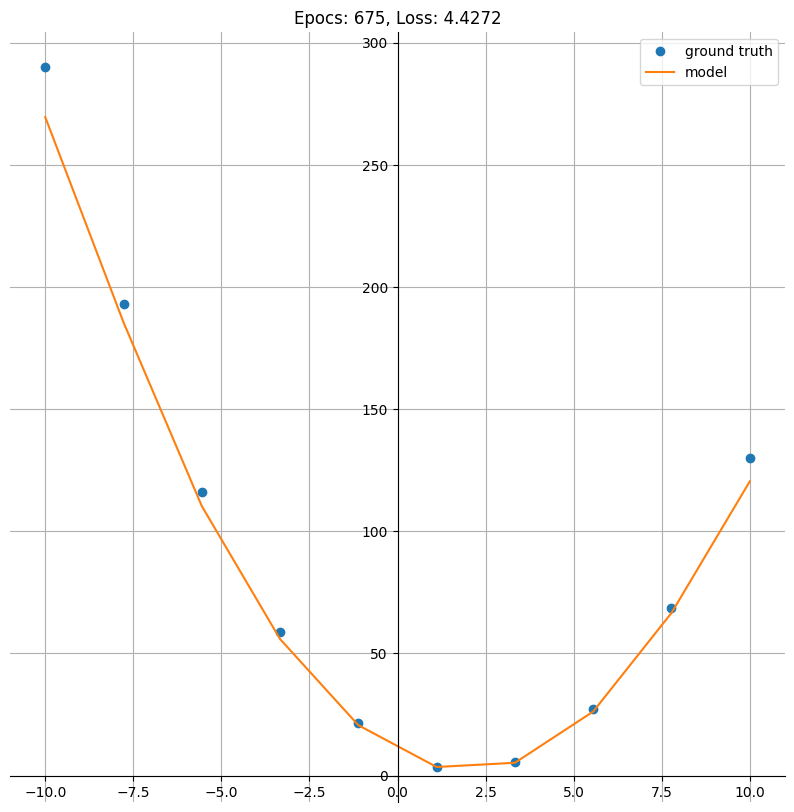

Epoch: 700; Train Loss: 4.386358261108398


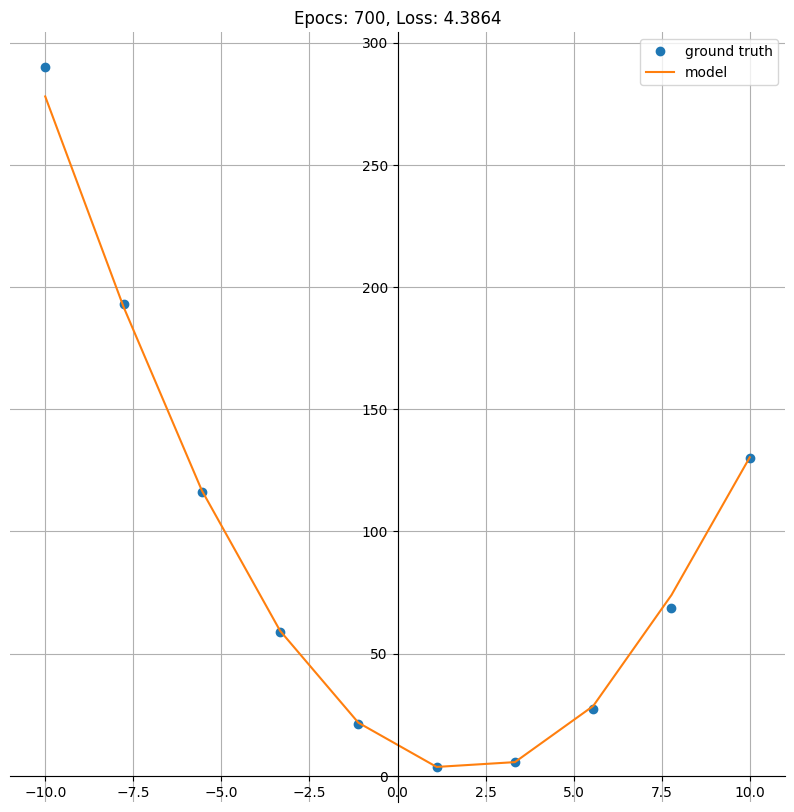

Epoch: 725; Train Loss: 4.25647497177124


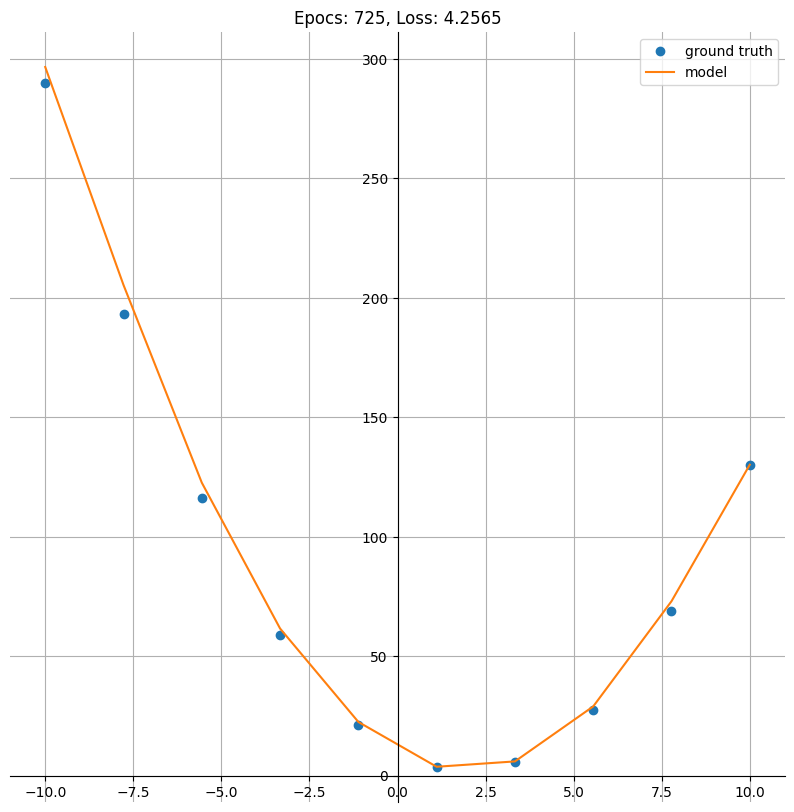

Epoch: 750; Train Loss: 4.119277000427246


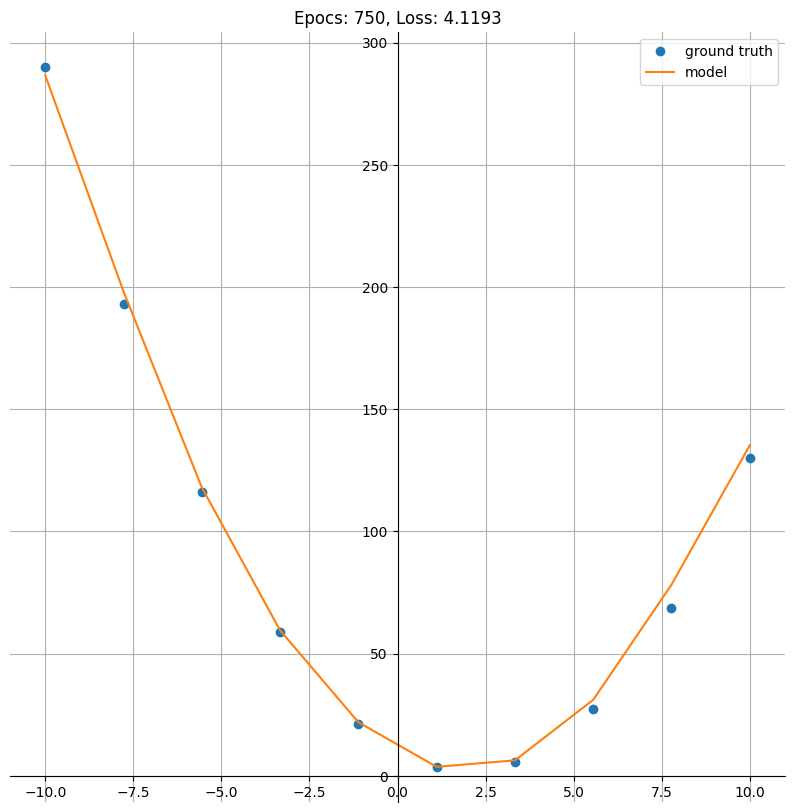

Epoch: 775; Train Loss: 4.207236289978027


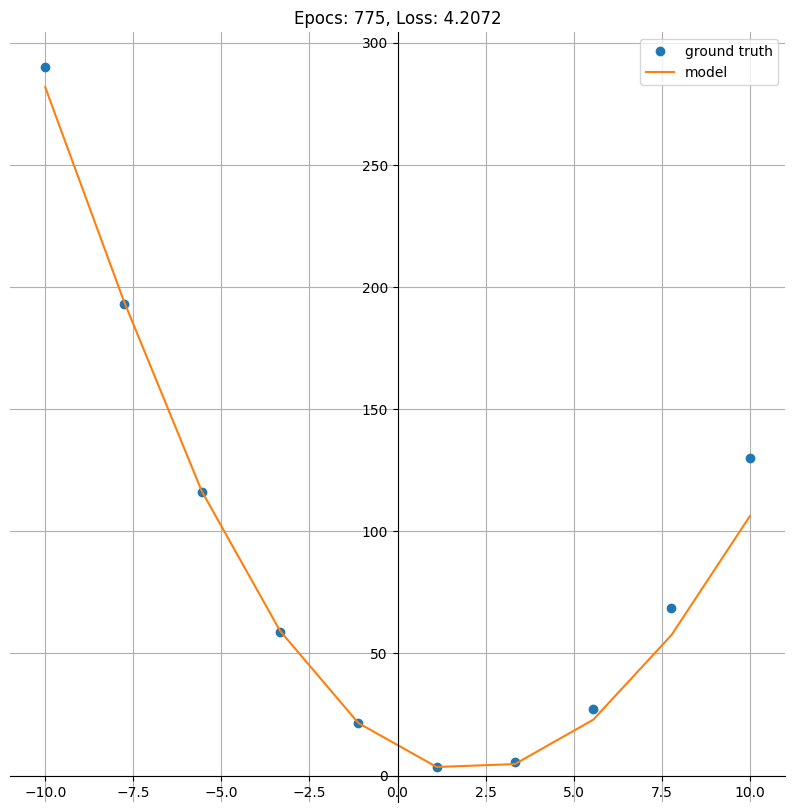

Epoch: 800; Train Loss: 4.070052623748779


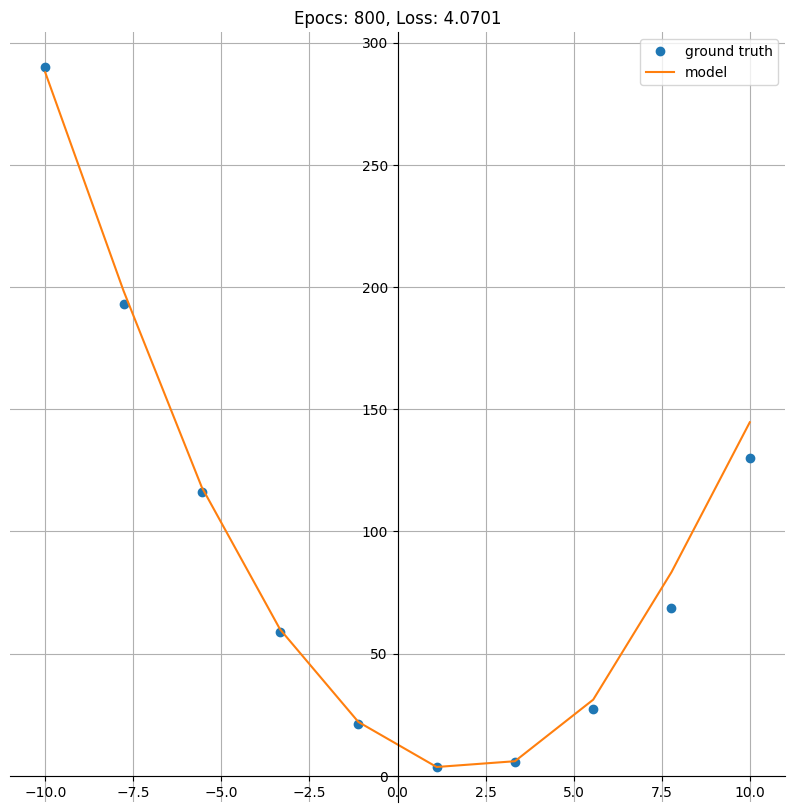

Epoch: 825; Train Loss: 4.187013626098633


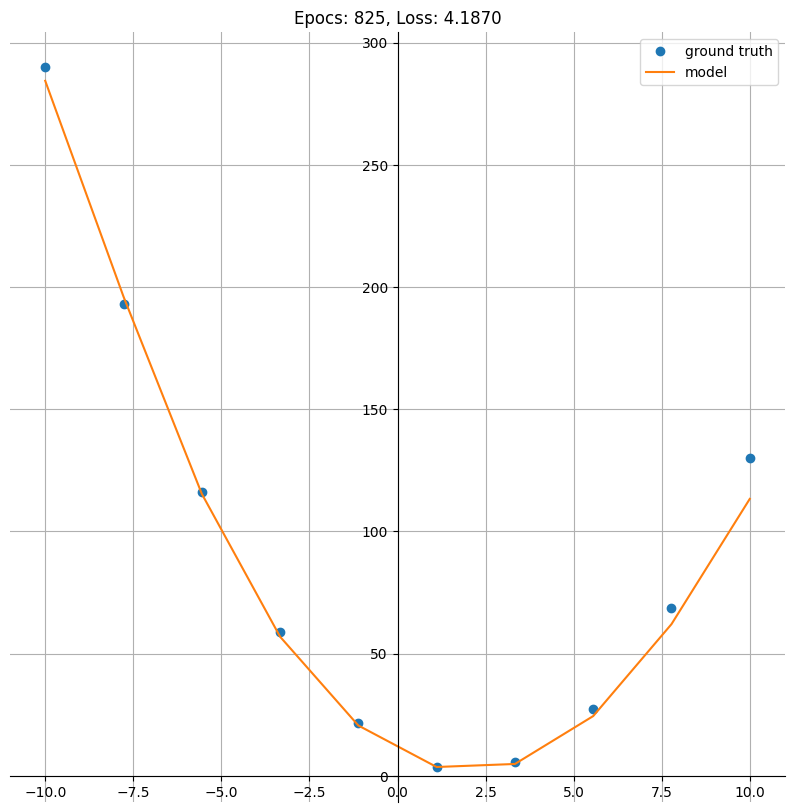

Epoch: 850; Train Loss: 3.886512279510498


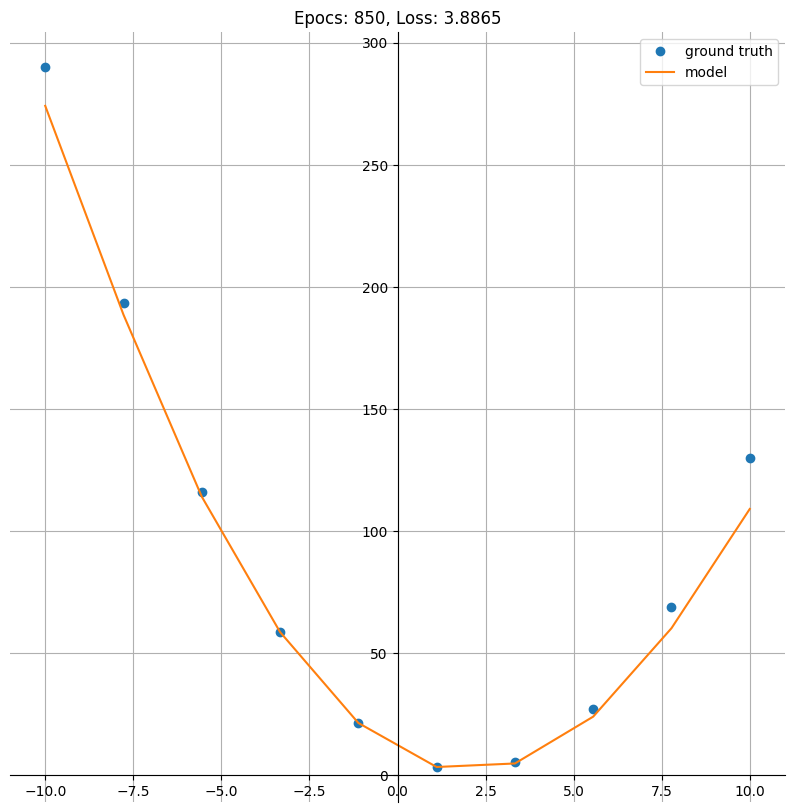

Epoch: 875; Train Loss: 3.8822379112243652


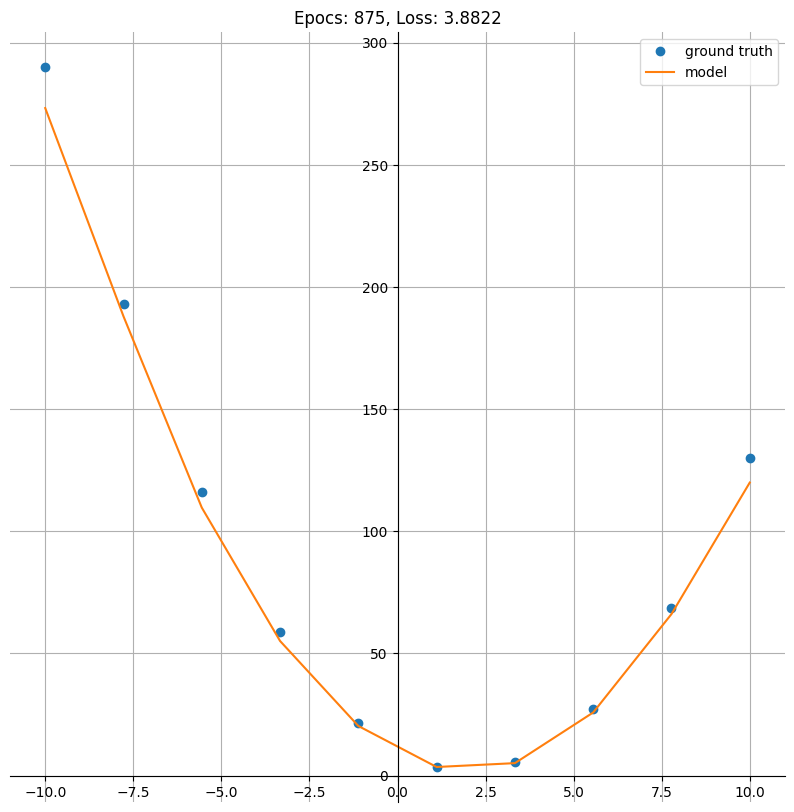

Epoch: 900; Train Loss: 4.1350297927856445


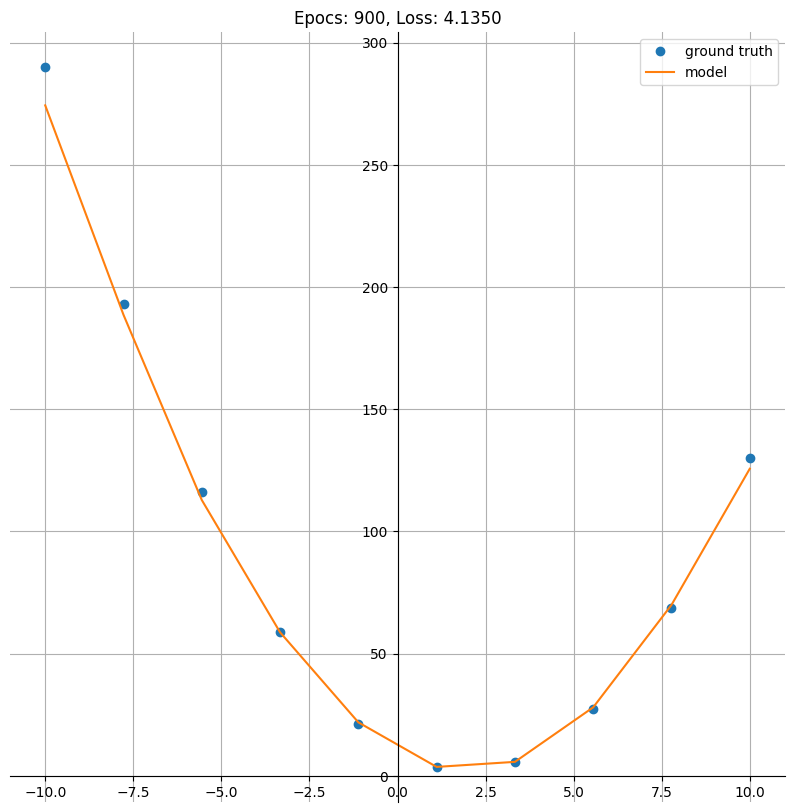

Epoch: 925; Train Loss: 4.0854172706604


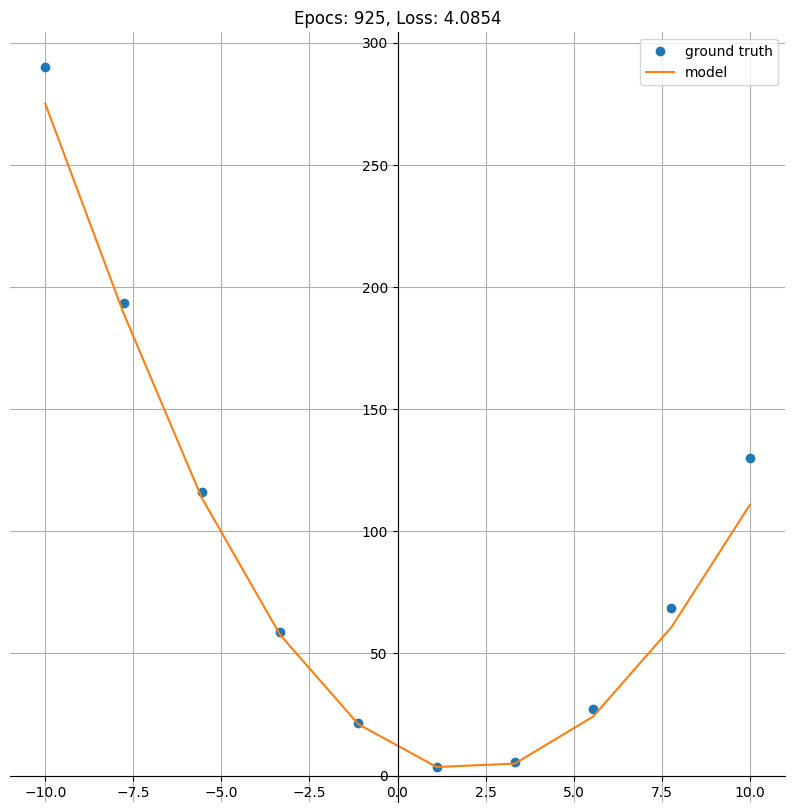

Epoch: 950; Train Loss: 3.998924493789673


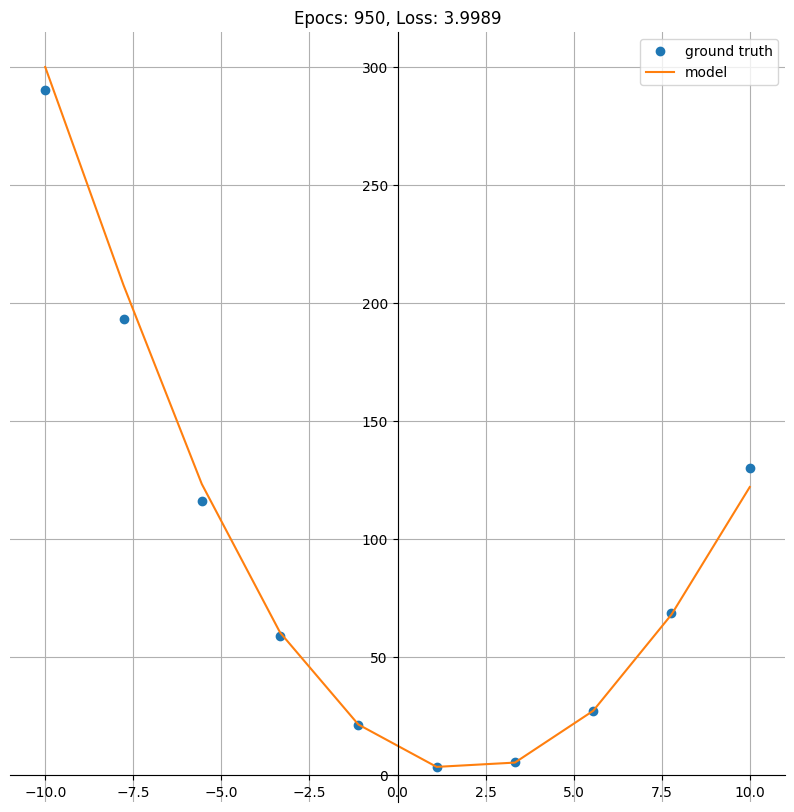

Epoch: 975; Train Loss: 4.144837379455566


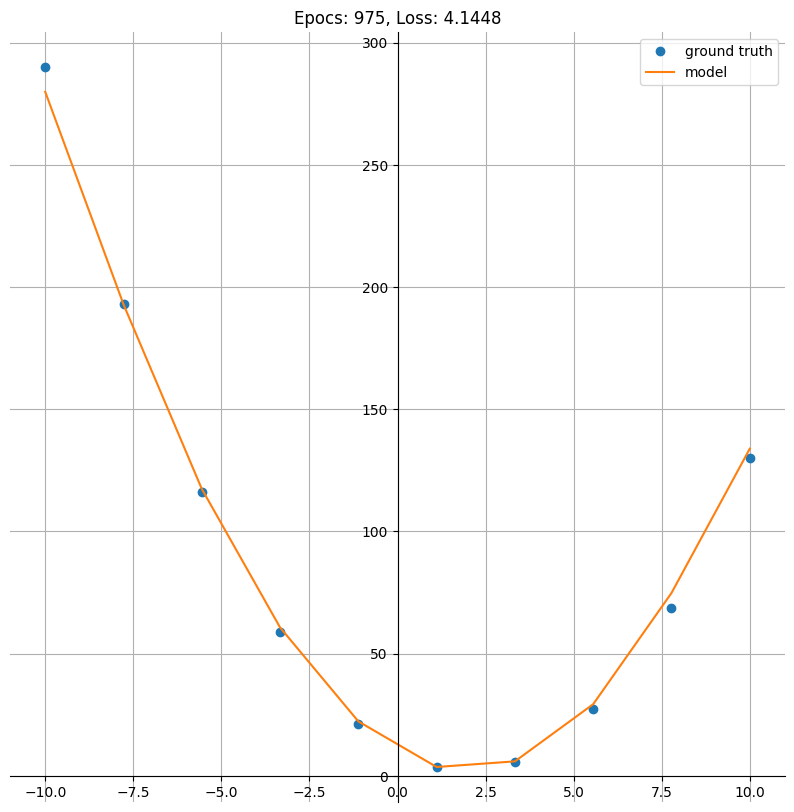

Epoch: 1000; Train Loss: 4.086193084716797


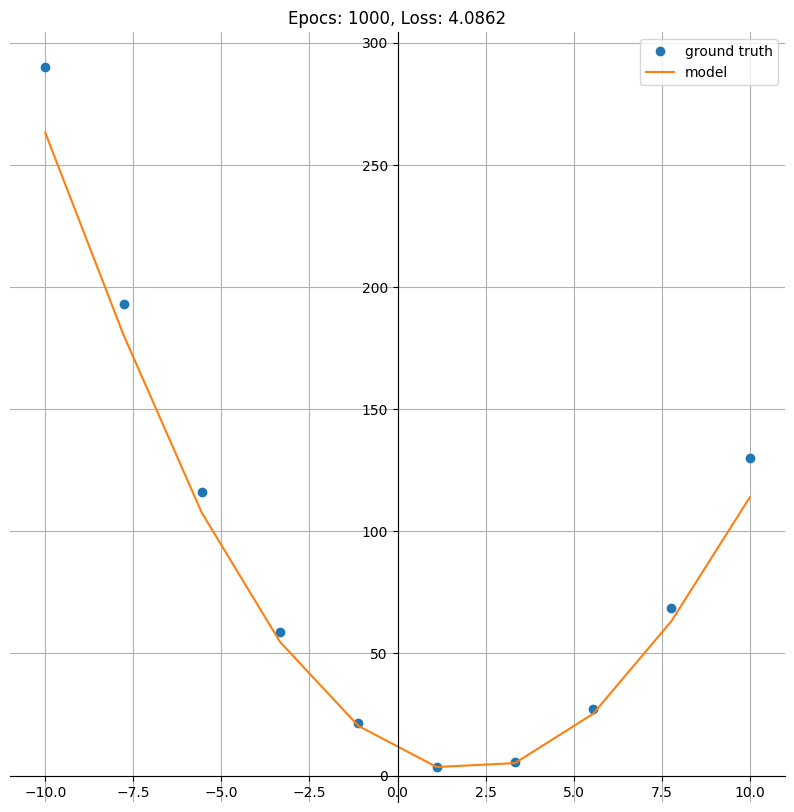

Epoch: 1025; Train Loss: 3.82692813873291


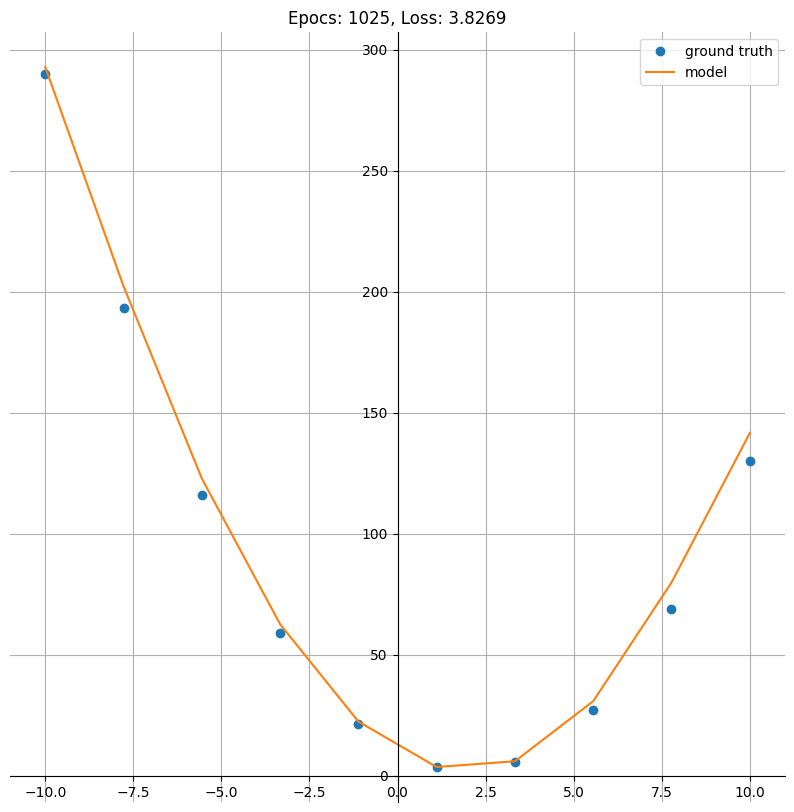

Epoch: 1050; Train Loss: 4.426210403442383


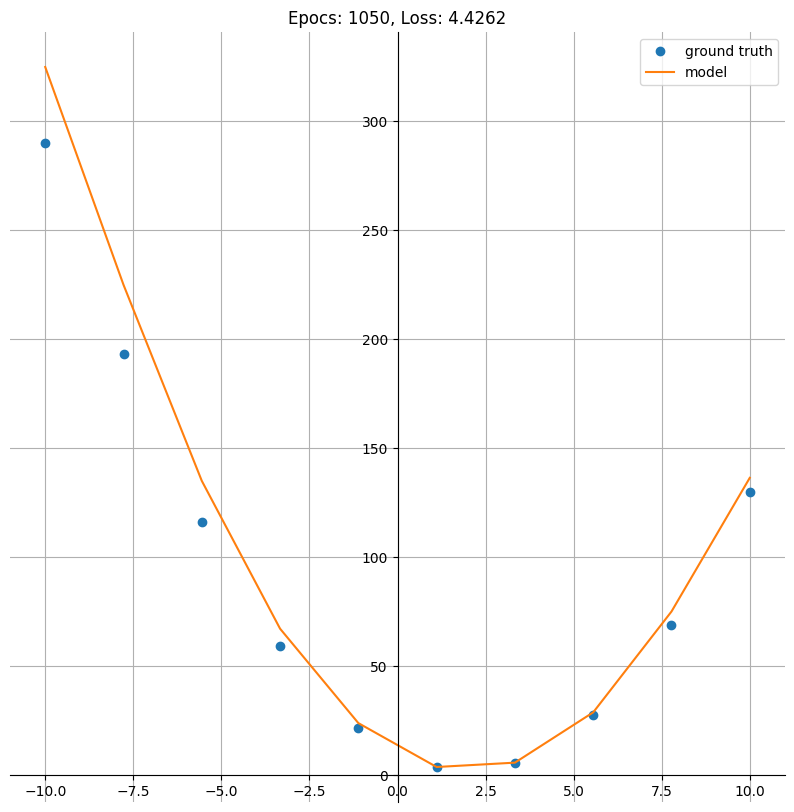

Epoch: 1075; Train Loss: 3.9565868377685547


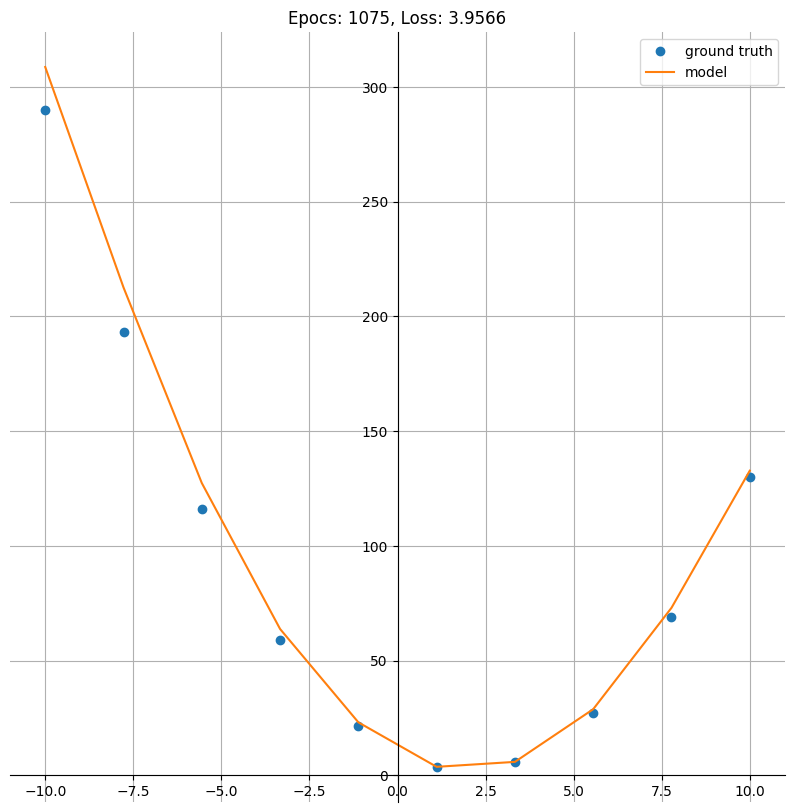

Epoch: 1100; Train Loss: 3.9490630626678467


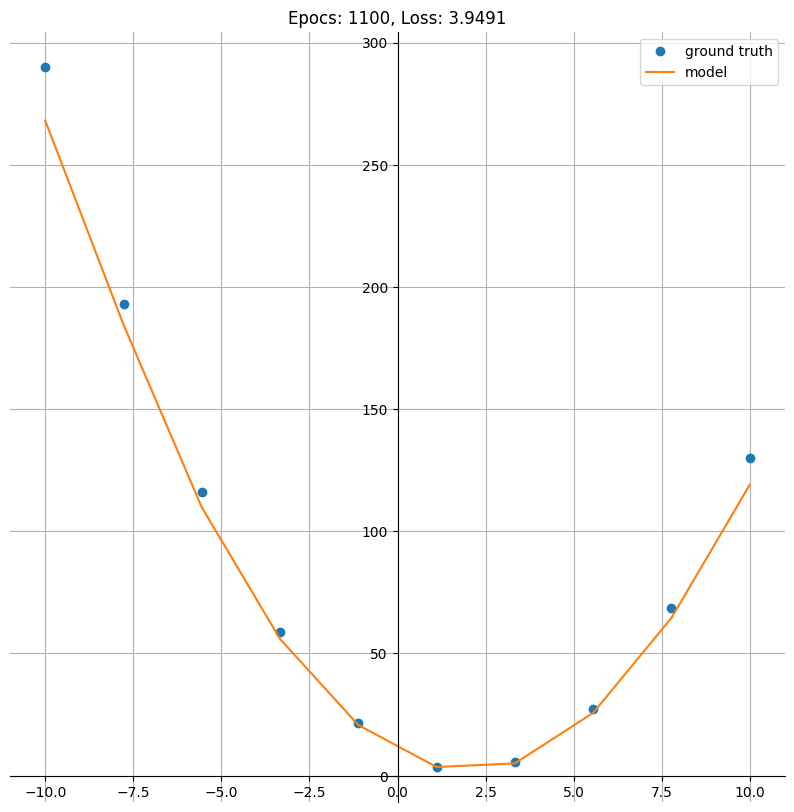

Epoch: 1125; Train Loss: 3.8410372734069824


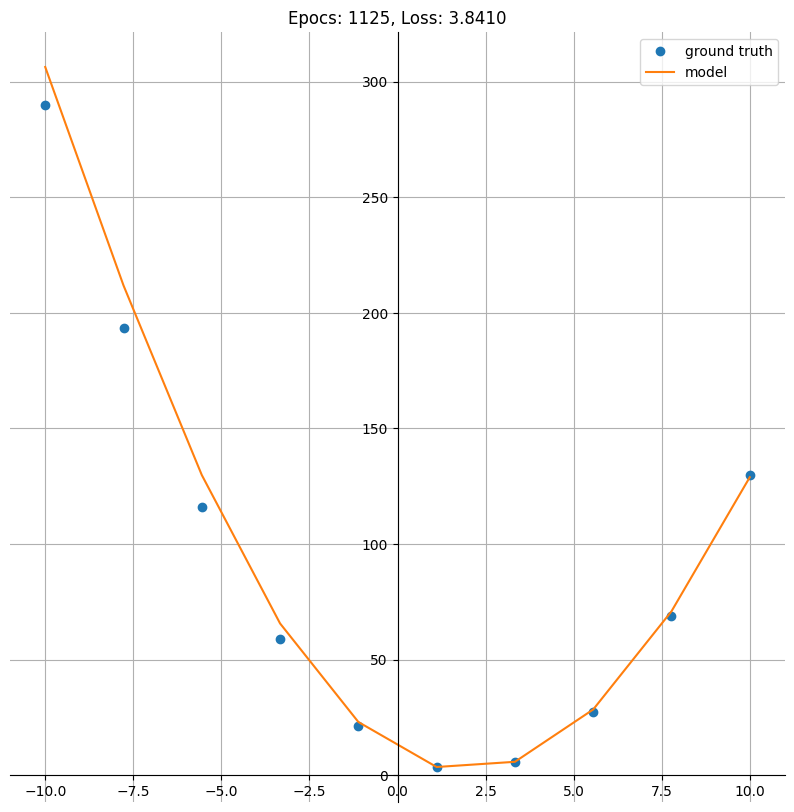

Epoch: 1150; Train Loss: 3.389772415161133


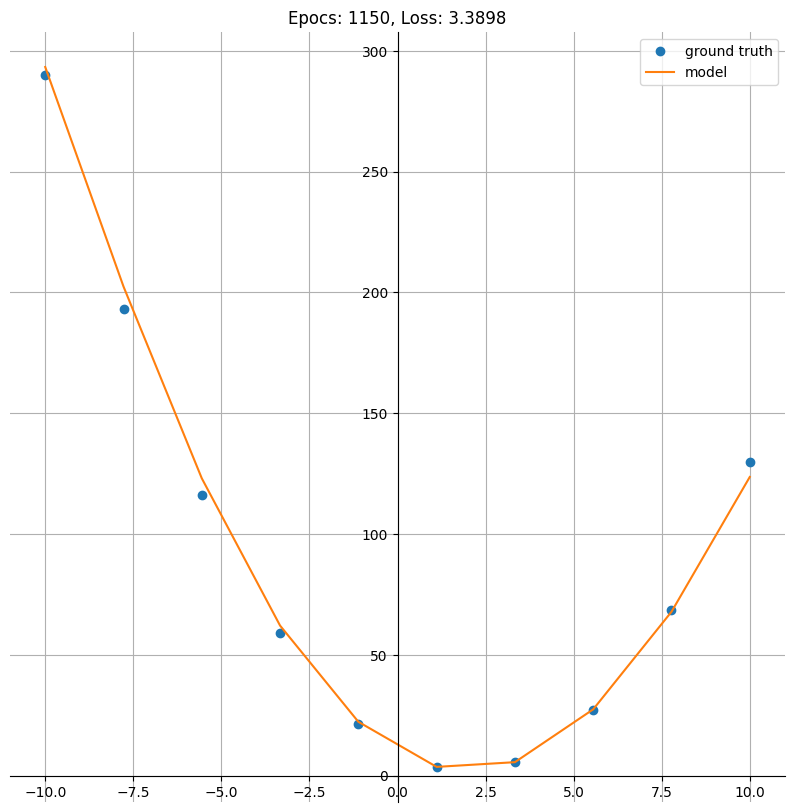

Epoch: 1175; Train Loss: 3.9844863414764404


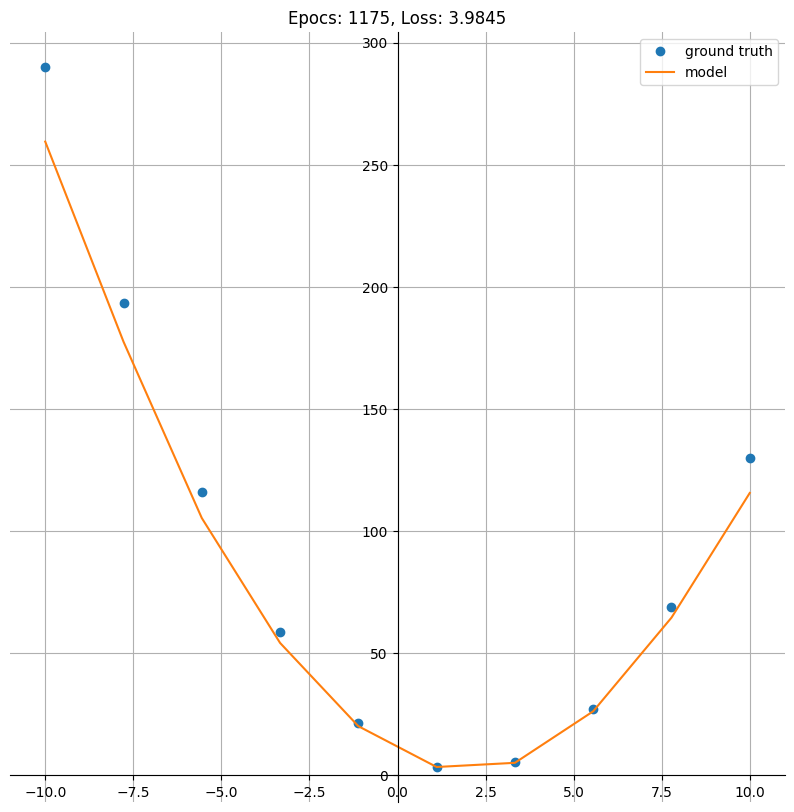

Epoch: 1200; Train Loss: 4.037564754486084


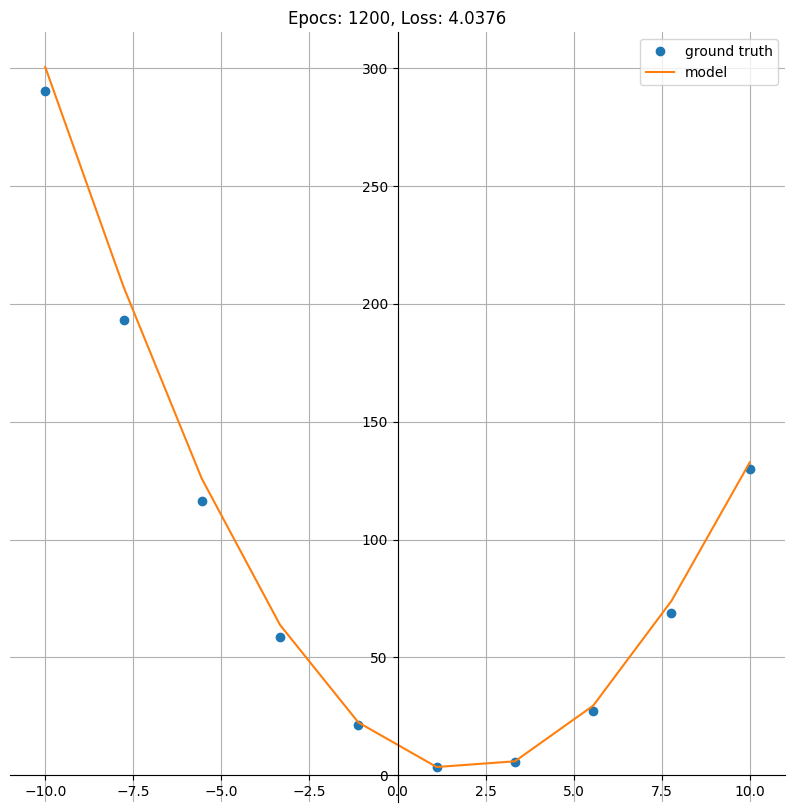

Epoch: 1225; Train Loss: 3.647218704223633


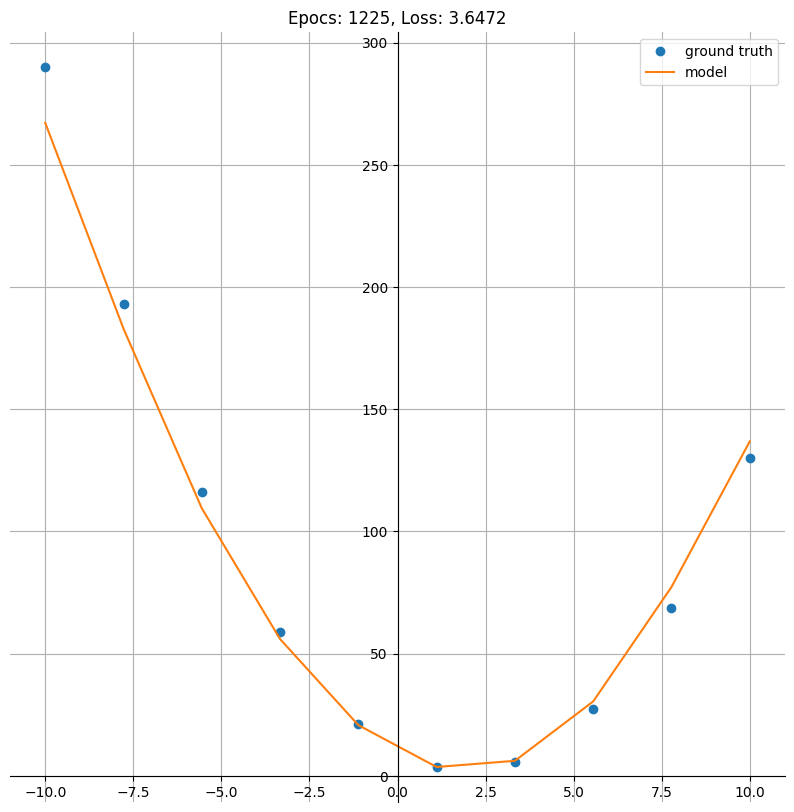

Epoch: 1250; Train Loss: 3.9871954917907715


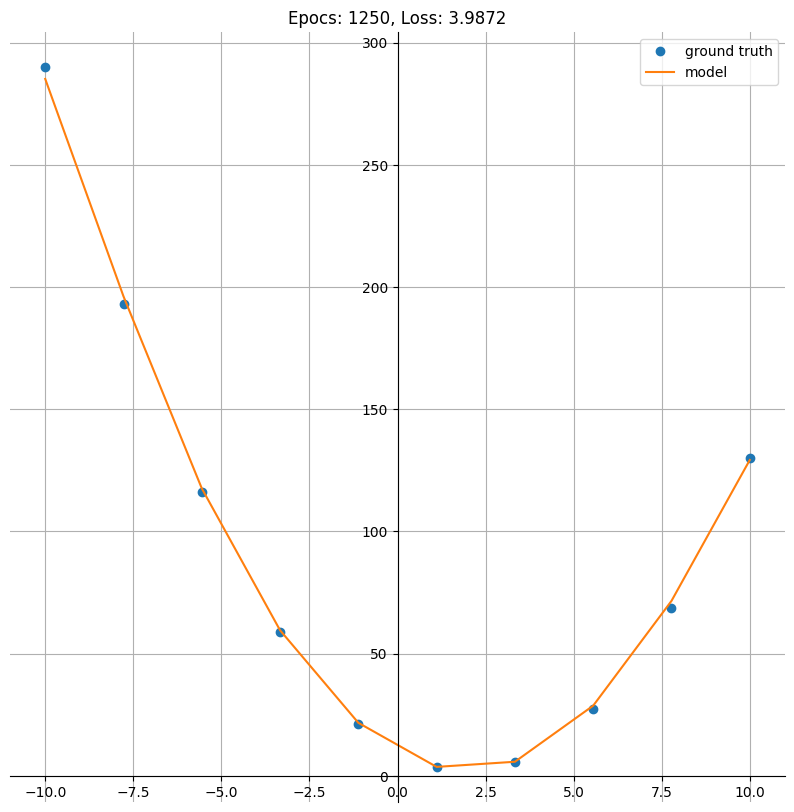

Epoch: 1275; Train Loss: 4.162233352661133


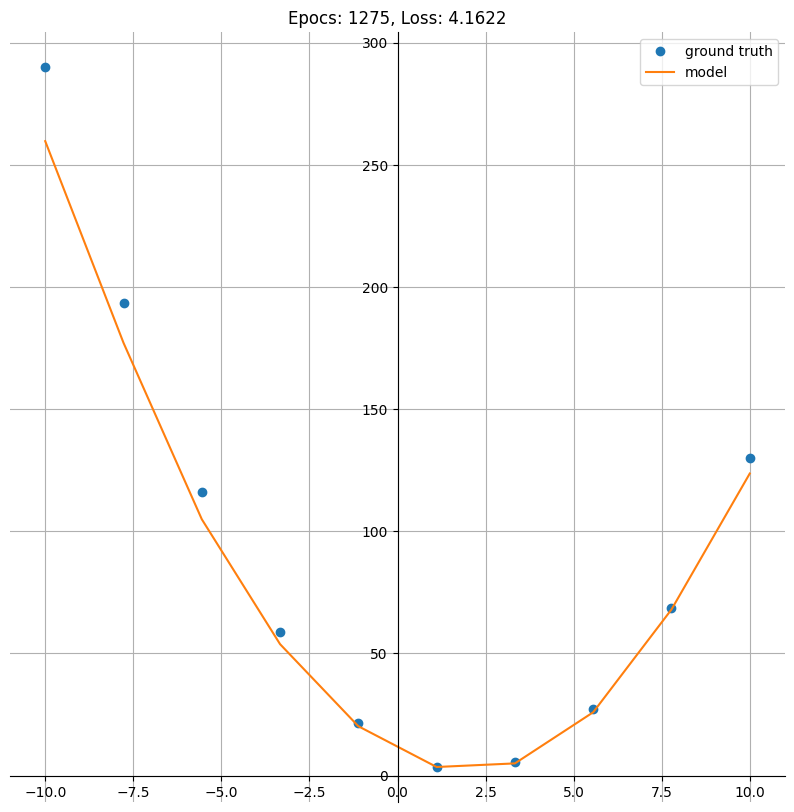

Epoch: 1300; Train Loss: 4.094585418701172


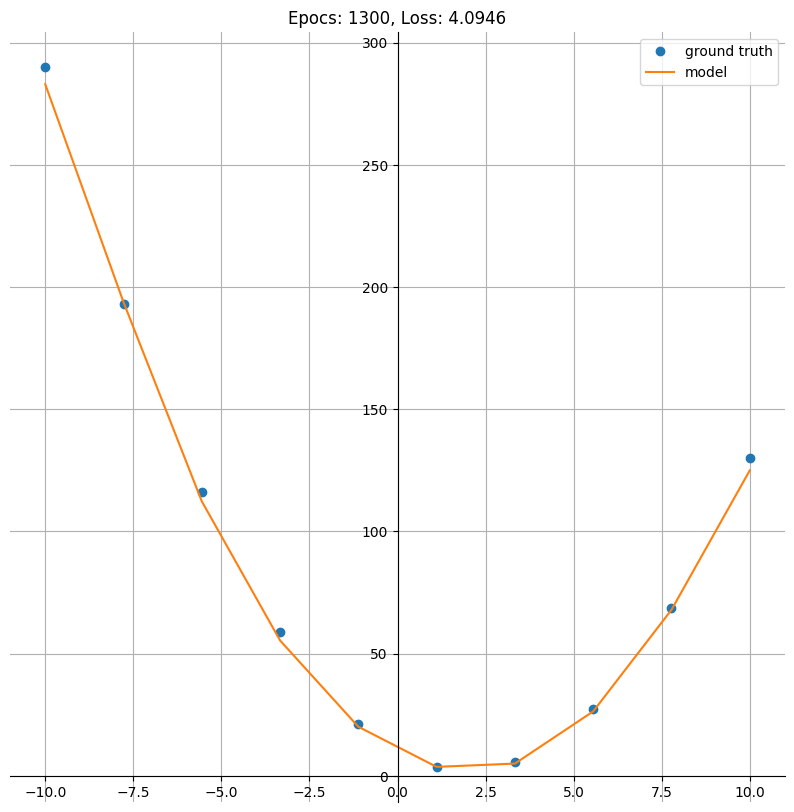

Epoch: 1325; Train Loss: 3.9911398887634277


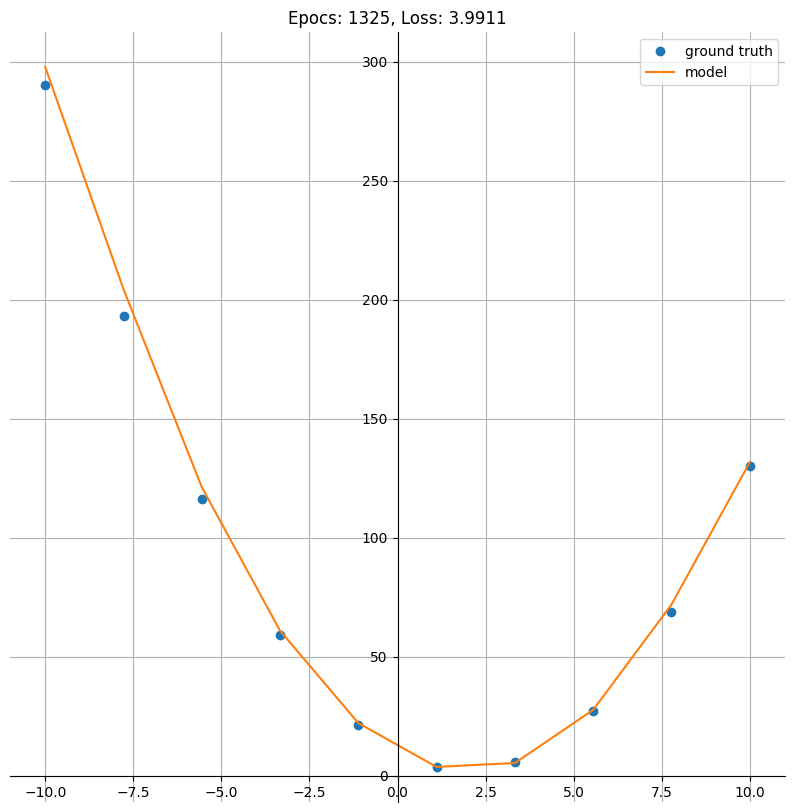

Epoch: 1350; Train Loss: 3.853320598602295


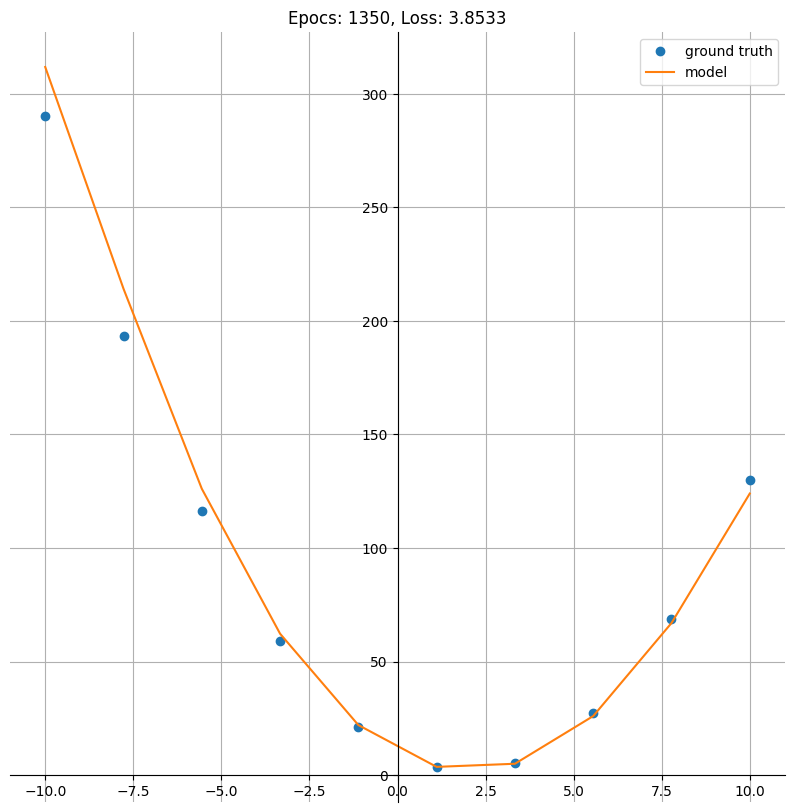

Epoch: 1375; Train Loss: 3.814725399017334


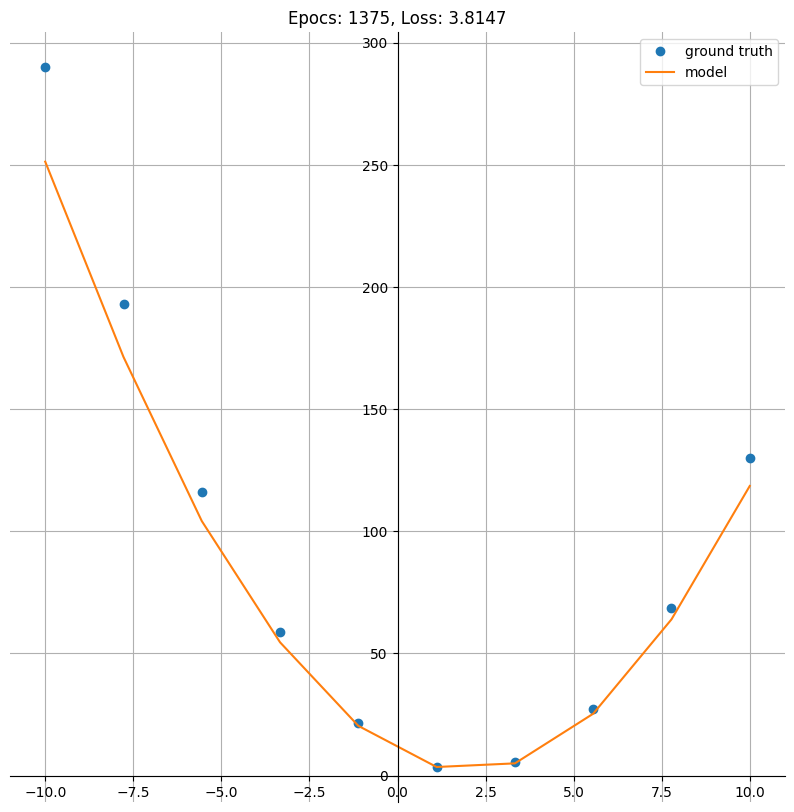

Epoch: 1400; Train Loss: 3.8109183311462402


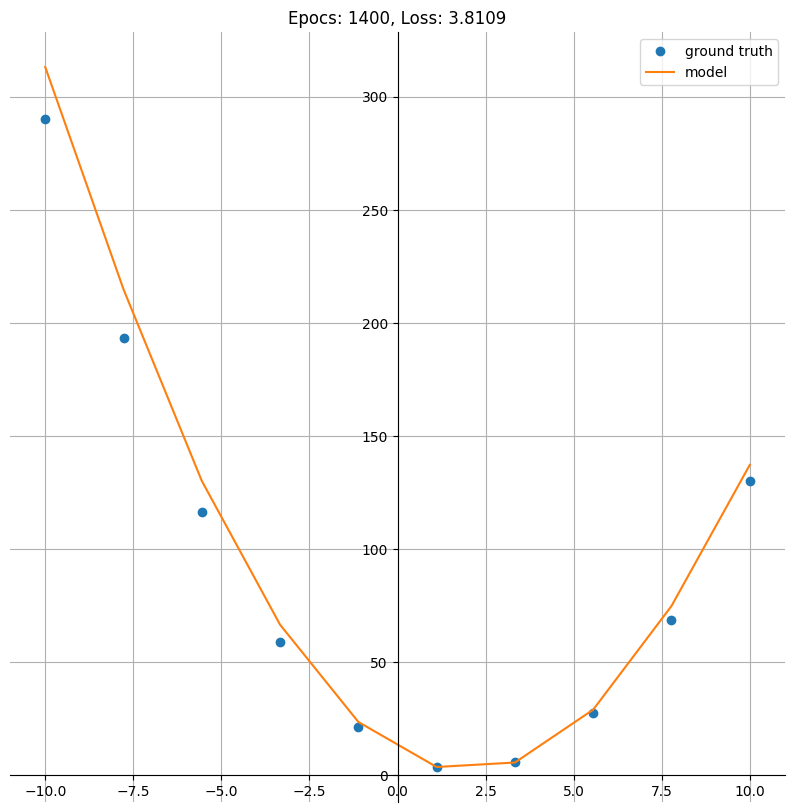

Epoch: 1425; Train Loss: 3.9102466106414795


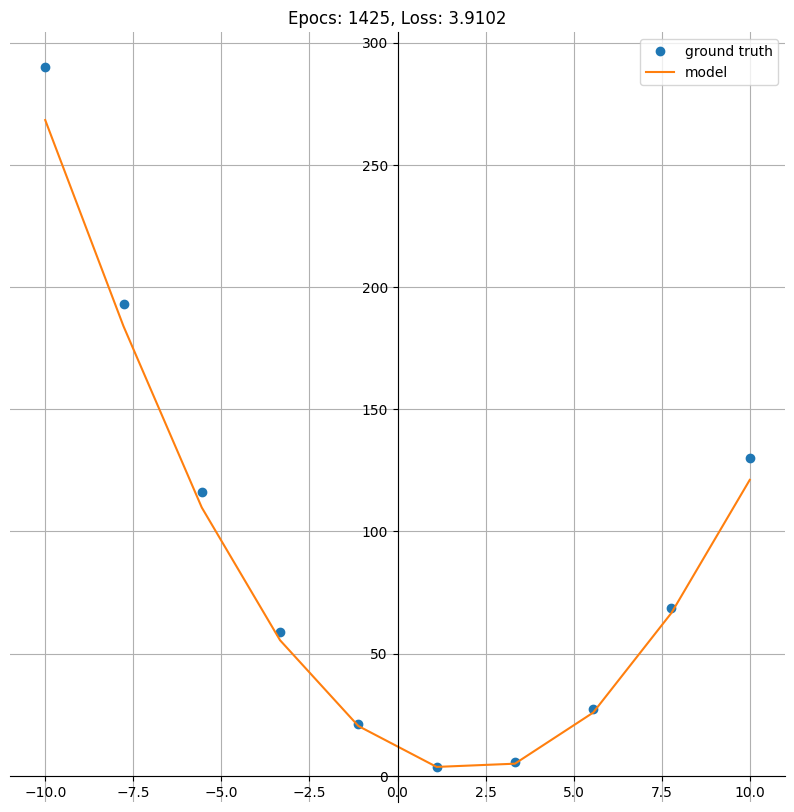

Epoch: 1450; Train Loss: 3.605191946029663


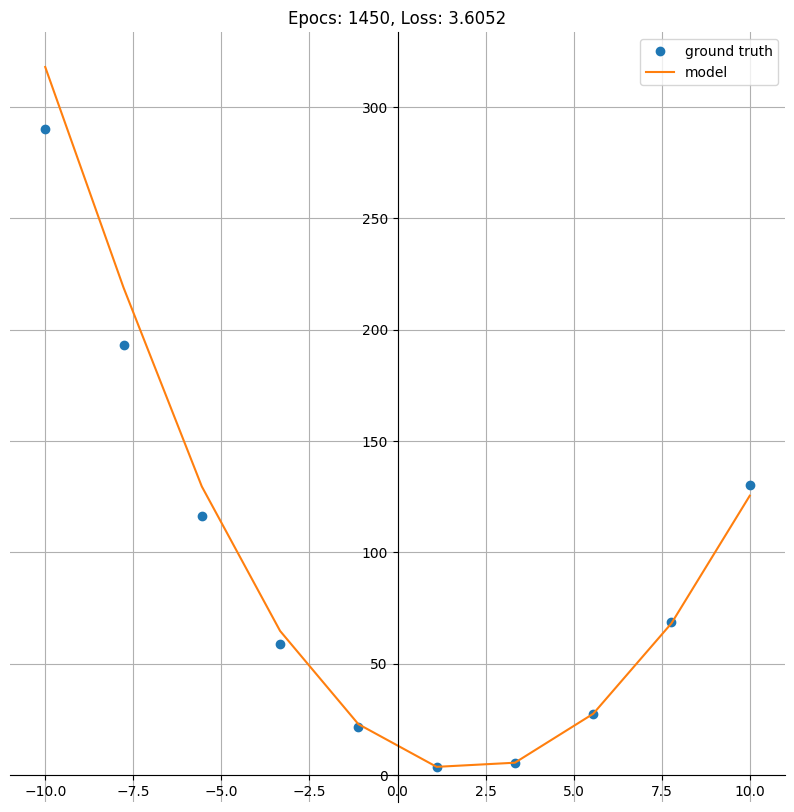

Epoch: 1475; Train Loss: 3.9412598609924316


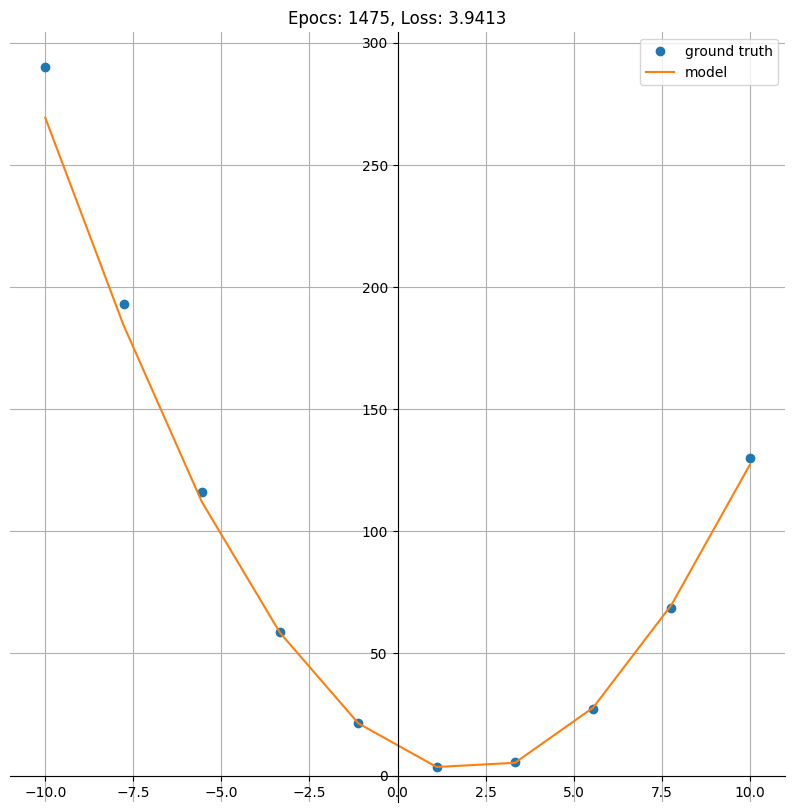

Epoch: 1500; Train Loss: 3.948296070098877


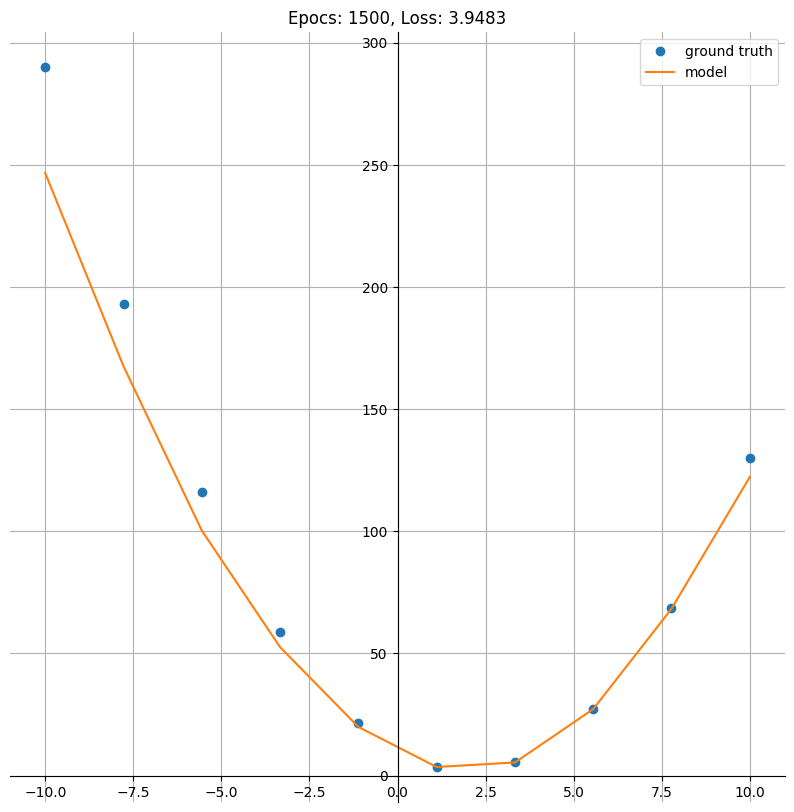

Epoch: 1525; Train Loss: 3.4895150661468506


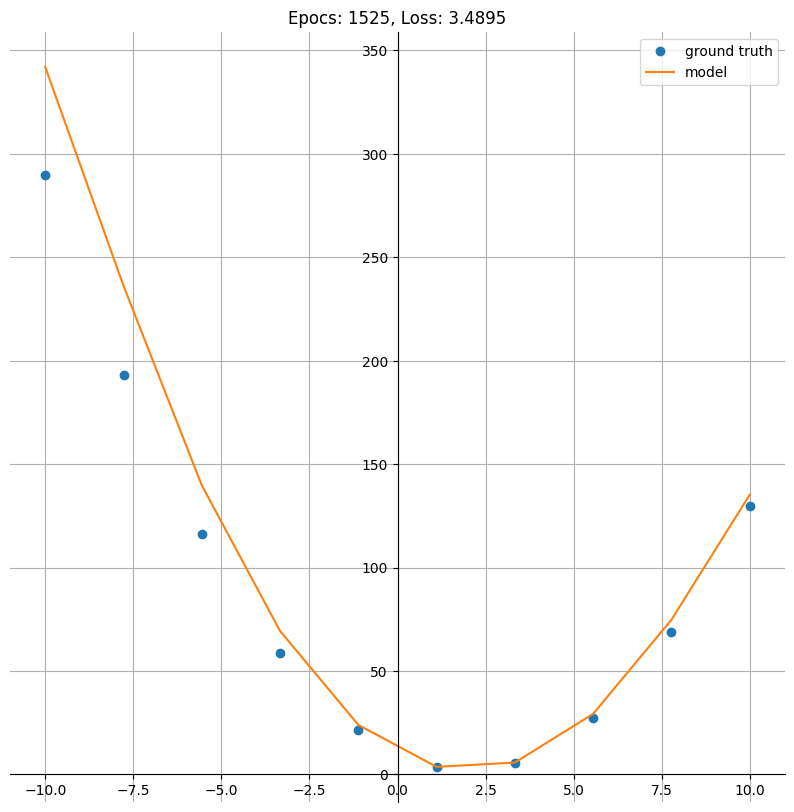

Epoch: 1550; Train Loss: 3.6797244548797607


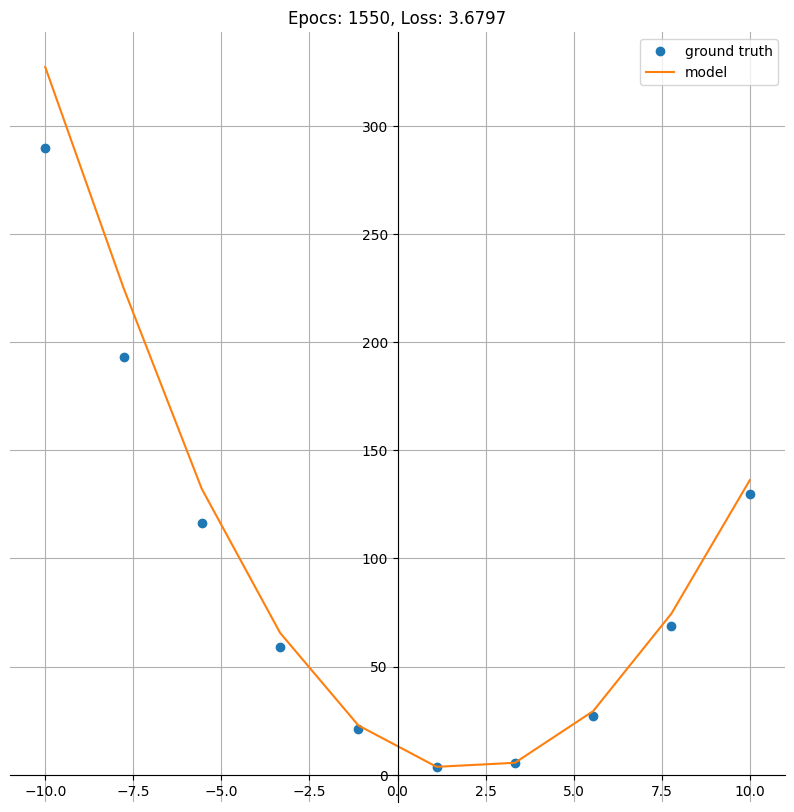

Epoch: 1575; Train Loss: 3.9732182025909424


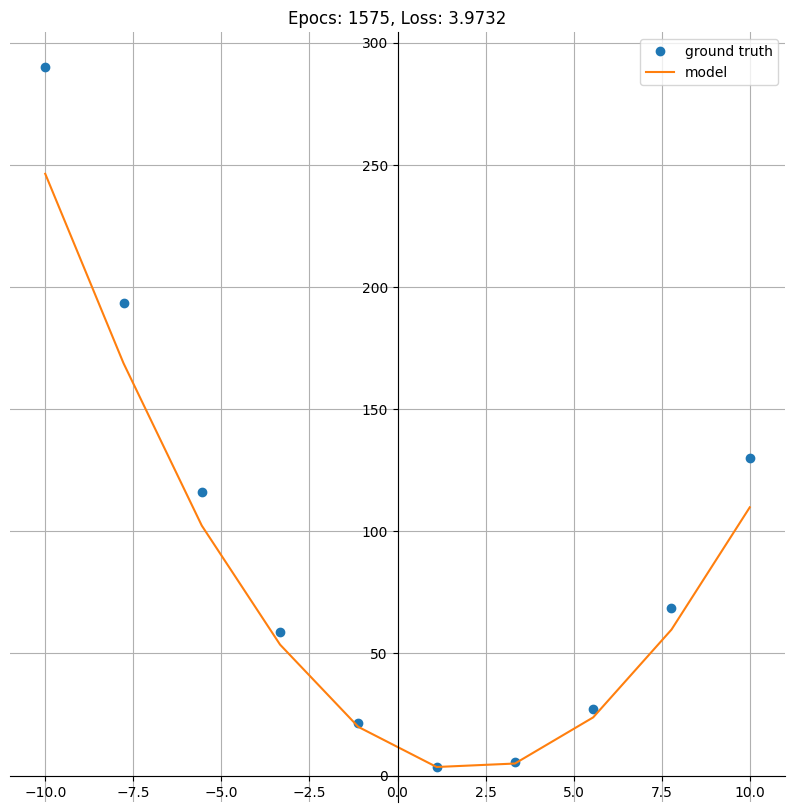

Epoch: 1600; Train Loss: 3.468381643295288


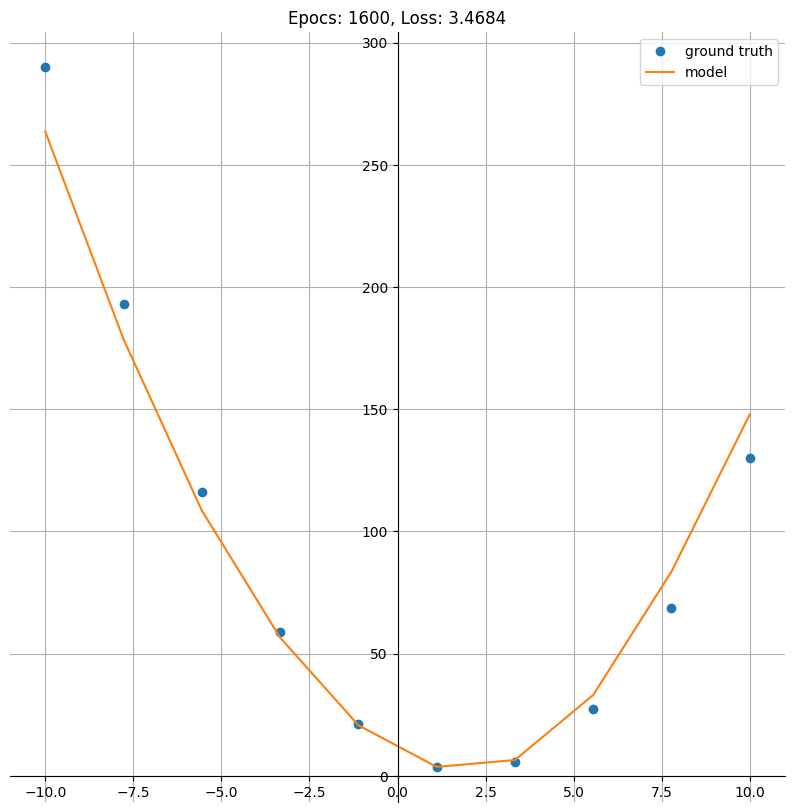

Epoch: 1625; Train Loss: 3.7053449153900146


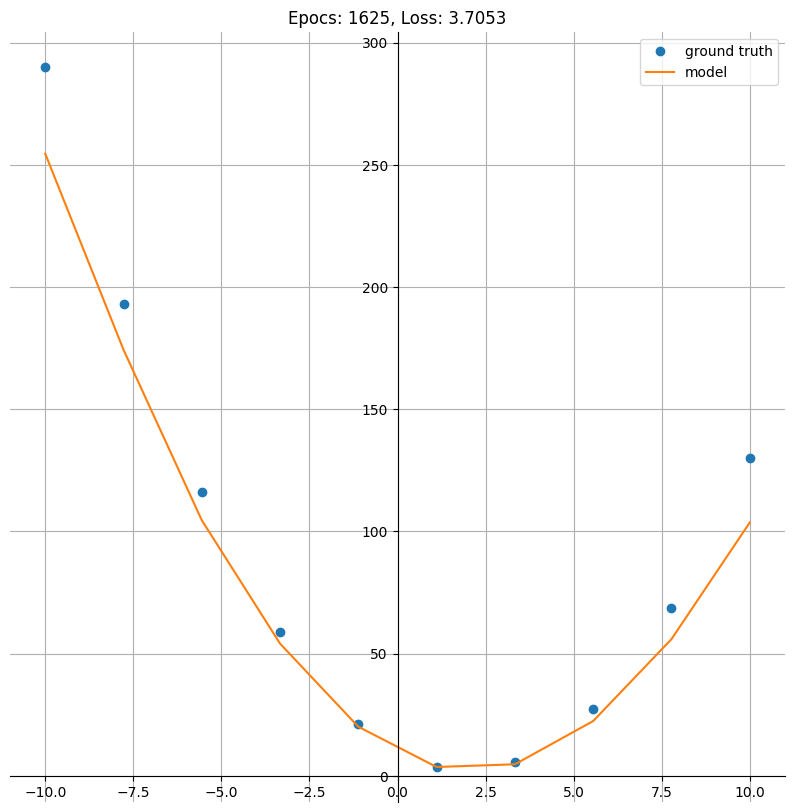

Epoch: 1650; Train Loss: 3.5920321941375732


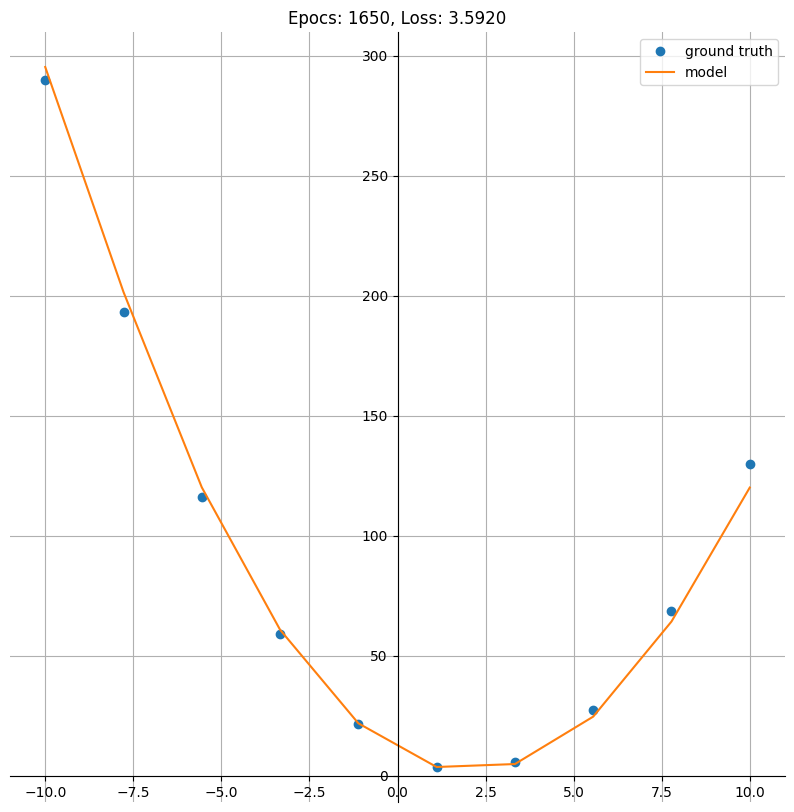

Epoch: 1675; Train Loss: 3.9700582027435303


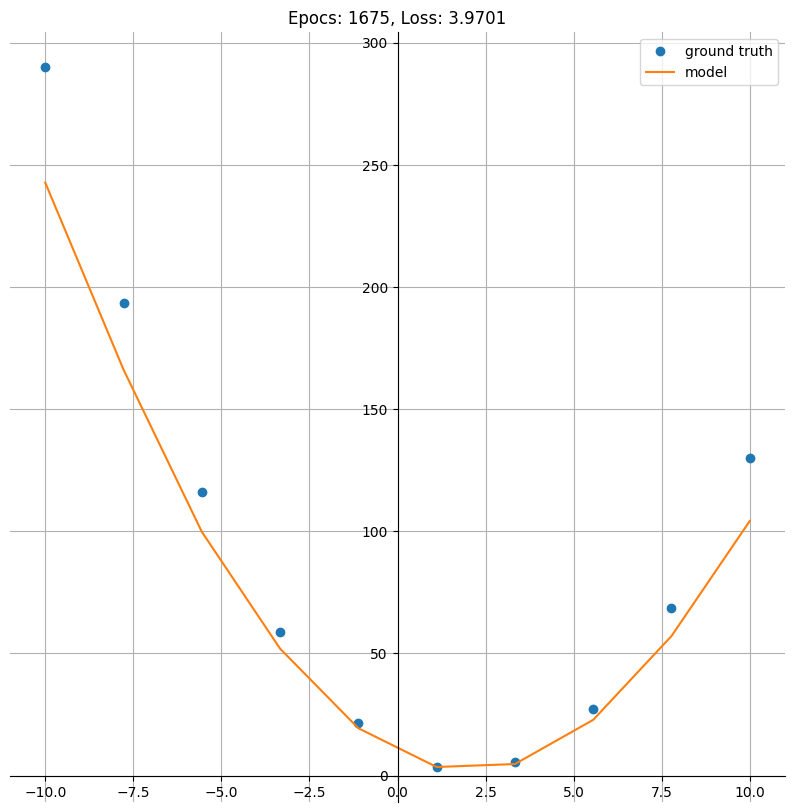

Epoch: 1700; Train Loss: 3.4645791053771973


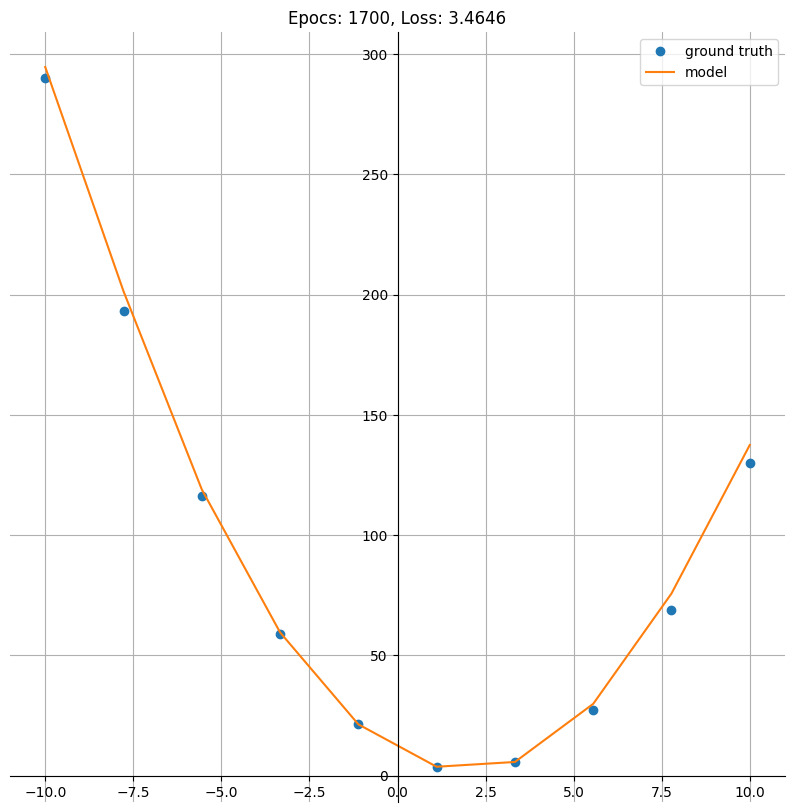

Epoch: 1725; Train Loss: 3.6485066413879395


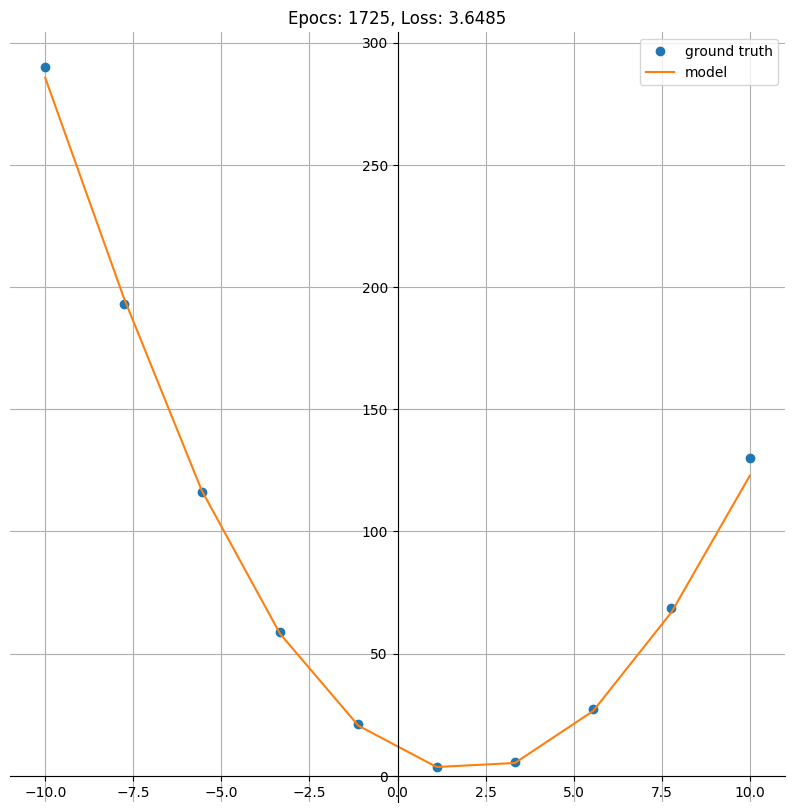

Epoch: 1750; Train Loss: 3.8663878440856934


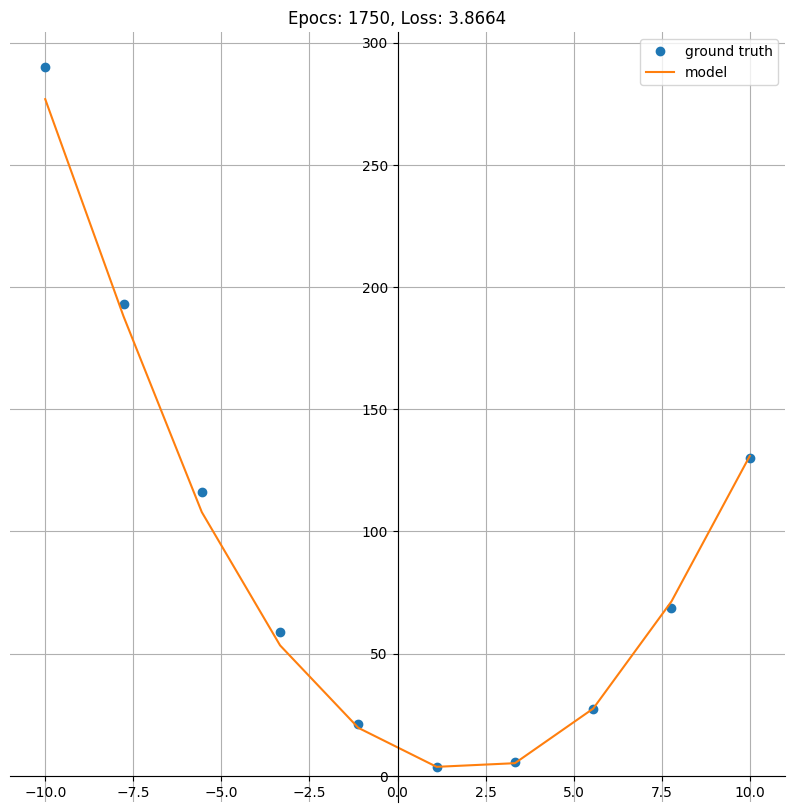

Epoch: 1775; Train Loss: 3.64353609085083


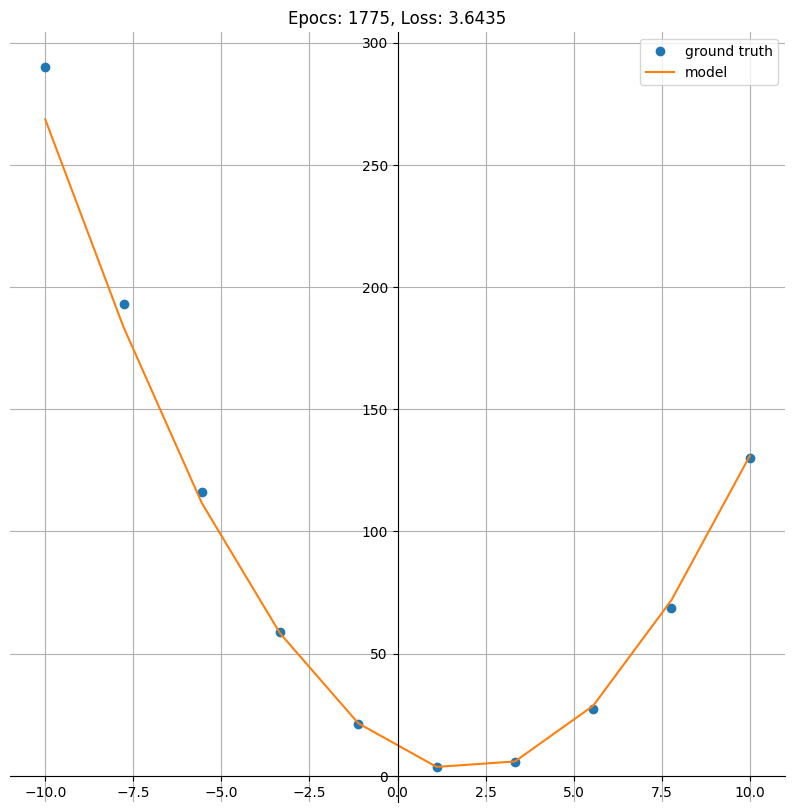

Epoch: 1800; Train Loss: 3.616334915161133


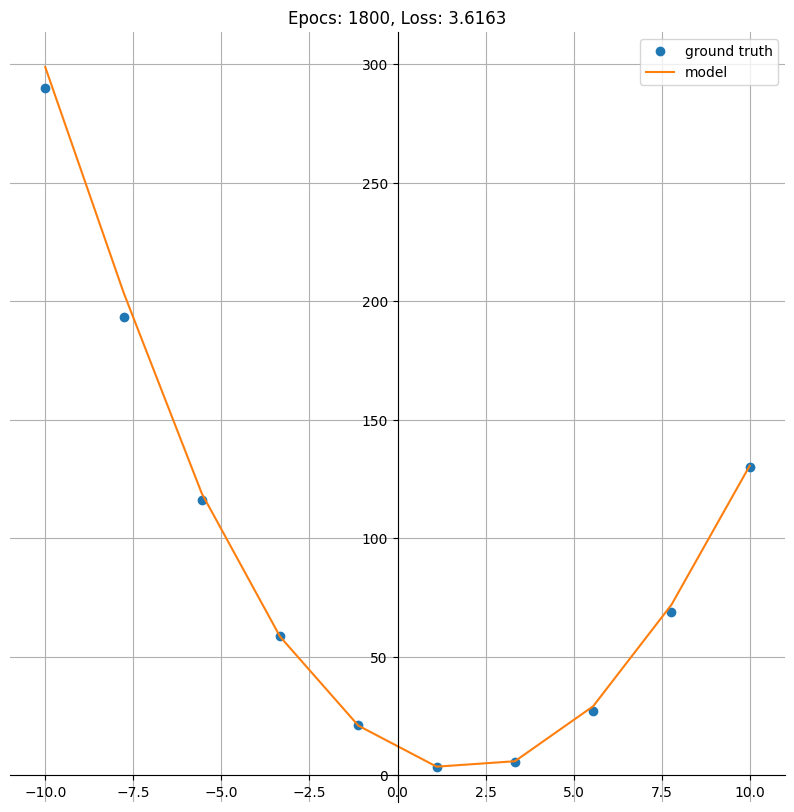

Epoch: 1825; Train Loss: 3.3089599609375


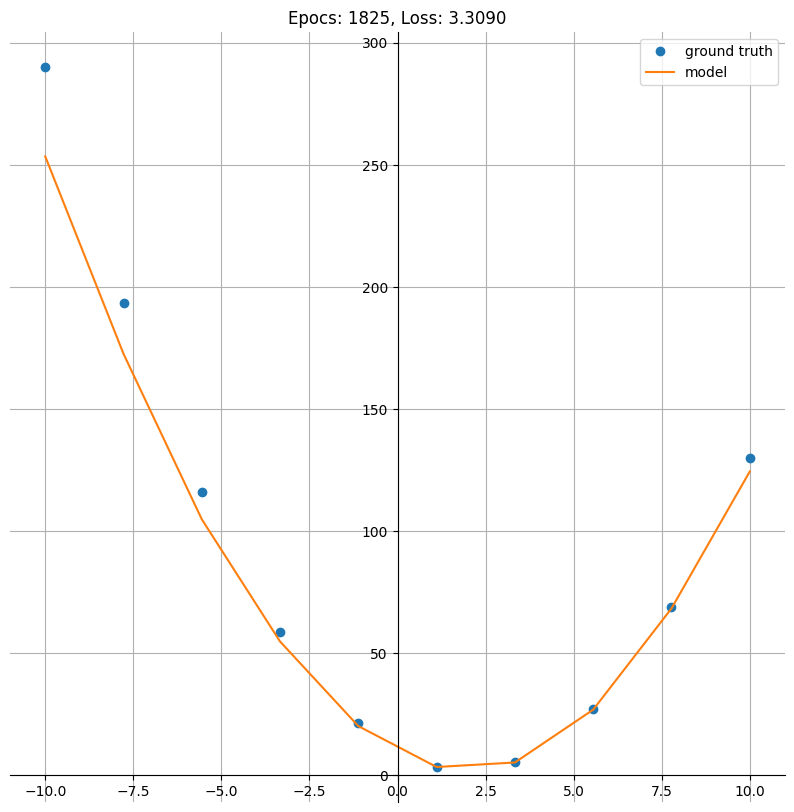

Epoch: 1850; Train Loss: 3.7119340896606445


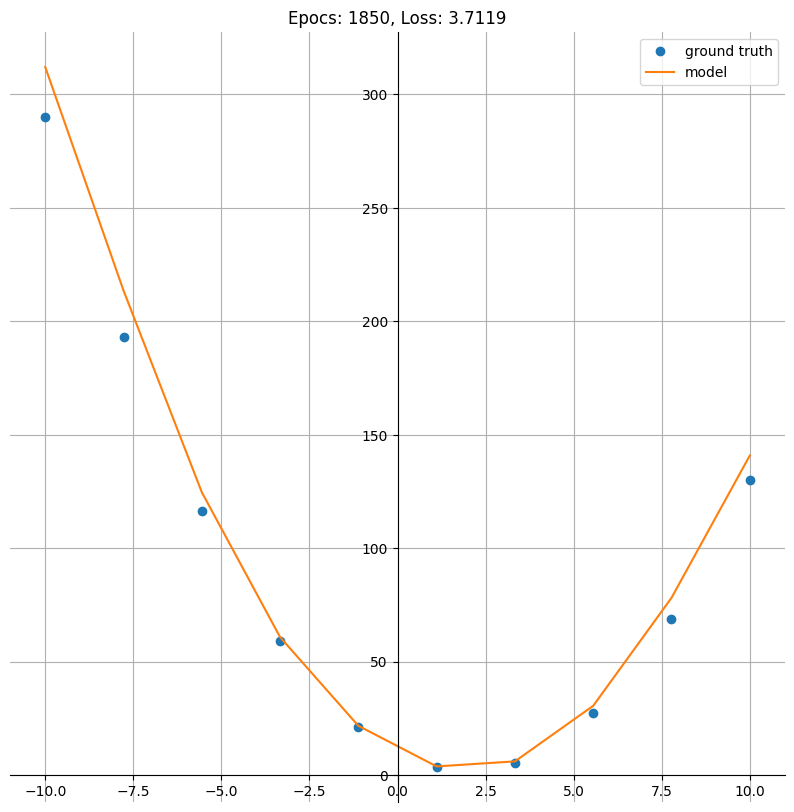

Epoch: 1875; Train Loss: 3.8059494495391846


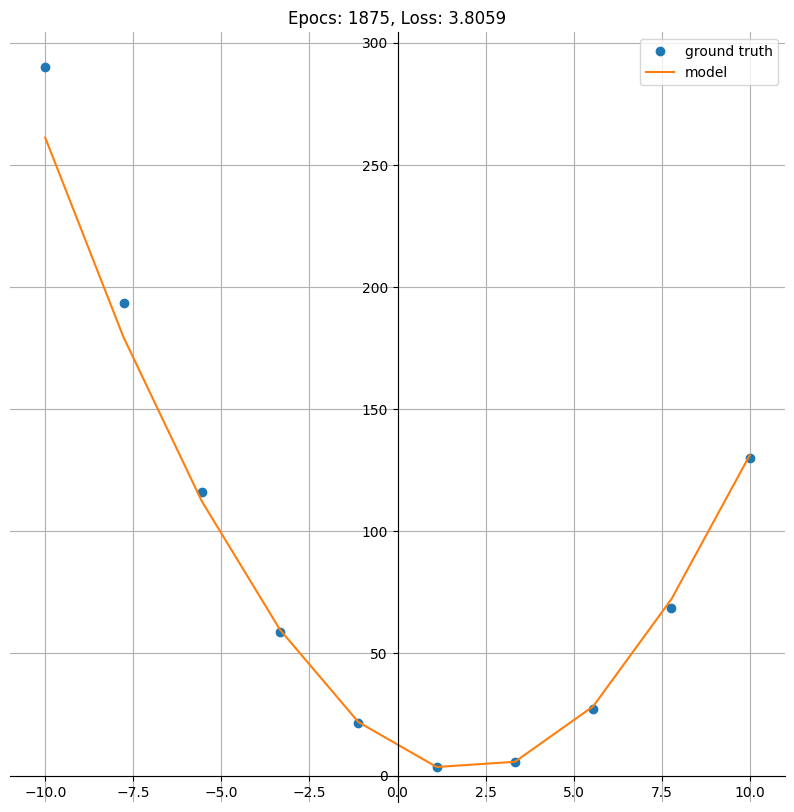

Epoch: 1900; Train Loss: 3.6362171173095703


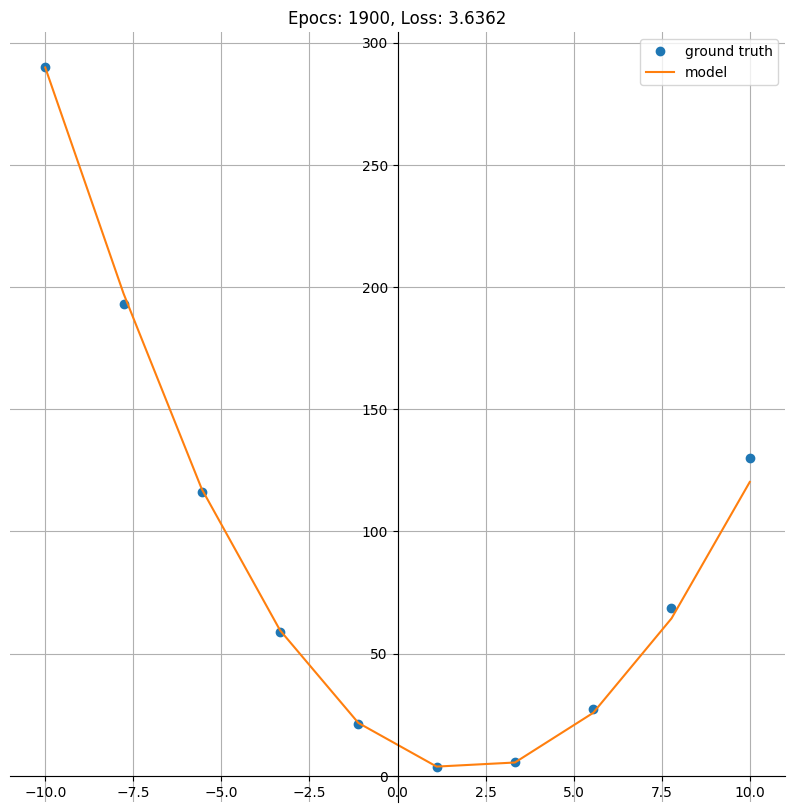

Epoch: 1925; Train Loss: 3.2519888877868652


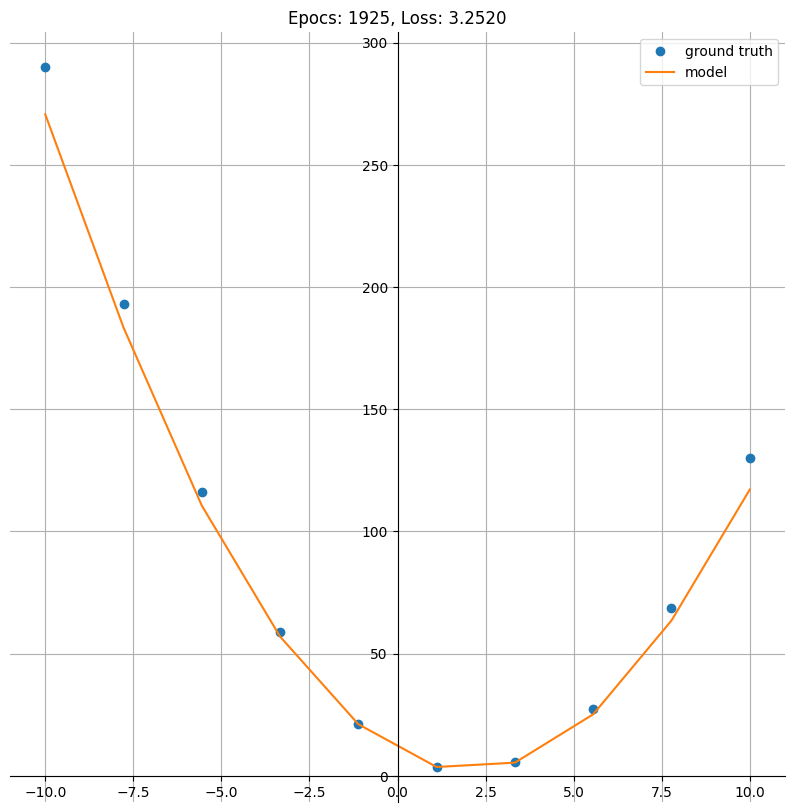

Epoch: 1950; Train Loss: 3.9146835803985596


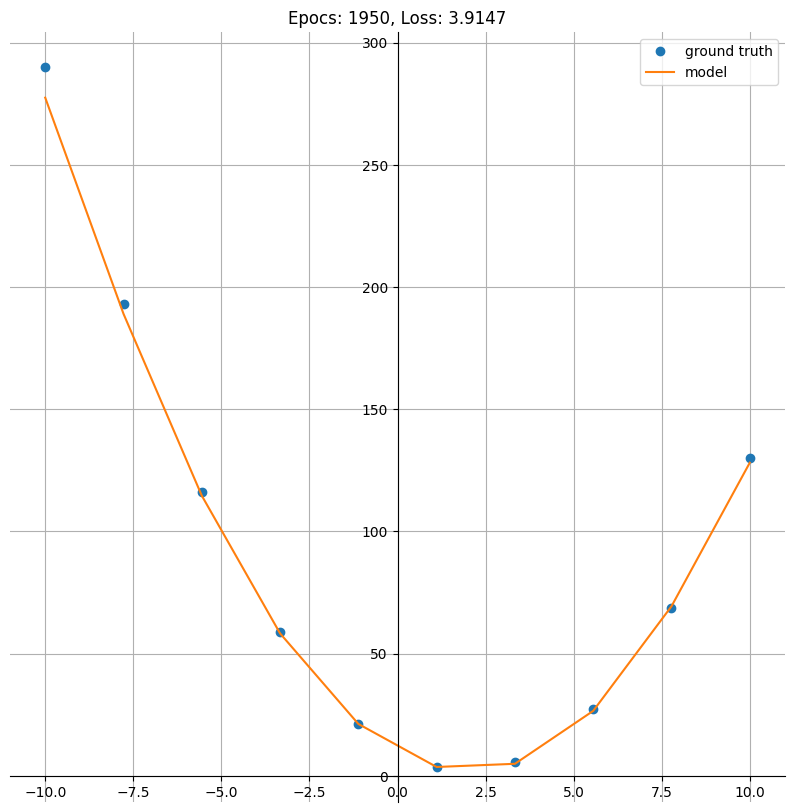

Epoch: 1975; Train Loss: 3.5544581413269043


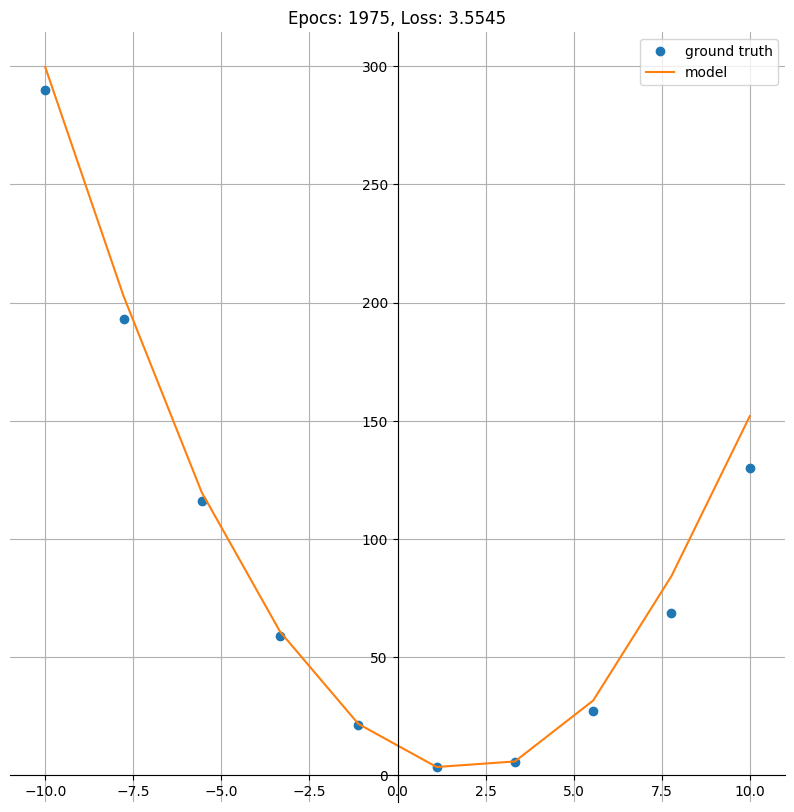

Epoch: 2000; Train Loss: 3.5523717403411865


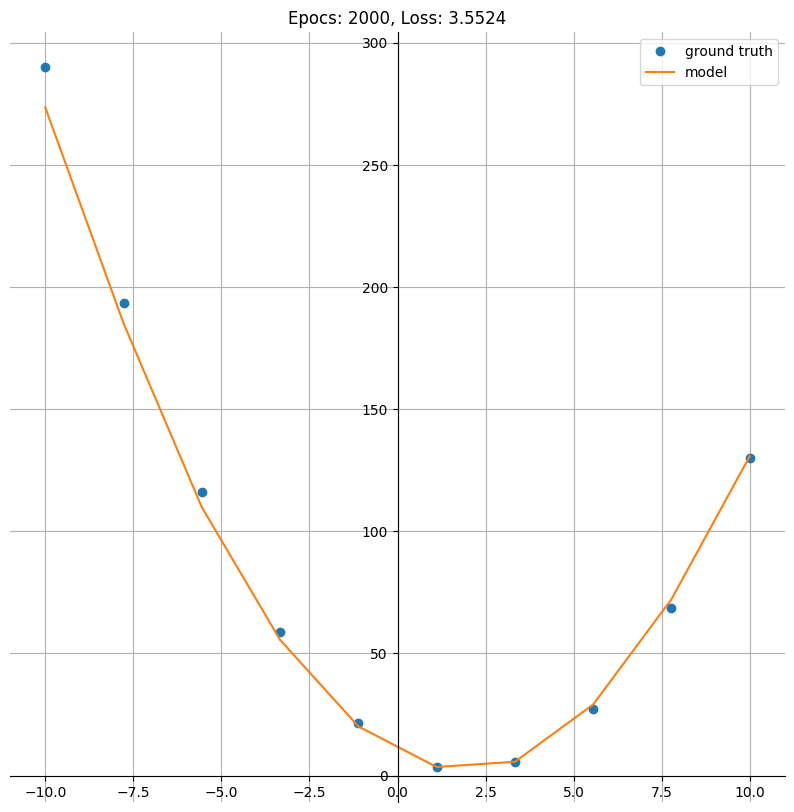

Test Loss: 3.404188871383667


In [57]:
epochs = 2001

# Let''s make a Gif of the training
filename_output = "./line_approximation_mlp_2.gif"
writer = imageio.get_writer(filename_output, mode='I', duration=0.3)

for t in range(epochs):
  train_loss = train(model, train_dataloader, lossfunc, optimizer)
  if t % 25 == 0:
    print(f"Epoch: {t}; Train Loss: {train_loss}")
    image = plot_comparison(line, model, epoc=t, loss=train_loss)
    # appending to gif
    writer.append_data(image)

test_loss = test(model, test_dataloader, lossfunc)
print(f"Test Loss: {test_loss}")
writer.close()

The new neural network architecture performed really well, but did not perform better then the previous architecture, since with the same training epochs, learning rate and loss function it still obtained slightly bigger test loss means in the last epochs than the ones obtained in experiment 3. this serves to ilustrate that not always more layers and neurons translates to better performance.

# **Observations:**
The main learned ideas with the assignment are shown in the bullet points bellow:

* A single neuron perceptron with one neuron is cappable of learning the behavior of a linear function and of mimicing the behavior of an AND and OR logic gates when the inputs are non fuzzy.

* A single neuron perceptron divides the sample hyperplane linearly in two parts, classifying observations in regard to which part it is located.

* A perceptron can learn until conversion even when the learning rule is not exactly the gradient descent, as shown in task one, where the activation function was not even differentiable.

* Neural networks that were trained with few observations are very sensitive to parameters initial conditions, as shown in the AND/OR logic gate task.

* Training a neural network with a well decided batch size can improve training performance and prevent overffiting.

* Single neuron linear perceptrons are not capable of learning polinomial functions of arbitrary order, but MLPs are.

* A deep neural networks not always surpasses the performance of a shallow network in the learning task.

* Some loss functions are extremely inadequate for some learning problems and prevent the neural network of even learning any pattern deppending of the circunstances.

* A well defined smaller learning rate can be used to obtain fine tunning in the training task, but it also makes the learning task slower.

* Not all learning tasks are better tackled with neural networks. In the logic gate task, a simple logic rule would be enough to emulate their behavior. On the other hand, there is a lot to be learned about neural network behavior by trying to solve these simple problems with them.

* Neural networks can represent arbitrarily complex functions if its architecture is well suited for the learning task.